In [7]:
import torch
import torch.nn as nn
from tqdm import tqdm

import torchvision.datasets as dset
import torchvision.transforms as transforms
import torch.utils.data as data_utils

import matplotlib.pyplot as plt

# DATA

In [8]:
trans = transforms.Compose([
            transforms.Resize(32),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

train_data = dset.CIFAR10(root="../data", download=True, transform=trans)
train_loader = data_utils.DataLoader(train_data, batch_size=64, shuffle=True, drop_last=True)

Files already downloaded and verified


# MODEL

In [9]:
class Generator(torch.nn.Module):
    def __init__(self, channels):
        super().__init__()
        # Filters [1024, 512, 256]
        # Input_dim = 100
        # Output_dim = C (number of channels)
        self.main_module = nn.Sequential(
            # Z latent vector 100
            nn.ConvTranspose2d(in_channels=100, out_channels=1024, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(num_features=1024),
            nn.ReLU(True),

            # State (1024x4x4)
            nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(True),

            # State (512x8x8)
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(True),

            # State (256x16x16)
            nn.ConvTranspose2d(in_channels=256, out_channels=channels, kernel_size=4, stride=2, padding=1))
            # output of main module --> Image (Cx32x32)

        self.output = nn.Tanh()
    
    def forward(self, x):
        x = self.main_module(x)
        return self.output(x)

In [10]:
class Discriminator(torch.nn.Module):
    def __init__(self, channels):
        super().__init__()
        # Filters [256, 512, 1024]
        # Input_dim = channels (Cx64x64)
        # Output_dim = 1
        self.main_module = nn.Sequential(
            # Image (Cx32x32)
            nn.Conv2d(in_channels=channels, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.LeakyReLU(0.2, inplace=True),

            # State (256x16x16)
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.LeakyReLU(0.2, inplace=True),

            # State (512x8x8)
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=1024),
            nn.LeakyReLU(0.2, inplace=True))
            # output of main module --> State (1024x4x4)

        self.output = nn.Sequential(
            # The output of D is no longer a probability, we do not apply sigmoid at the output of D.
            nn.Conv2d(in_channels=1024, out_channels=1, kernel_size=4, stride=1, padding=0))
        
    def forward(self, x):
        x = self.main_module(x)
        return self.output(x)

In [13]:
import torch.nn as nn
import torch.optim as optim

class WGAN():
    def __init__(self, Device="cuda", channels=3):
        self.device = Device
        
        self.learning_rate = 0.00005
        self.weight_cliping = 0.01
        
        self.G = Generator(channels).to(self.device)
        self.D = Discriminator(channels).to(self.device)
        self.C = channels
        
        self.d_optimizer = torch.optim.RMSprop(self.D.parameters(), lr=self.learning_rate)
        self.g_optimizer = torch.optim.RMSprop(self.G.parameters(), lr=self.learning_rate)
        
    def infinite_batches(self, data_loader):
        while True:
            for i, (images, _) in enumerate(data_loader):
                yield images
        
    def train(self, train_loader, critic_iter=5, generator_iters=100):
        # 무한 배치 만들기
        data = self.infinite_batches(train_loader)

        one = torch.tensor(1.0, device=self.device)
        mone = torch.tensor(-1.0, device=self.device)

        for g_iter in tqdm(range(generator_iters)):
            self.D.train()
            for d_iter in range(critic_iter):
                self.D.zero_grad()

                # clipping
                for p in self.D.parameters():
                    p.data.clamp_(-self.weight_cliping, self.weight_cliping)

                images = next(data).to(self.device)
                batch_size = images.shape[0]
                z = torch.rand((batch_size, 100, 1, 1)).to(self.device)

                # Train discriminator
                # Train with real images
                d_loss_real = self.D(images)
                d_loss_real = d_loss_real.mean()
                d_loss_real.backward(one)

                # Train with fake images
                z = torch.rand((batch_size, 100, 1, 1)).to(self.device)
                fake_images = self.G(z)
                d_loss_fake = self.D(fake_images)
                d_loss_fake = d_loss_fake.mean()
                d_loss_fake.backward(mone)

                d_loss = d_loss_fake - d_loss_real
                Wasserstein_D = d_loss_real - d_loss_fake
                self.d_optimizer.step()

            # Train generator
            self.D.eval()
            self.G.zero_grad()
            # Compute loss with fake images
            z = torch.randn(batch_size, 100, 1, 1).to(self.device)
            fake_images = self.G(z)
            g_loss = self.D(fake_images)
            g_loss = g_loss.mean()
            g_loss.backward(one)
            g_cost = -g_loss
            self.g_optimizer.step()
            
    def generate(self):
        self.G.eval()
        z = torch.rand((1, 100, 1, 1)).to(self.device)
        image = self.G(z)
        img = image.reshape(self.C, 32, 32)
        img = img.permute(1, 2, 0).detach().cpu().numpy()
        return img



Epoch 1/1000


100%|██████████| 100/100 [00:17<00:00,  5.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


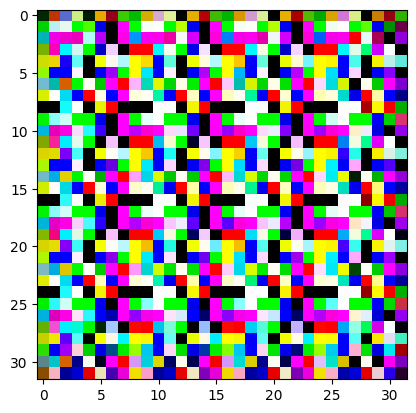

Epoch 2/1000


100%|██████████| 100/100 [00:17<00:00,  5.81it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


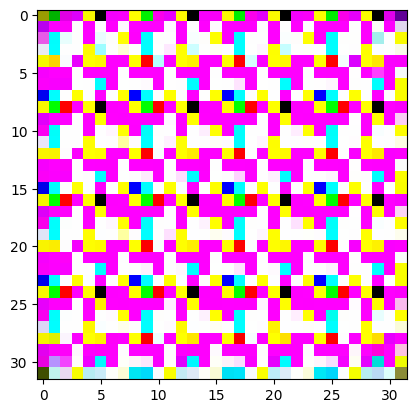

Epoch 3/1000


100%|██████████| 100/100 [00:17<00:00,  5.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


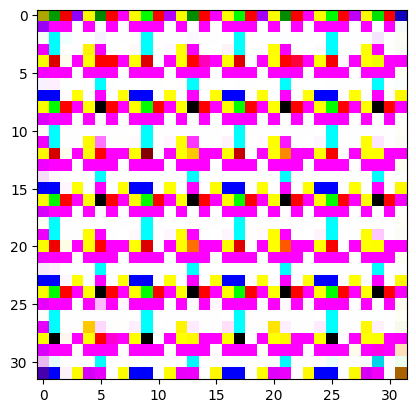

Epoch 4/1000


100%|██████████| 100/100 [00:17<00:00,  5.78it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


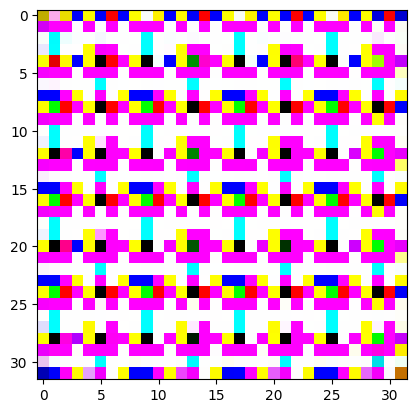

Epoch 5/1000


100%|██████████| 100/100 [00:17<00:00,  5.78it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


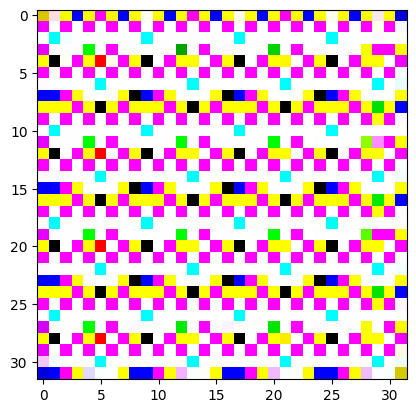

Epoch 6/1000


100%|██████████| 100/100 [00:17<00:00,  5.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


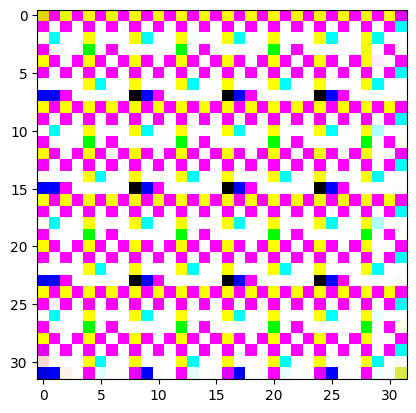

Epoch 7/1000


100%|██████████| 100/100 [00:17<00:00,  5.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


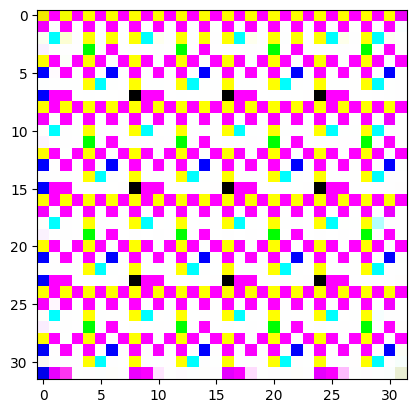

Epoch 8/1000


100%|██████████| 100/100 [00:17<00:00,  5.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


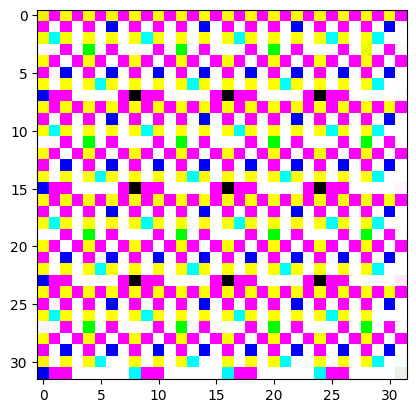

Epoch 9/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


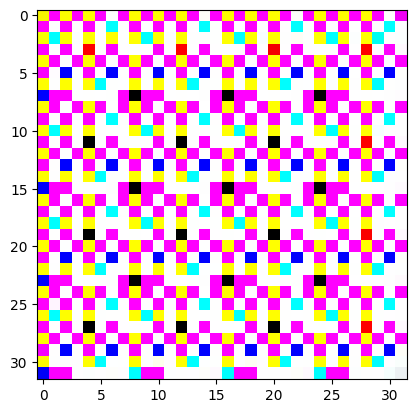

Epoch 10/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


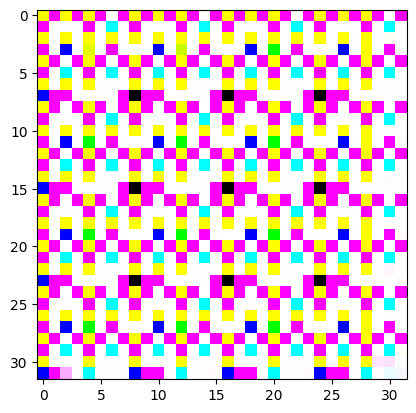

Epoch 11/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


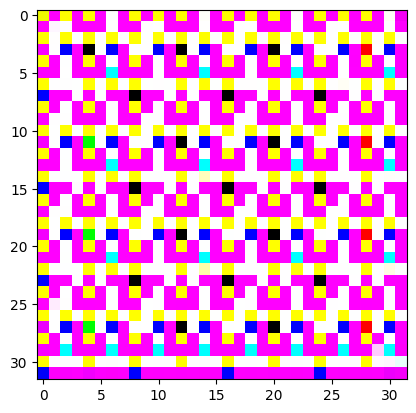

Epoch 12/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


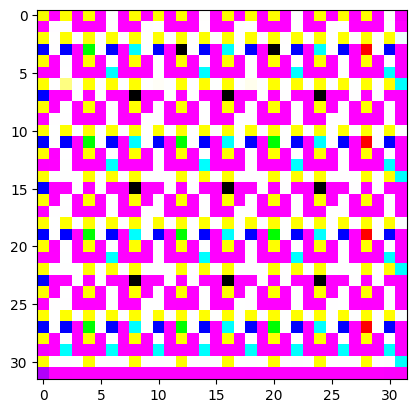

Epoch 13/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


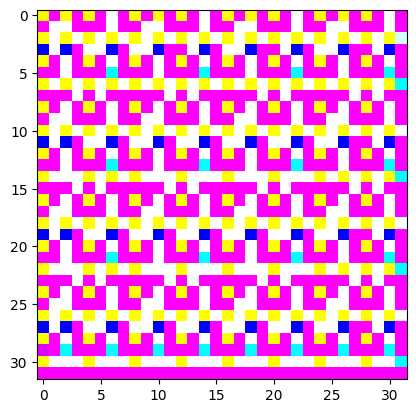

Epoch 14/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


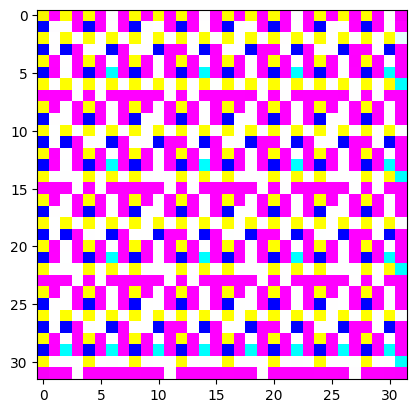

Epoch 15/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


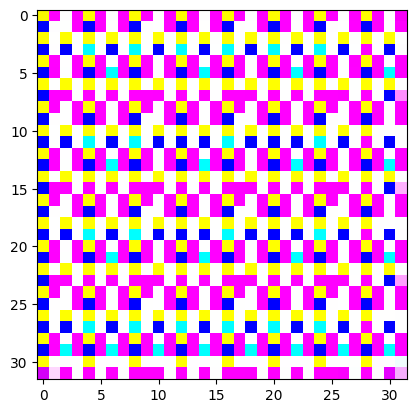

Epoch 16/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


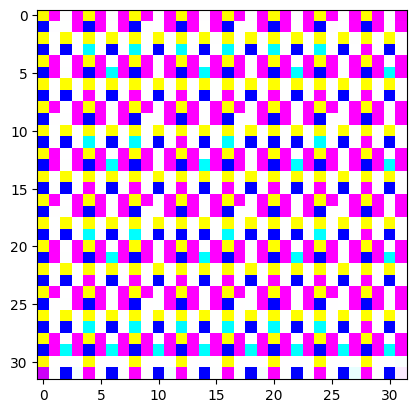

Epoch 17/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


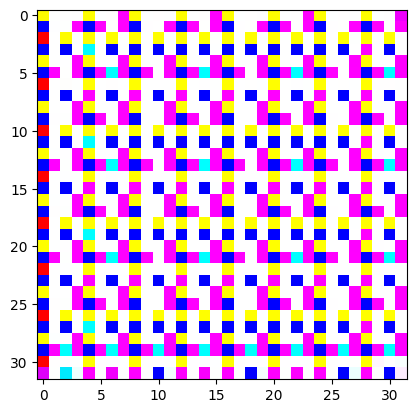

Epoch 18/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


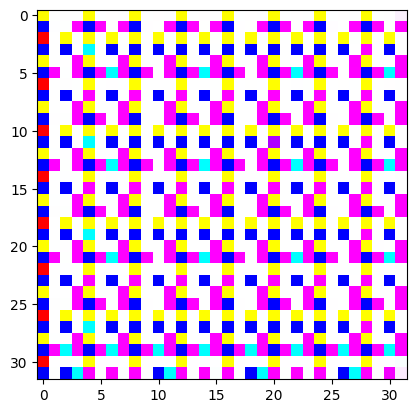

Epoch 19/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


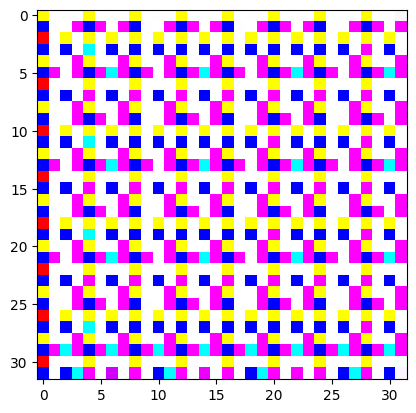

Epoch 20/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


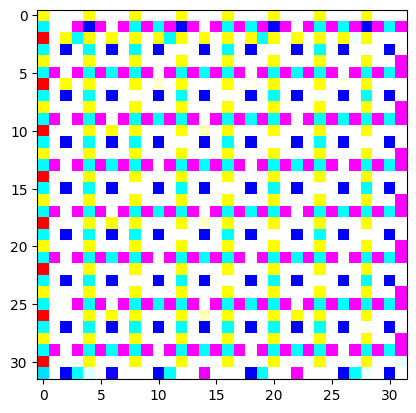

Epoch 21/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


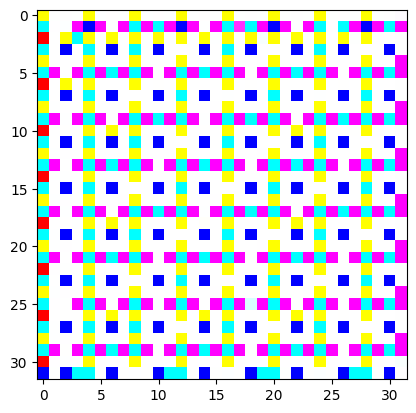

Epoch 22/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


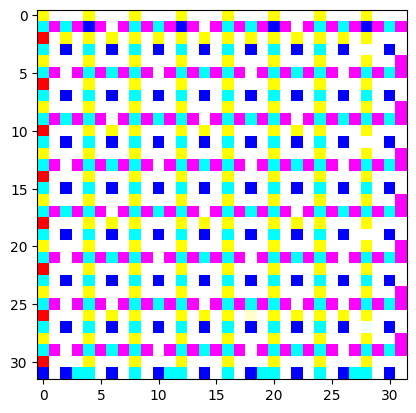

Epoch 23/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


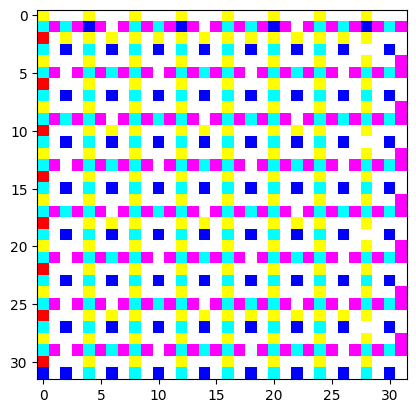

Epoch 24/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


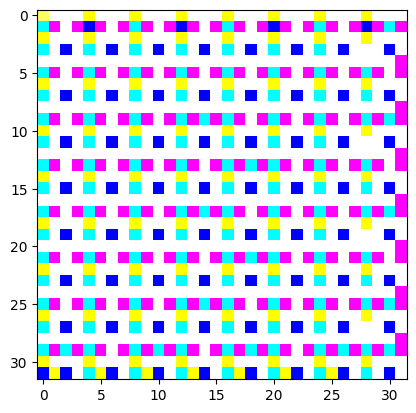

Epoch 25/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


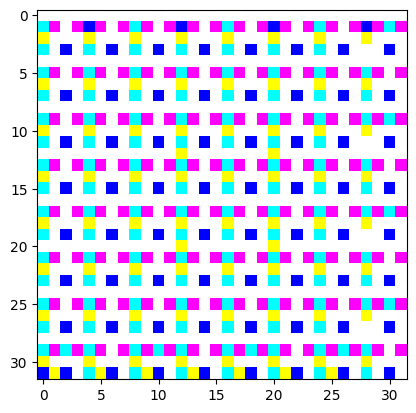

Epoch 26/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


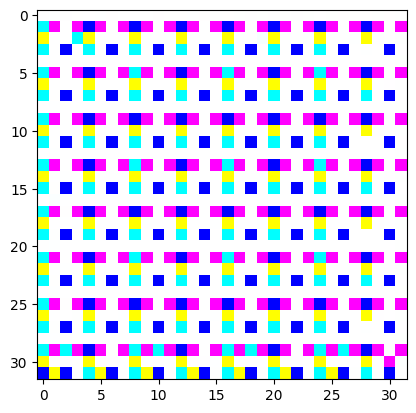

Epoch 27/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


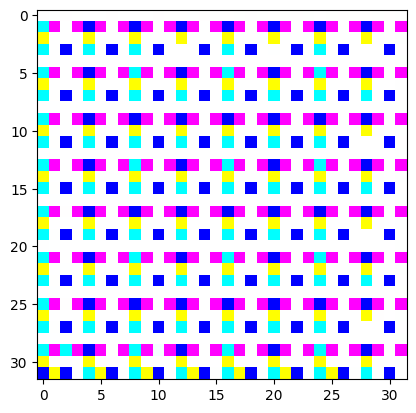

Epoch 28/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


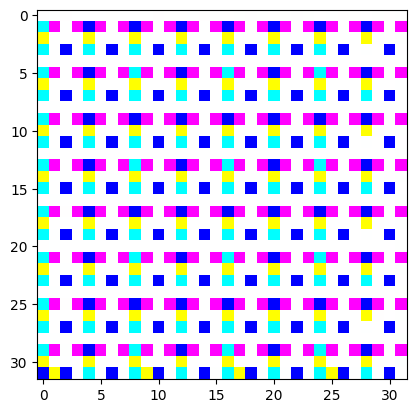

Epoch 29/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


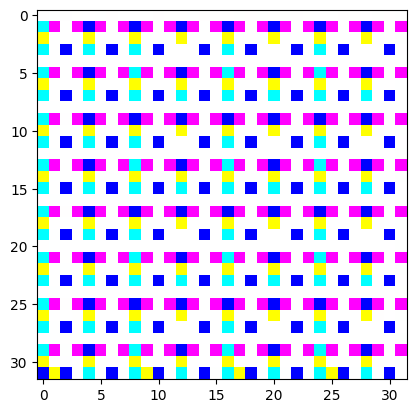

Epoch 30/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


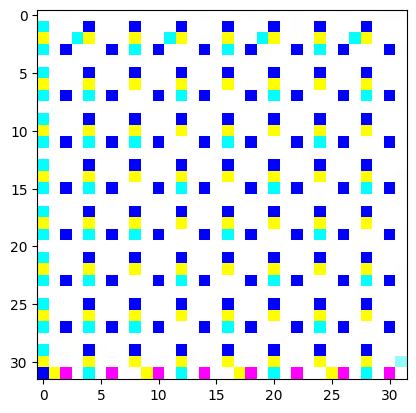

Epoch 31/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


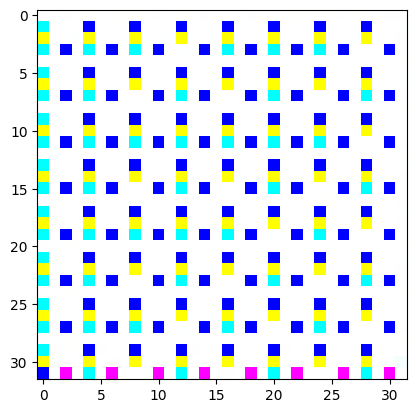

Epoch 32/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


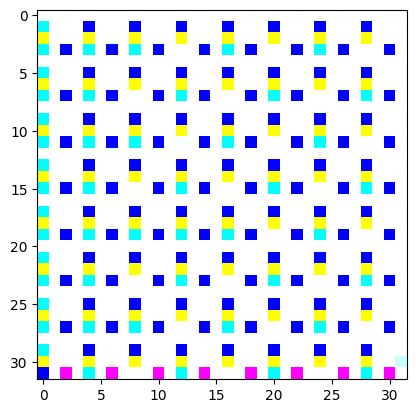

Epoch 33/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


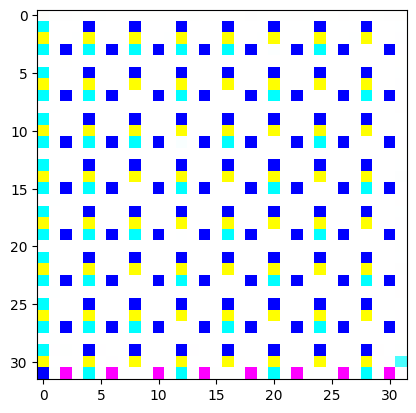

Epoch 34/1000


100%|██████████| 100/100 [00:17<00:00,  5.75it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


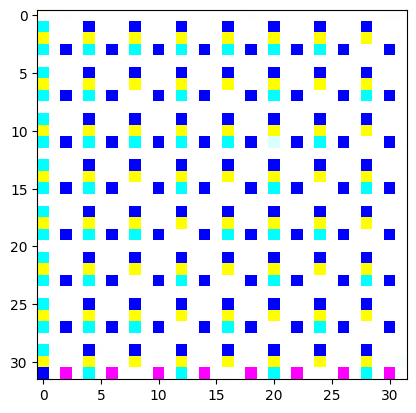

Epoch 35/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


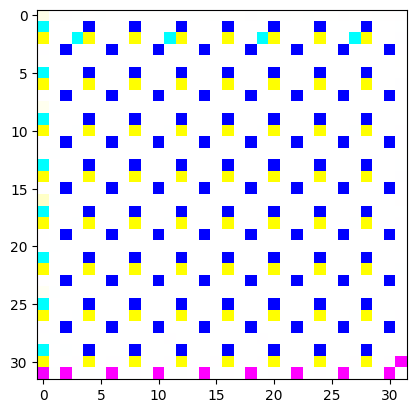

Epoch 36/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


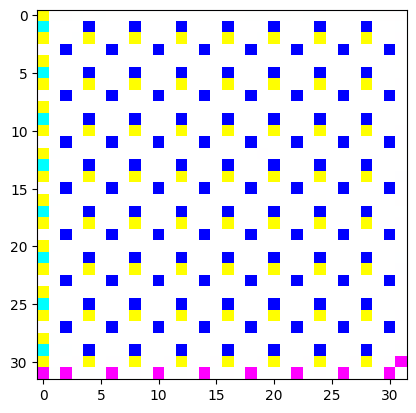

Epoch 37/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


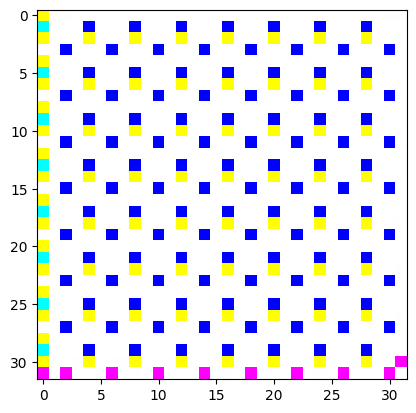

Epoch 38/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


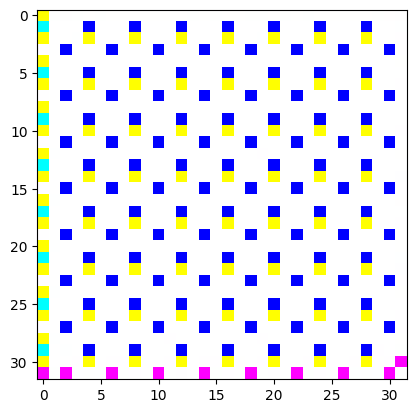

Epoch 39/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


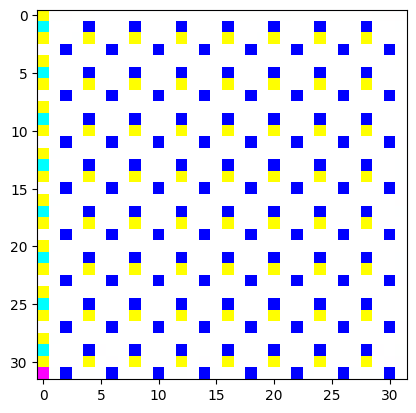

Epoch 40/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


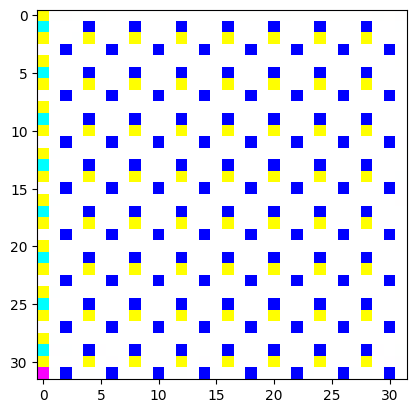

Epoch 41/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


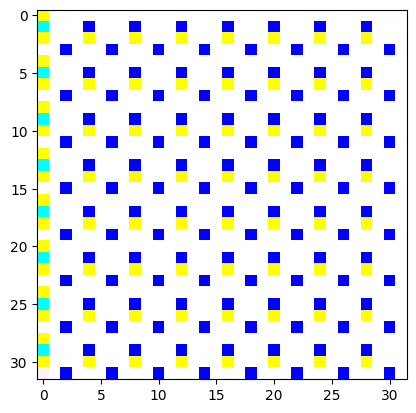

Epoch 42/1000


100%|██████████| 100/100 [00:17<00:00,  5.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


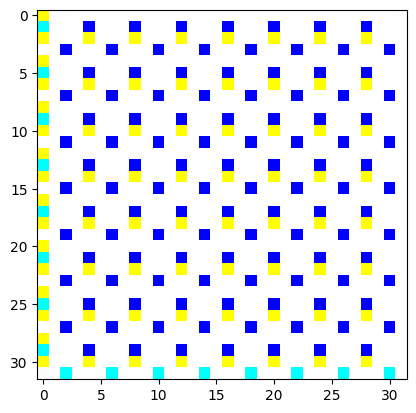

Epoch 43/1000


100%|██████████| 100/100 [00:17<00:00,  5.75it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


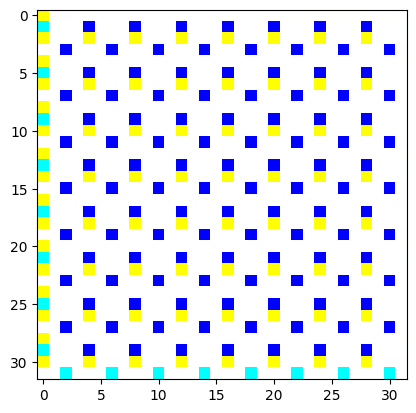

Epoch 44/1000


100%|██████████| 100/100 [00:17<00:00,  5.72it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


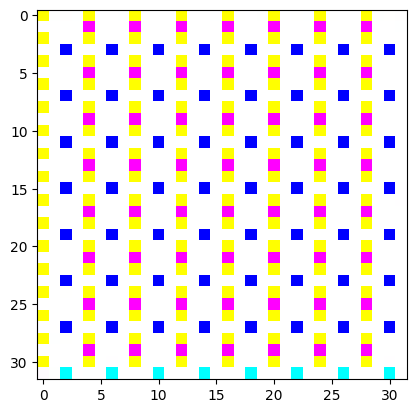

Epoch 45/1000


100%|██████████| 100/100 [00:17<00:00,  5.68it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


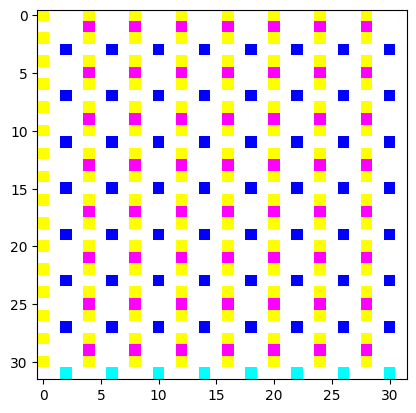

Epoch 46/1000


100%|██████████| 100/100 [00:17<00:00,  5.68it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


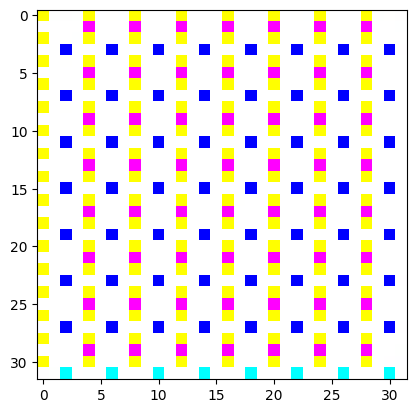

Epoch 47/1000


100%|██████████| 100/100 [00:17<00:00,  5.68it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


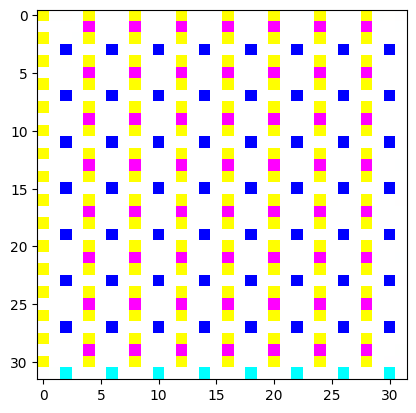

Epoch 48/1000


100%|██████████| 100/100 [00:17<00:00,  5.65it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


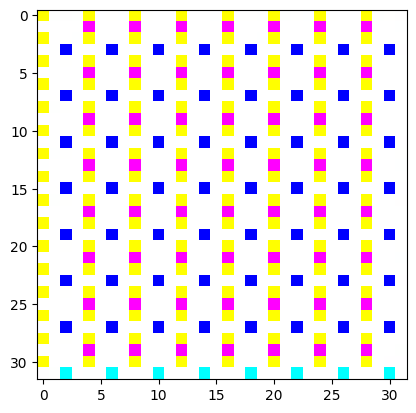

Epoch 49/1000


100%|██████████| 100/100 [00:17<00:00,  5.63it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


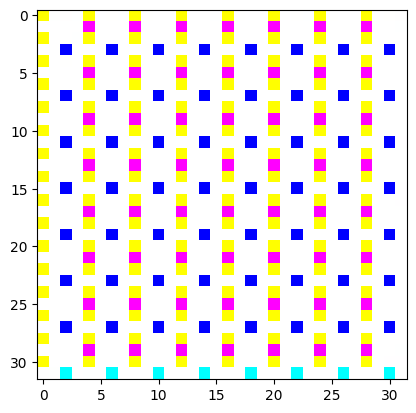

Epoch 50/1000


100%|██████████| 100/100 [00:17<00:00,  5.63it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


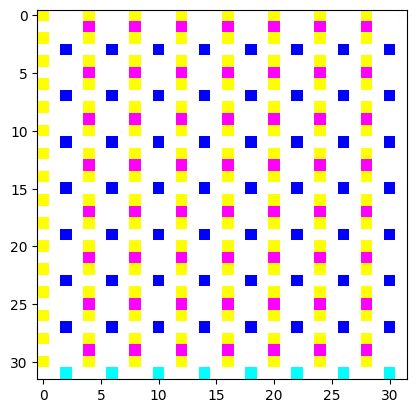

Epoch 51/1000


100%|██████████| 100/100 [00:17<00:00,  5.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


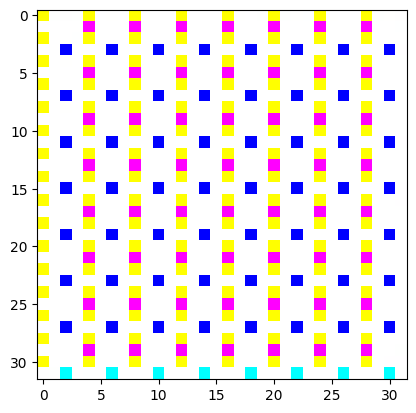

Epoch 52/1000


100%|██████████| 100/100 [00:17<00:00,  5.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


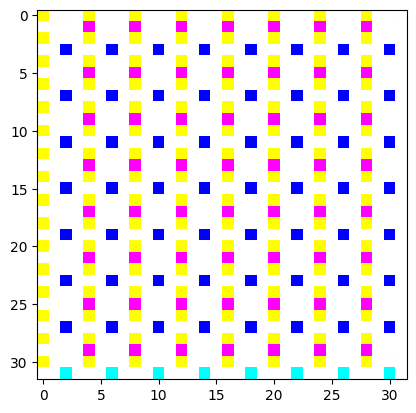

Epoch 53/1000


100%|██████████| 100/100 [00:17<00:00,  5.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


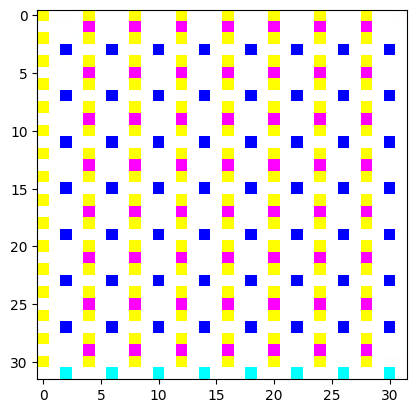

Epoch 54/1000


100%|██████████| 100/100 [00:17<00:00,  5.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


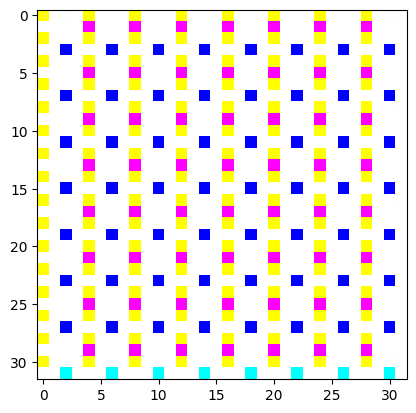

Epoch 55/1000


100%|██████████| 100/100 [00:17<00:00,  5.63it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


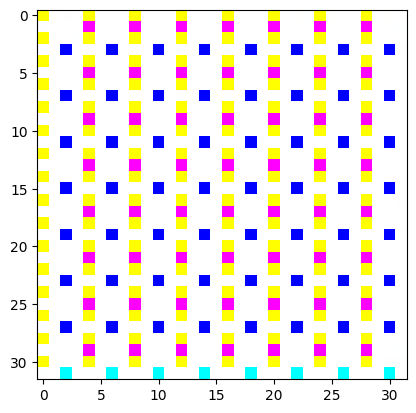

Epoch 56/1000


100%|██████████| 100/100 [00:17<00:00,  5.62it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


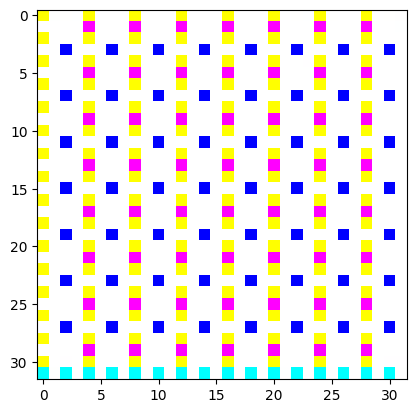

Epoch 57/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


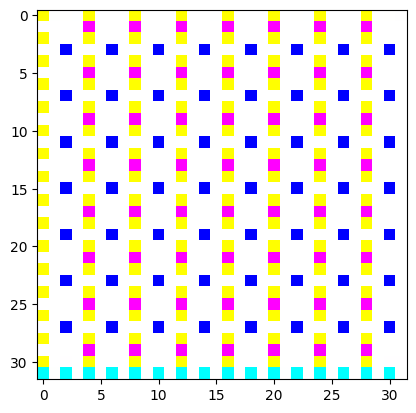

Epoch 58/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


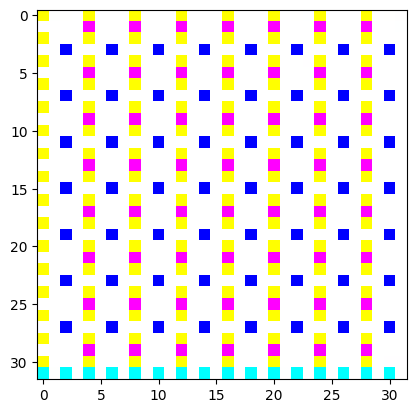

Epoch 59/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


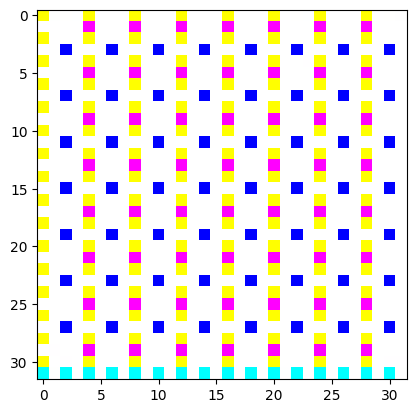

Epoch 60/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


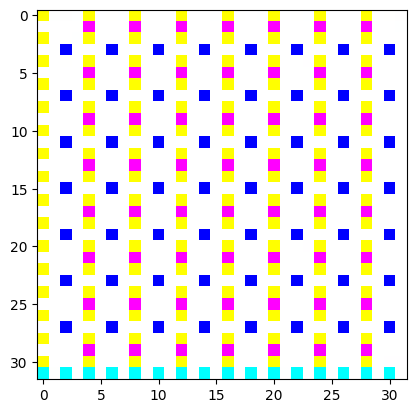

Epoch 61/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


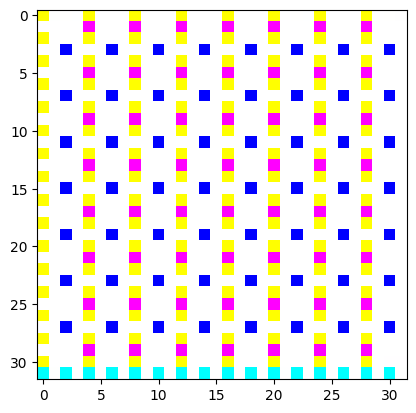

Epoch 62/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


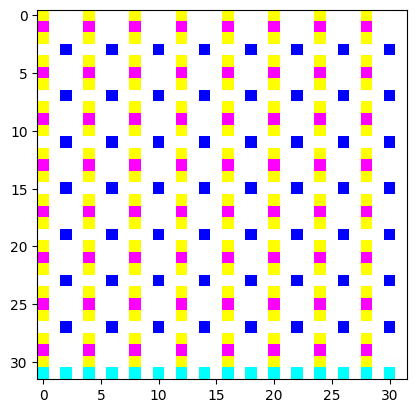

Epoch 63/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


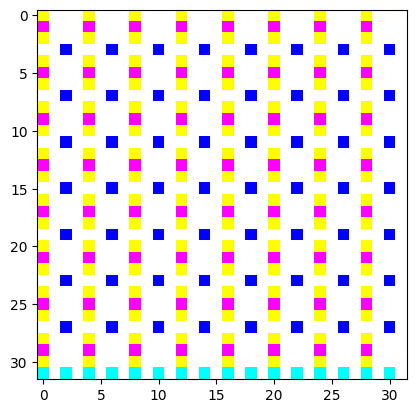

Epoch 64/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


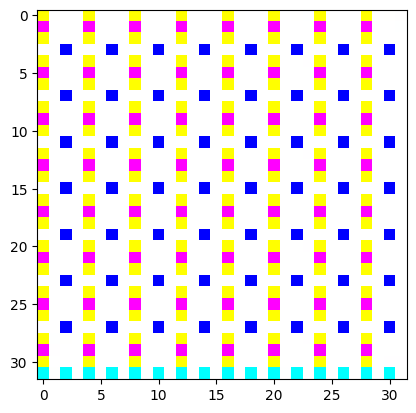

Epoch 65/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


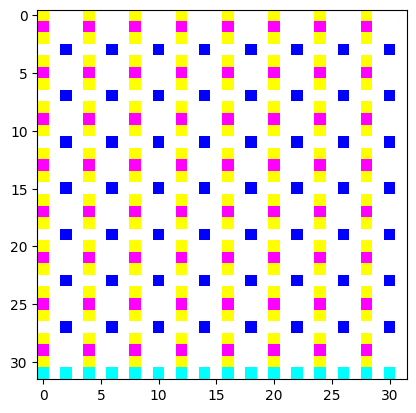

Epoch 66/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


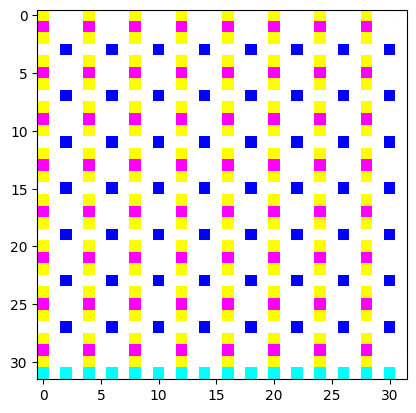

Epoch 67/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


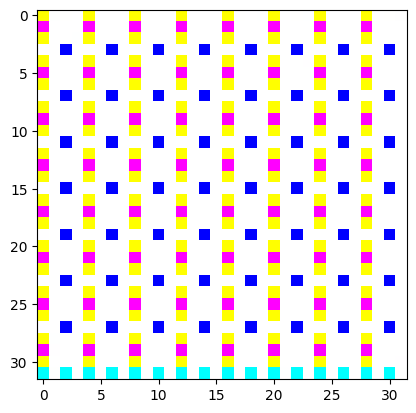

Epoch 68/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


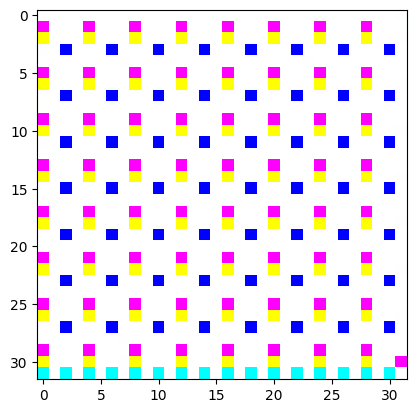

Epoch 69/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


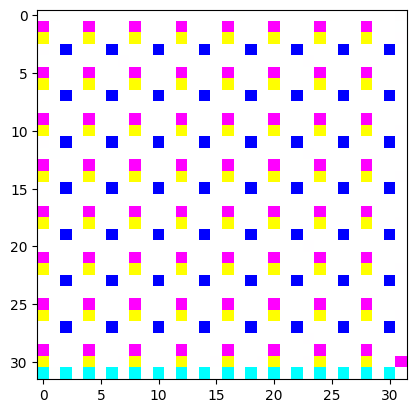

Epoch 70/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


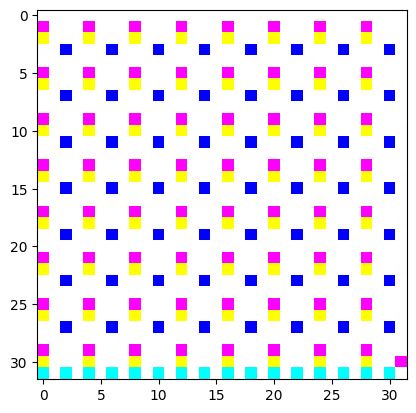

Epoch 71/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


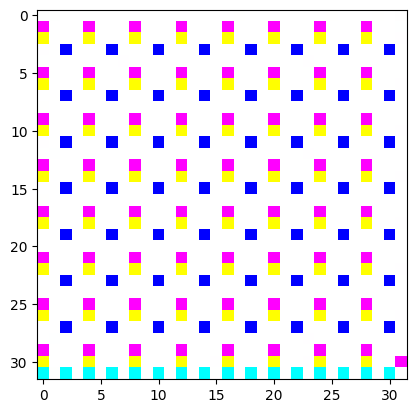

Epoch 72/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


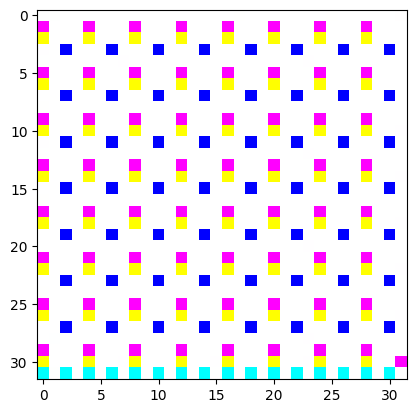

Epoch 73/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


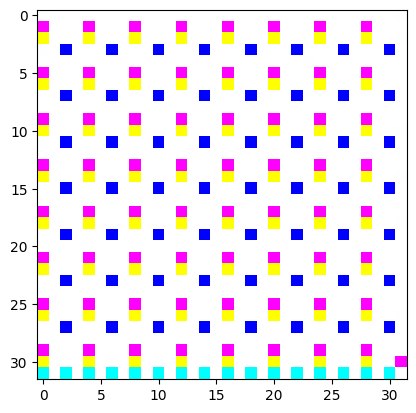

Epoch 74/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


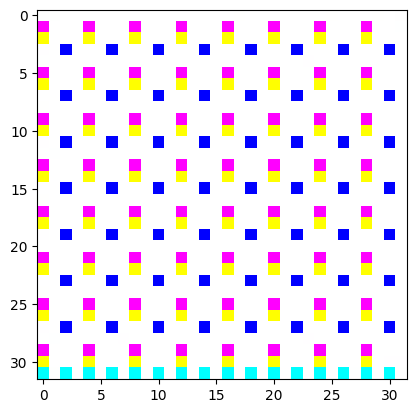

Epoch 75/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


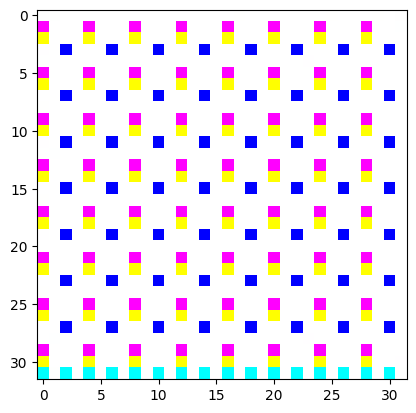

Epoch 76/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


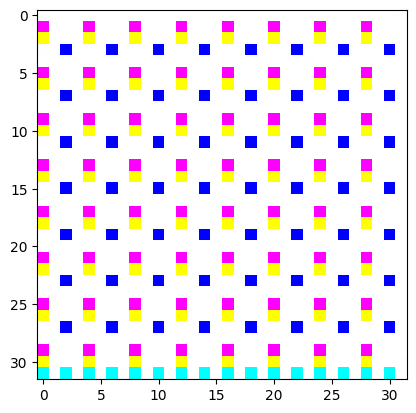

Epoch 77/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


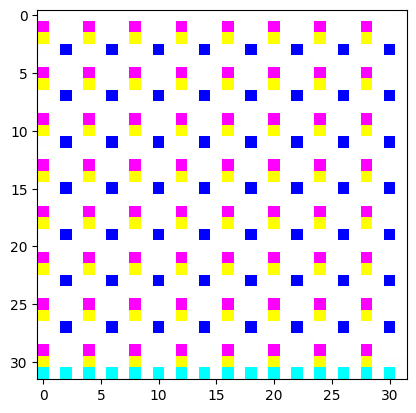

Epoch 78/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


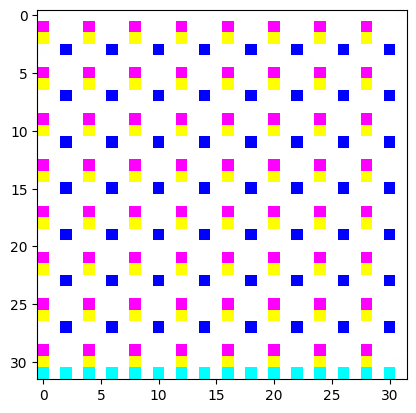

Epoch 79/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


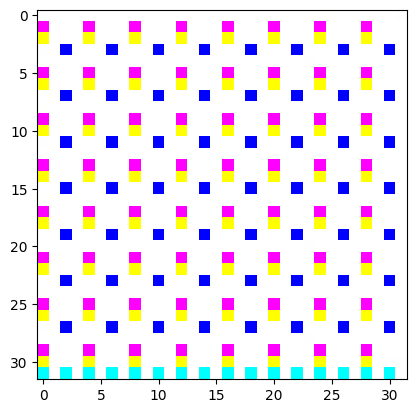

Epoch 80/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


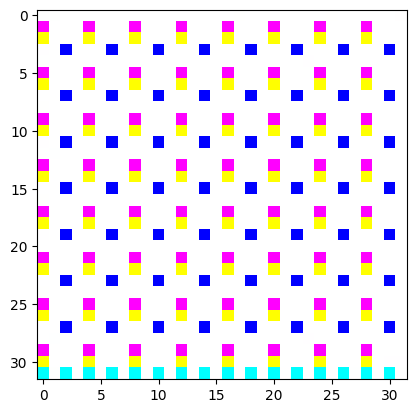

Epoch 81/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


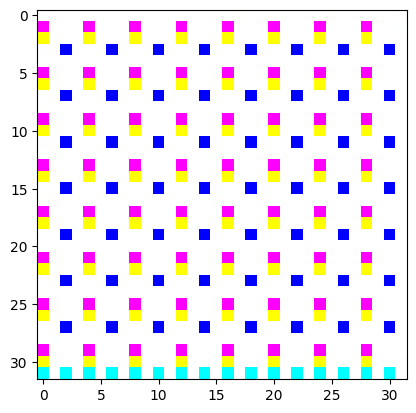

Epoch 82/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


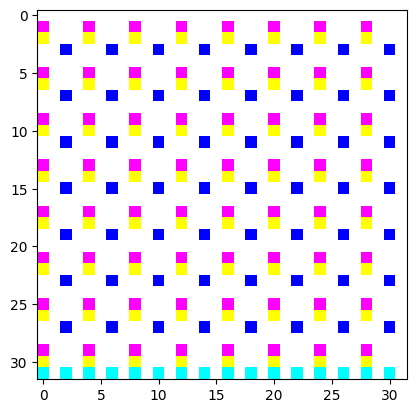

Epoch 83/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


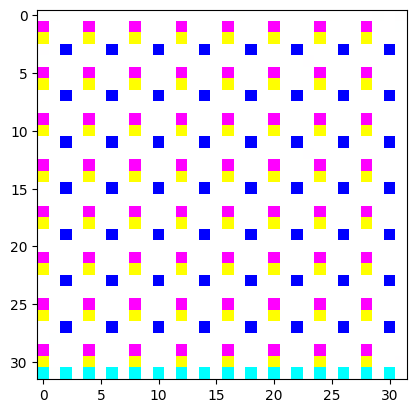

Epoch 84/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


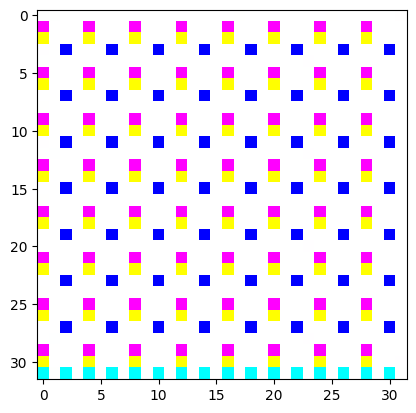

Epoch 85/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


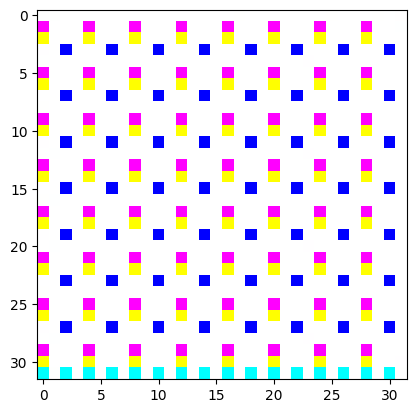

Epoch 86/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


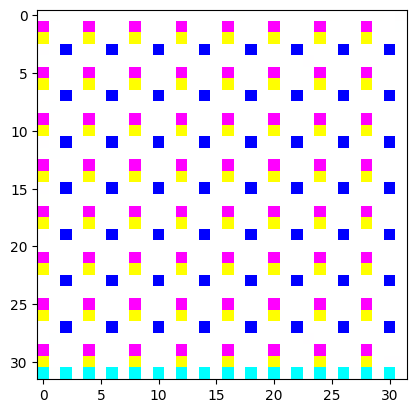

Epoch 87/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


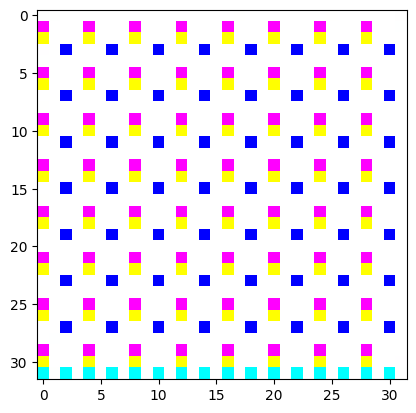

Epoch 88/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


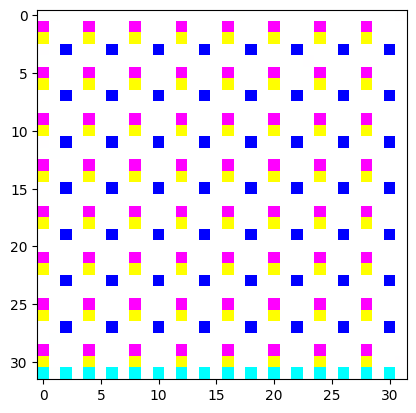

Epoch 89/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


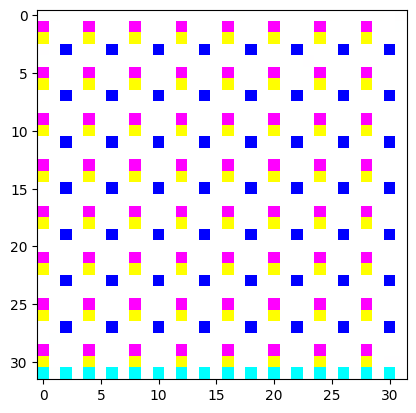

Epoch 90/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


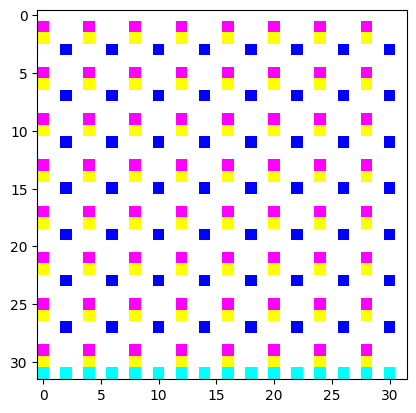

Epoch 91/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


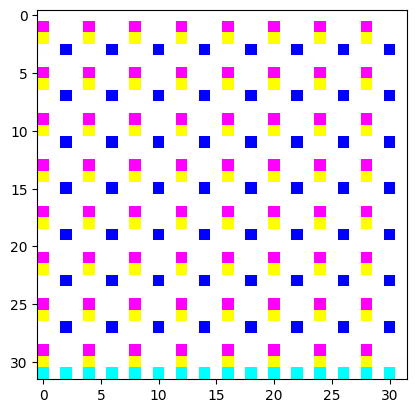

Epoch 92/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


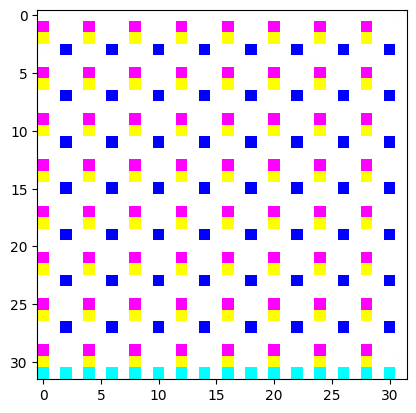

Epoch 93/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


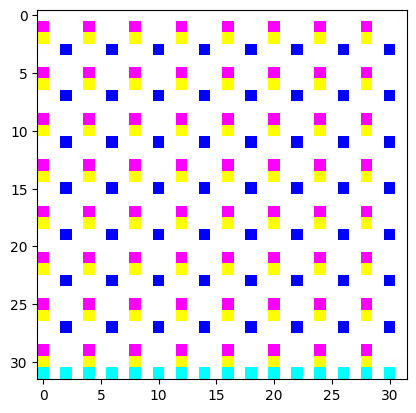

Epoch 94/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


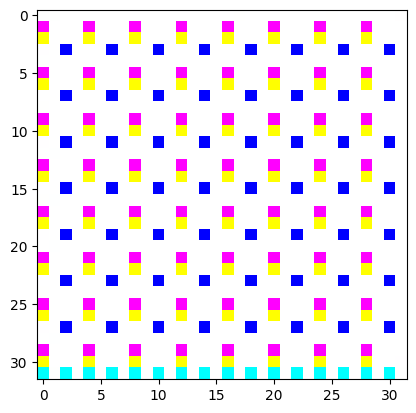

Epoch 95/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


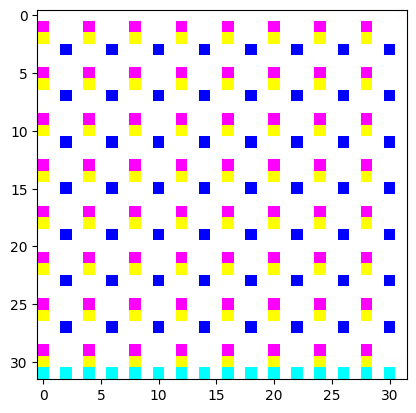

Epoch 96/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


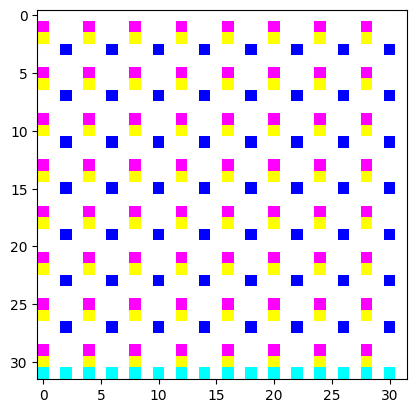

Epoch 97/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


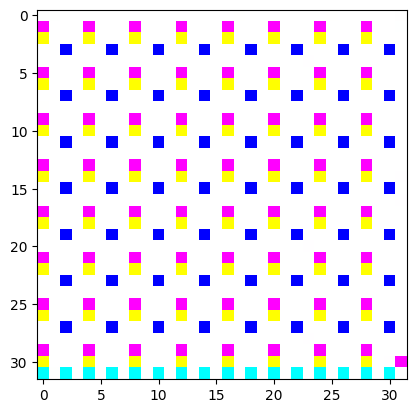

Epoch 98/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


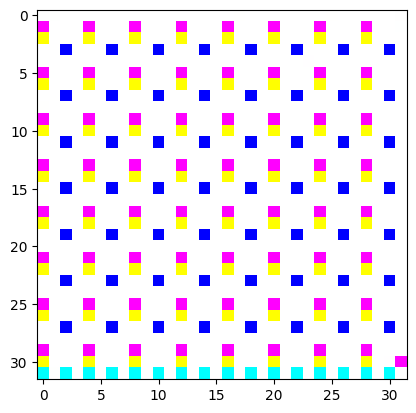

Epoch 99/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


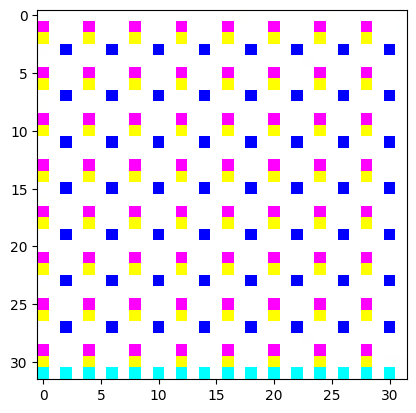

Epoch 100/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


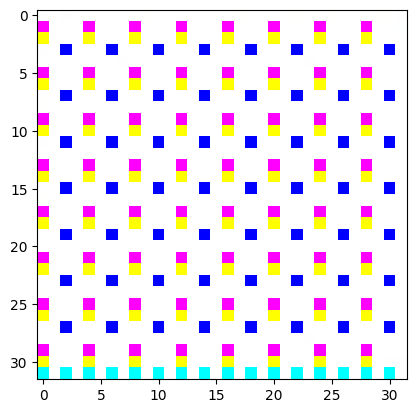

Epoch 101/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


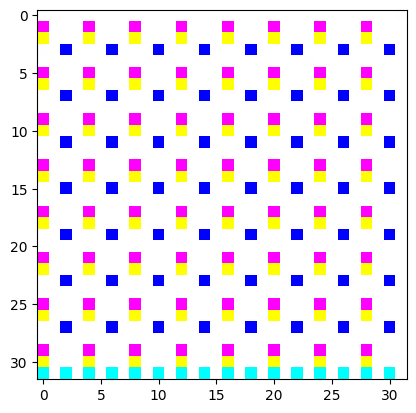

Epoch 102/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


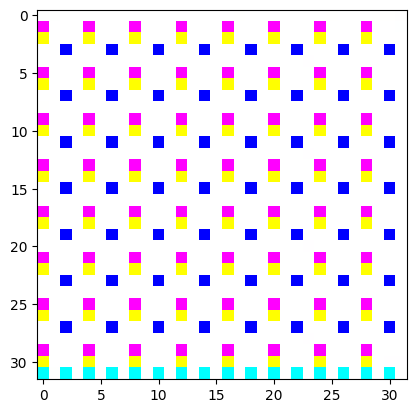

Epoch 103/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


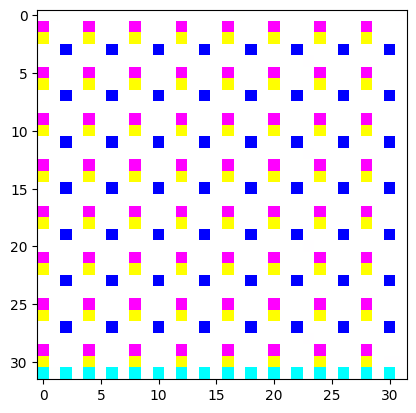

Epoch 104/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


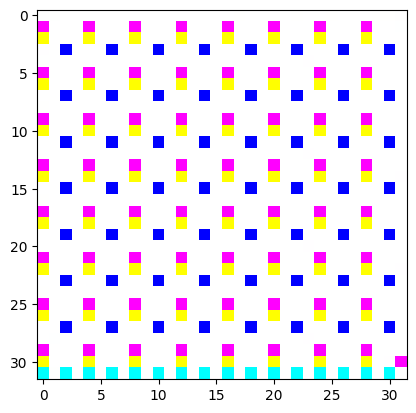

Epoch 105/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


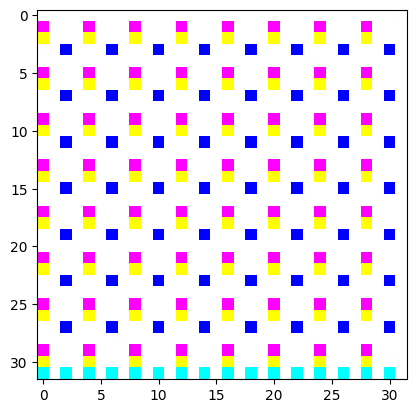

Epoch 106/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


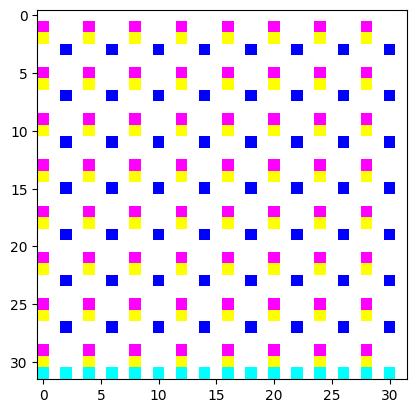

Epoch 107/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


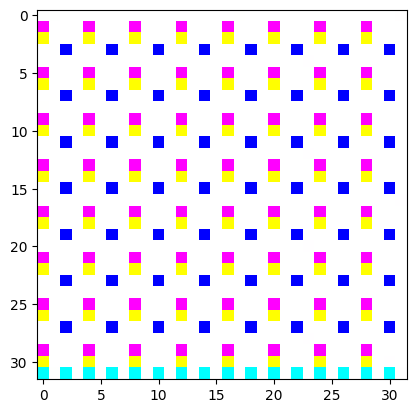

Epoch 108/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


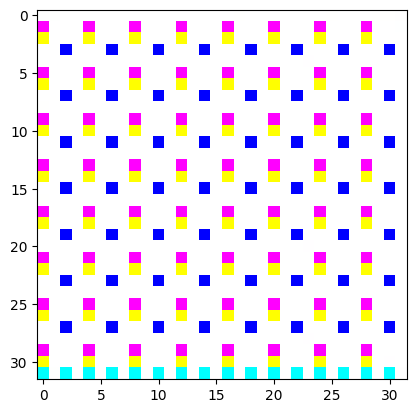

Epoch 109/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


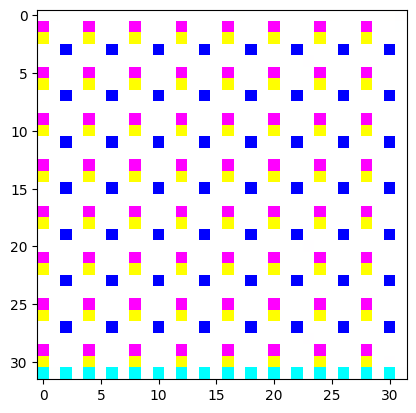

Epoch 110/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


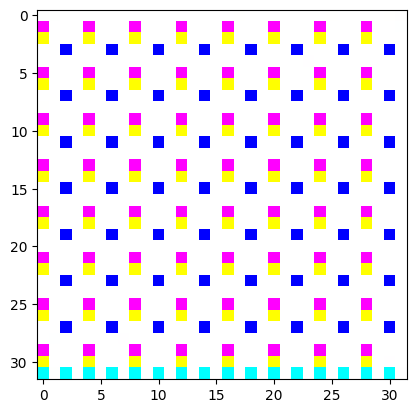

Epoch 111/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


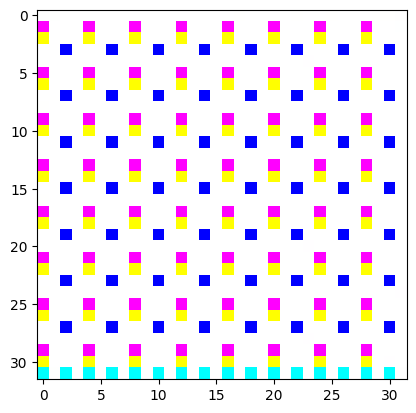

Epoch 112/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


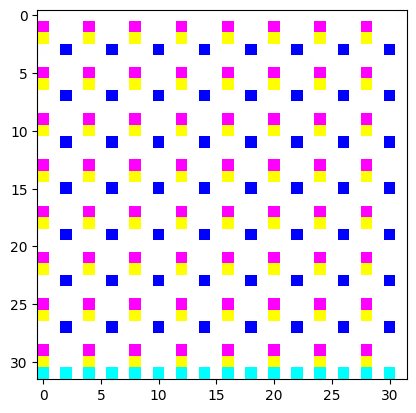

Epoch 113/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


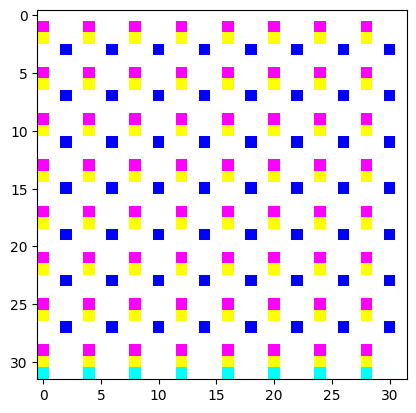

Epoch 114/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


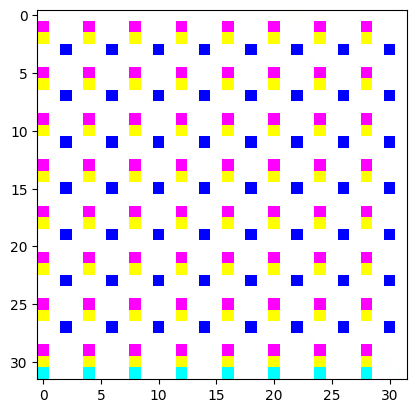

Epoch 115/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


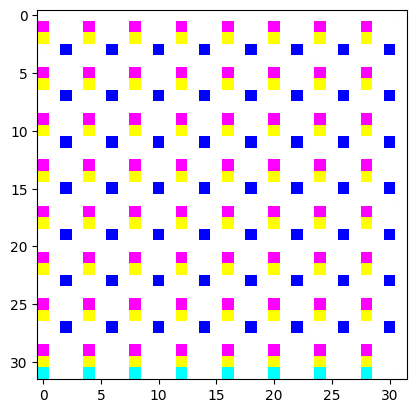

Epoch 116/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


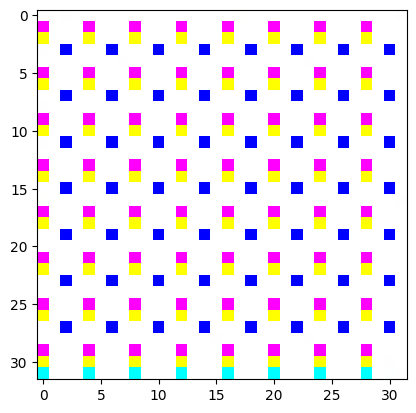

Epoch 117/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


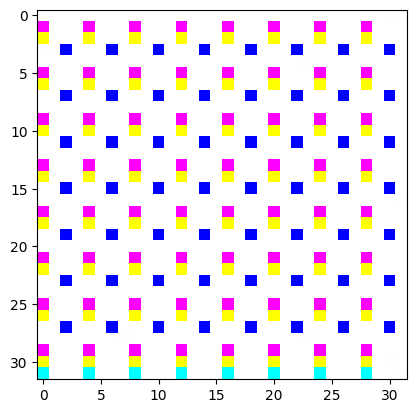

Epoch 118/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


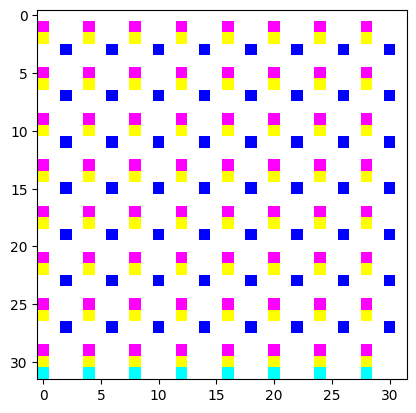

Epoch 119/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


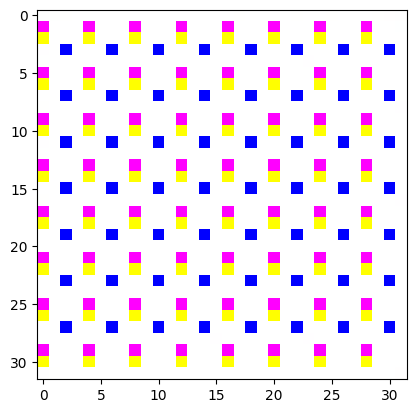

Epoch 120/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


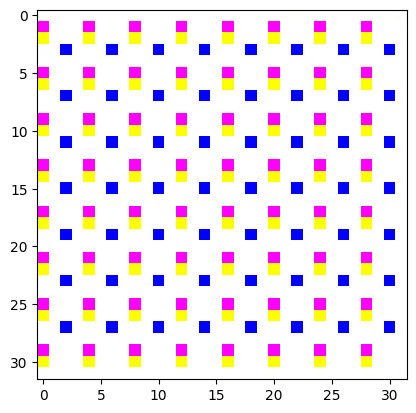

Epoch 121/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


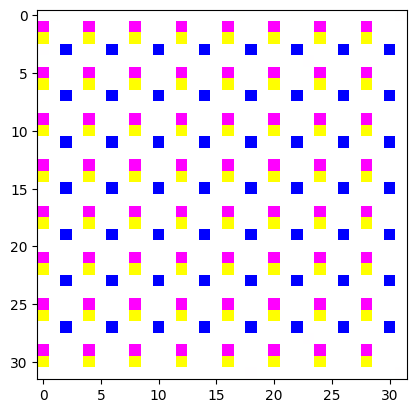

Epoch 122/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


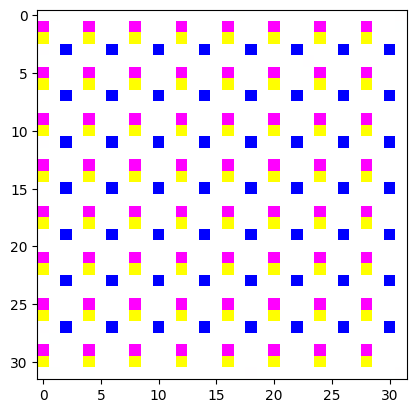

Epoch 123/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


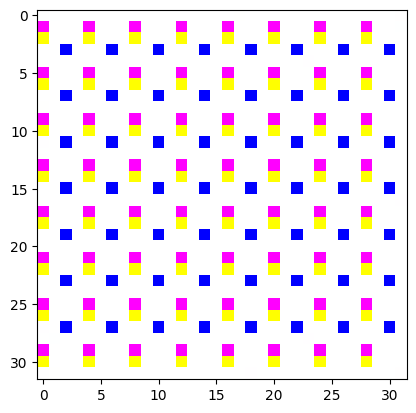

Epoch 124/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


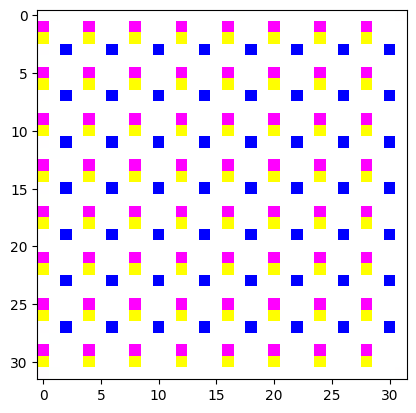

Epoch 125/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


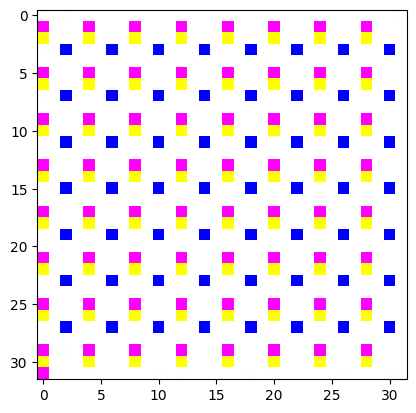

Epoch 126/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


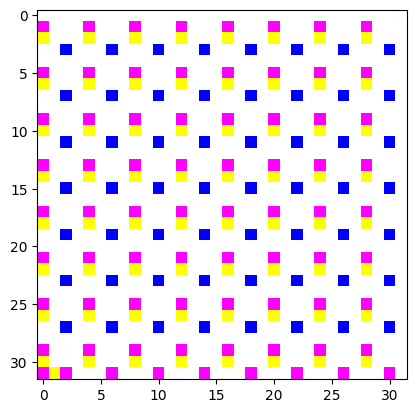

Epoch 127/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


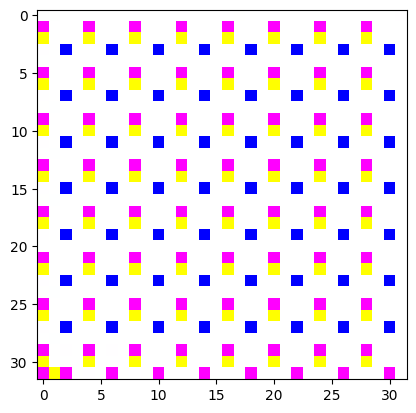

Epoch 128/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


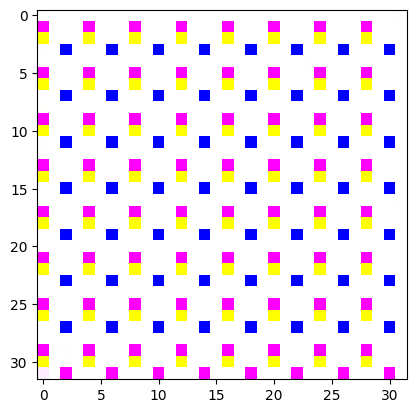

Epoch 129/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


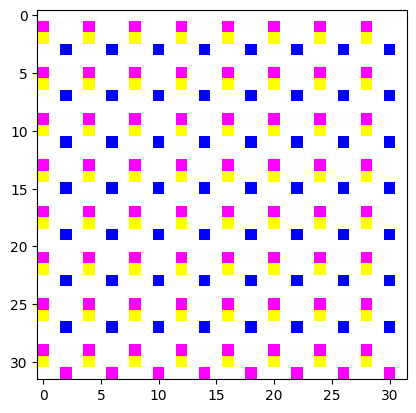

Epoch 130/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


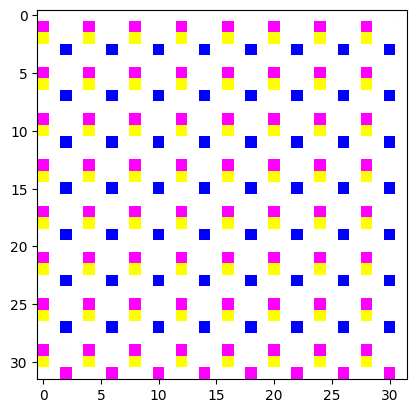

Epoch 131/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


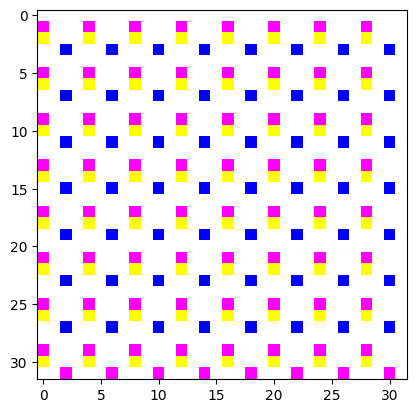

Epoch 132/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


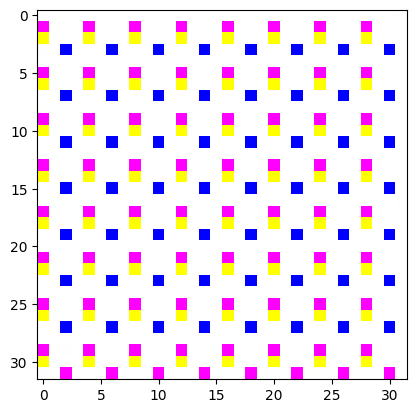

Epoch 133/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


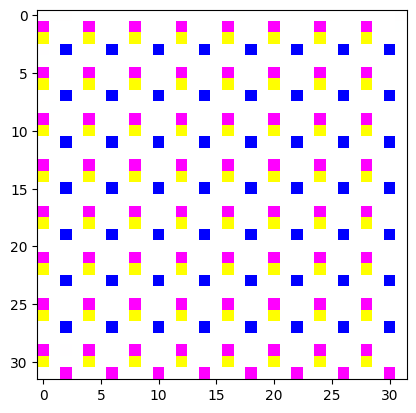

Epoch 134/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


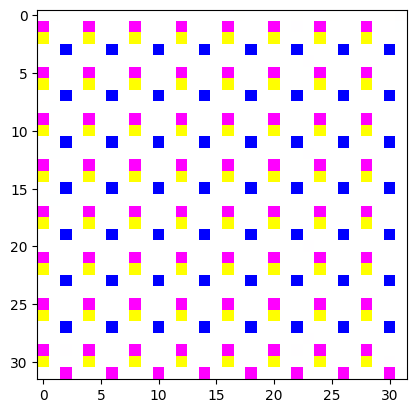

Epoch 135/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


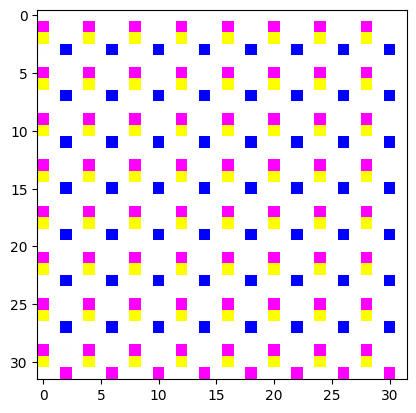

Epoch 136/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


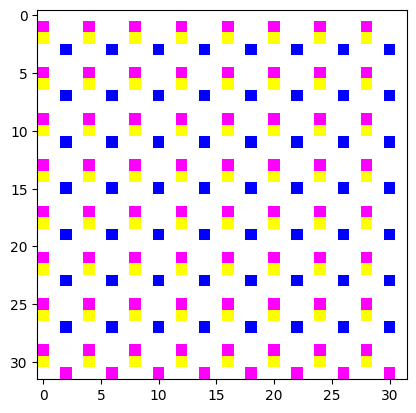

Epoch 137/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


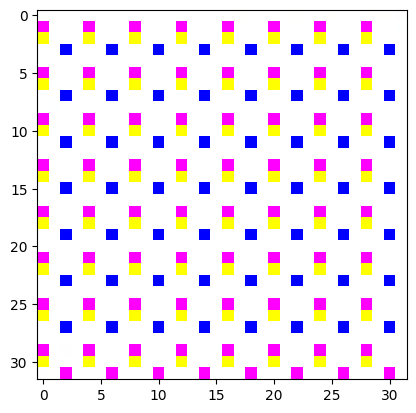

Epoch 138/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


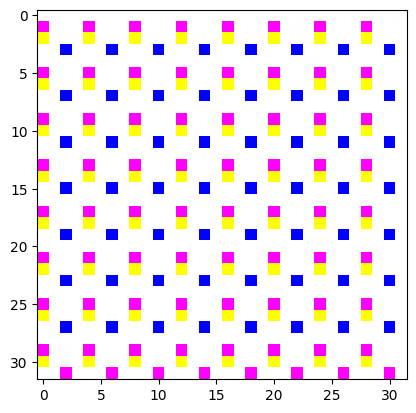

Epoch 139/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


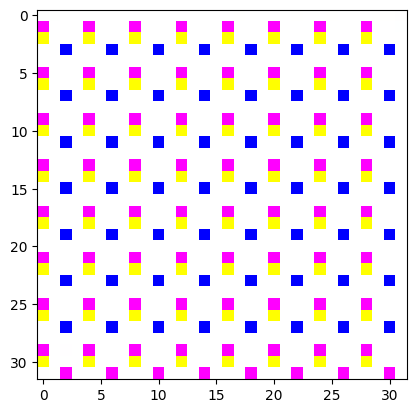

Epoch 140/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


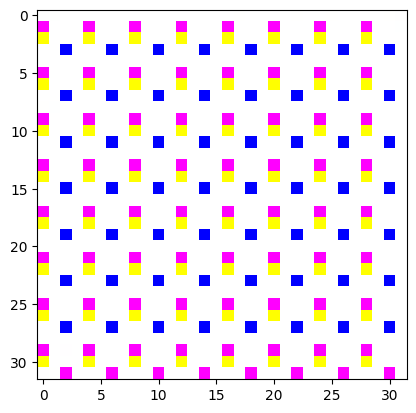

Epoch 141/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


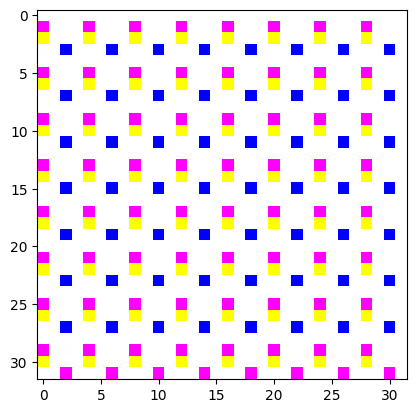

Epoch 142/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


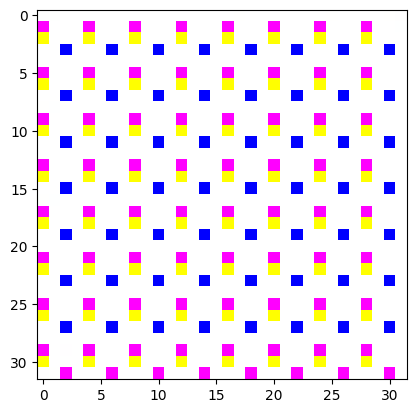

Epoch 143/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


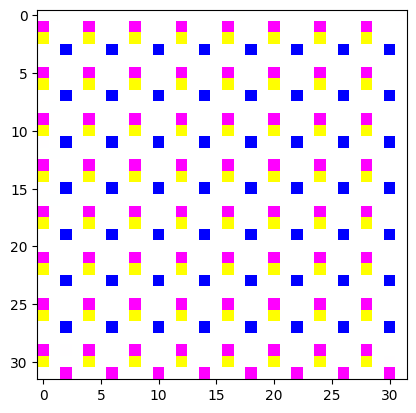

Epoch 144/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


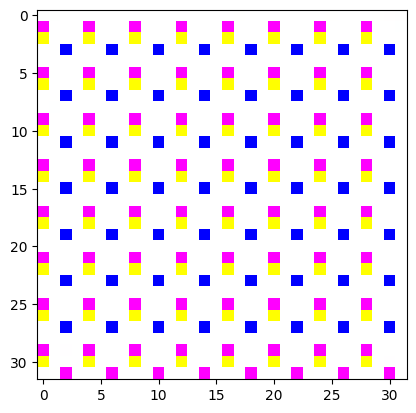

Epoch 145/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


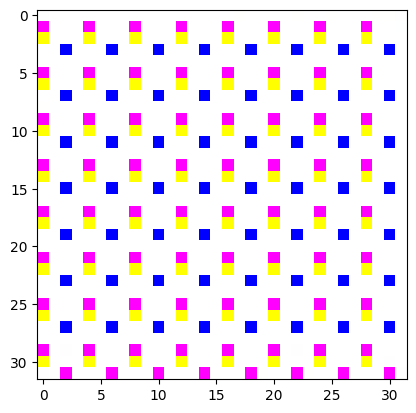

Epoch 146/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


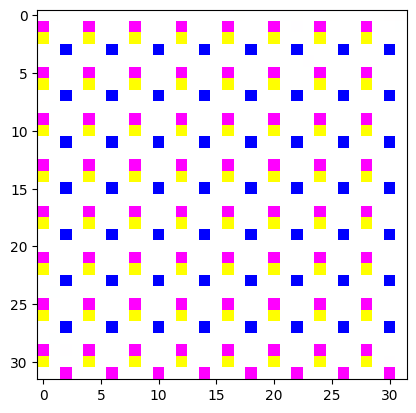

Epoch 147/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


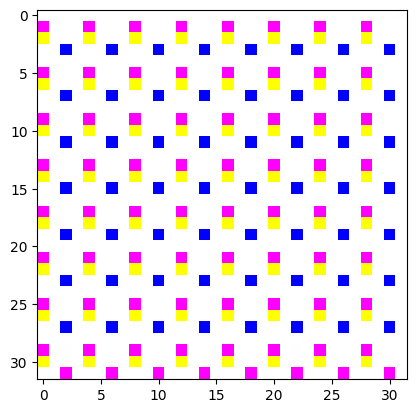

Epoch 148/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


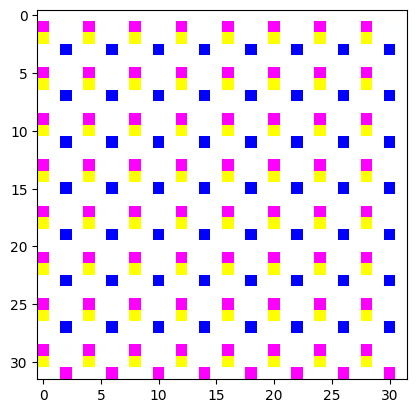

Epoch 149/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


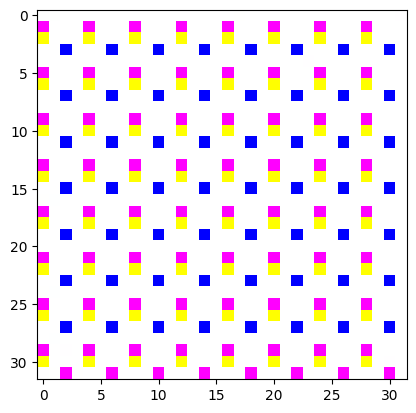

Epoch 150/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


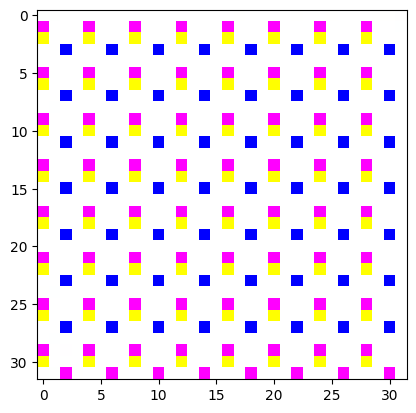

Epoch 151/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


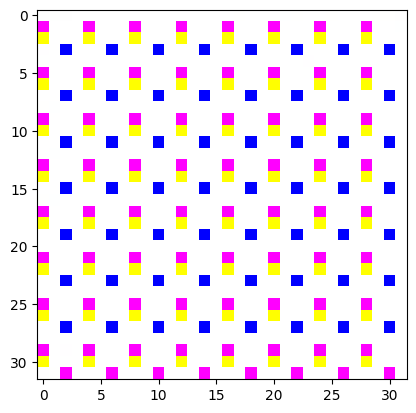

Epoch 152/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


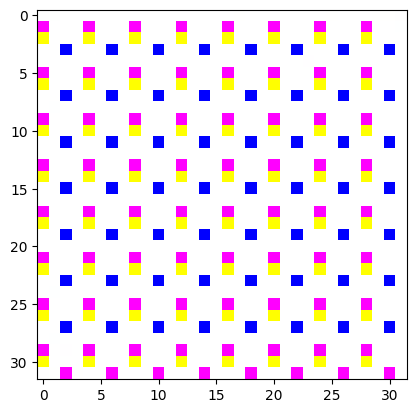

Epoch 153/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


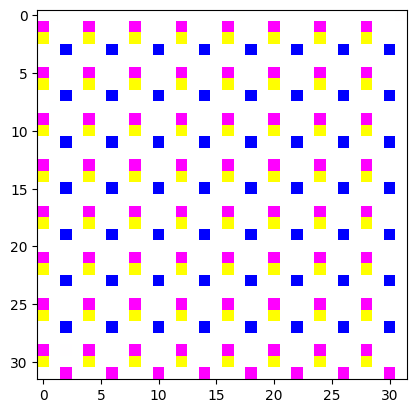

Epoch 154/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


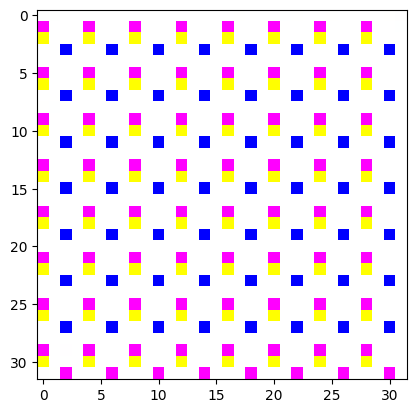

Epoch 155/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


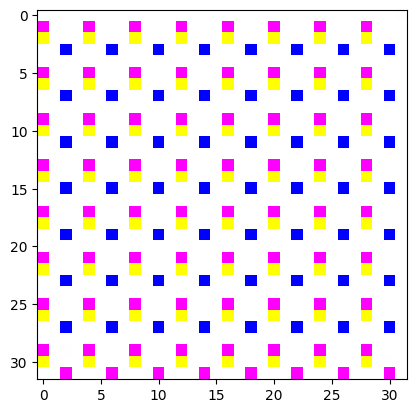

Epoch 156/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


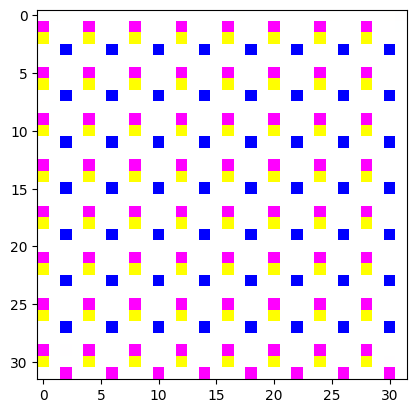

Epoch 157/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


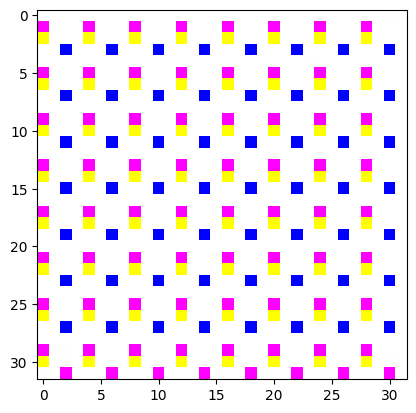

Epoch 158/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


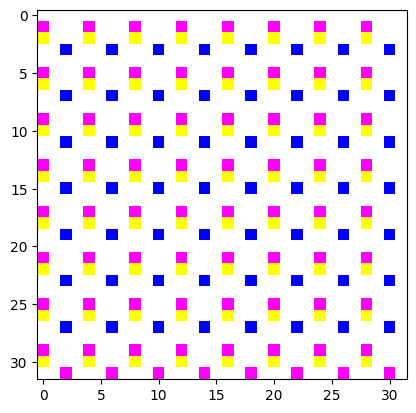

Epoch 159/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


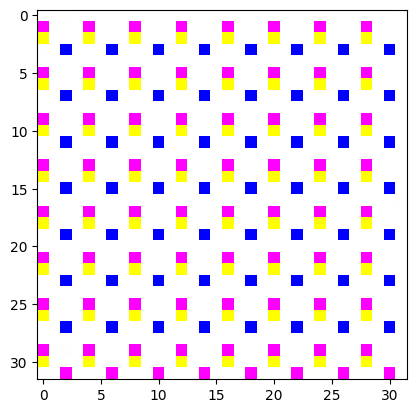

Epoch 160/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


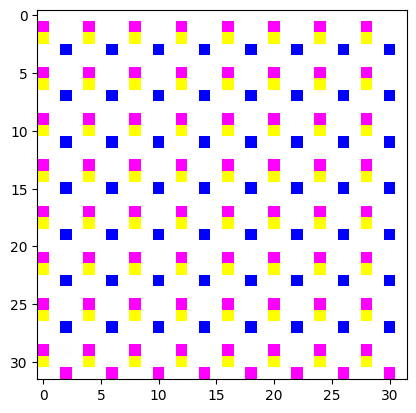

Epoch 161/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


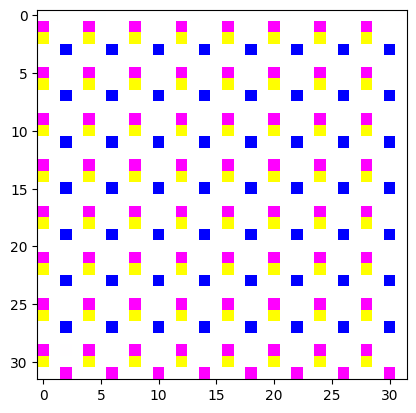

Epoch 162/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


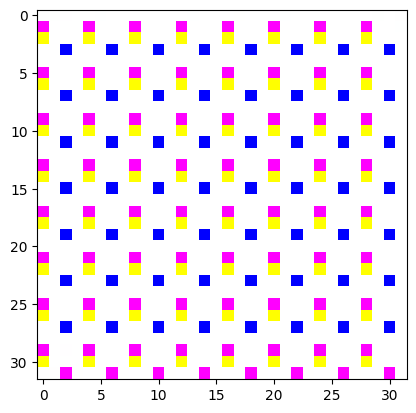

Epoch 163/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


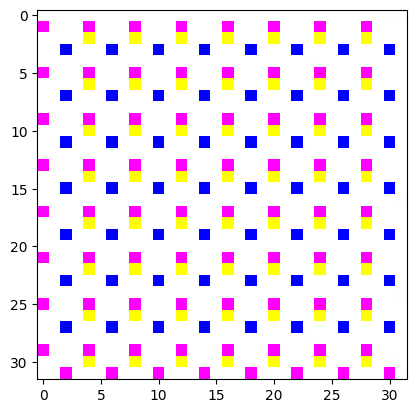

Epoch 164/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


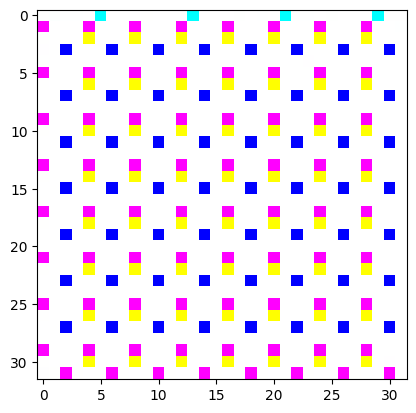

Epoch 165/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


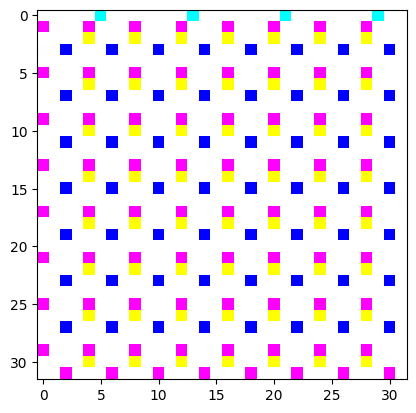

Epoch 166/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


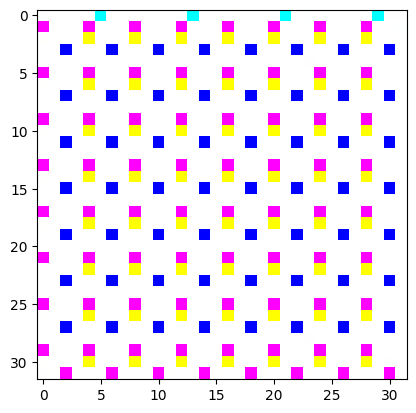

Epoch 167/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


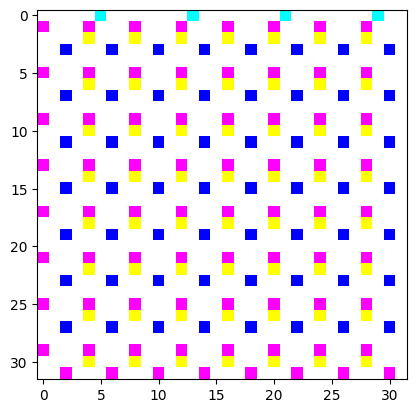

Epoch 168/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


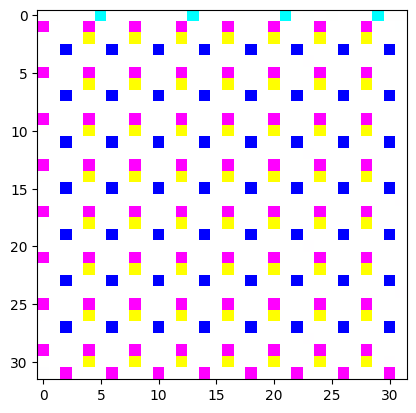

Epoch 169/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


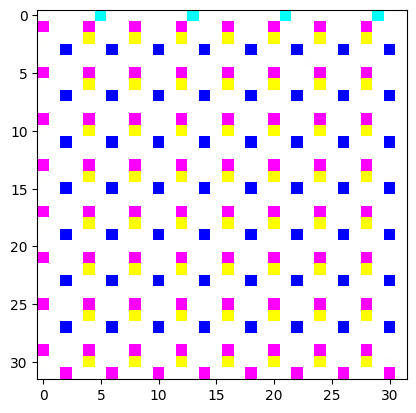

Epoch 170/1000


100%|██████████| 100/100 [00:18<00:00,  5.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


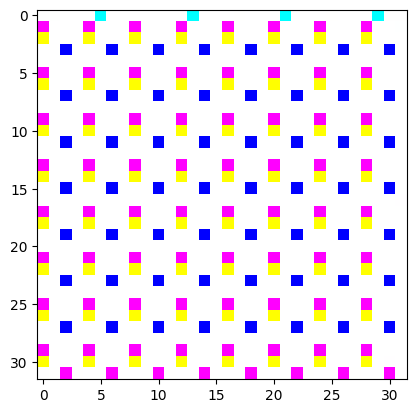

Epoch 171/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


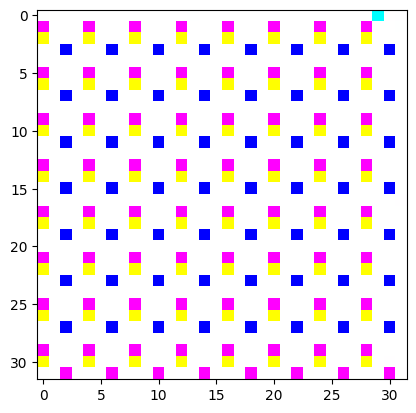

Epoch 172/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


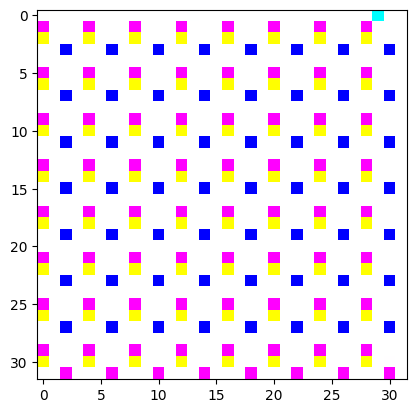

Epoch 173/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


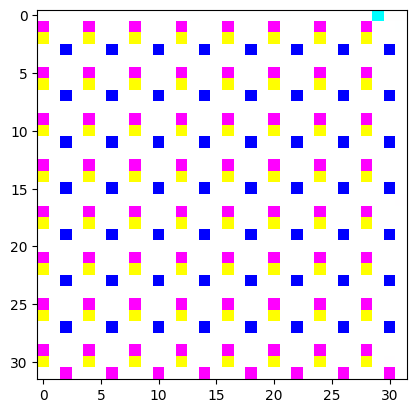

Epoch 174/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


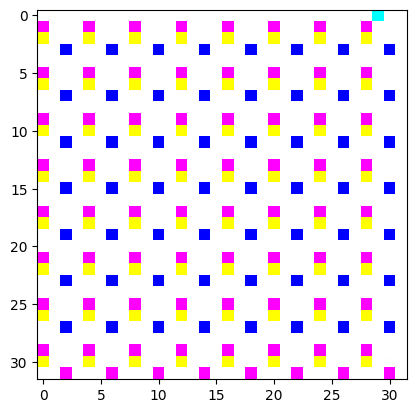

Epoch 175/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


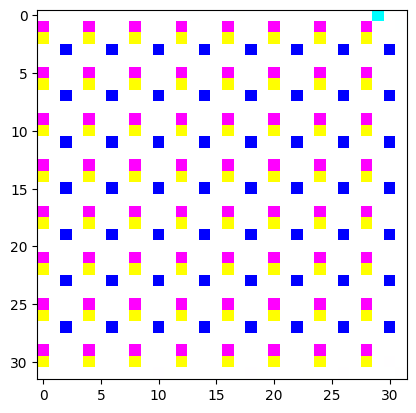

Epoch 176/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


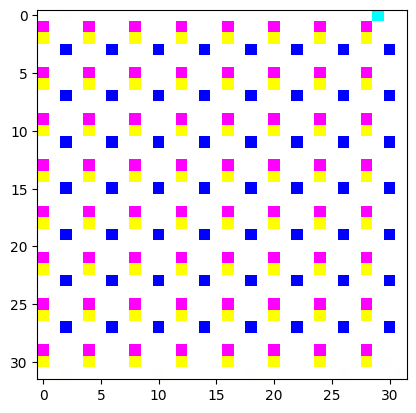

Epoch 177/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


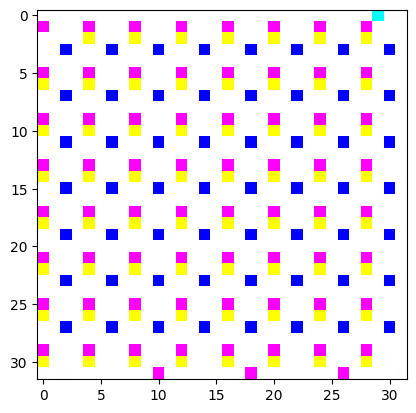

Epoch 178/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


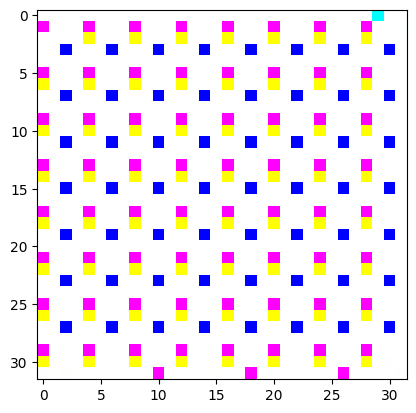

Epoch 179/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


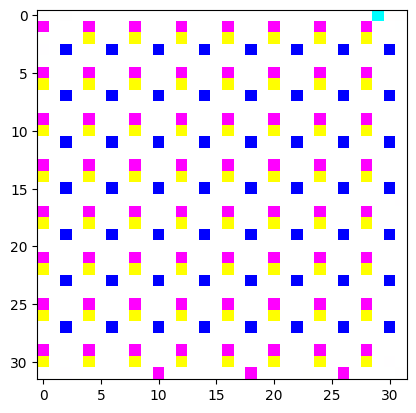

Epoch 180/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


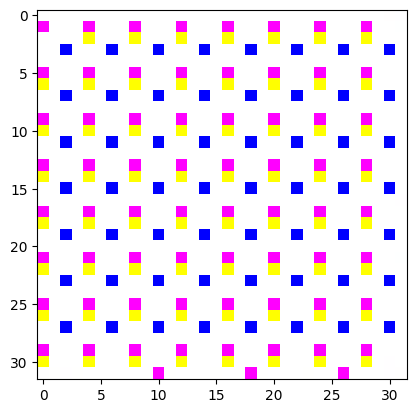

Epoch 181/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


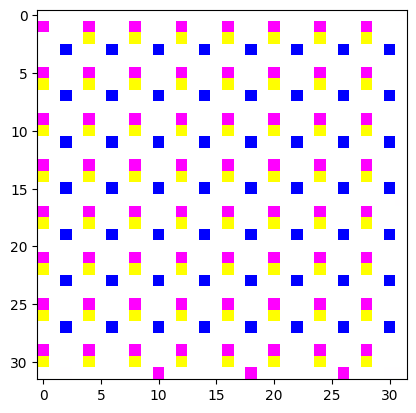

Epoch 182/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


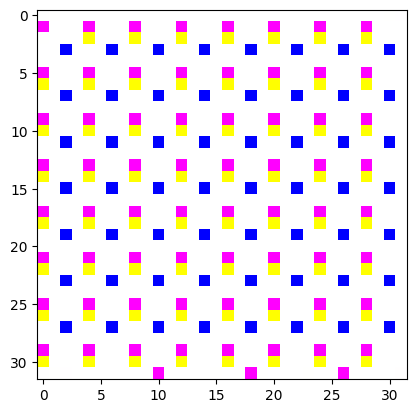

Epoch 183/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


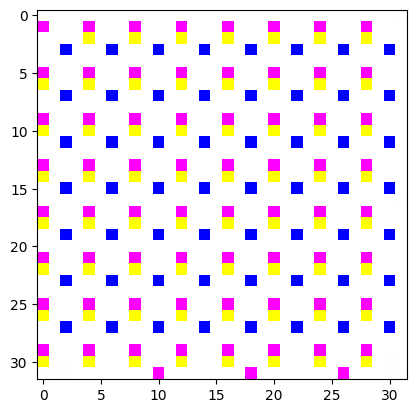

Epoch 184/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


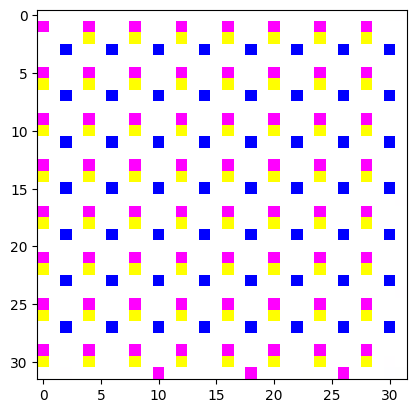

Epoch 185/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


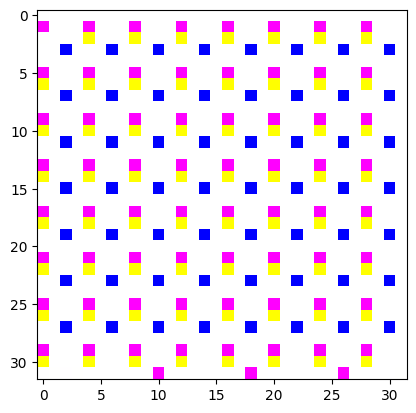

Epoch 186/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


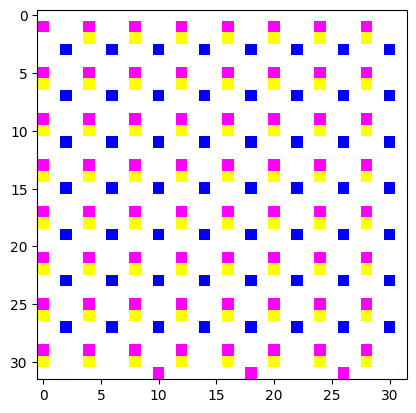

Epoch 187/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


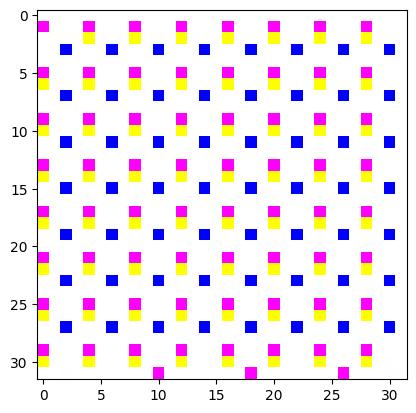

Epoch 188/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


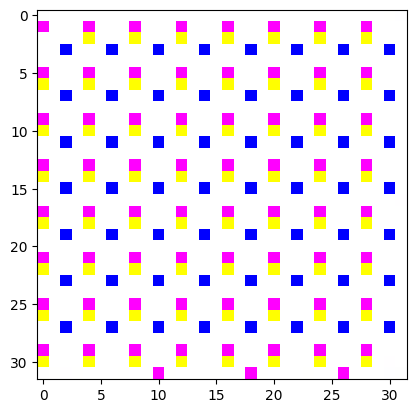

Epoch 189/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


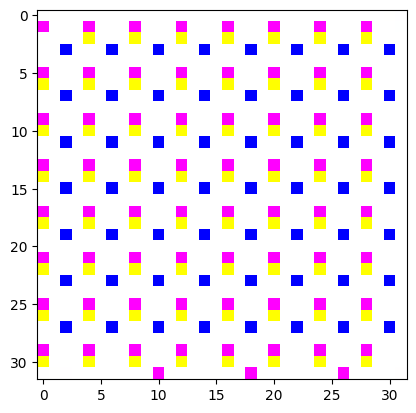

Epoch 190/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


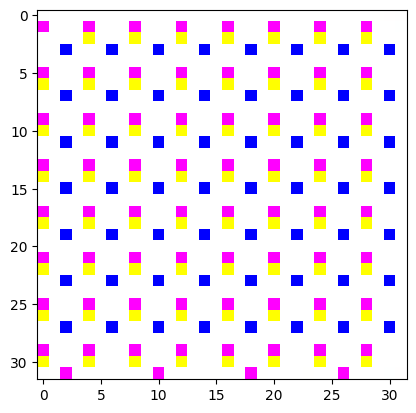

Epoch 191/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


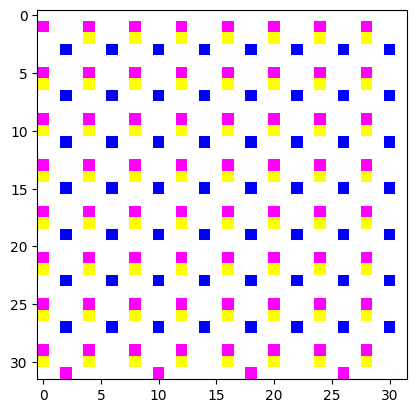

Epoch 192/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


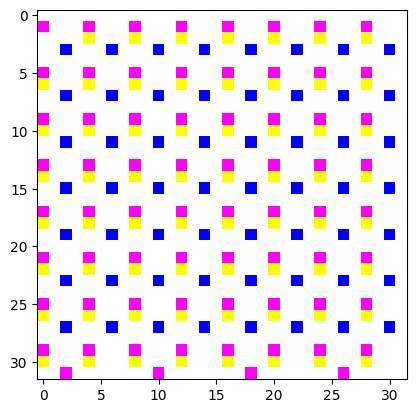

Epoch 193/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


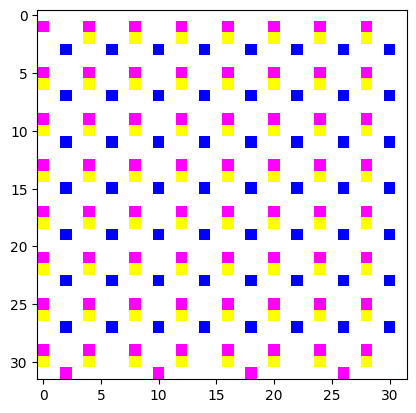

Epoch 194/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


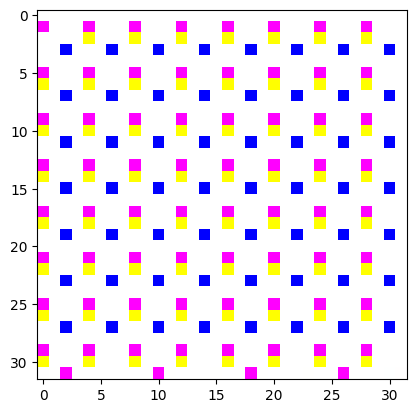

Epoch 195/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


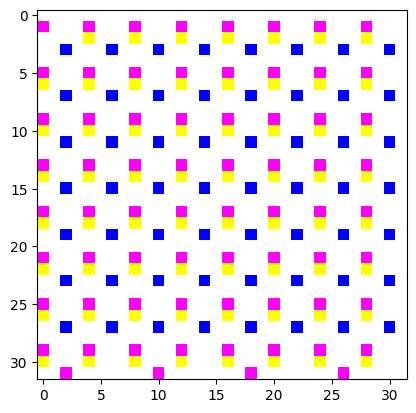

Epoch 196/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


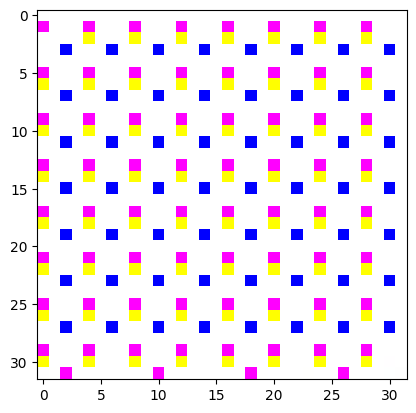

Epoch 197/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


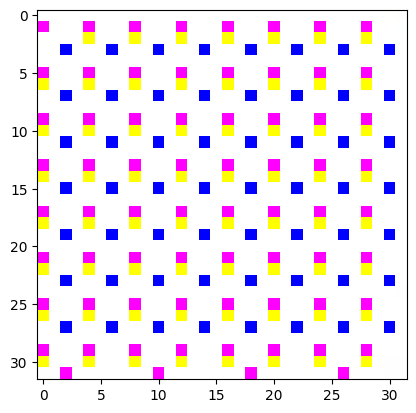

Epoch 198/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


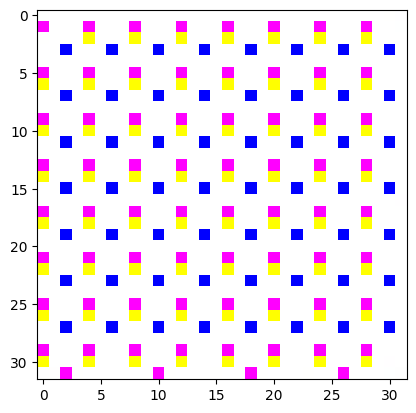

Epoch 199/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


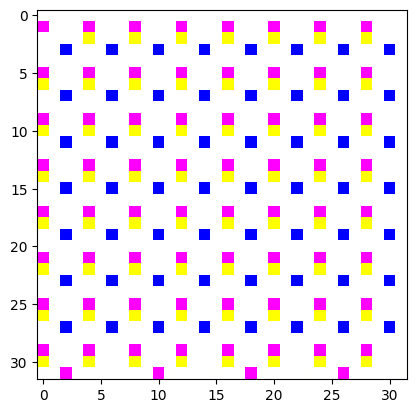

Epoch 200/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


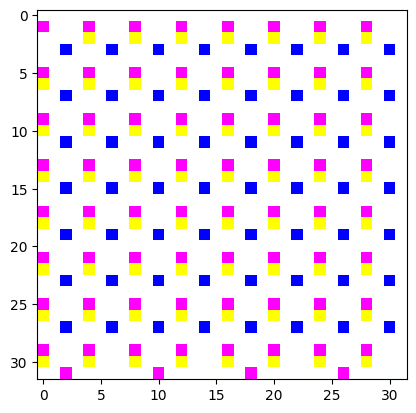

Epoch 201/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


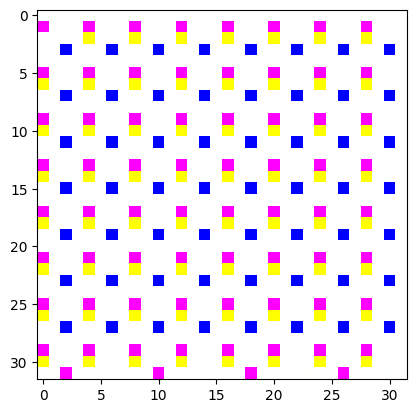

Epoch 202/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


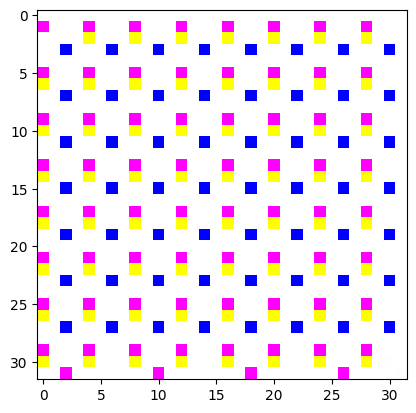

Epoch 203/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


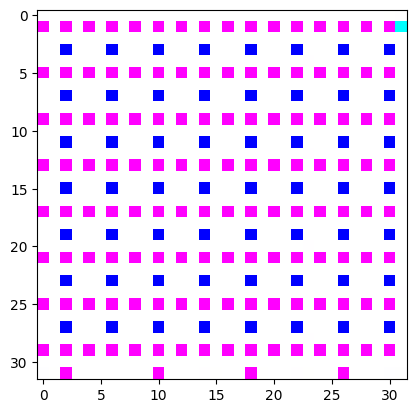

Epoch 204/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


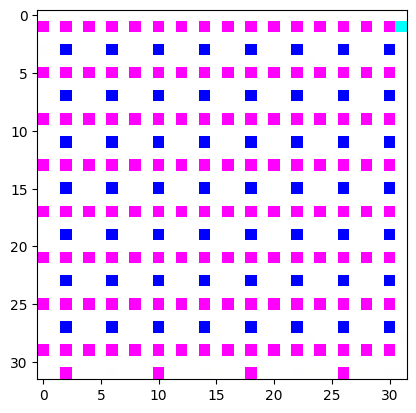

Epoch 205/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


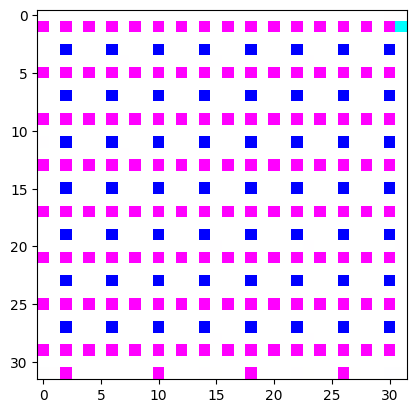

Epoch 206/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


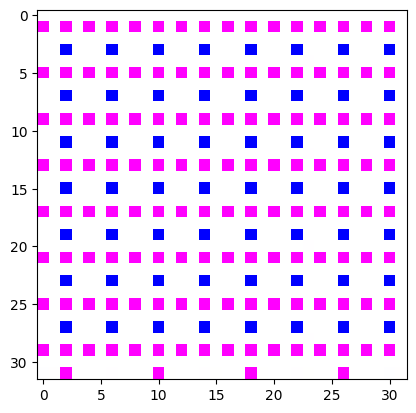

Epoch 207/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


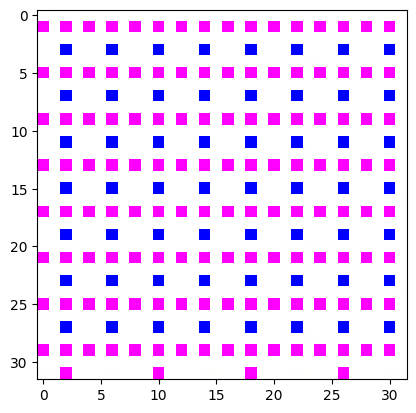

Epoch 208/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


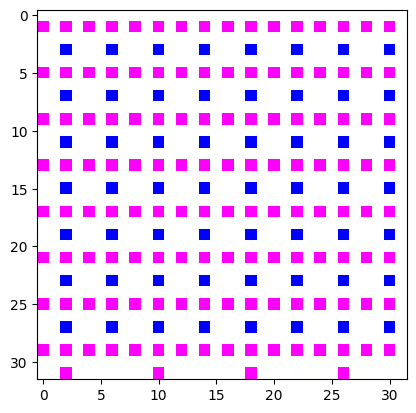

Epoch 209/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


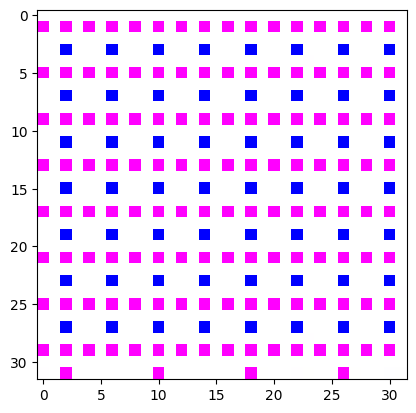

Epoch 210/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


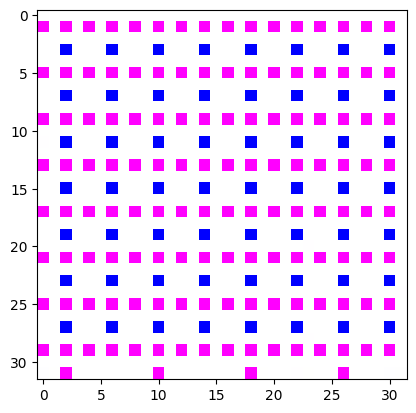

Epoch 211/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


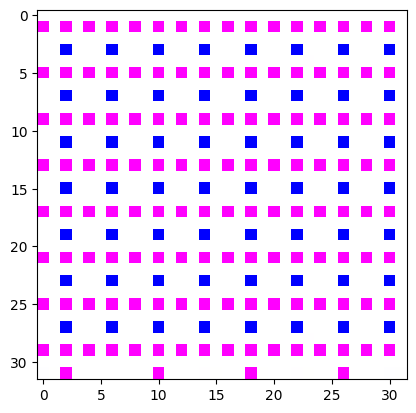

Epoch 212/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


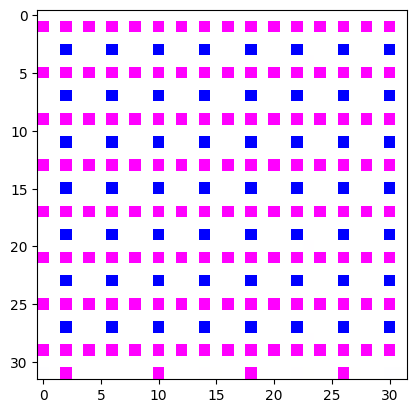

Epoch 213/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


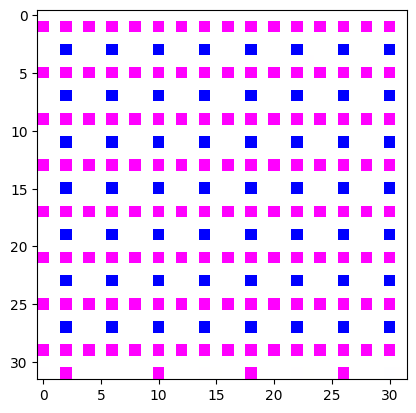

Epoch 214/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


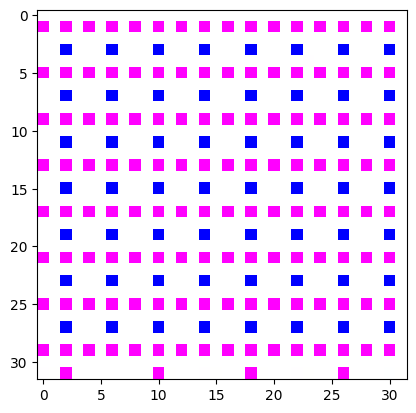

Epoch 215/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


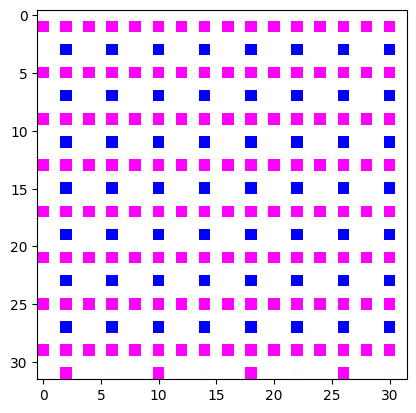

Epoch 216/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


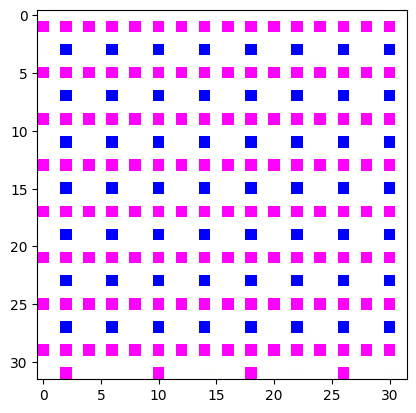

Epoch 217/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


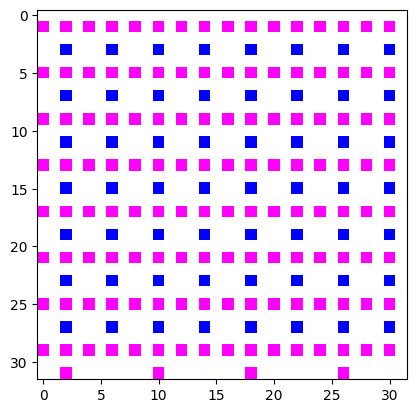

Epoch 218/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


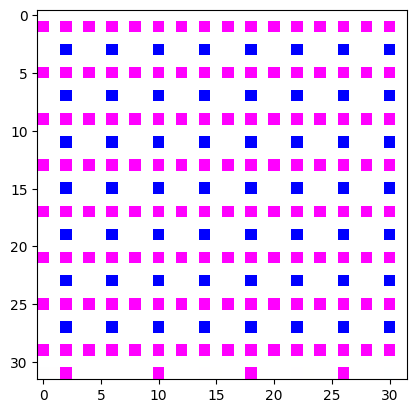

Epoch 219/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


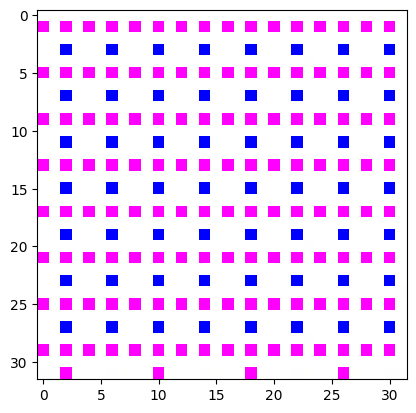

Epoch 220/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


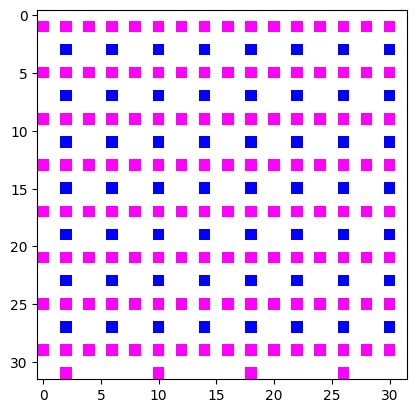

Epoch 221/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


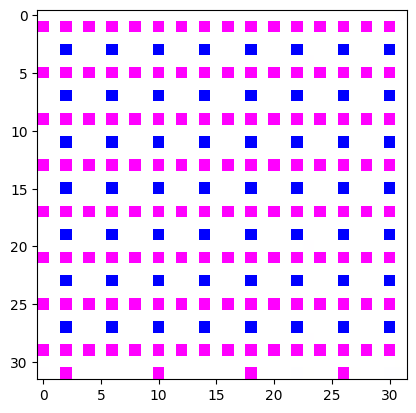

Epoch 222/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


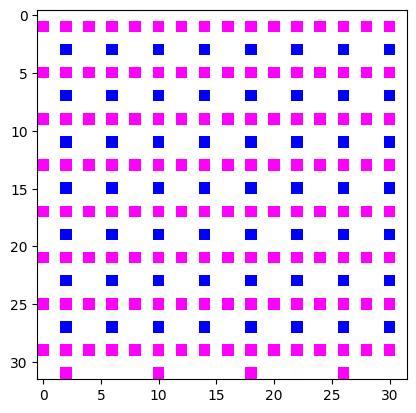

Epoch 223/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


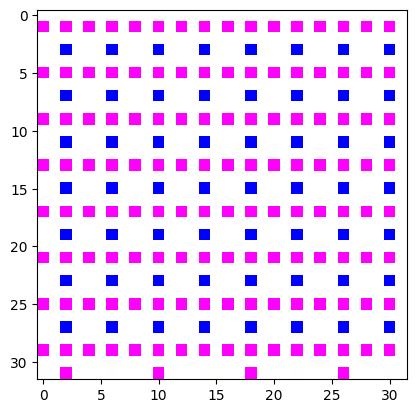

Epoch 224/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


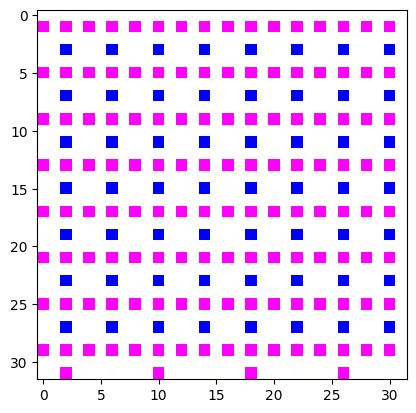

Epoch 225/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


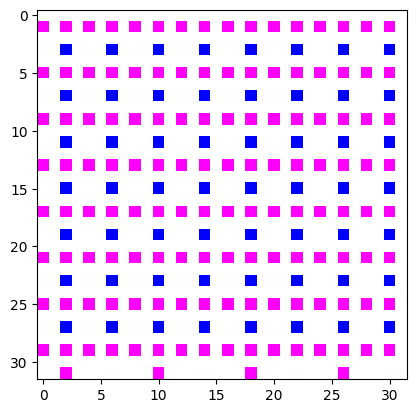

Epoch 226/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


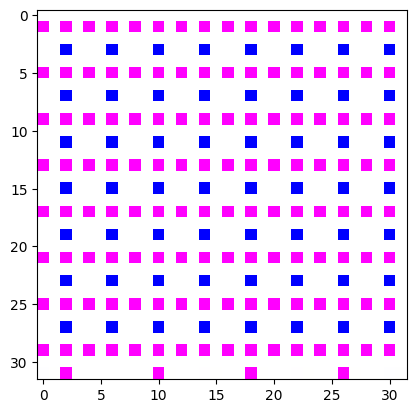

Epoch 227/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


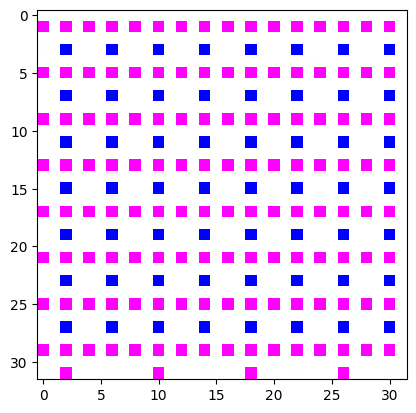

Epoch 228/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


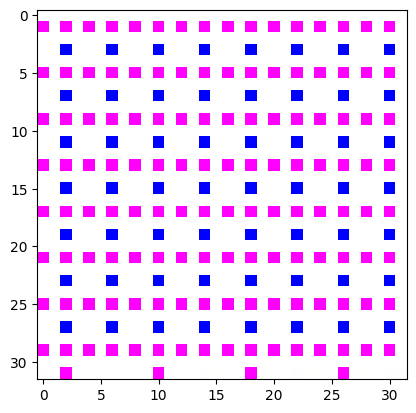

Epoch 229/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


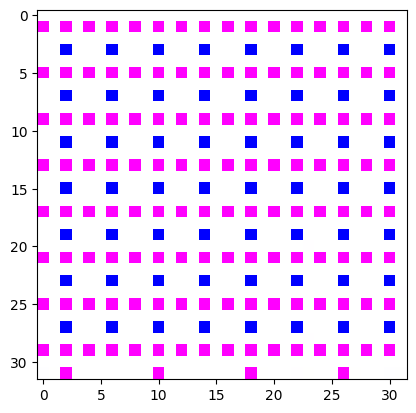

Epoch 230/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


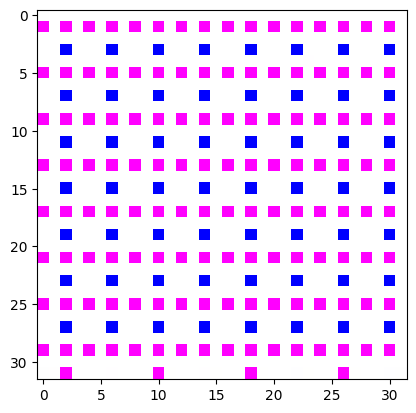

Epoch 231/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


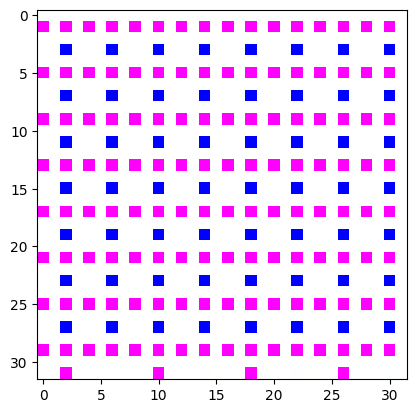

Epoch 232/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


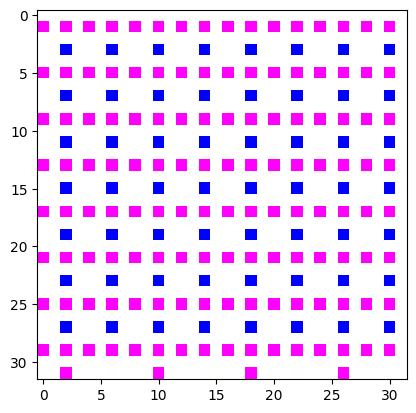

Epoch 233/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


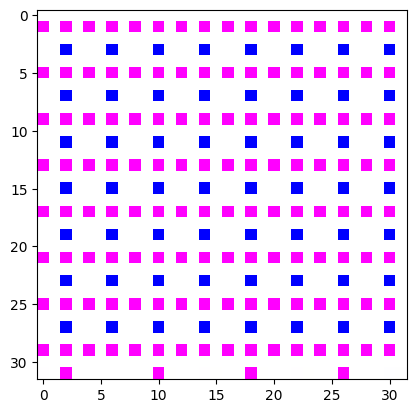

Epoch 234/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


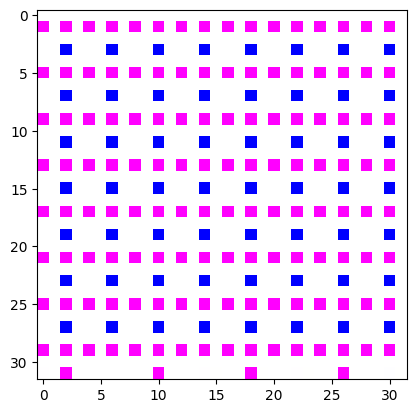

Epoch 235/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


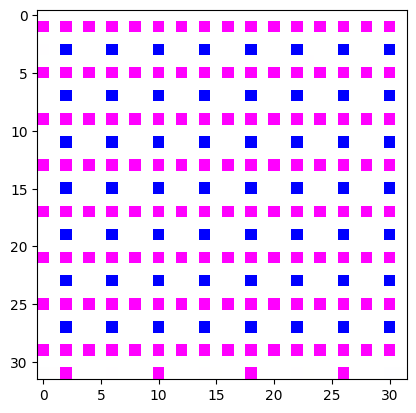

Epoch 236/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


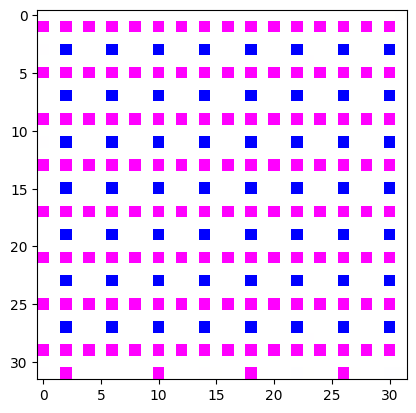

Epoch 237/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


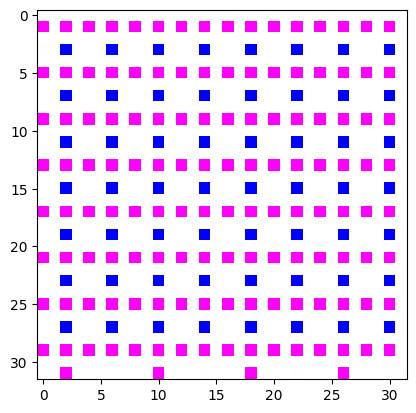

Epoch 238/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


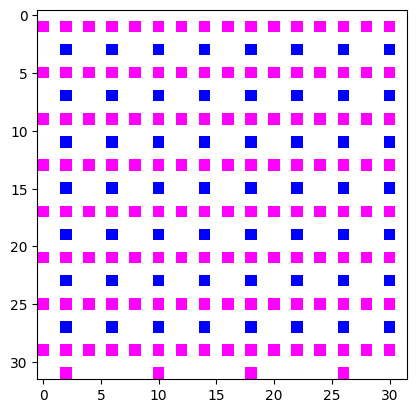

Epoch 239/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


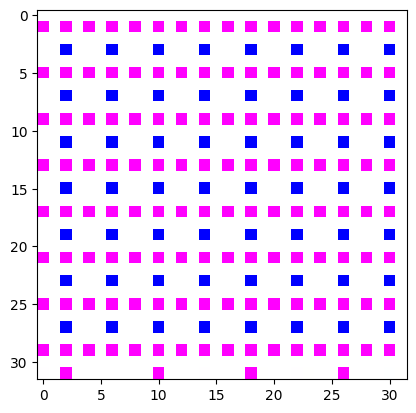

Epoch 240/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


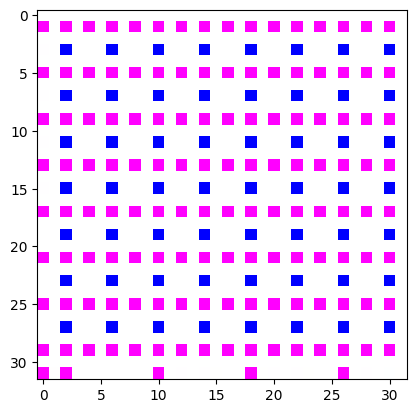

Epoch 241/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


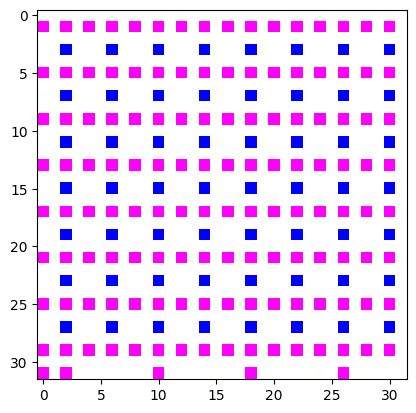

Epoch 242/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


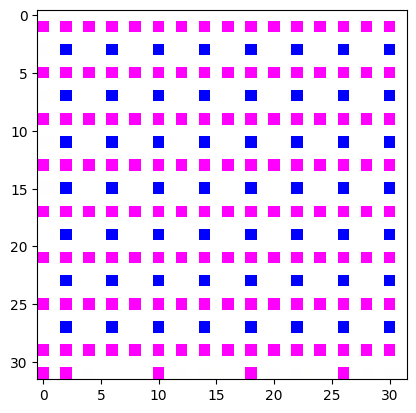

Epoch 243/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


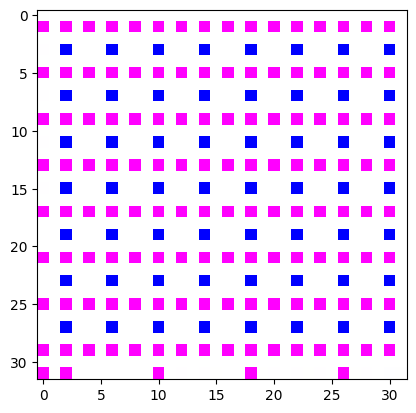

Epoch 244/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


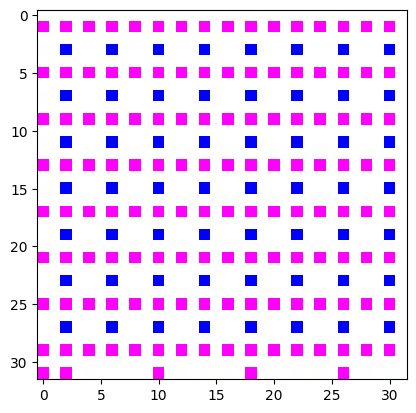

Epoch 245/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


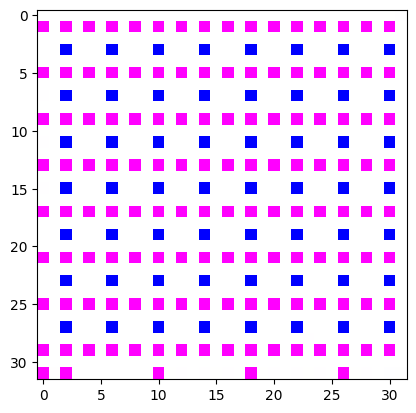

Epoch 246/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


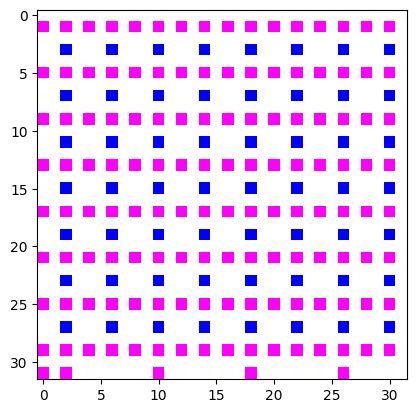

Epoch 247/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


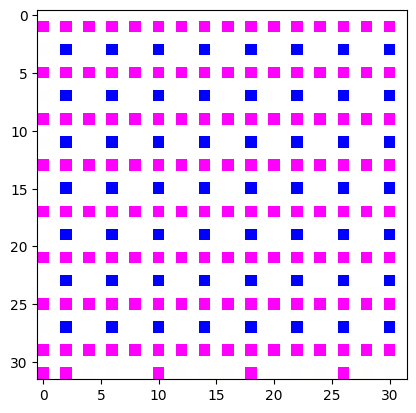

Epoch 248/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


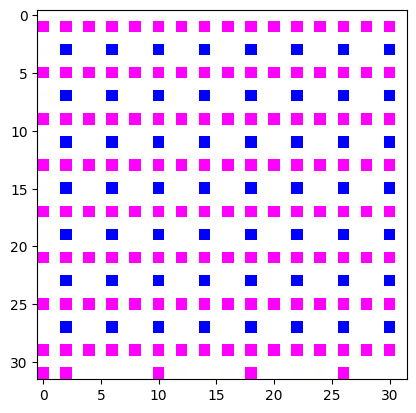

Epoch 249/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


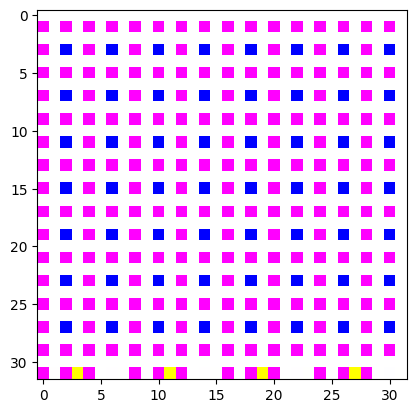

Epoch 250/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


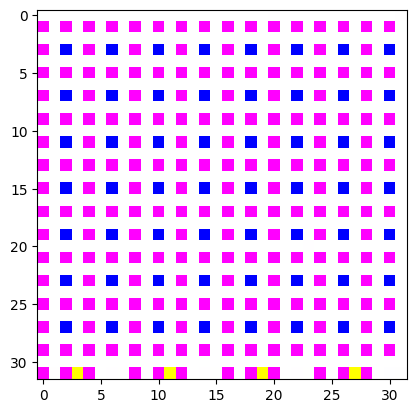

Epoch 251/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


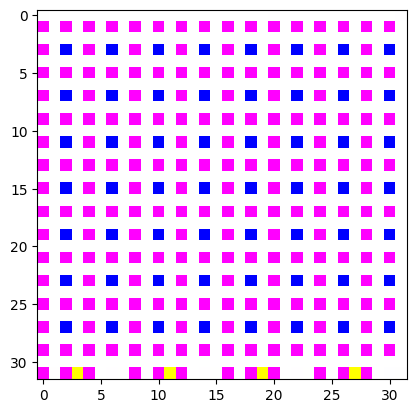

Epoch 252/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


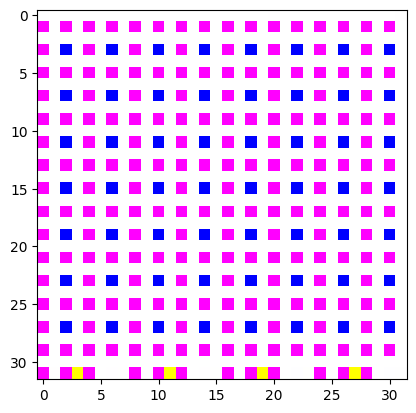

Epoch 253/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


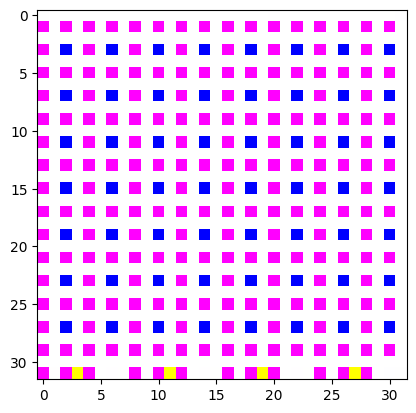

Epoch 254/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


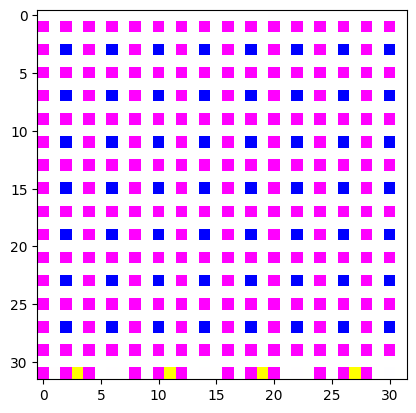

Epoch 255/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


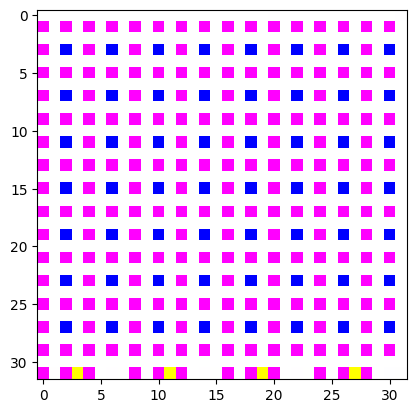

Epoch 256/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


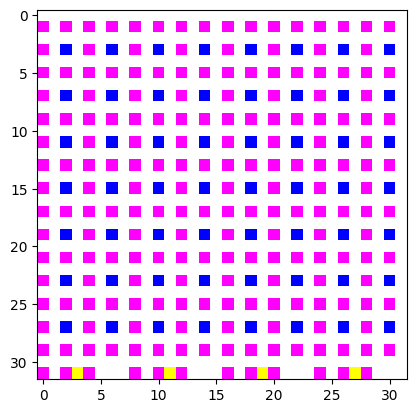

Epoch 257/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


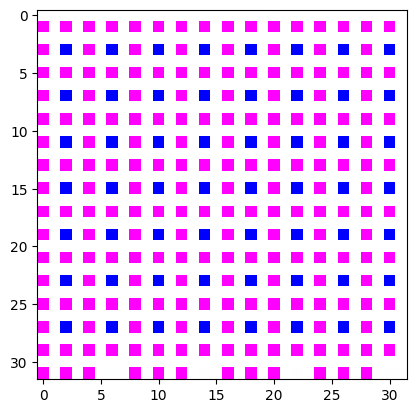

Epoch 258/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


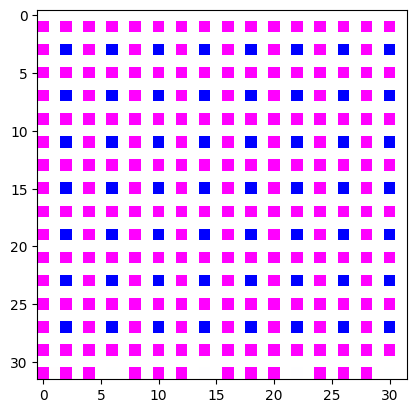

Epoch 259/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


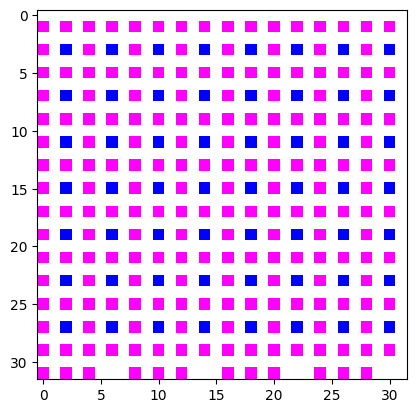

Epoch 260/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


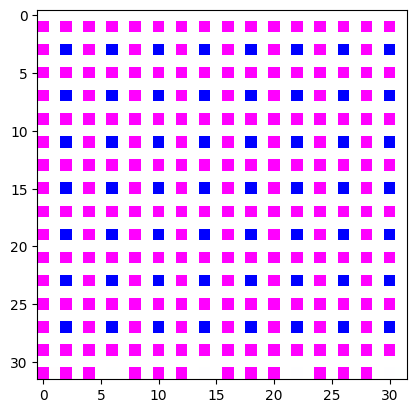

Epoch 261/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


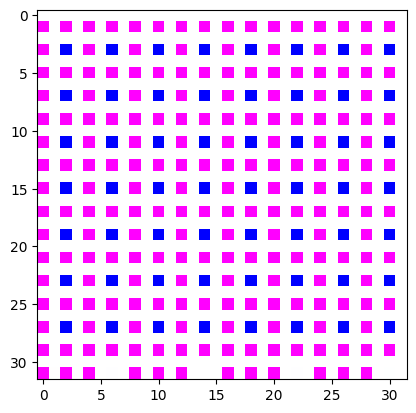

Epoch 262/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


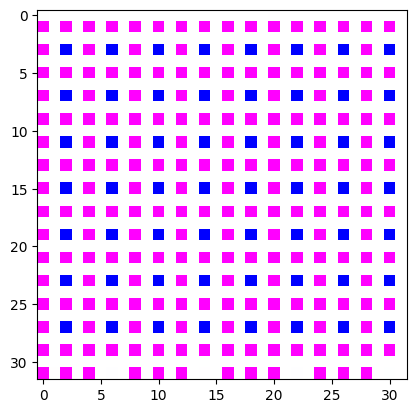

Epoch 263/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


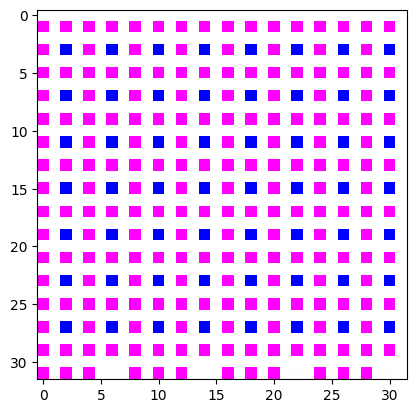

Epoch 264/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


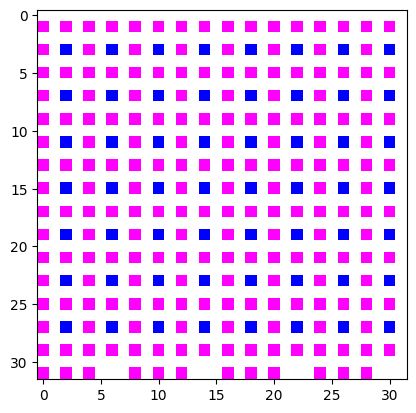

Epoch 265/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


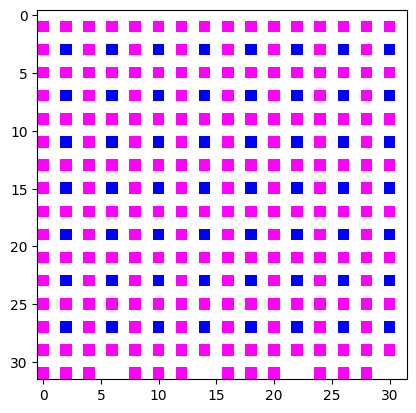

Epoch 266/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


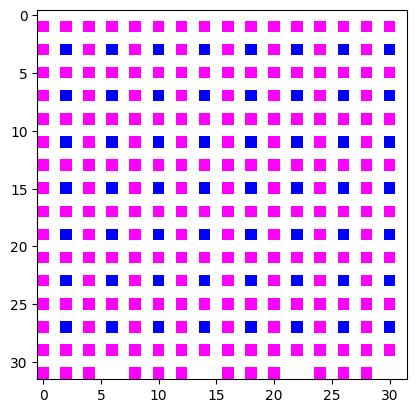

Epoch 267/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


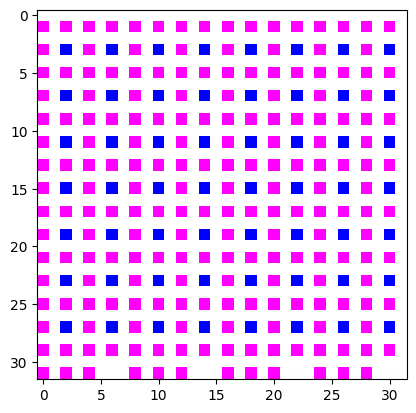

Epoch 268/1000


100%|██████████| 100/100 [00:18<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


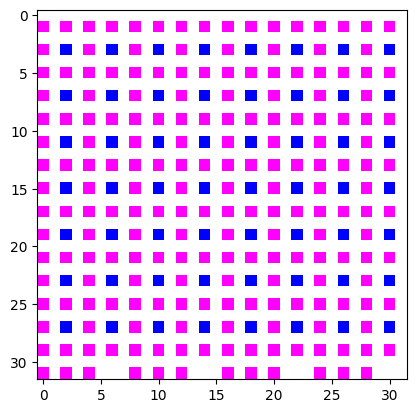

Epoch 269/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


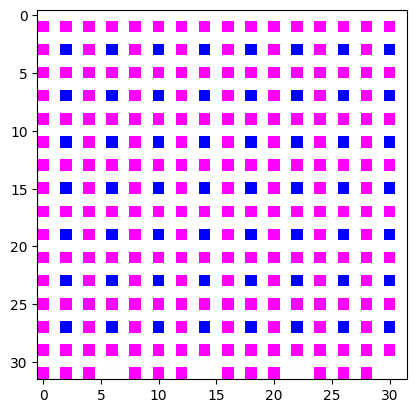

Epoch 270/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


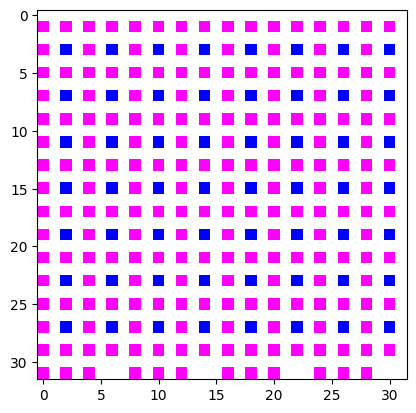

Epoch 271/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


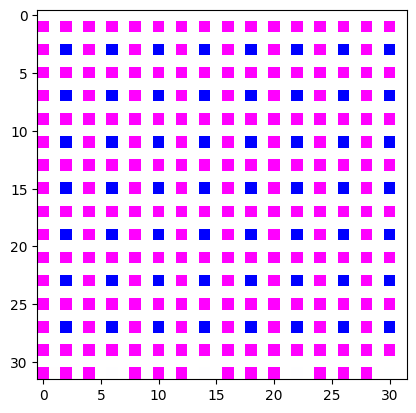

Epoch 272/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


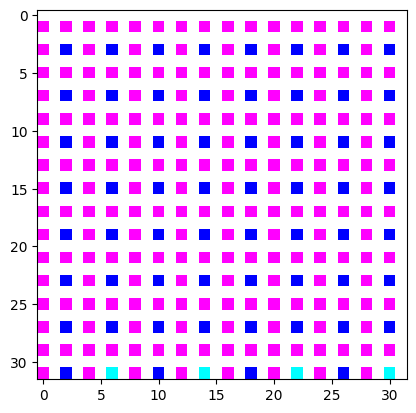

Epoch 273/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


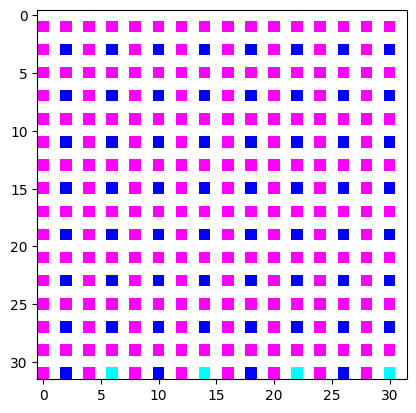

Epoch 274/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


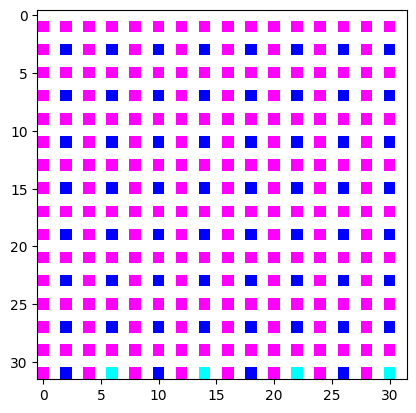

Epoch 275/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


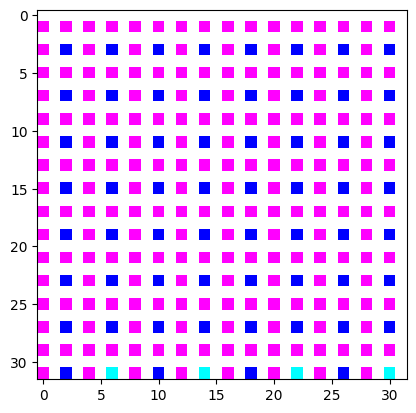

Epoch 276/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


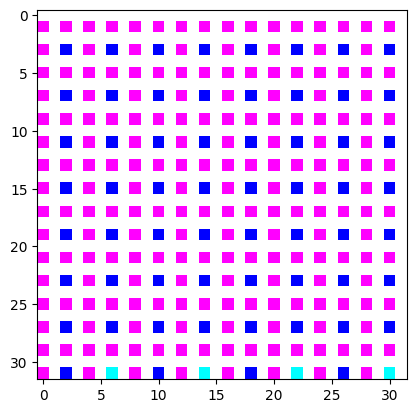

Epoch 277/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


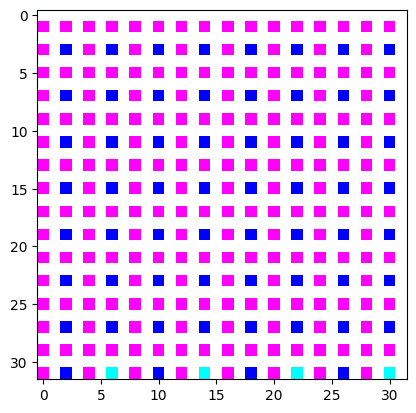

Epoch 278/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


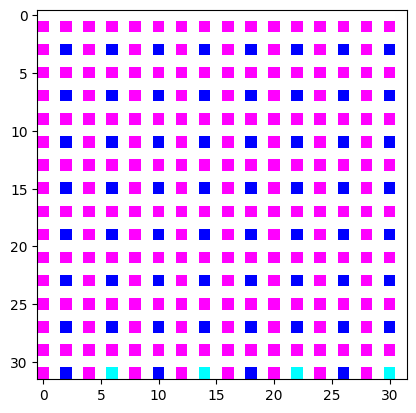

Epoch 279/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


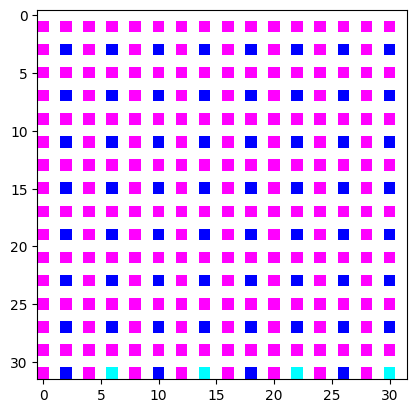

Epoch 280/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


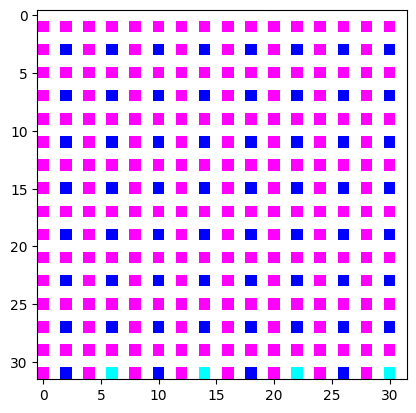

Epoch 281/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


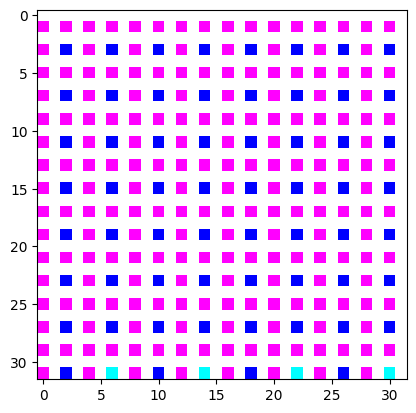

Epoch 282/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


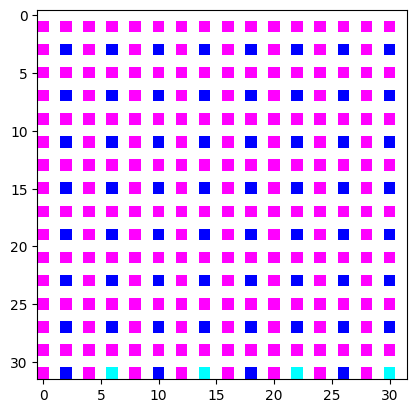

Epoch 283/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


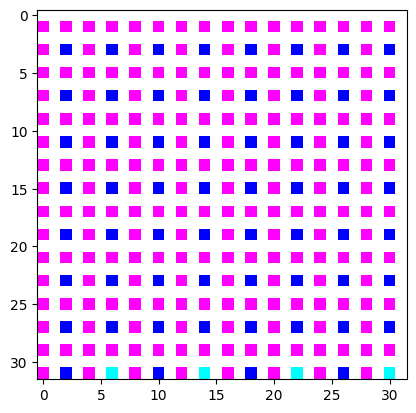

Epoch 284/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


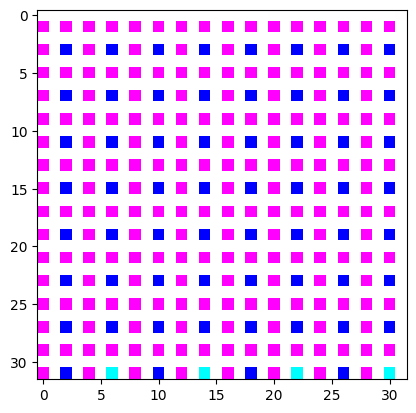

Epoch 285/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


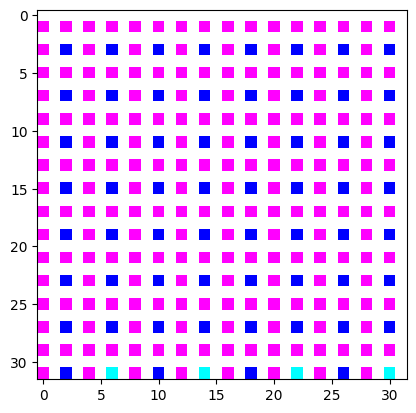

Epoch 286/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


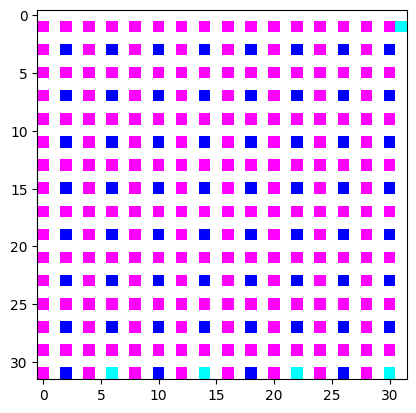

Epoch 287/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


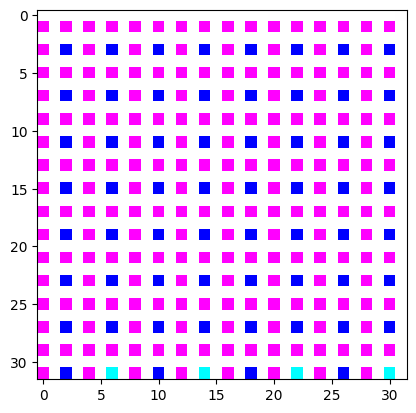

Epoch 288/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


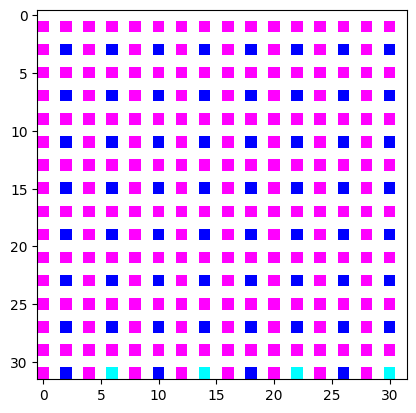

Epoch 289/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


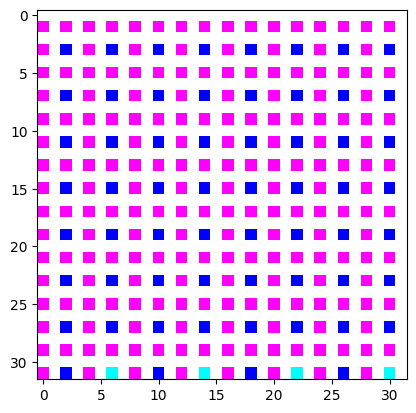

Epoch 290/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


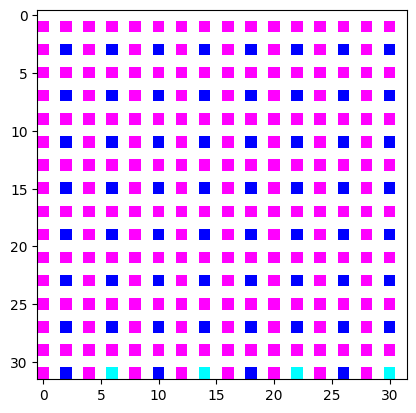

Epoch 291/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


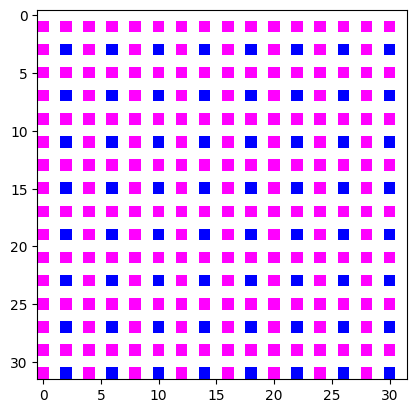

Epoch 292/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


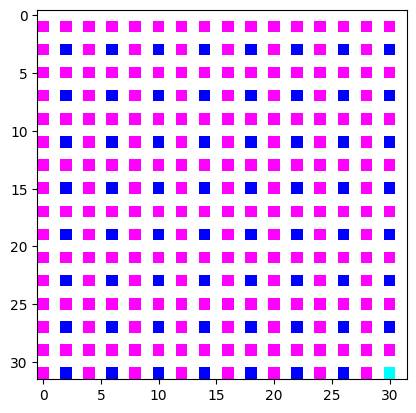

Epoch 293/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


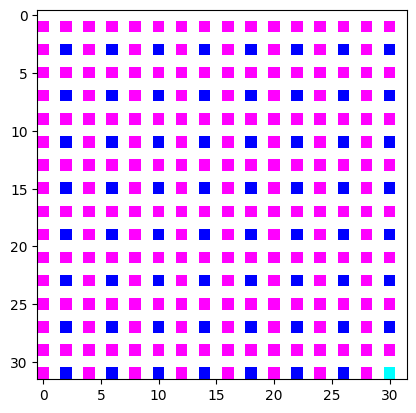

Epoch 294/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


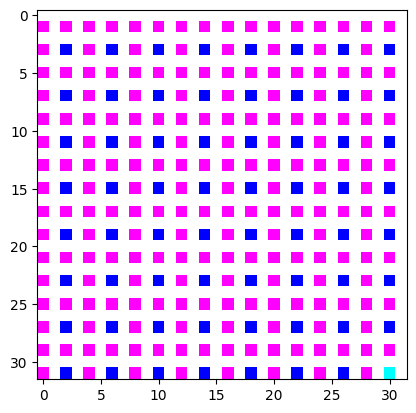

Epoch 295/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


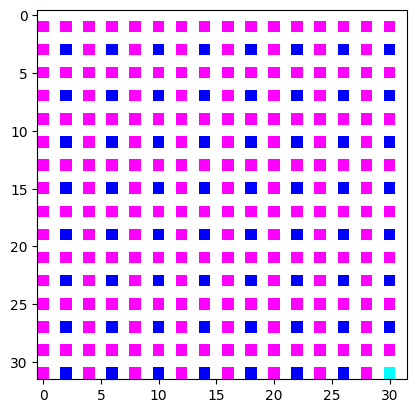

Epoch 296/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


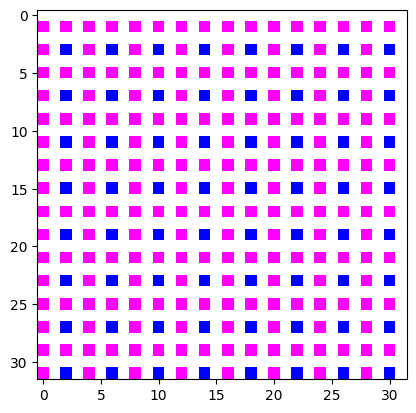

Epoch 297/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


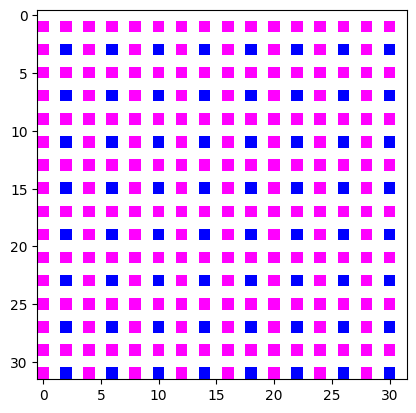

Epoch 298/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


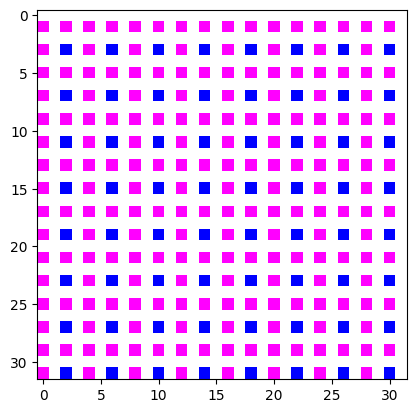

Epoch 299/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


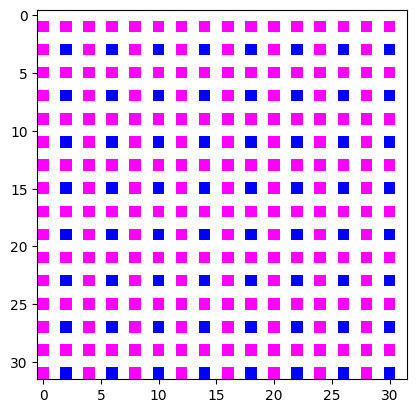

Epoch 300/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


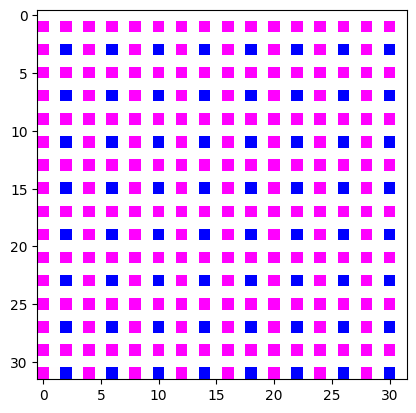

Epoch 301/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


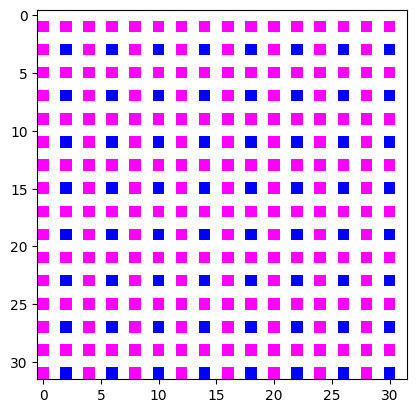

Epoch 302/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


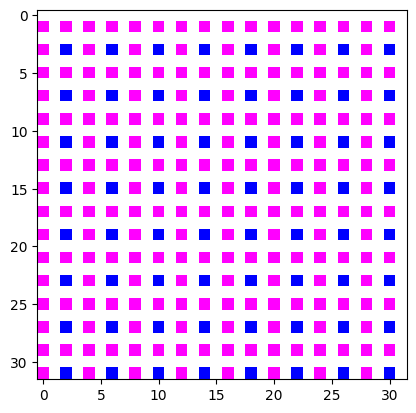

Epoch 303/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


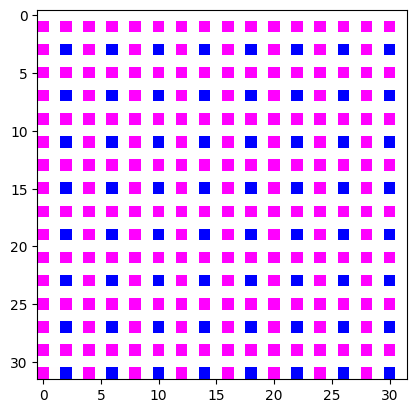

Epoch 304/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


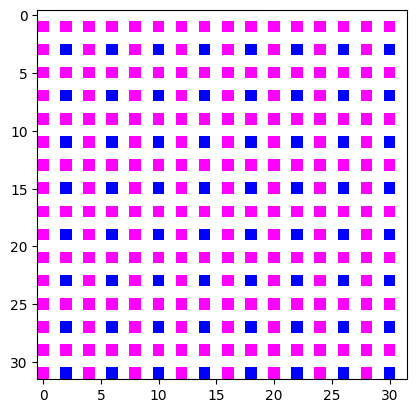

Epoch 305/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


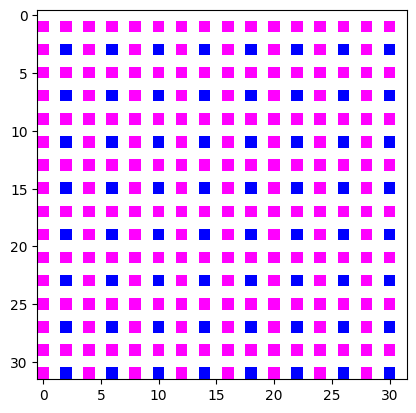

Epoch 306/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


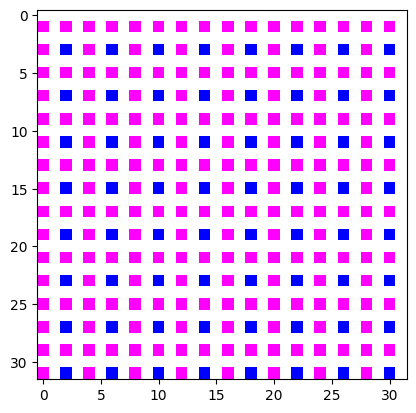

Epoch 307/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


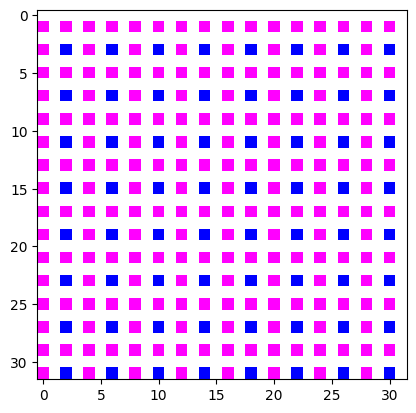

Epoch 308/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


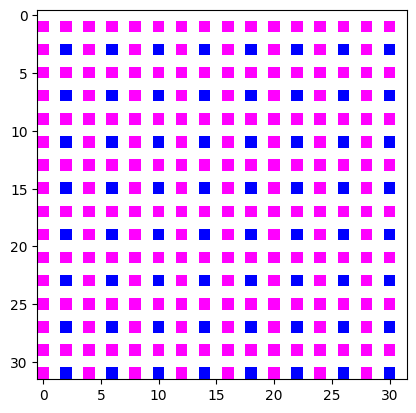

Epoch 309/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


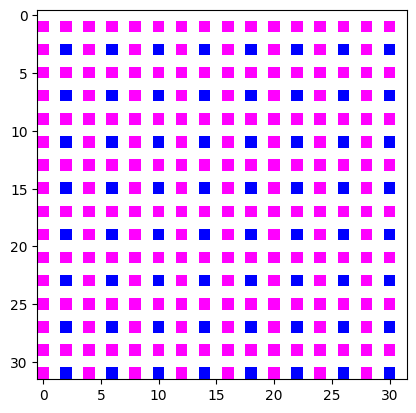

Epoch 310/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


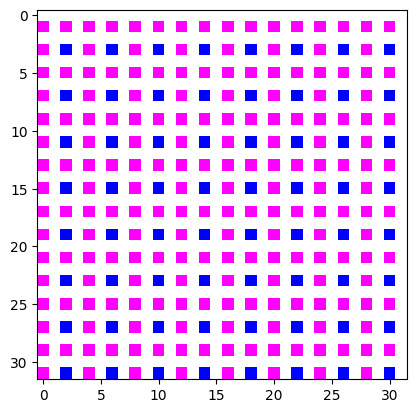

Epoch 311/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


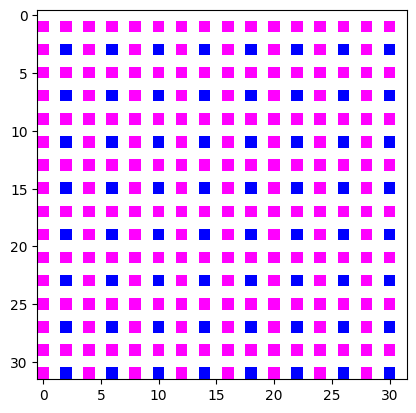

Epoch 312/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


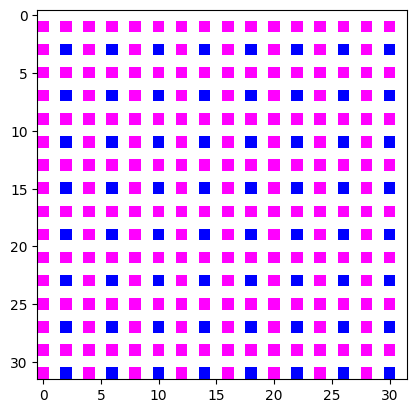

Epoch 313/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


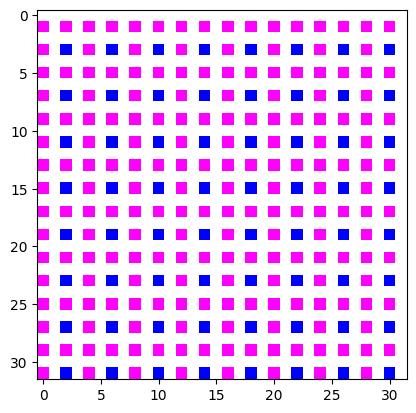

Epoch 314/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


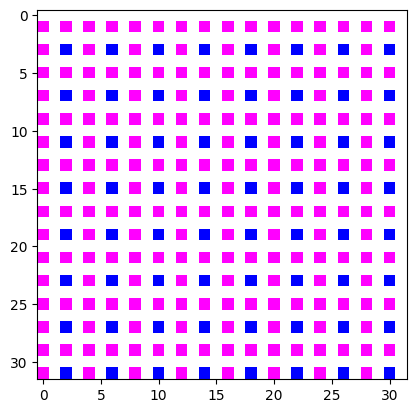

Epoch 315/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


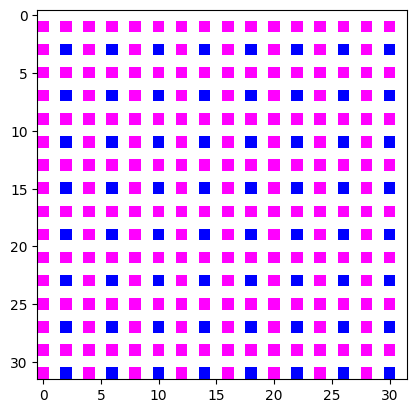

Epoch 316/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


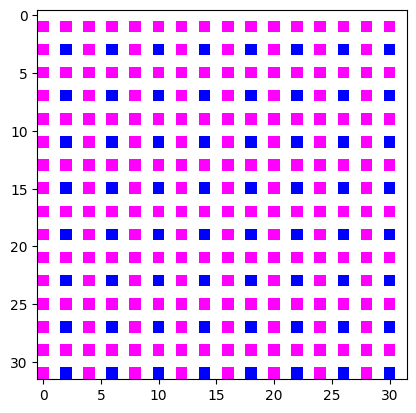

Epoch 317/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


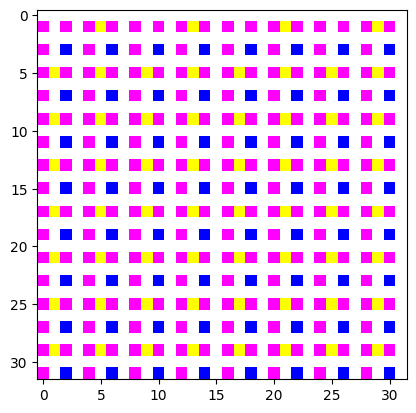

Epoch 318/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


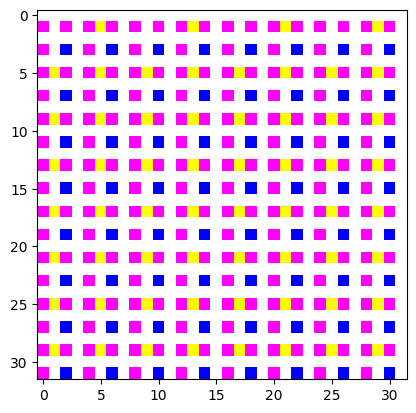

Epoch 319/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


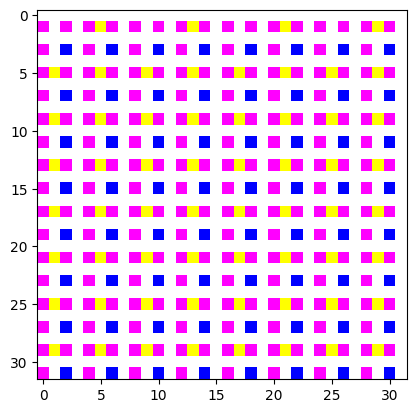

Epoch 320/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


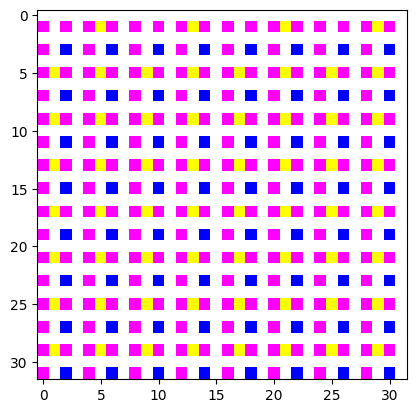

Epoch 321/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


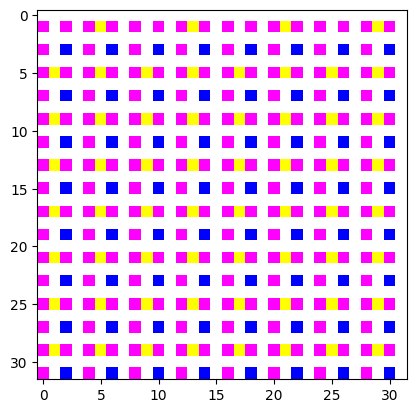

Epoch 322/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


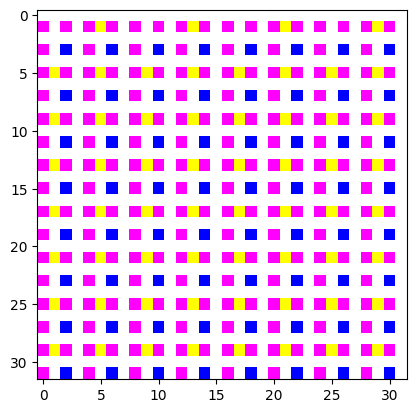

Epoch 323/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


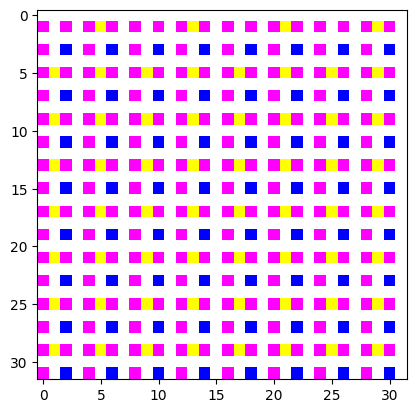

Epoch 324/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


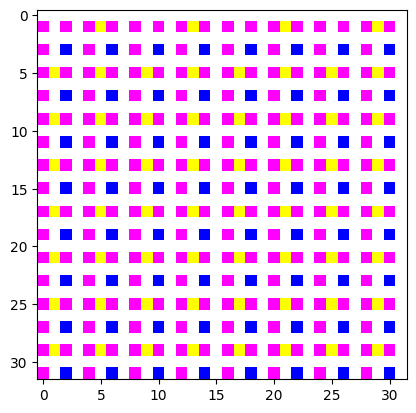

Epoch 325/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


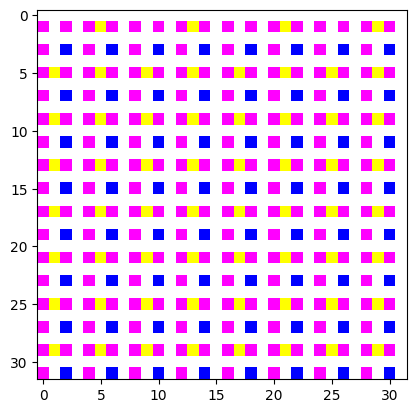

Epoch 326/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


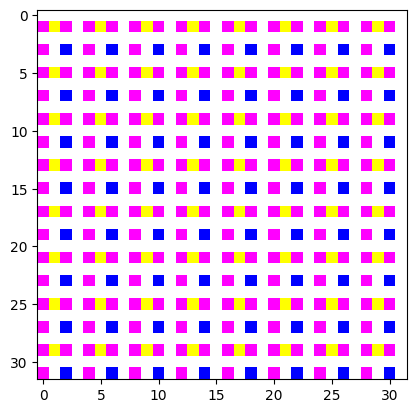

Epoch 327/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


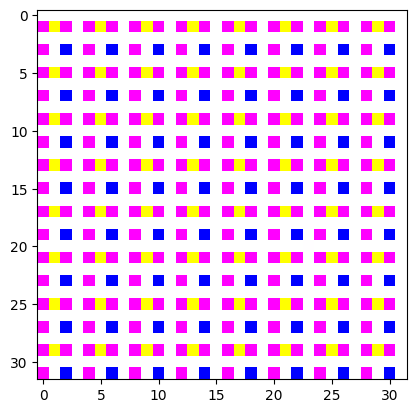

Epoch 328/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


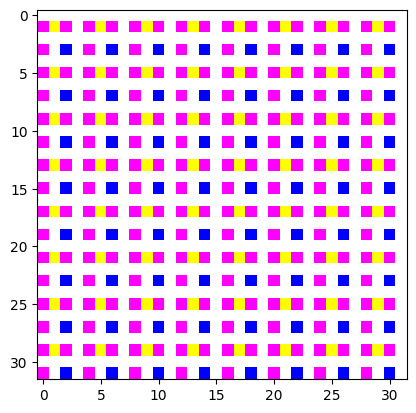

Epoch 329/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


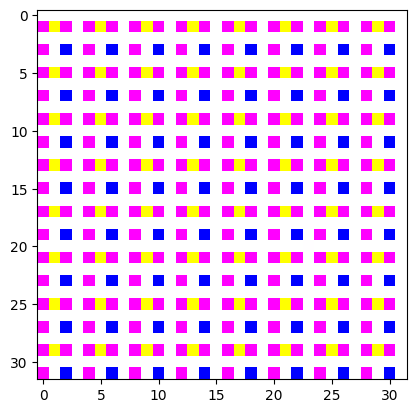

Epoch 330/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


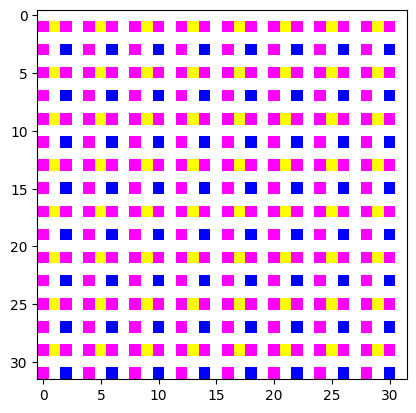

Epoch 331/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


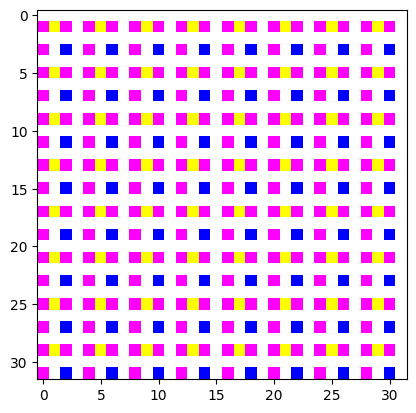

Epoch 332/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


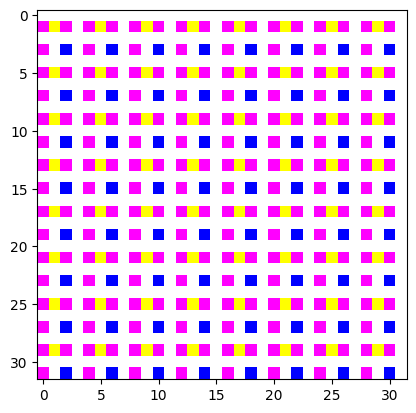

Epoch 333/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


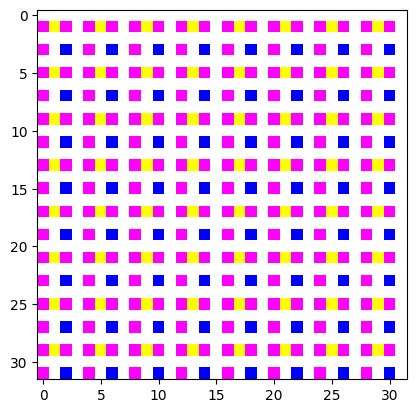

Epoch 334/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


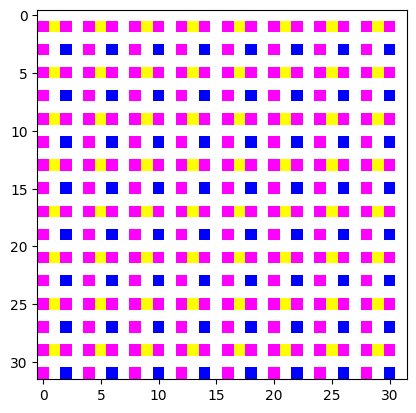

Epoch 335/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


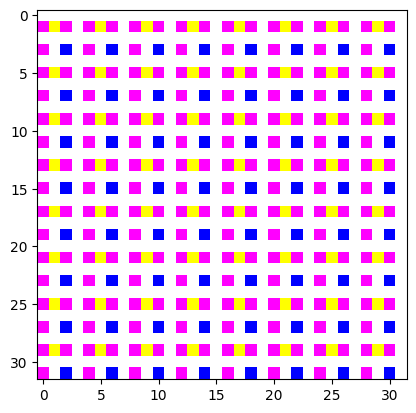

Epoch 336/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


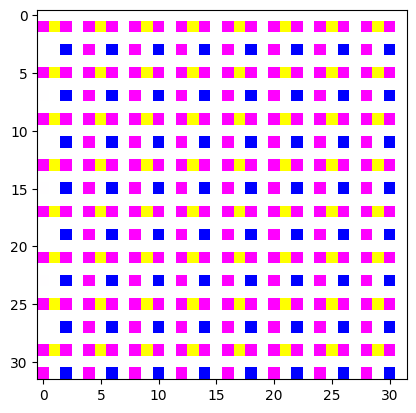

Epoch 337/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


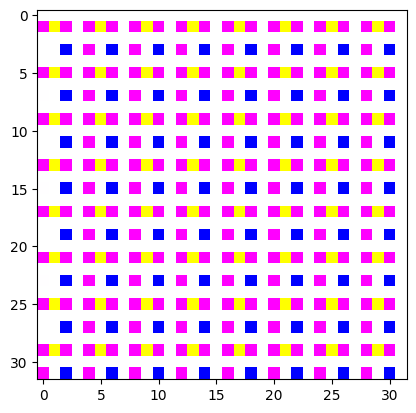

Epoch 338/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


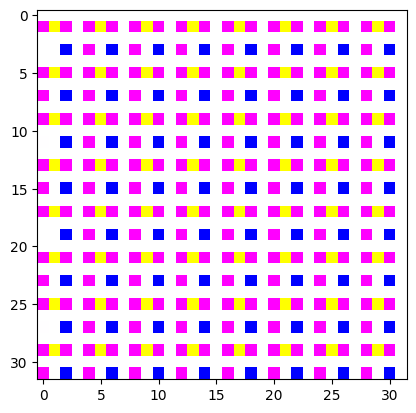

Epoch 339/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


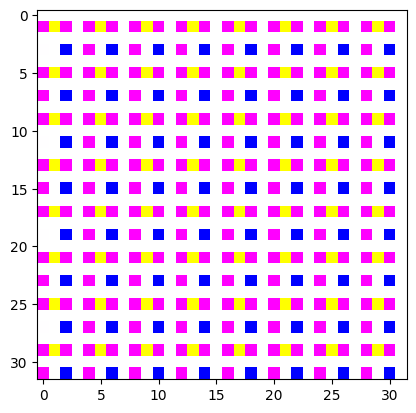

Epoch 340/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


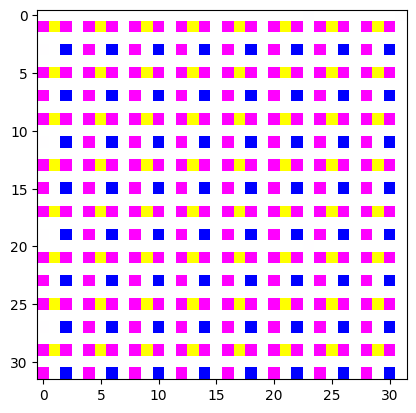

Epoch 341/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


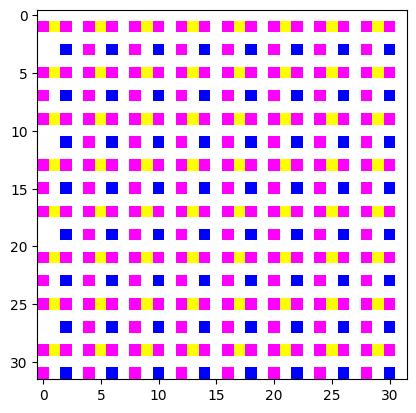

Epoch 342/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


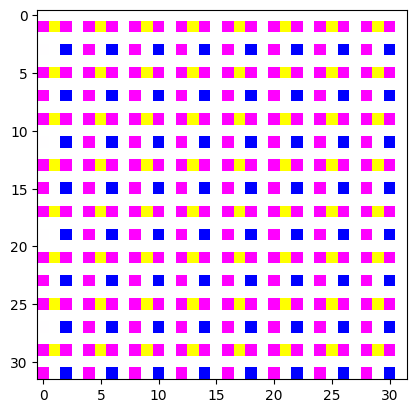

Epoch 343/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


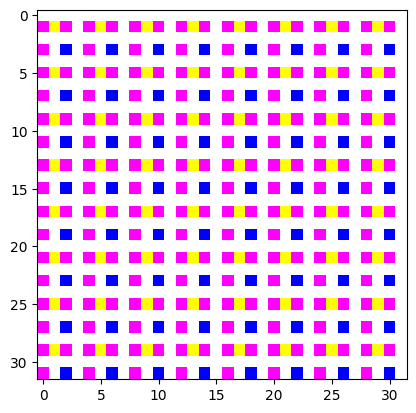

Epoch 344/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


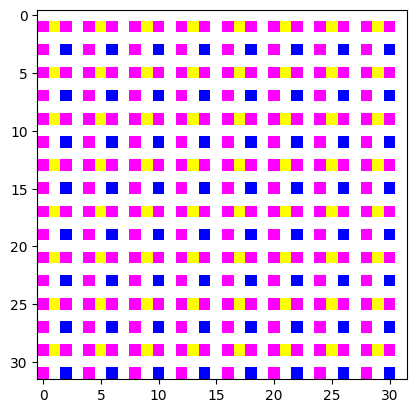

Epoch 345/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


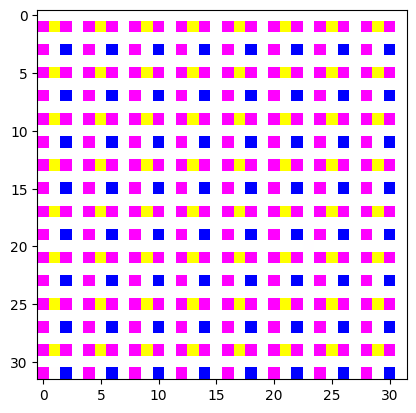

Epoch 346/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


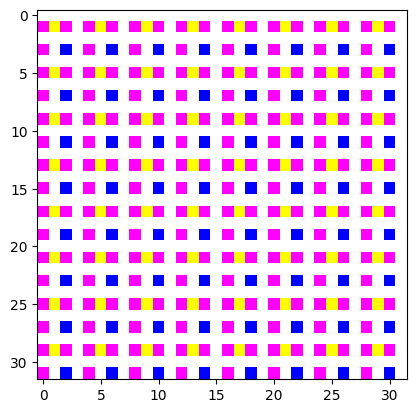

Epoch 347/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


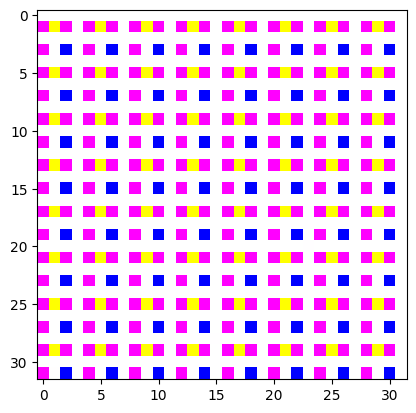

Epoch 348/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


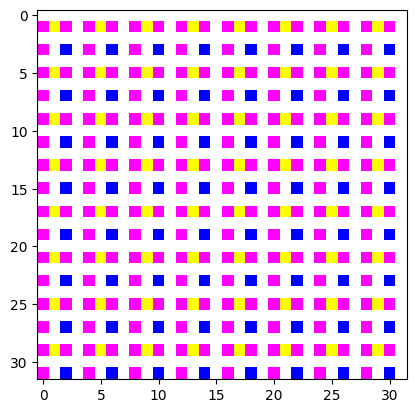

Epoch 349/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


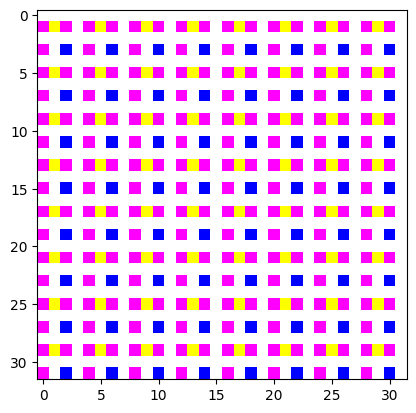

Epoch 350/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


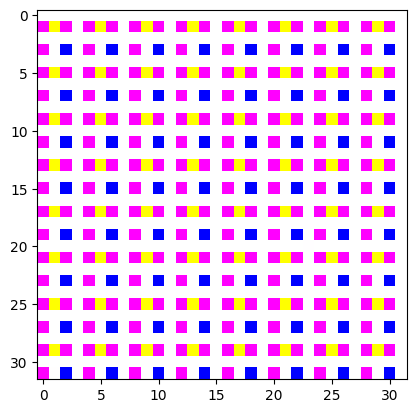

Epoch 351/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


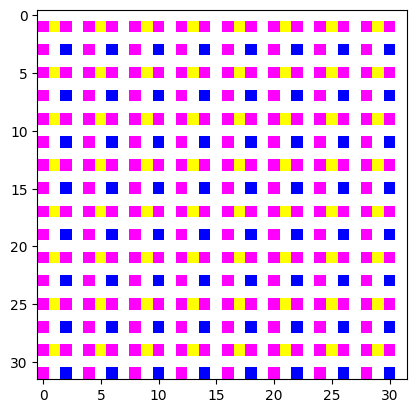

Epoch 352/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


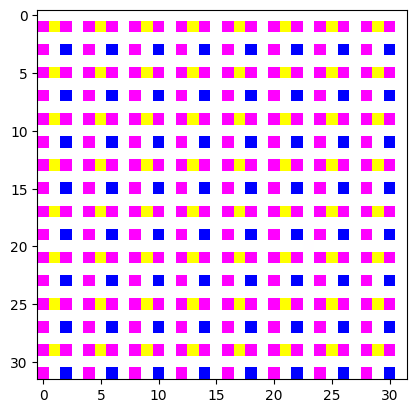

Epoch 353/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


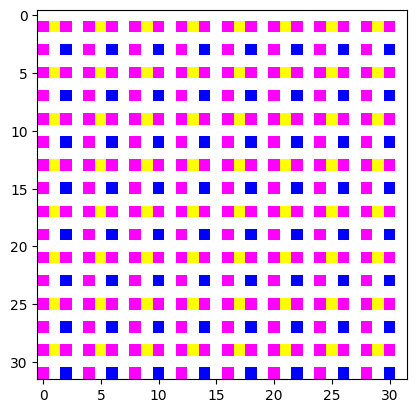

Epoch 354/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


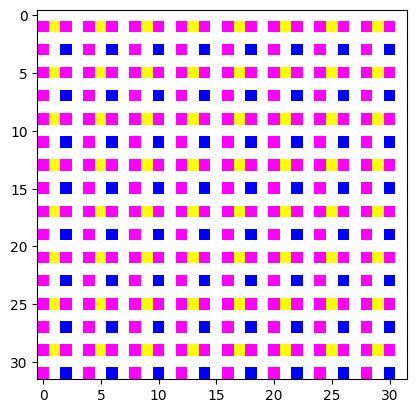

Epoch 355/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


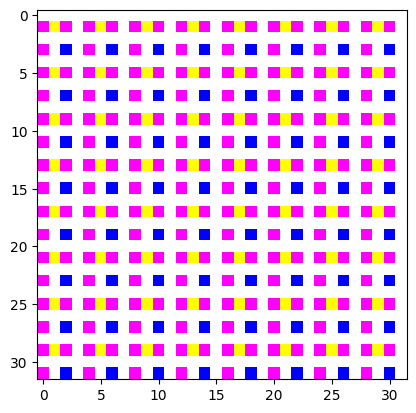

Epoch 356/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


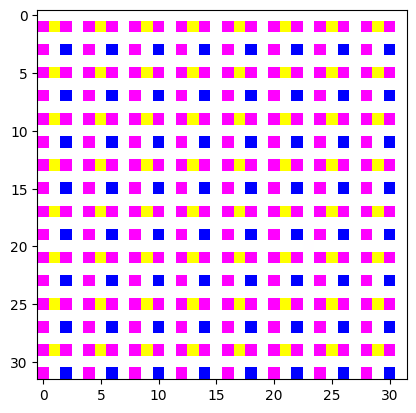

Epoch 357/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


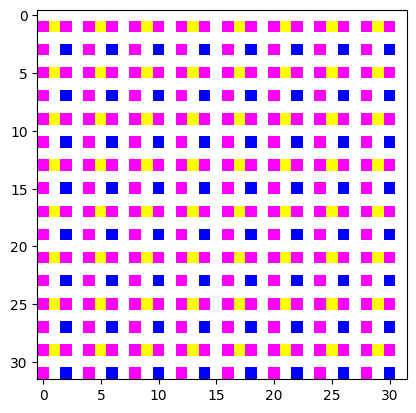

Epoch 358/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


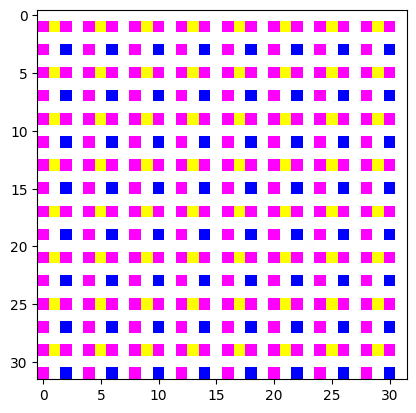

Epoch 359/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


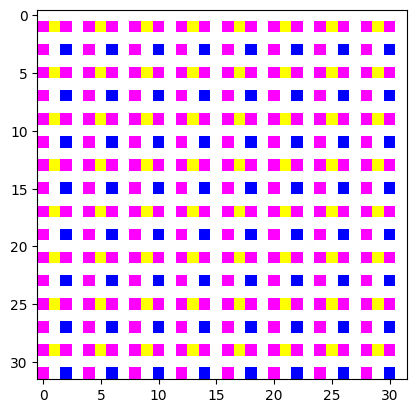

Epoch 360/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


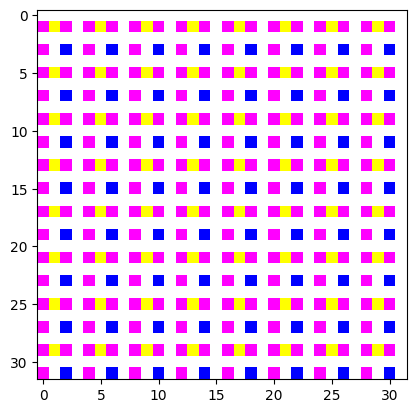

Epoch 361/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


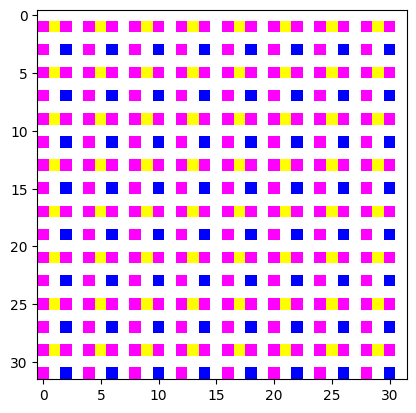

Epoch 362/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


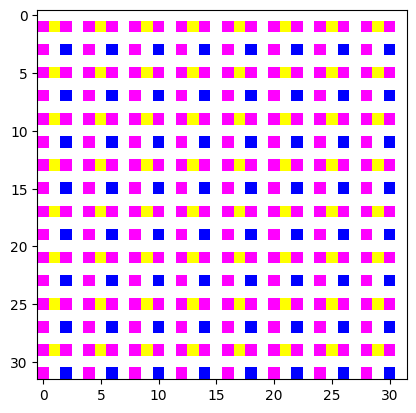

Epoch 363/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


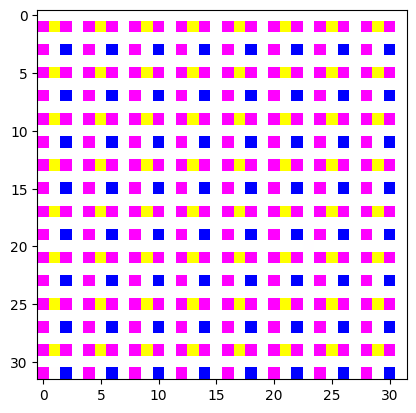

Epoch 364/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


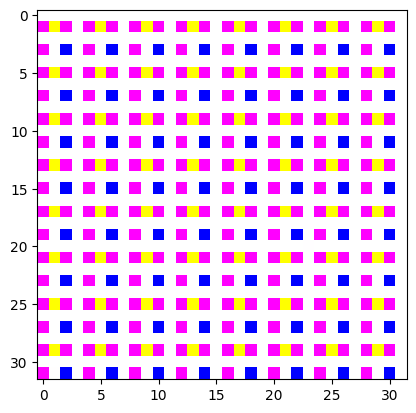

Epoch 365/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


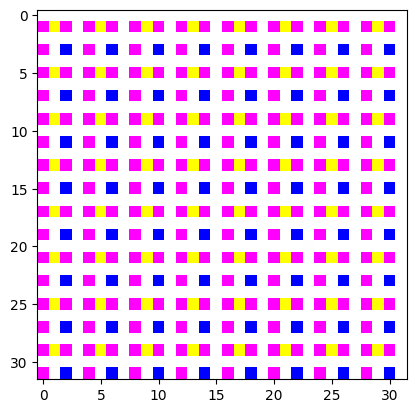

Epoch 366/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


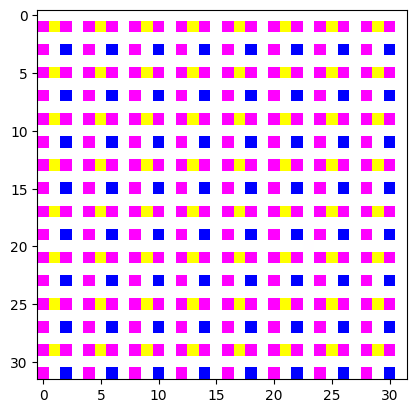

Epoch 367/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


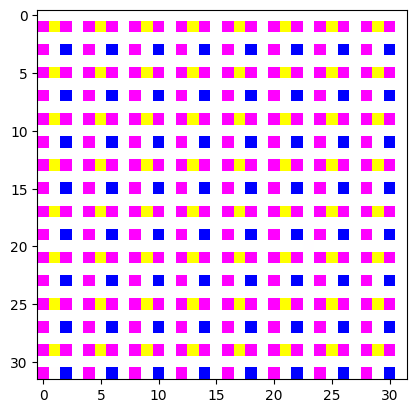

Epoch 368/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


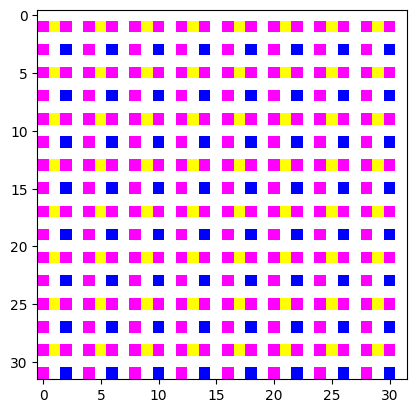

Epoch 369/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


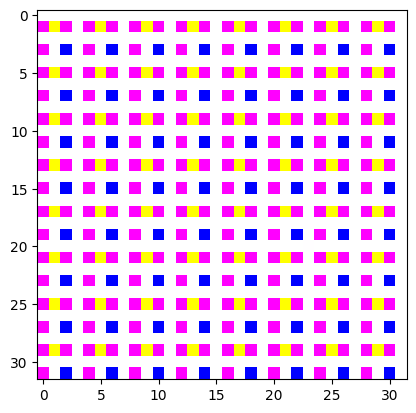

Epoch 370/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


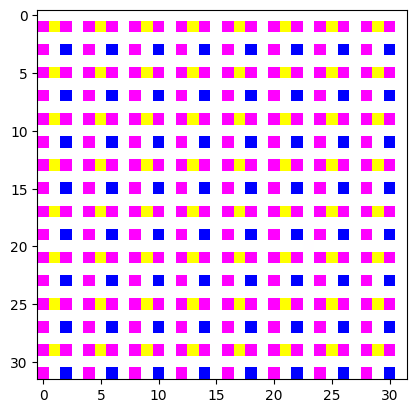

Epoch 371/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


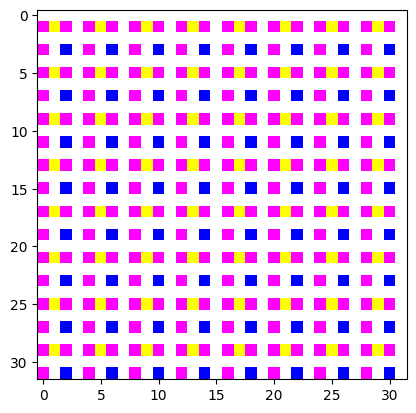

Epoch 372/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


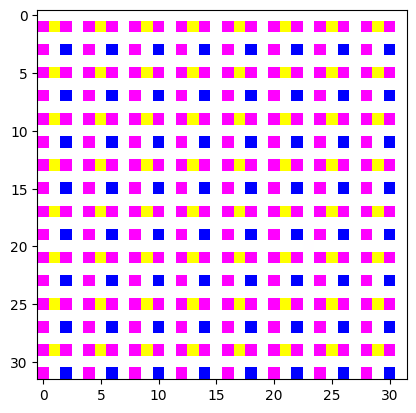

Epoch 373/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


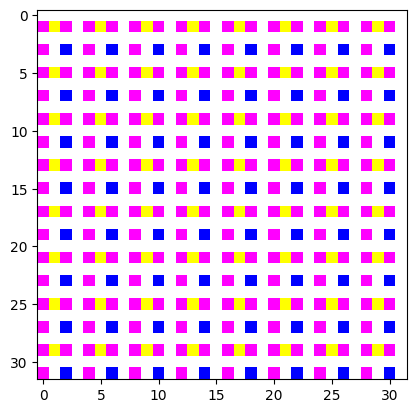

Epoch 374/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


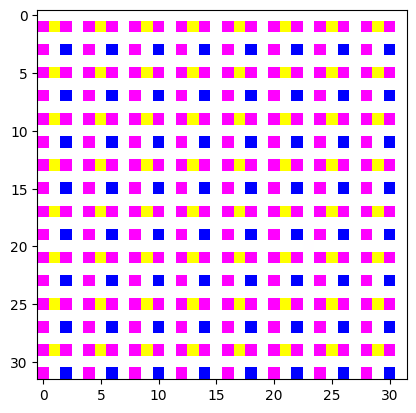

Epoch 375/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


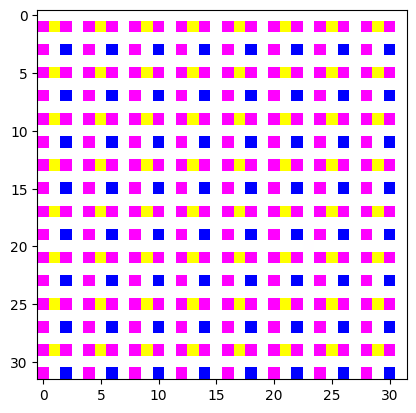

Epoch 376/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


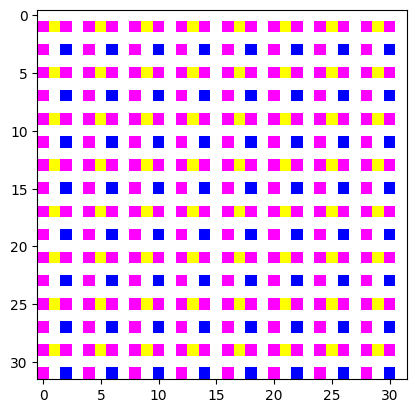

Epoch 377/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


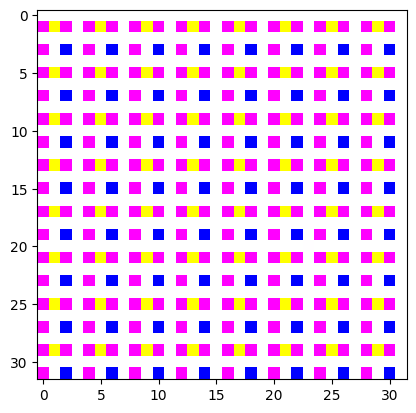

Epoch 378/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


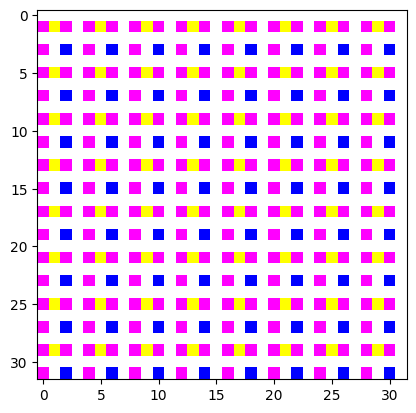

Epoch 379/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


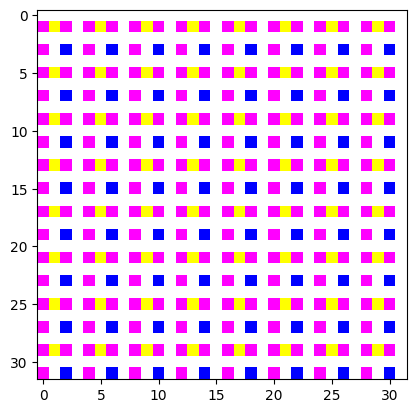

Epoch 380/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


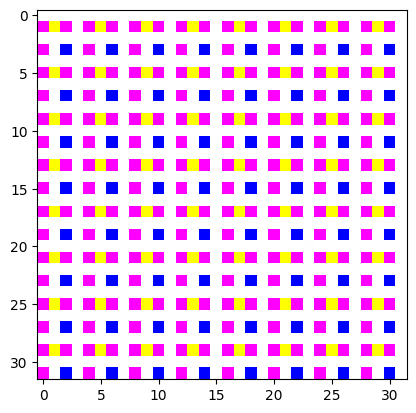

Epoch 381/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


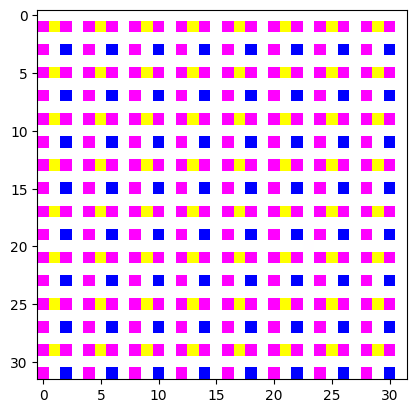

Epoch 382/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


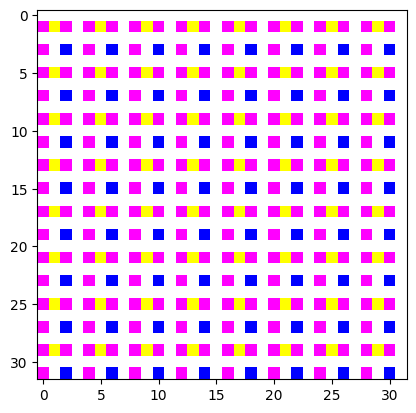

Epoch 383/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


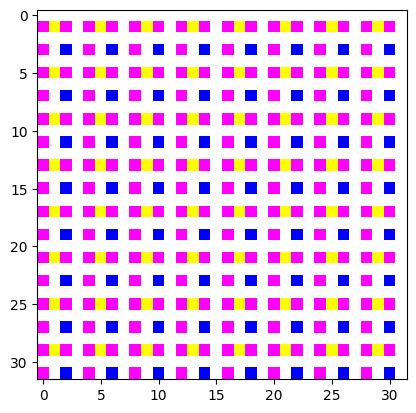

Epoch 384/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


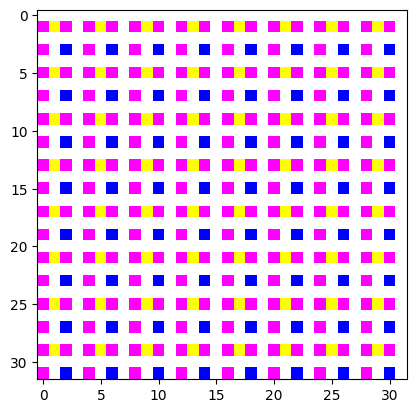

Epoch 385/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


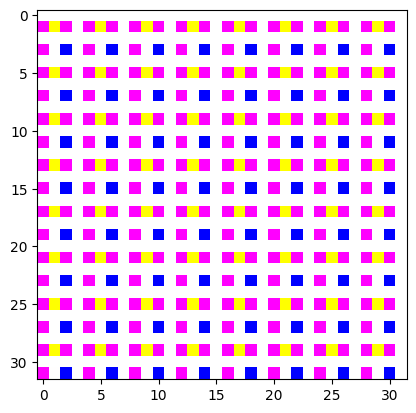

Epoch 386/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


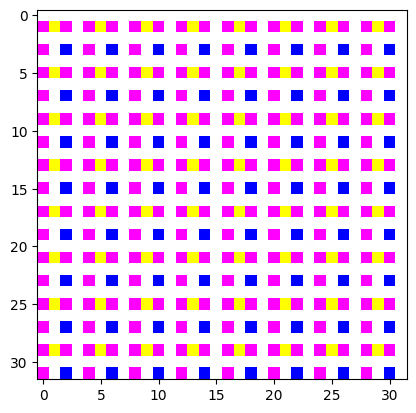

Epoch 387/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


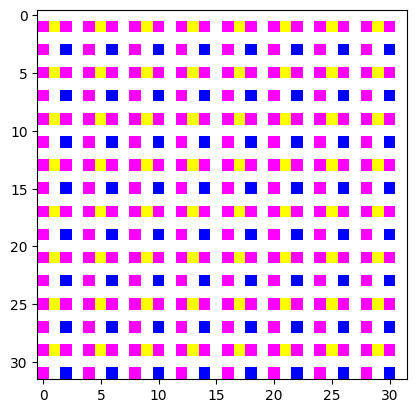

Epoch 388/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


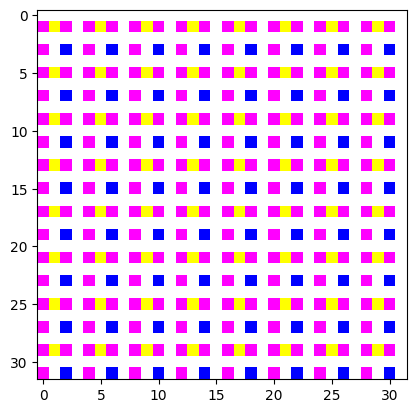

Epoch 389/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


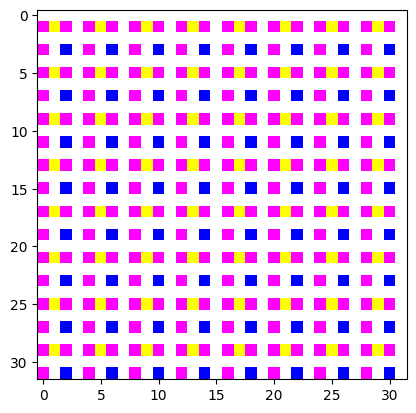

Epoch 390/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


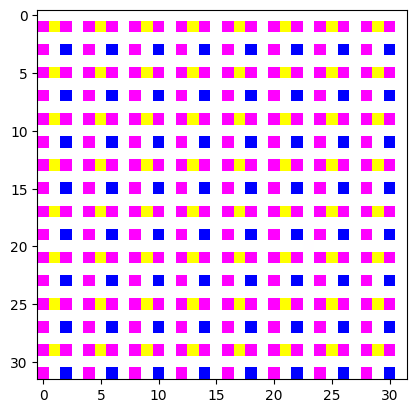

Epoch 391/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


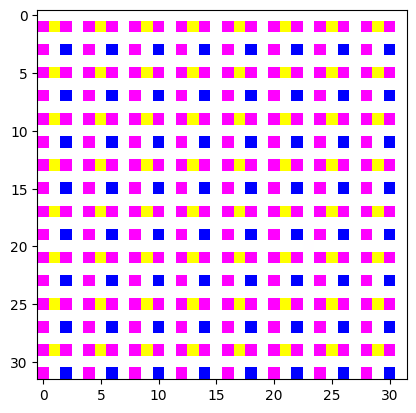

Epoch 392/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


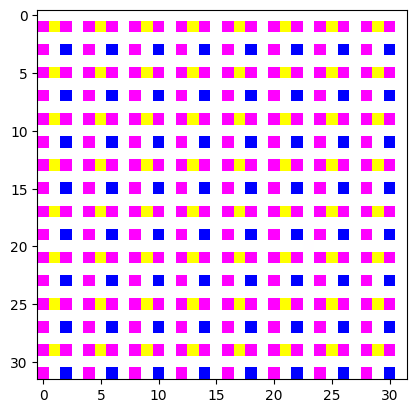

Epoch 393/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


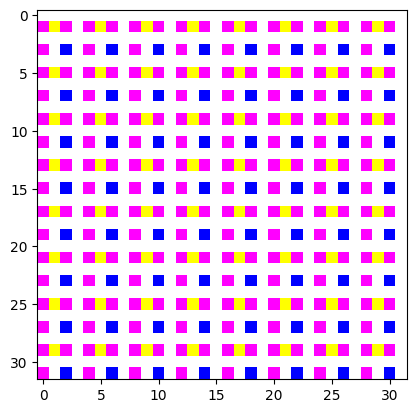

Epoch 394/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


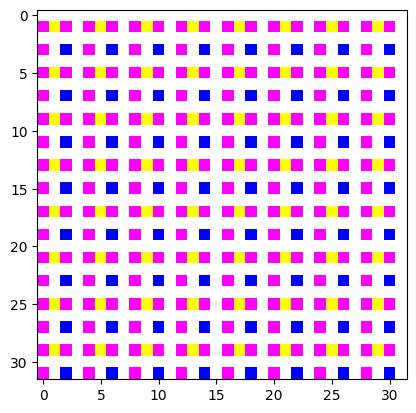

Epoch 395/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


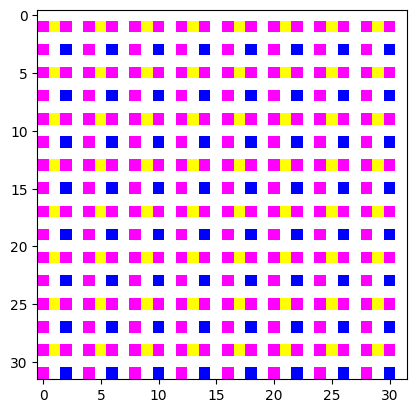

Epoch 396/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


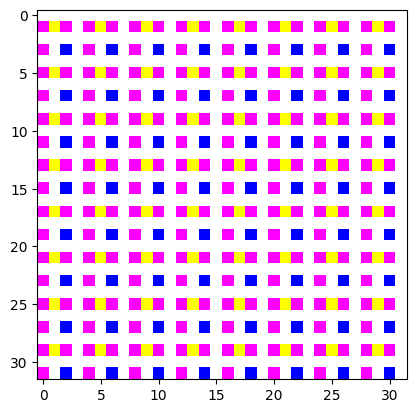

Epoch 397/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


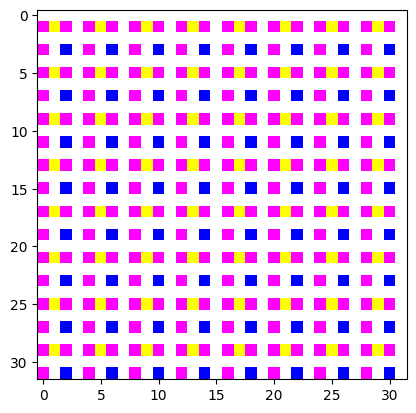

Epoch 398/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


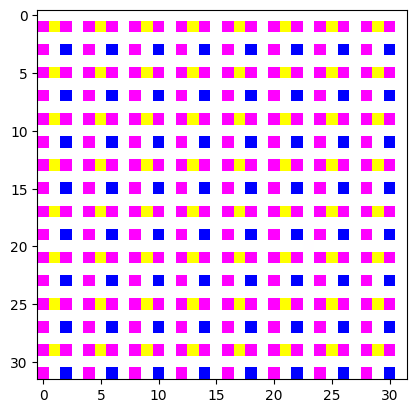

Epoch 399/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


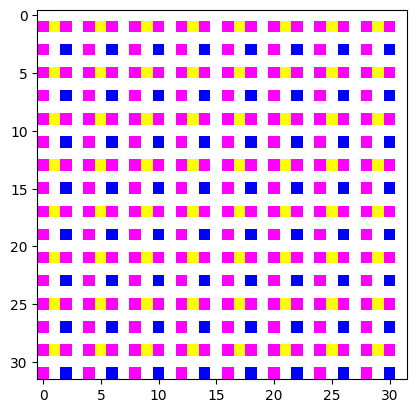

Epoch 400/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


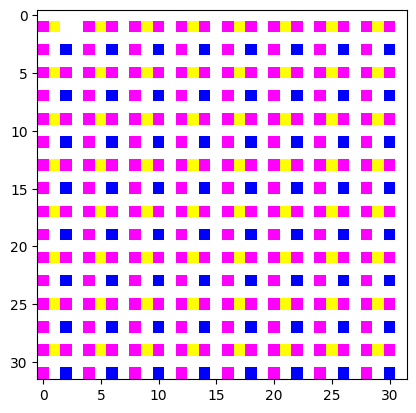

Epoch 401/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


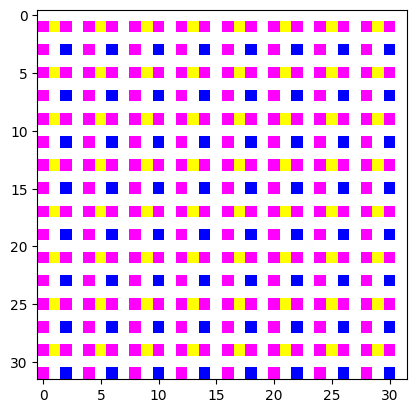

Epoch 402/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


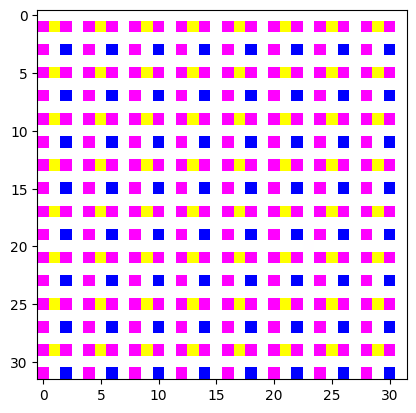

Epoch 403/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


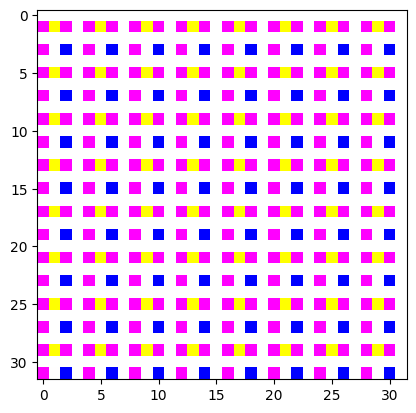

Epoch 404/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


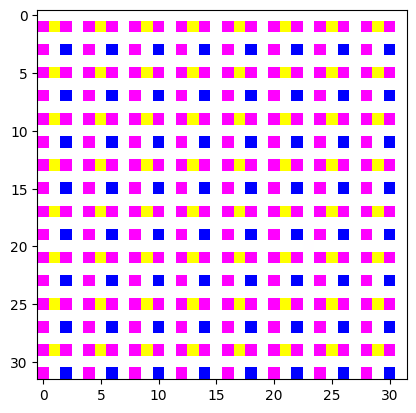

Epoch 405/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


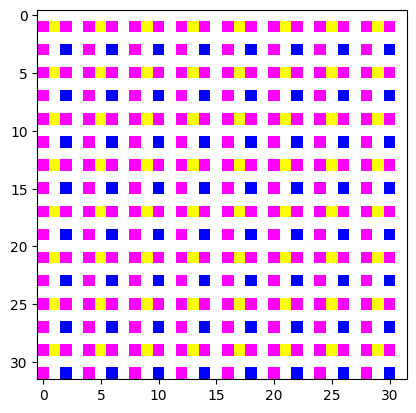

Epoch 406/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


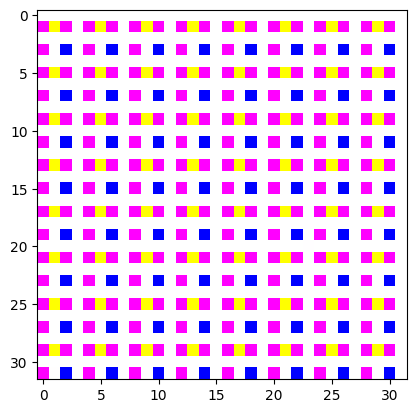

Epoch 407/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


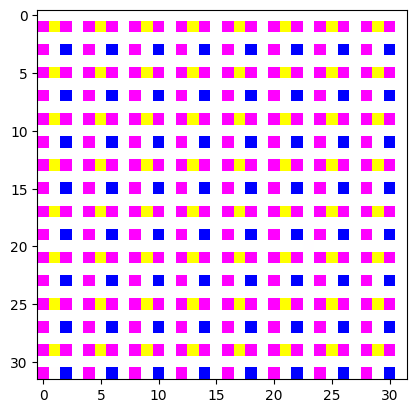

Epoch 408/1000


100%|██████████| 100/100 [00:18<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


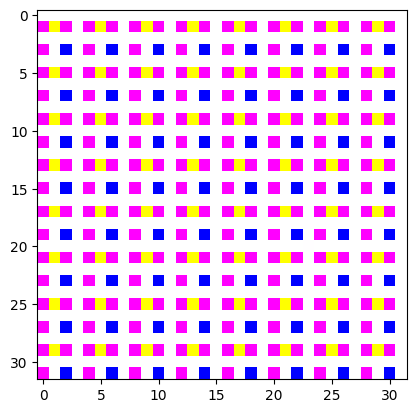

Epoch 409/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


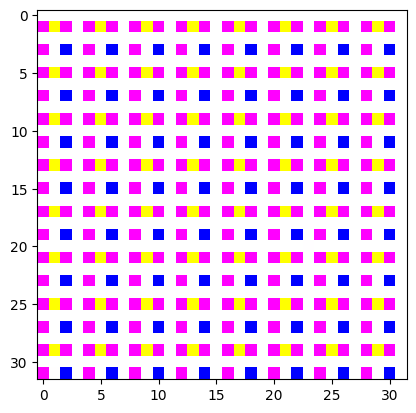

Epoch 410/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


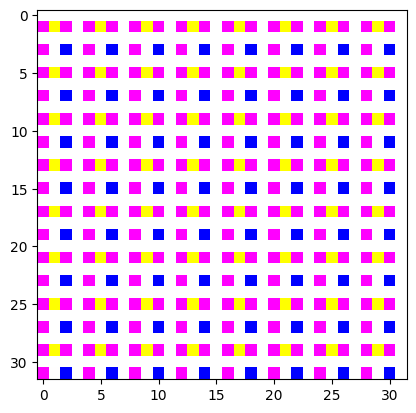

Epoch 411/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


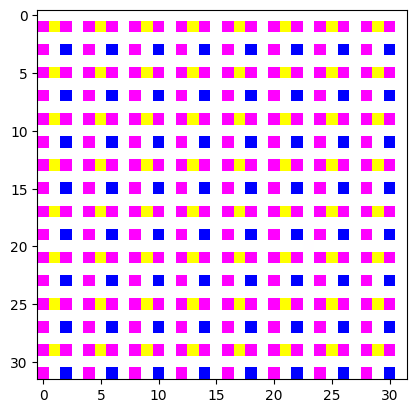

Epoch 412/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


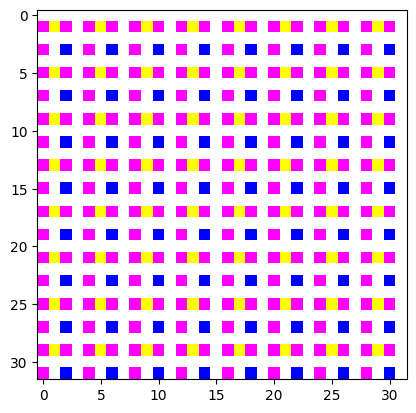

Epoch 413/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


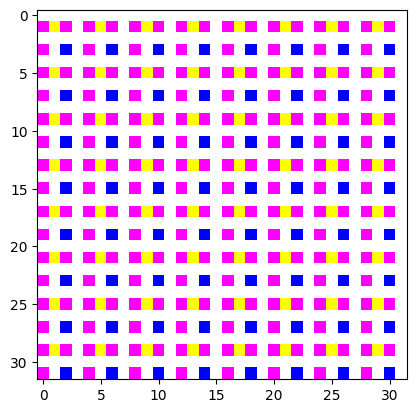

Epoch 414/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


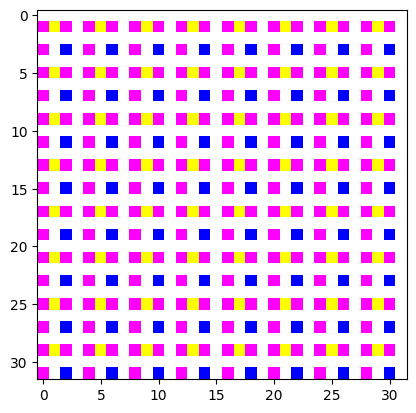

Epoch 415/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


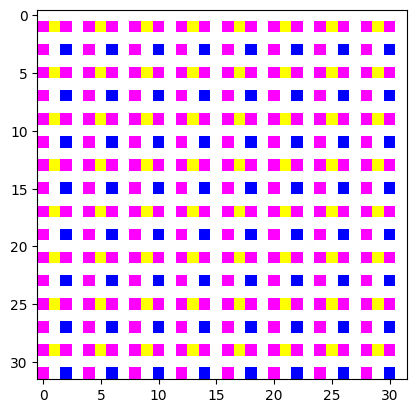

Epoch 416/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


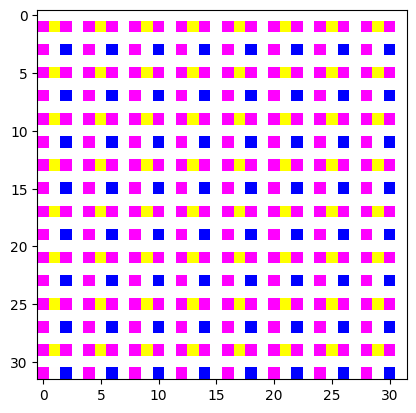

Epoch 417/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


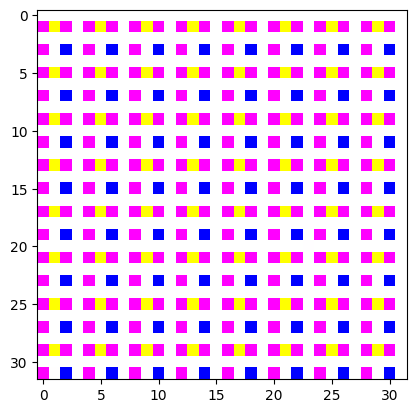

Epoch 418/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


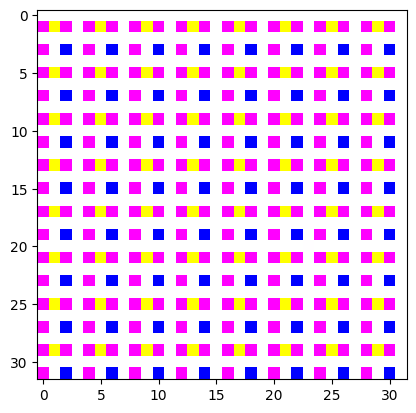

Epoch 419/1000


100%|██████████| 100/100 [00:18<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


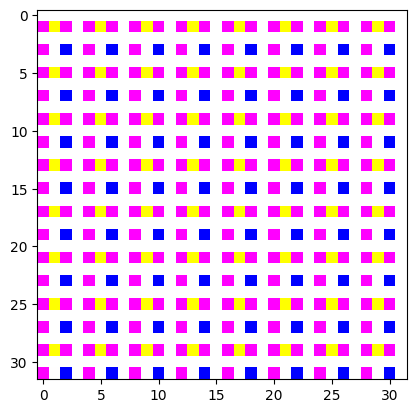

Epoch 420/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


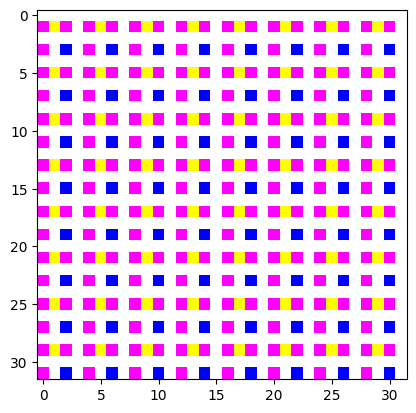

Epoch 421/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


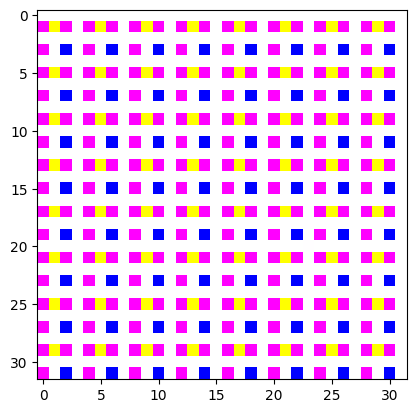

Epoch 422/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


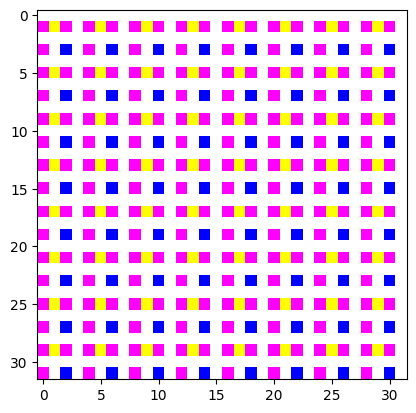

Epoch 423/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


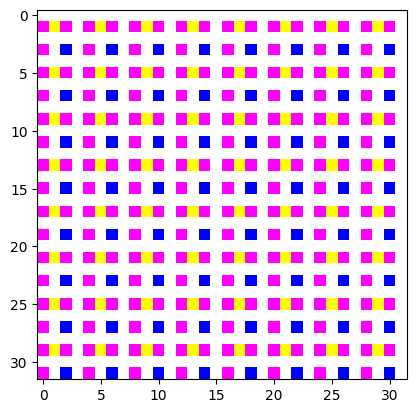

Epoch 424/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


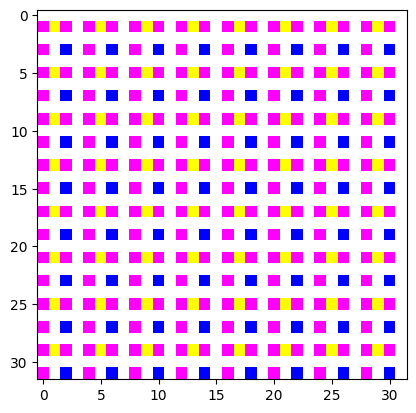

Epoch 425/1000


100%|██████████| 100/100 [00:18<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


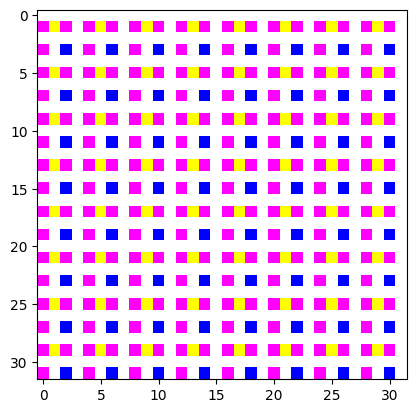

Epoch 426/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


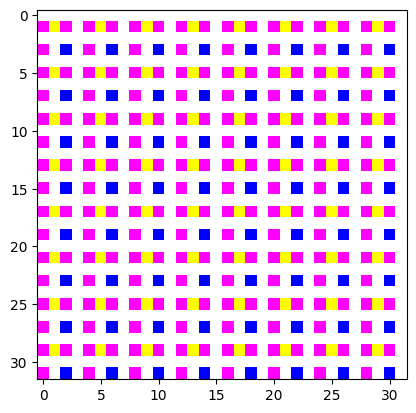

Epoch 427/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


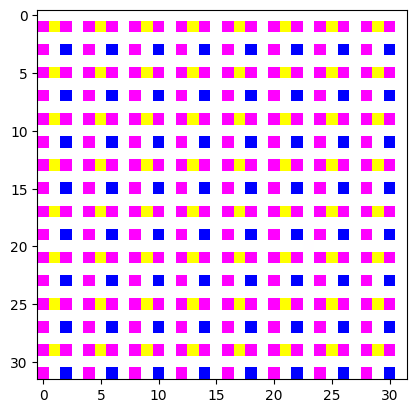

Epoch 428/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


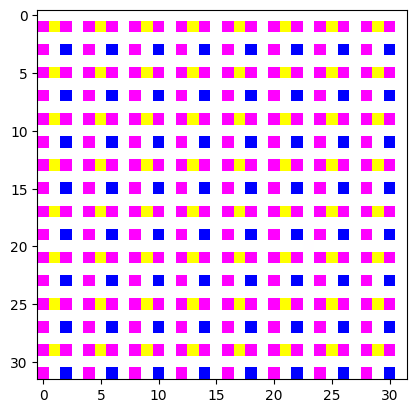

Epoch 429/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


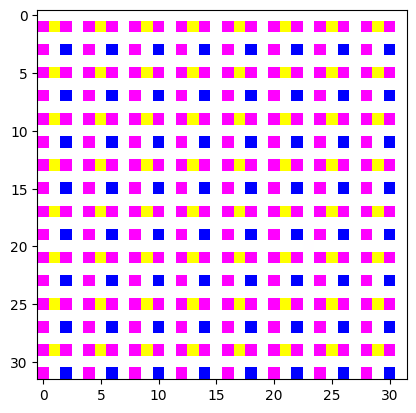

Epoch 430/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


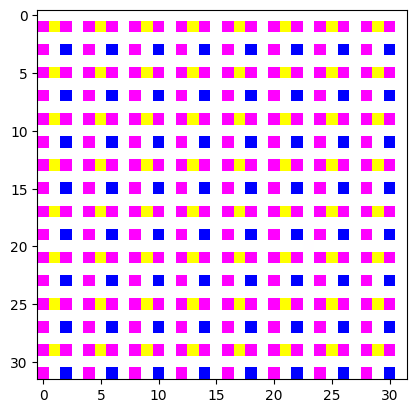

Epoch 431/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


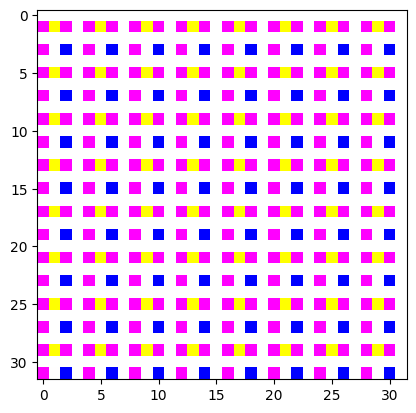

Epoch 432/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


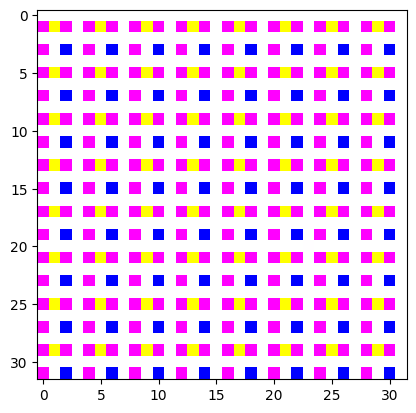

Epoch 433/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


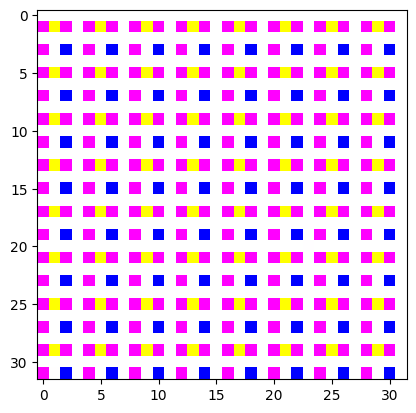

Epoch 434/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


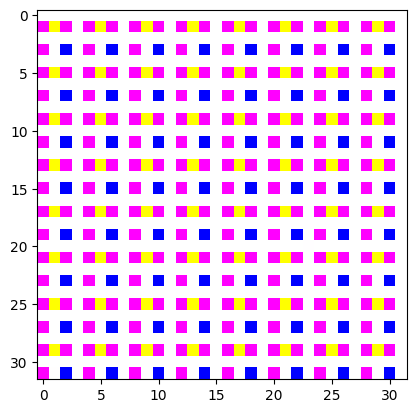

Epoch 435/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


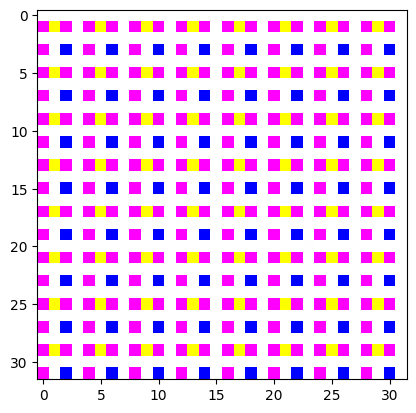

Epoch 436/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


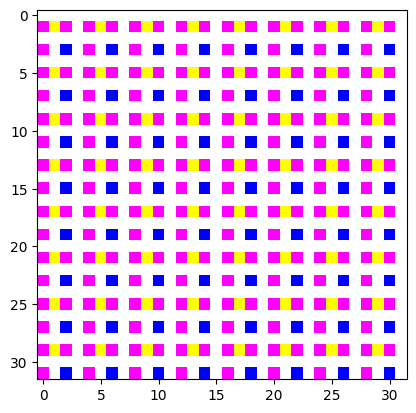

Epoch 437/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


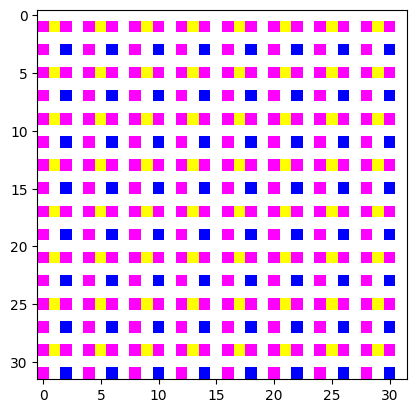

Epoch 438/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


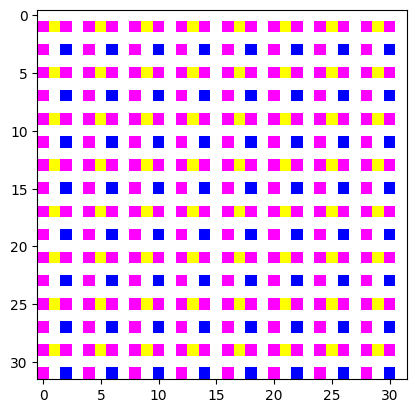

Epoch 439/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


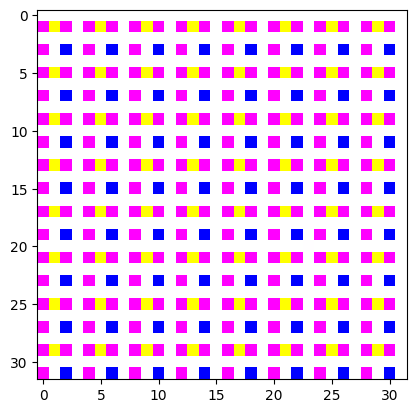

Epoch 440/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


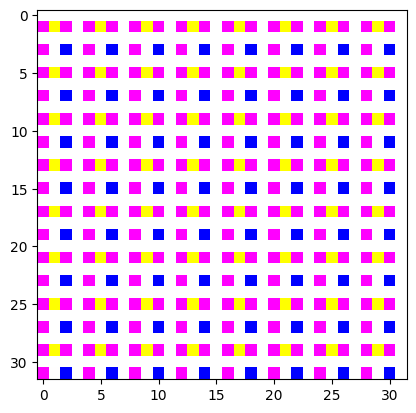

Epoch 441/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


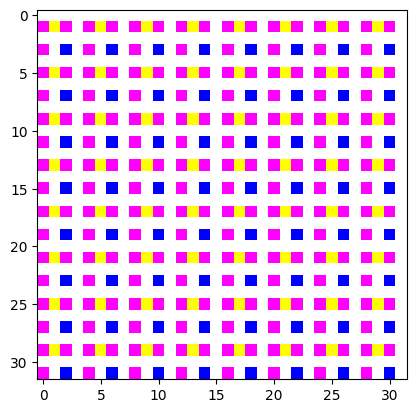

Epoch 442/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


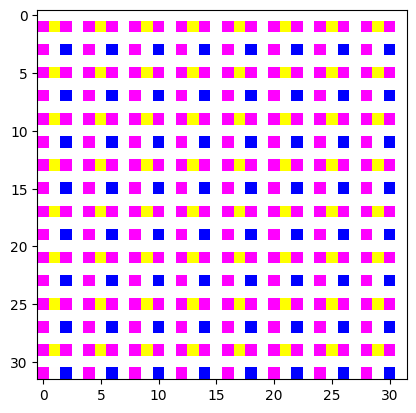

Epoch 443/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


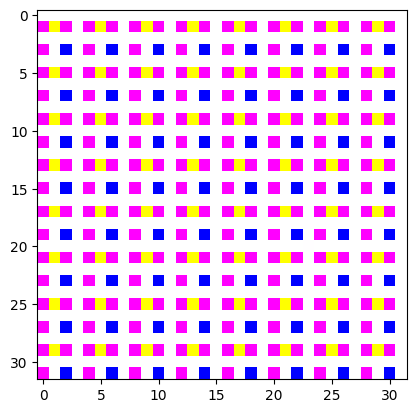

Epoch 444/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


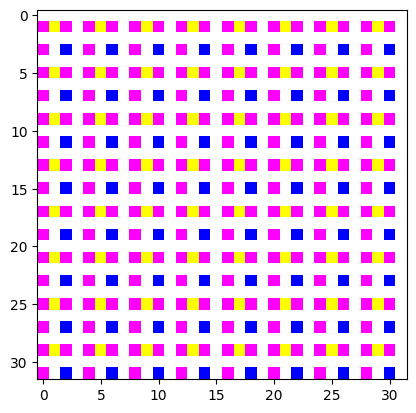

Epoch 445/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


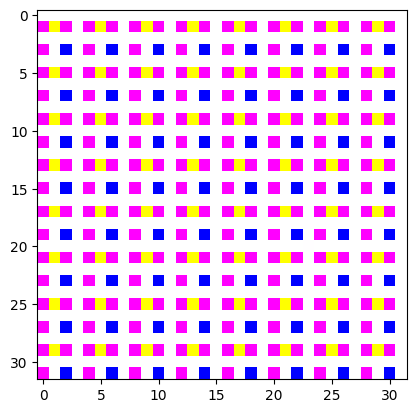

Epoch 446/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


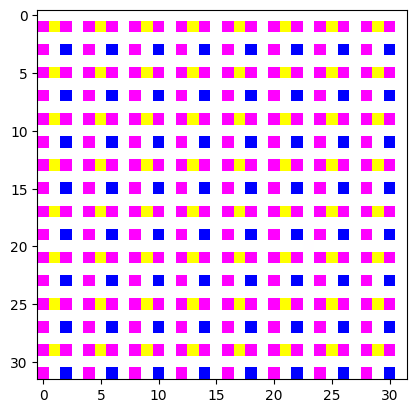

Epoch 447/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


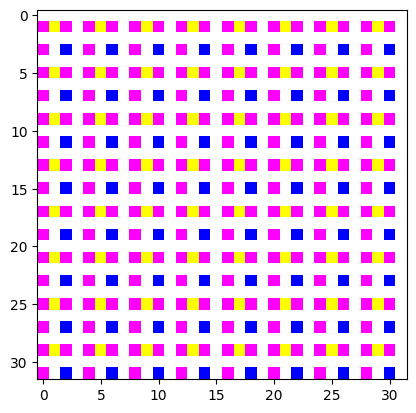

Epoch 448/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


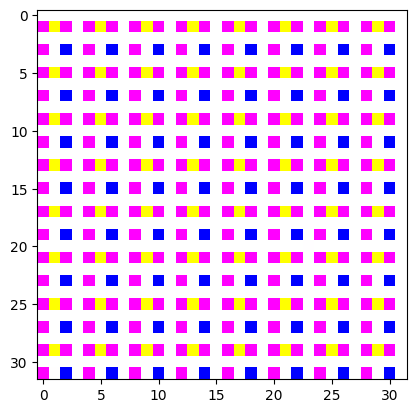

Epoch 449/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


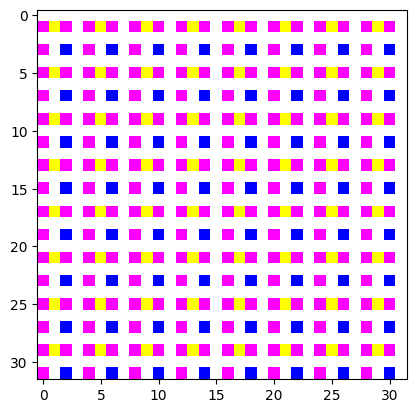

Epoch 450/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


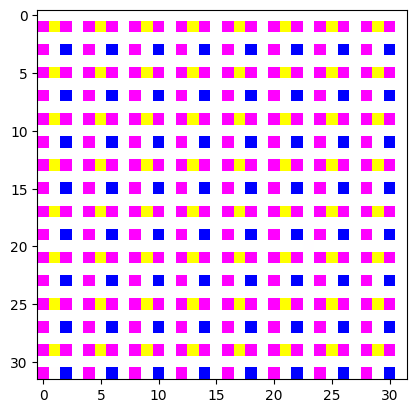

Epoch 451/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


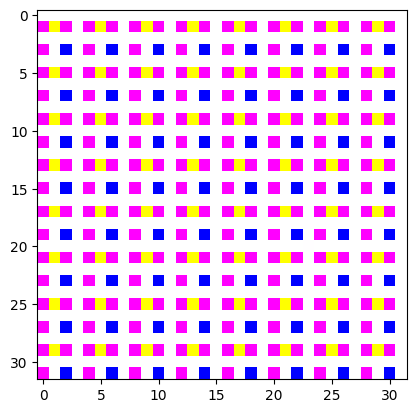

Epoch 452/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


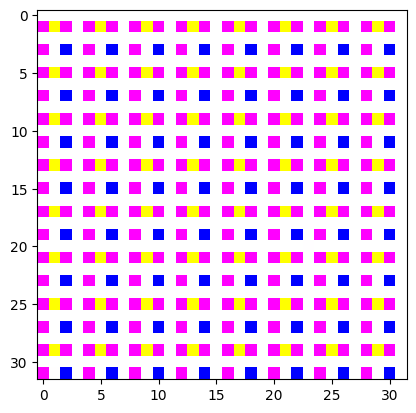

Epoch 453/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


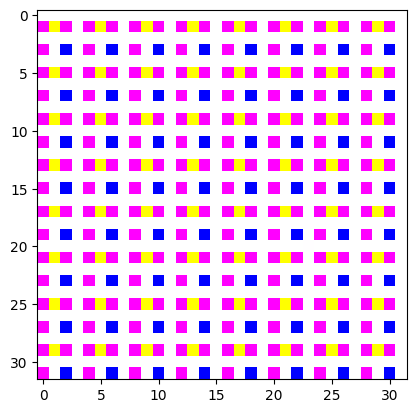

Epoch 454/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


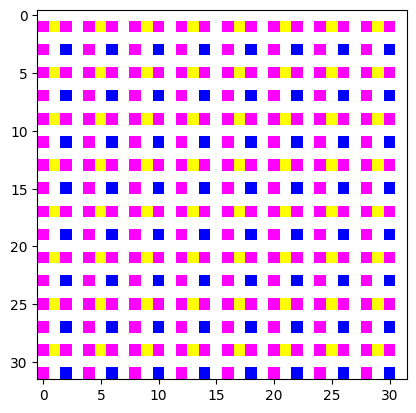

Epoch 455/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


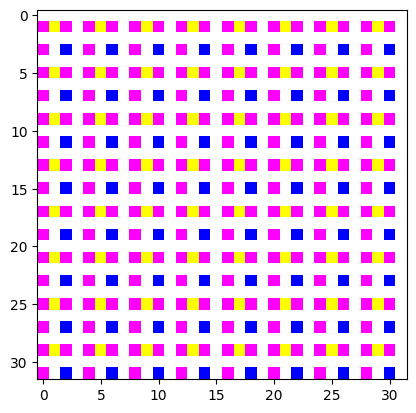

Epoch 456/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


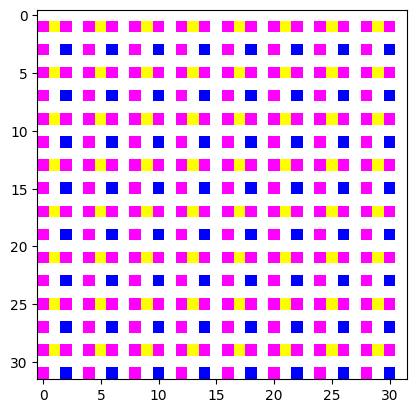

Epoch 457/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


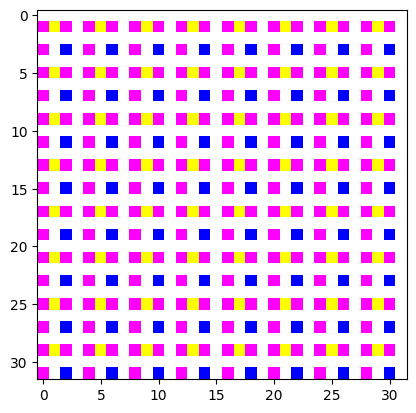

Epoch 458/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


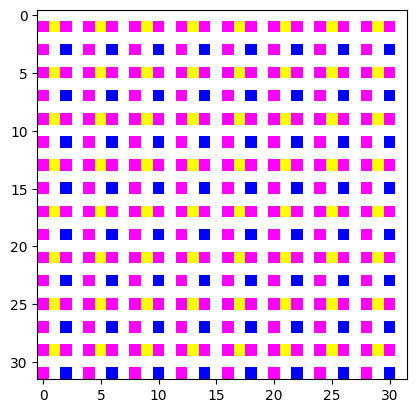

Epoch 459/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


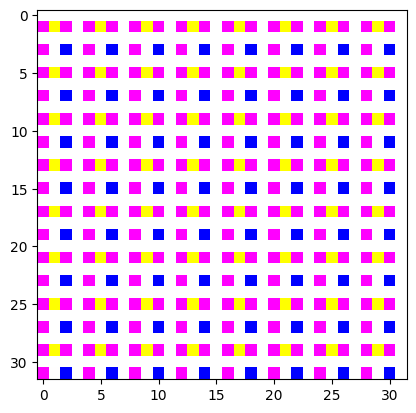

Epoch 460/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


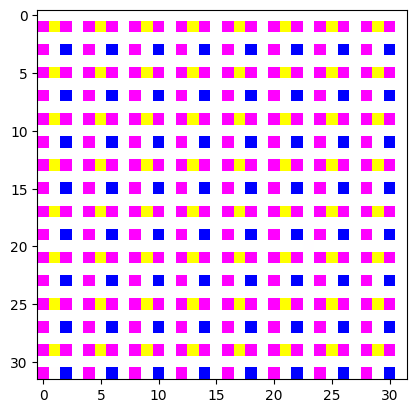

Epoch 461/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


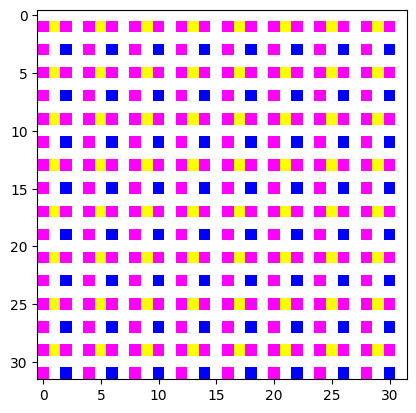

Epoch 462/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


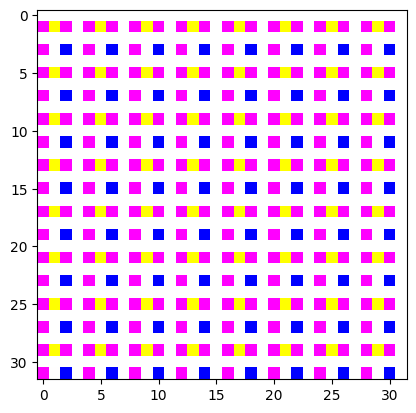

Epoch 463/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


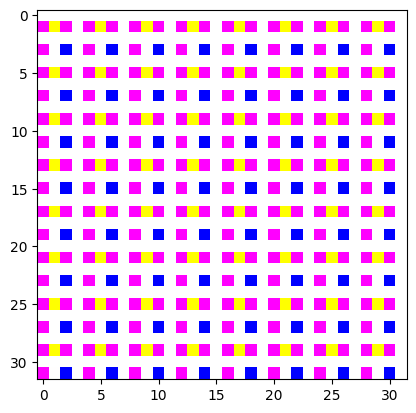

Epoch 464/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


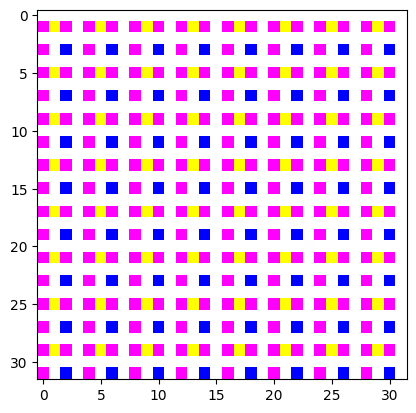

Epoch 465/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


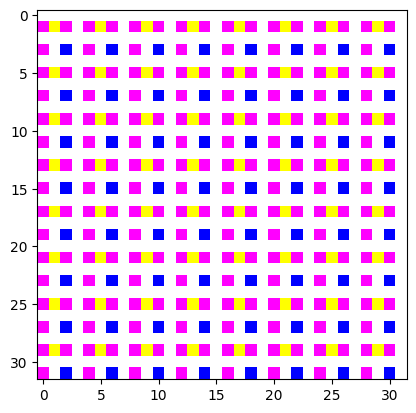

Epoch 466/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


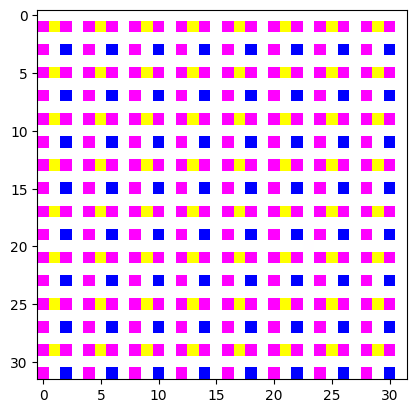

Epoch 467/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


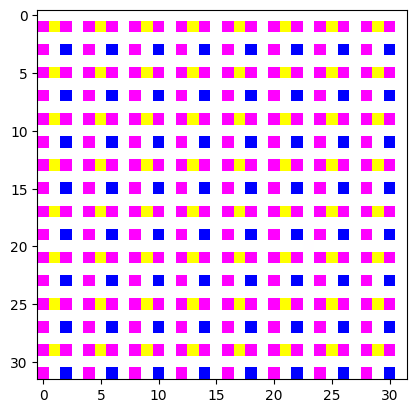

Epoch 468/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


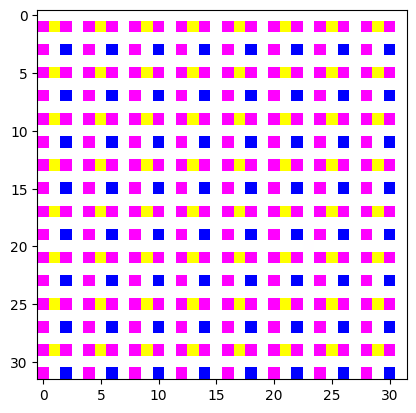

Epoch 469/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


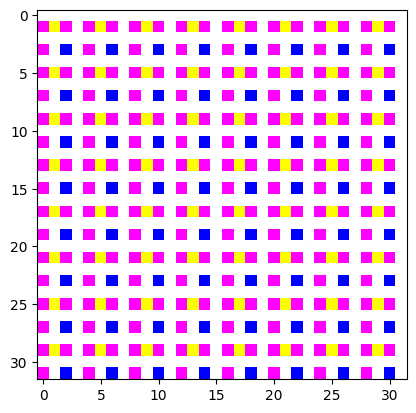

Epoch 470/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


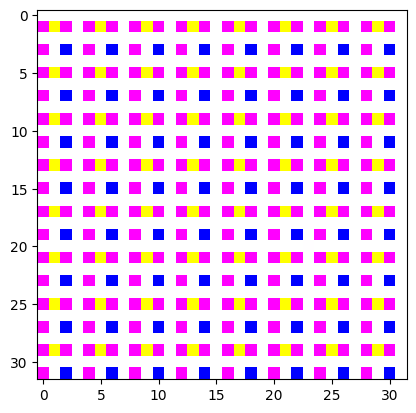

Epoch 471/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


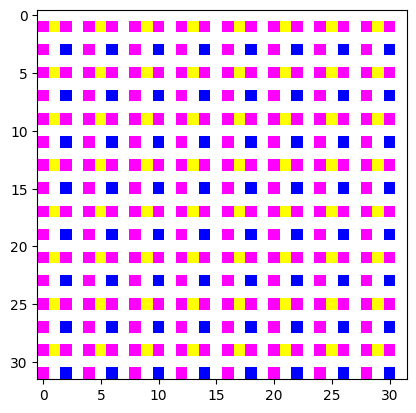

Epoch 472/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


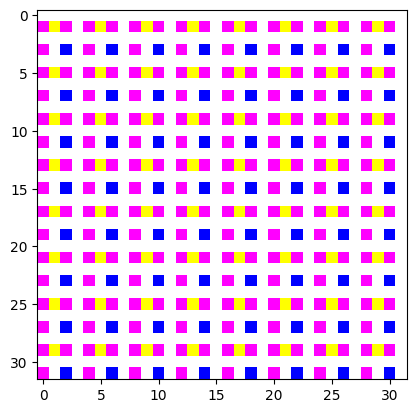

Epoch 473/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


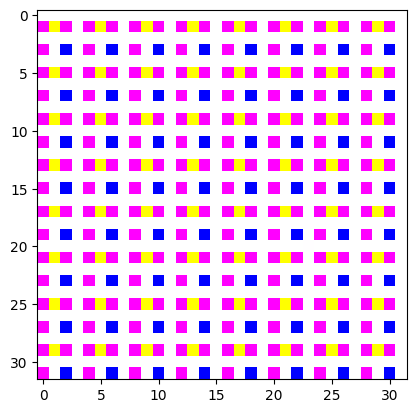

Epoch 474/1000


100%|██████████| 100/100 [00:18<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


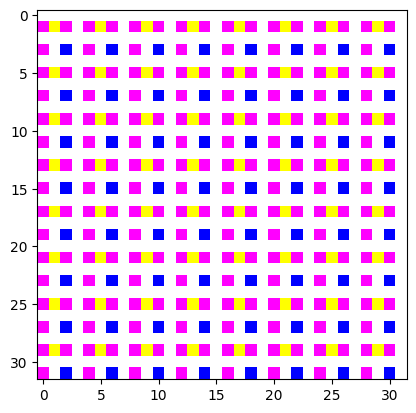

Epoch 475/1000


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


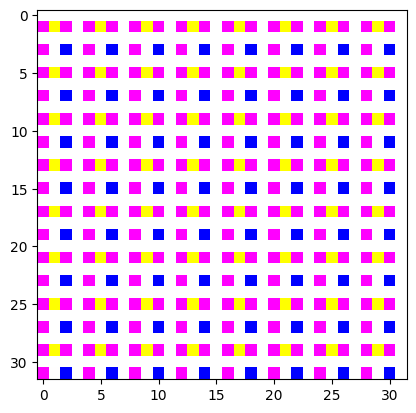

Epoch 476/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


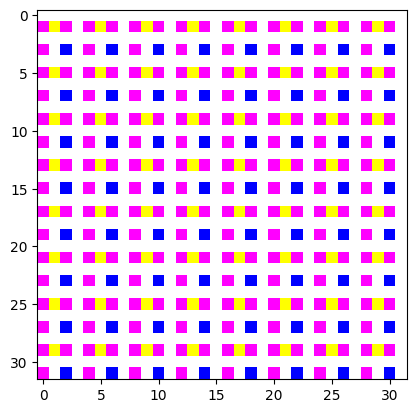

Epoch 477/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


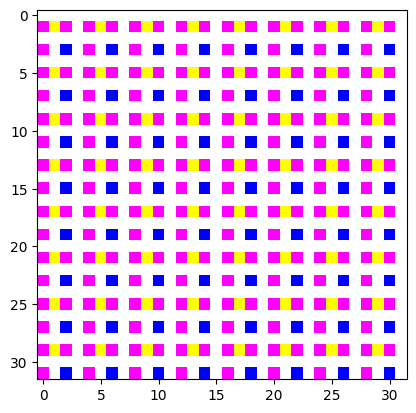

Epoch 478/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


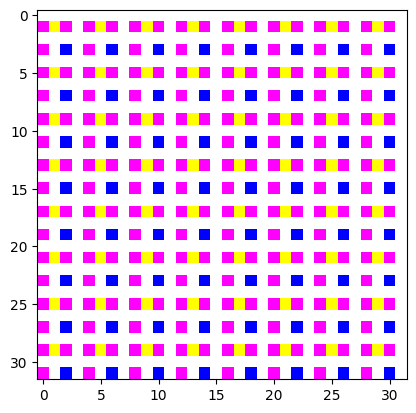

Epoch 479/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


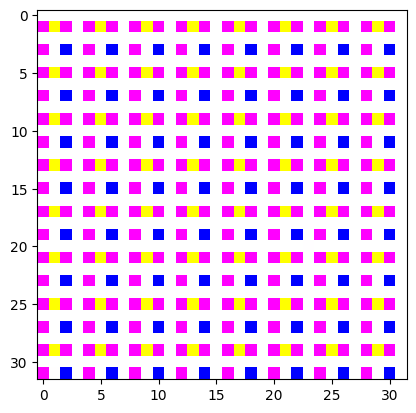

Epoch 480/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


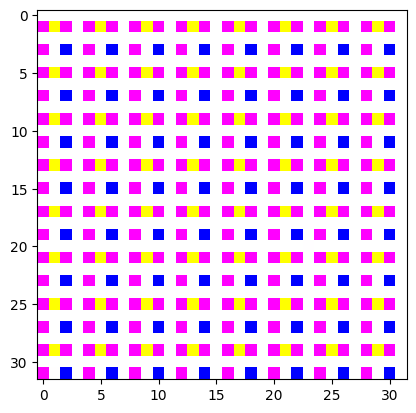

Epoch 481/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


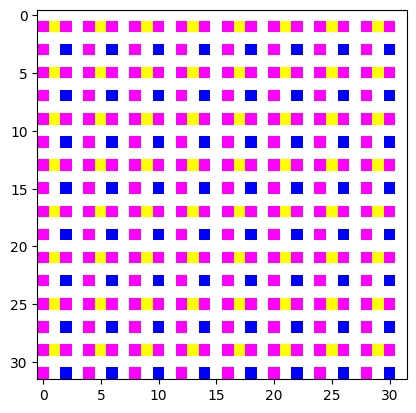

Epoch 482/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


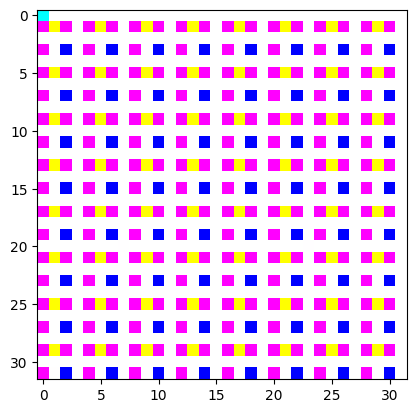

Epoch 483/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


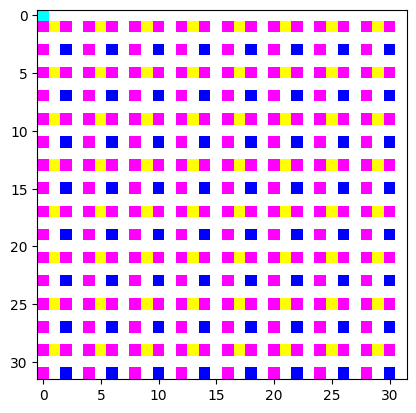

Epoch 484/1000


100%|██████████| 100/100 [00:17<00:00,  5.60it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


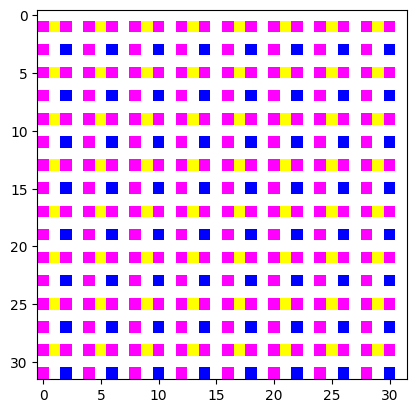

Epoch 485/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


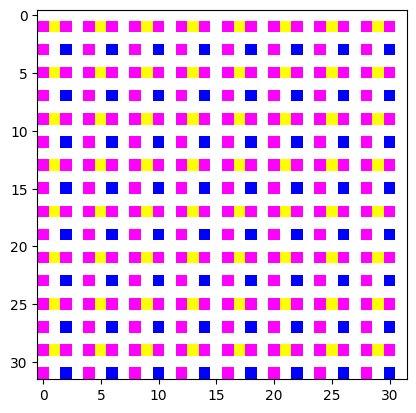

Epoch 486/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


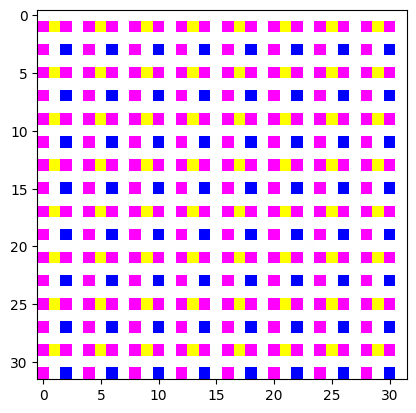

Epoch 487/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


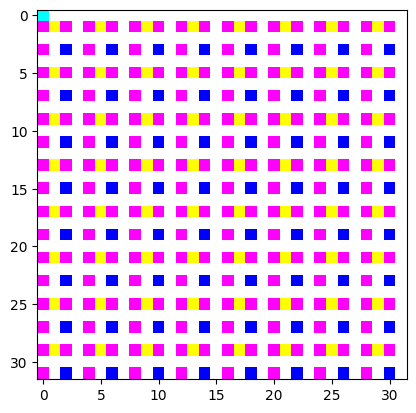

Epoch 488/1000


100%|██████████| 100/100 [00:17<00:00,  5.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


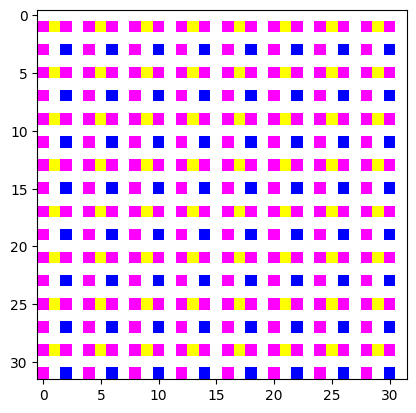

Epoch 489/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


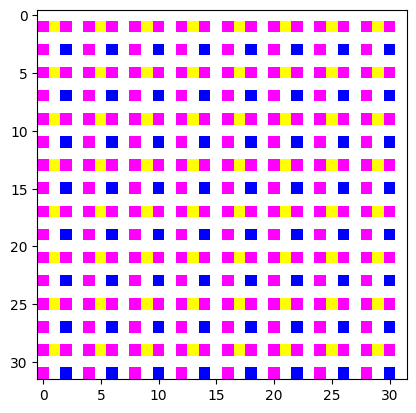

Epoch 490/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


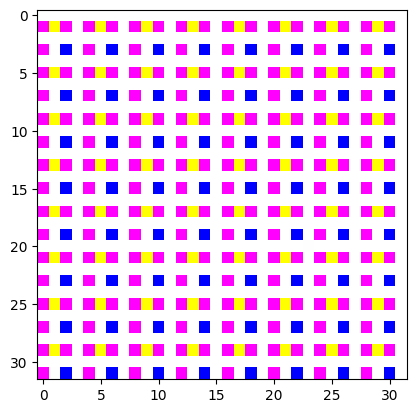

Epoch 491/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


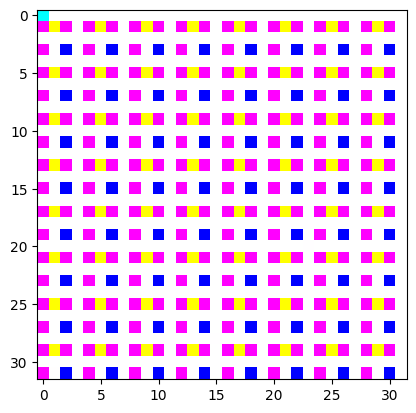

Epoch 492/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


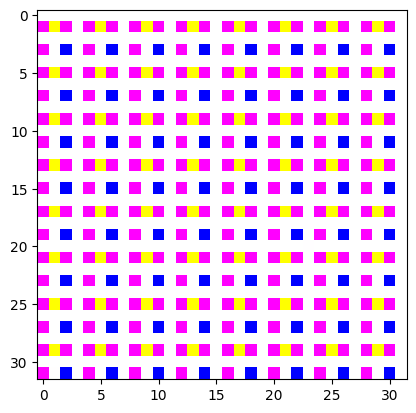

Epoch 493/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


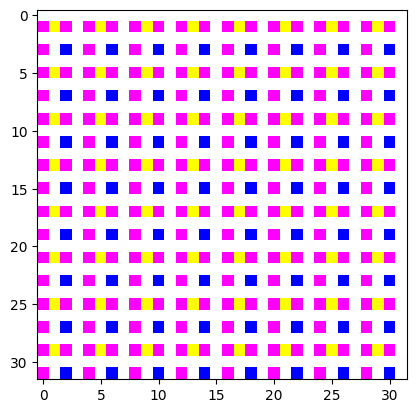

Epoch 494/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


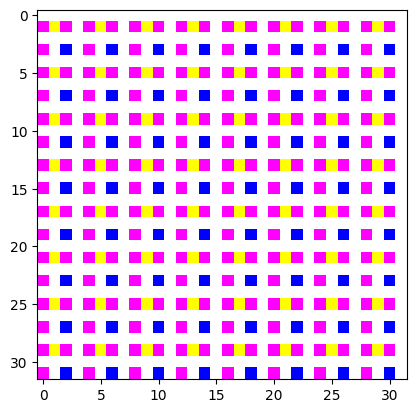

Epoch 495/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


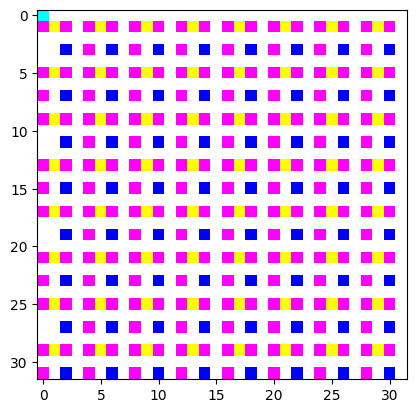

Epoch 496/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


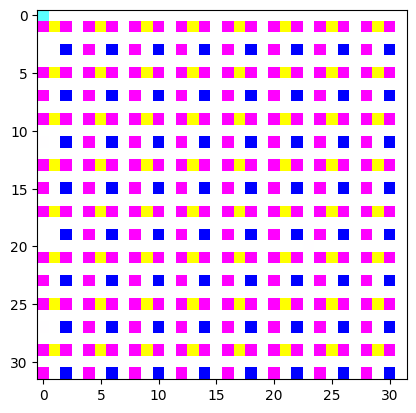

Epoch 497/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


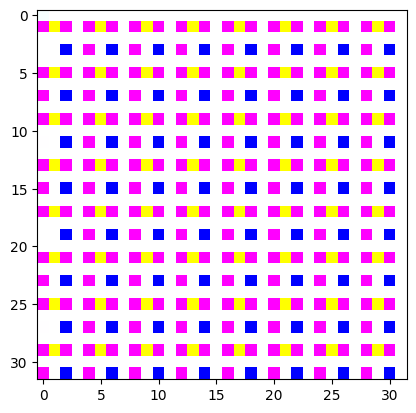

Epoch 498/1000


100%|██████████| 100/100 [00:17<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


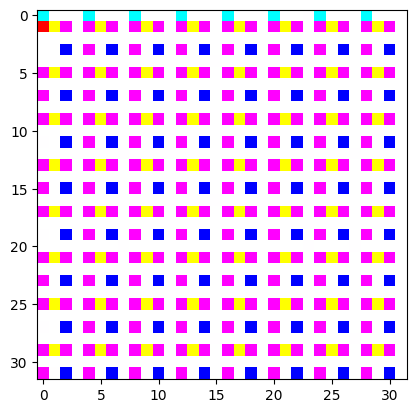

Epoch 499/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


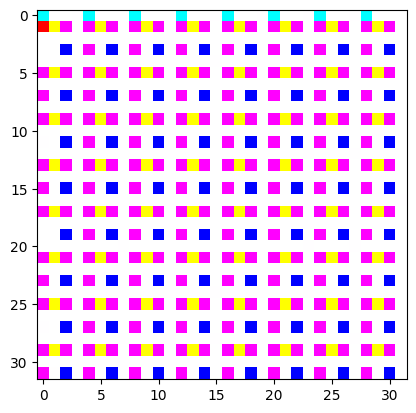

Epoch 500/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


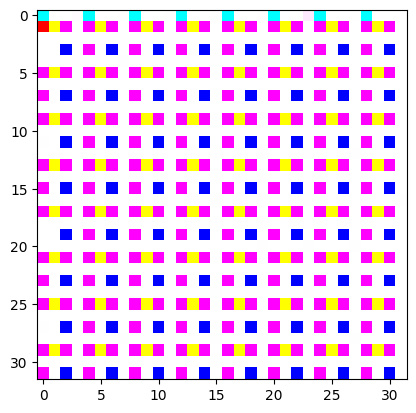

Epoch 501/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


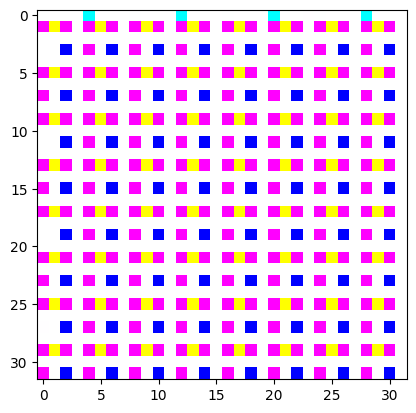

Epoch 502/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


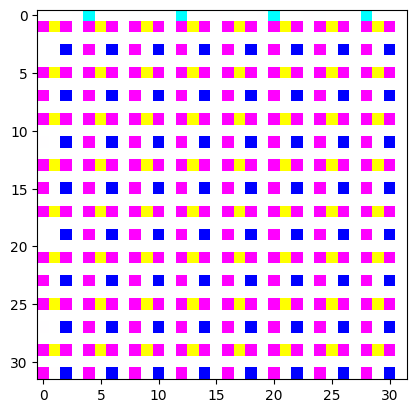

Epoch 503/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


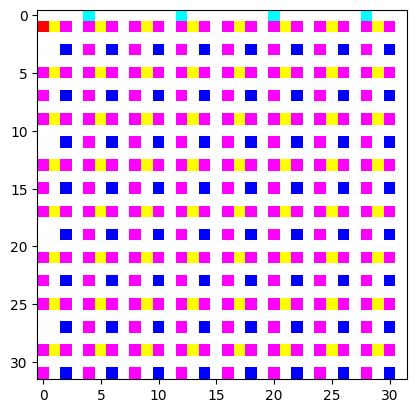

Epoch 504/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


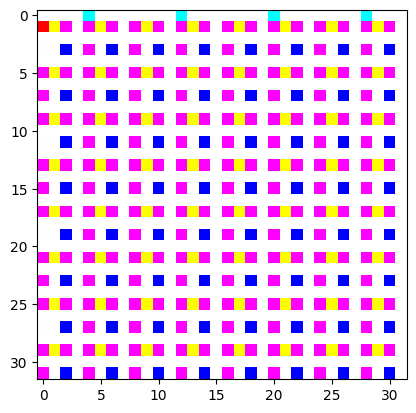

Epoch 505/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


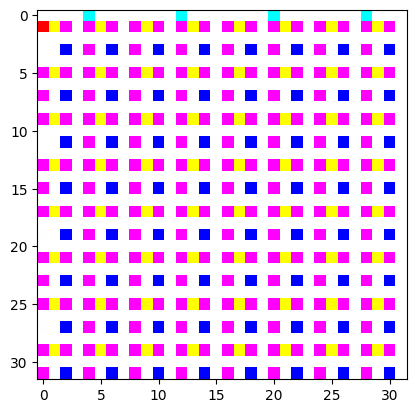

Epoch 506/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


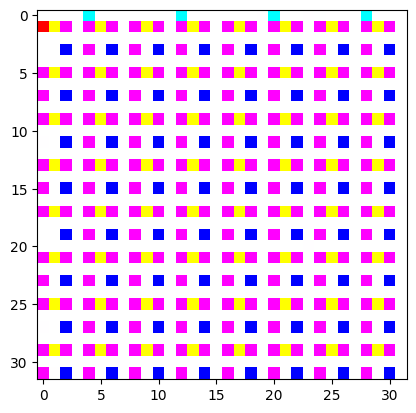

Epoch 507/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


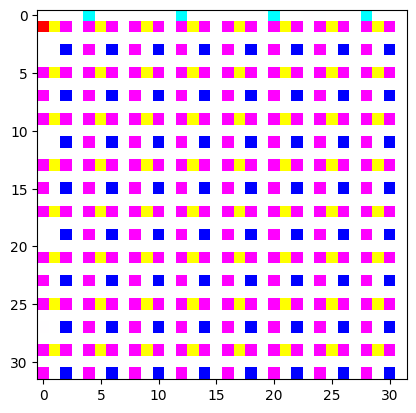

Epoch 508/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


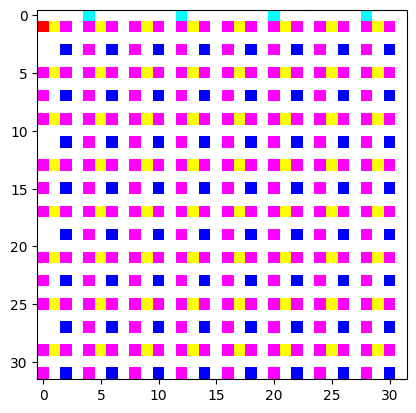

Epoch 509/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


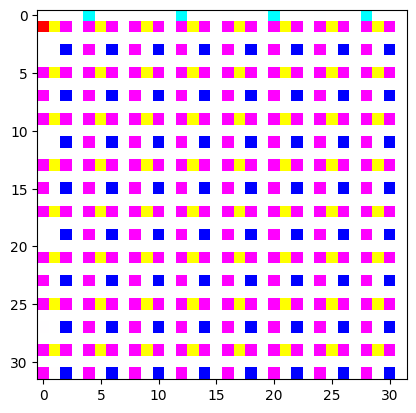

Epoch 510/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


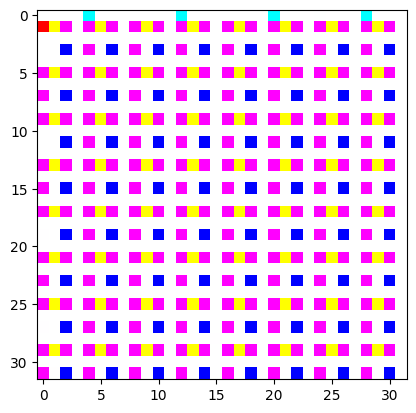

Epoch 511/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


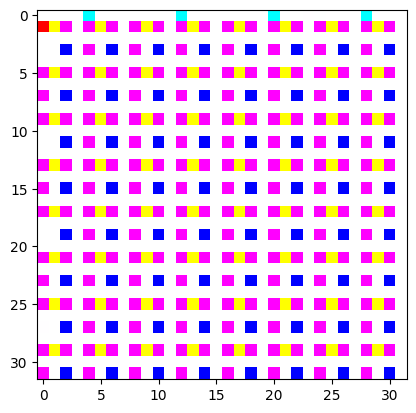

Epoch 512/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


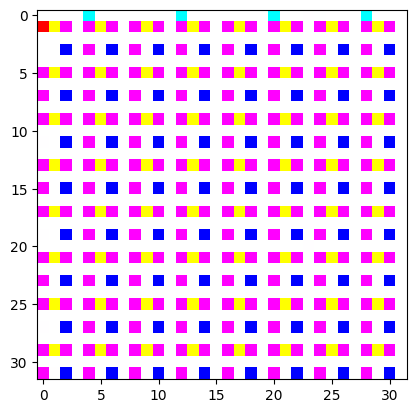

Epoch 513/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


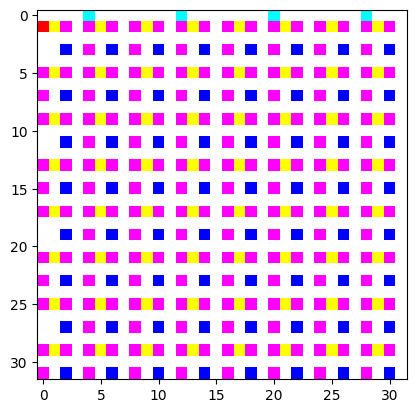

Epoch 514/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


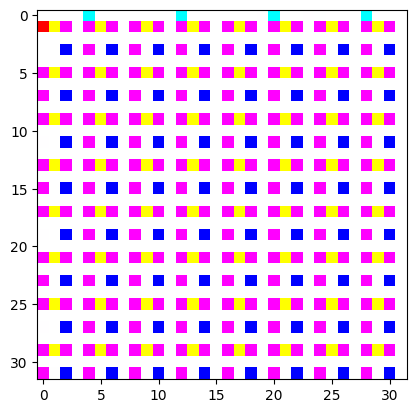

Epoch 515/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


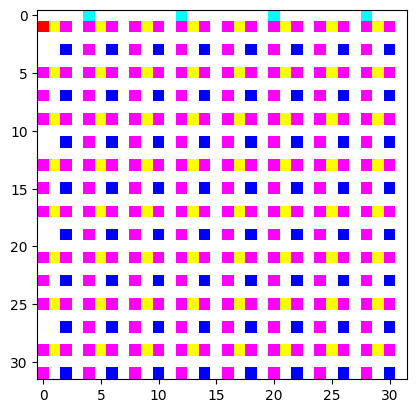

Epoch 516/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


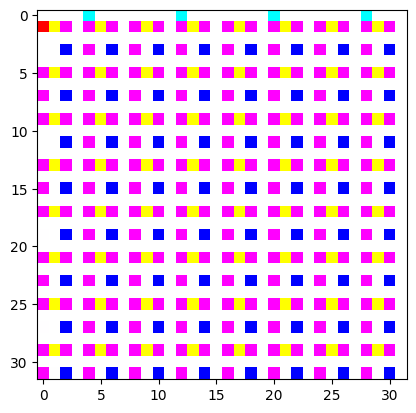

Epoch 517/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


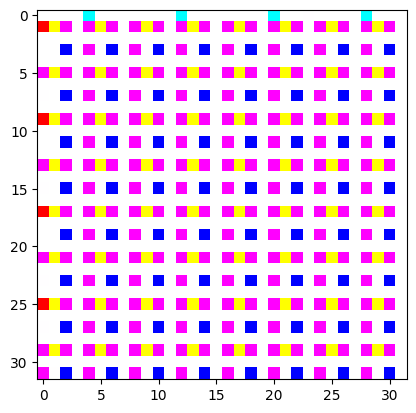

Epoch 518/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


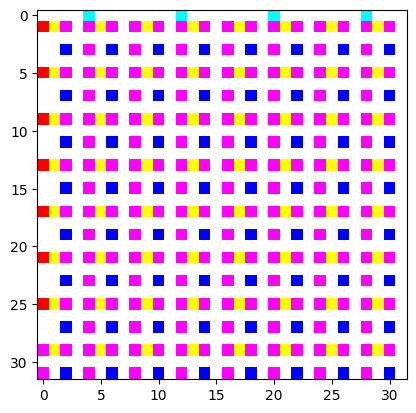

Epoch 519/1000


100%|██████████| 100/100 [00:18<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


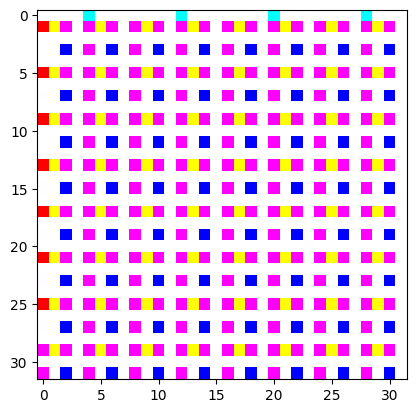

Epoch 520/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


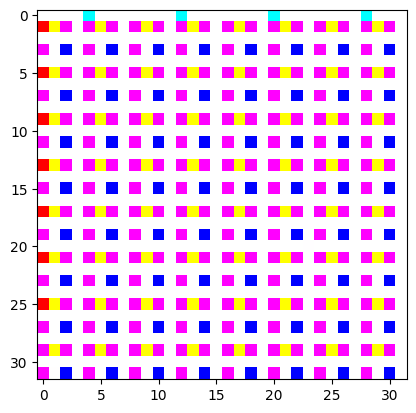

Epoch 521/1000


100%|██████████| 100/100 [00:17<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


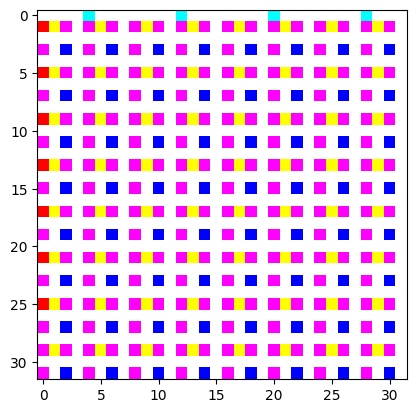

Epoch 522/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


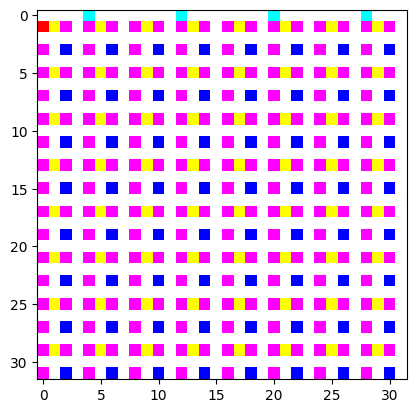

Epoch 523/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


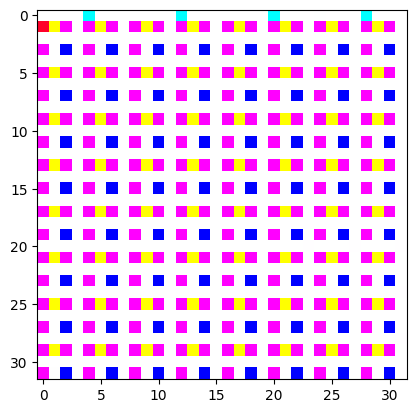

Epoch 524/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


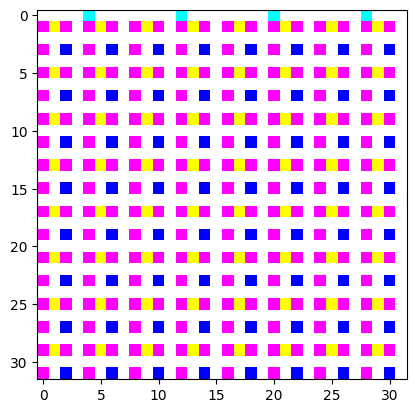

Epoch 525/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


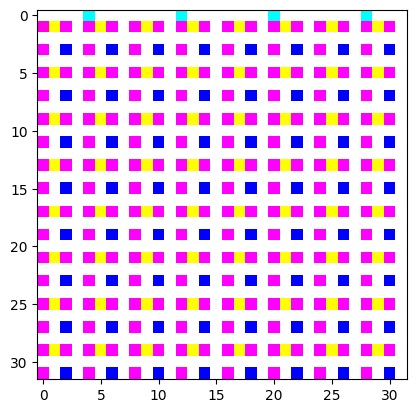

Epoch 526/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


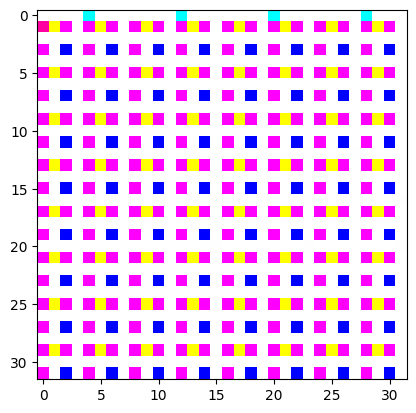

Epoch 527/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


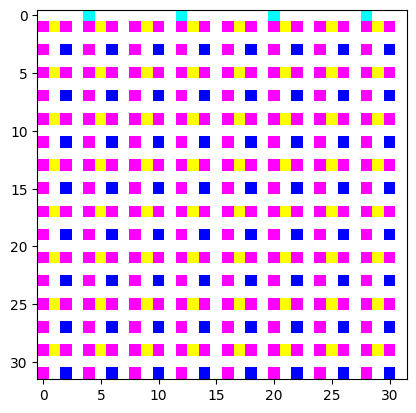

Epoch 528/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


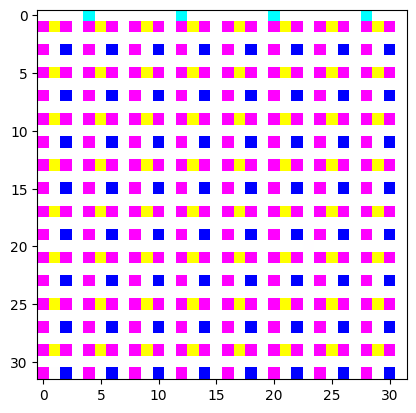

Epoch 529/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


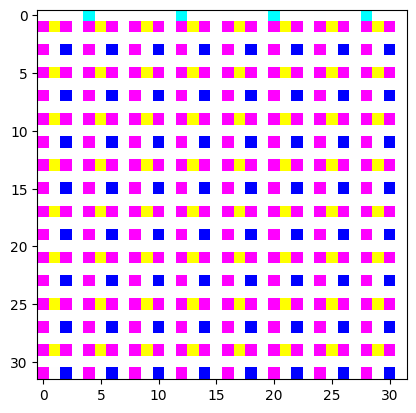

Epoch 530/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


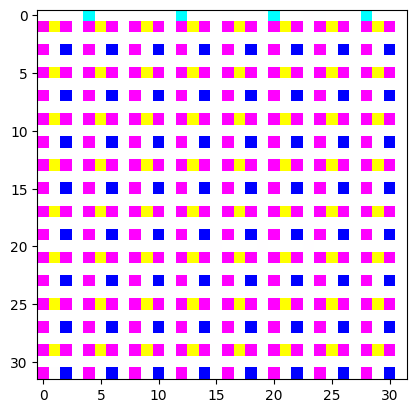

Epoch 531/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


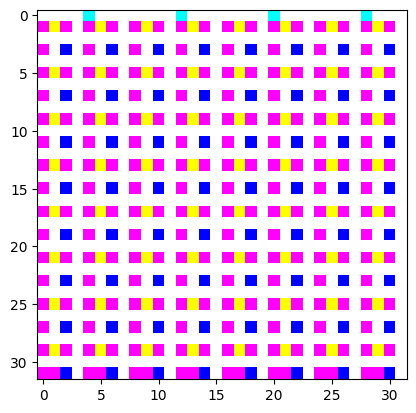

Epoch 532/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


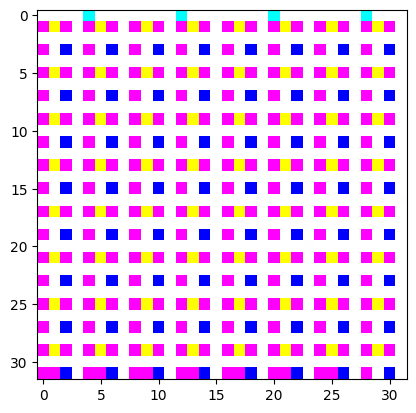

Epoch 533/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


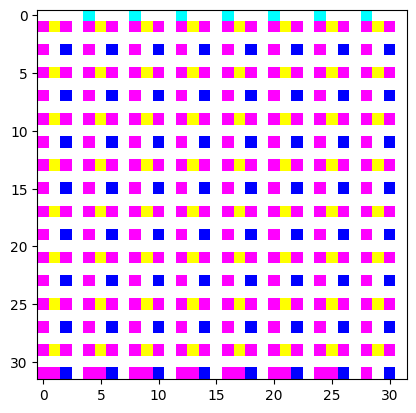

Epoch 534/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


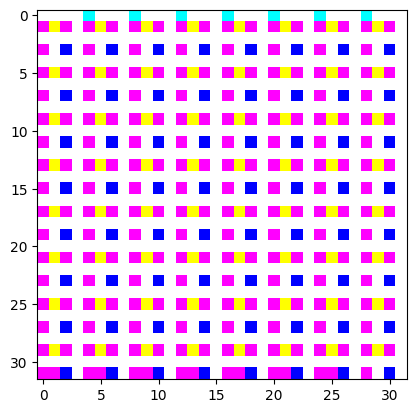

Epoch 535/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


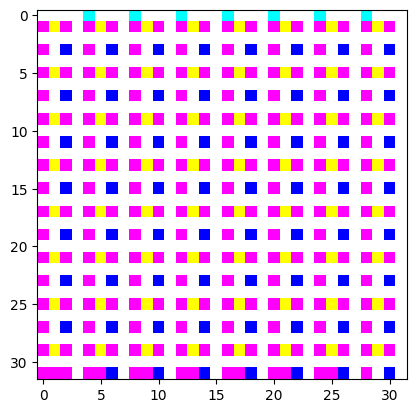

Epoch 536/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


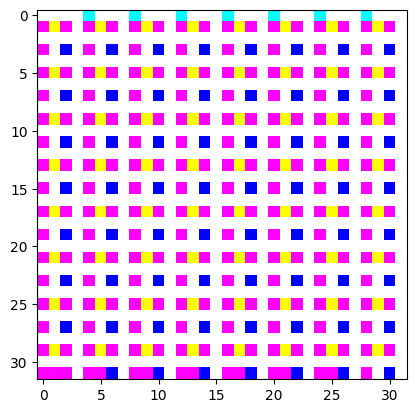

Epoch 537/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


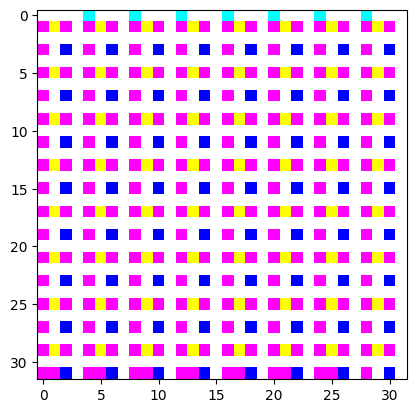

Epoch 538/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


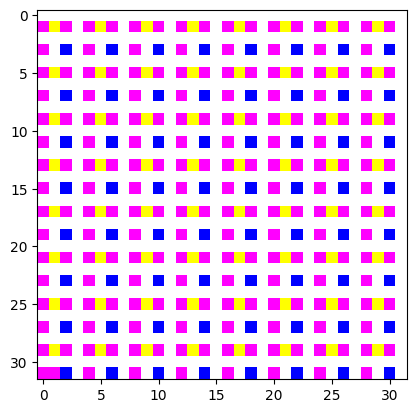

Epoch 539/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


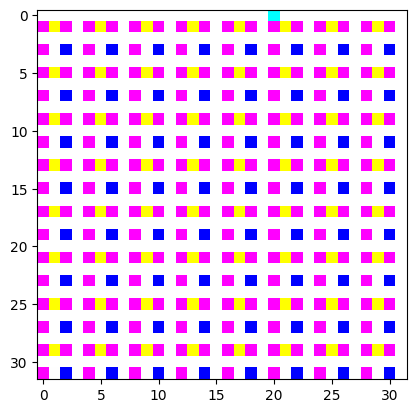

Epoch 540/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


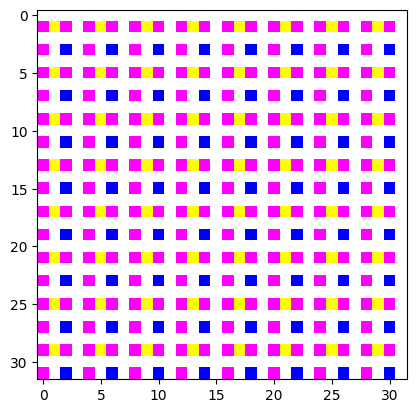

Epoch 541/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


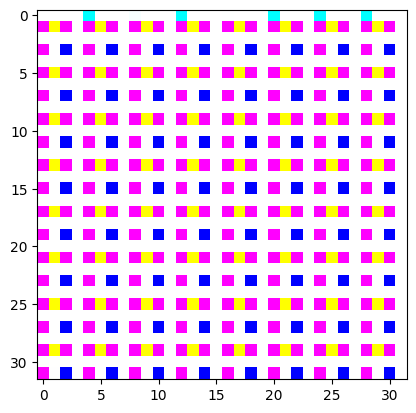

Epoch 542/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


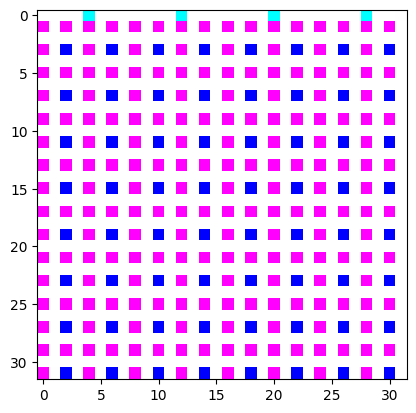

Epoch 543/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


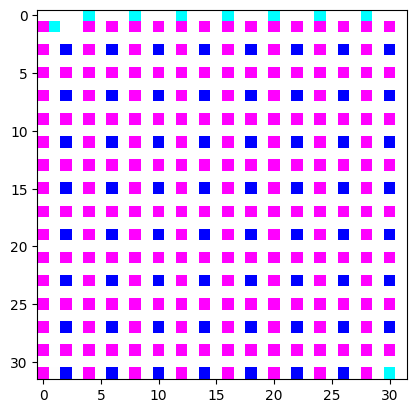

Epoch 544/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


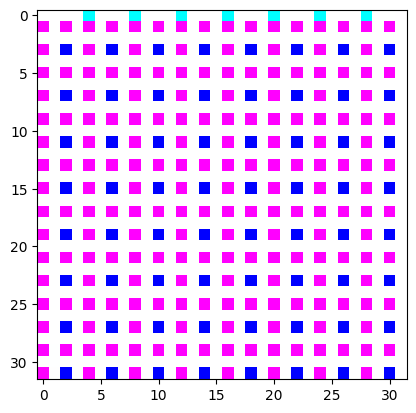

Epoch 545/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


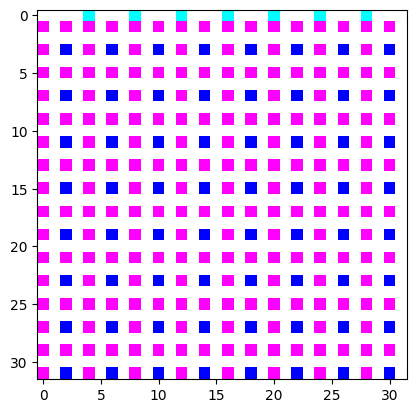

Epoch 546/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


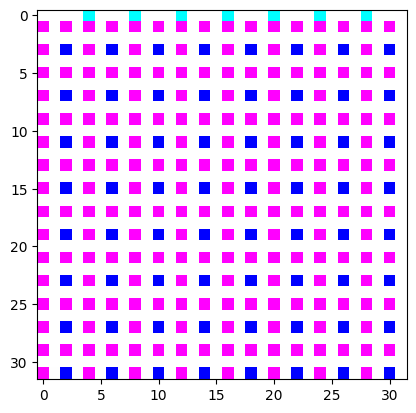

Epoch 547/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


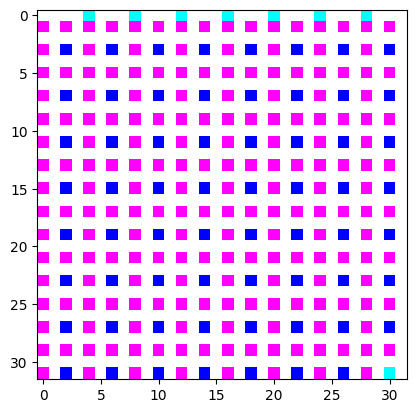

Epoch 548/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


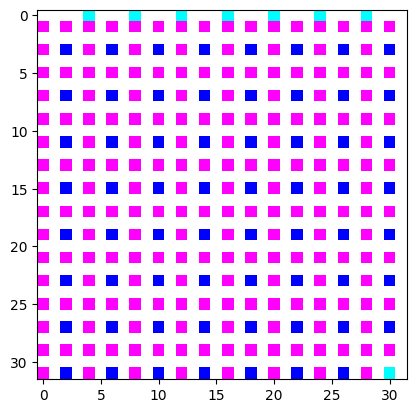

Epoch 549/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


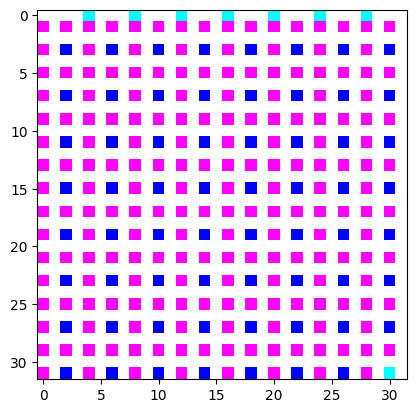

Epoch 550/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


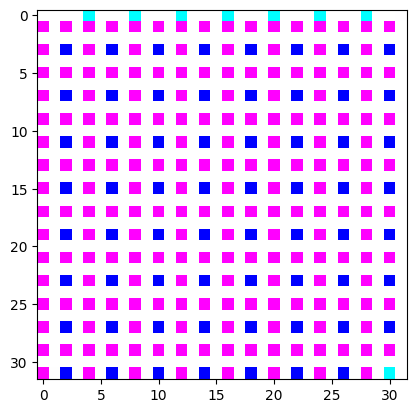

Epoch 551/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


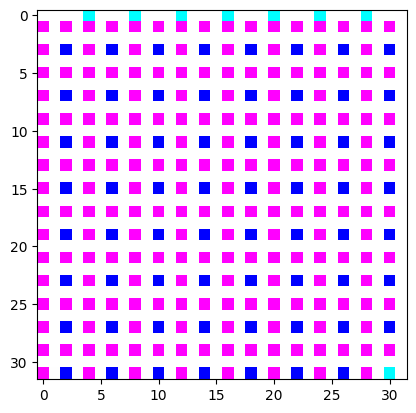

Epoch 552/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


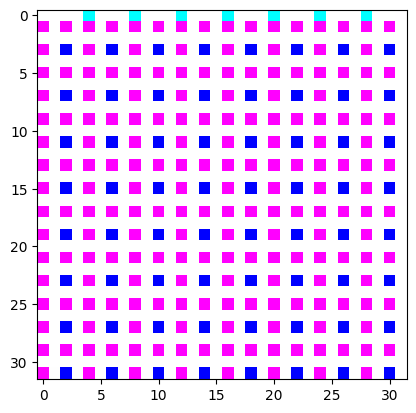

Epoch 553/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


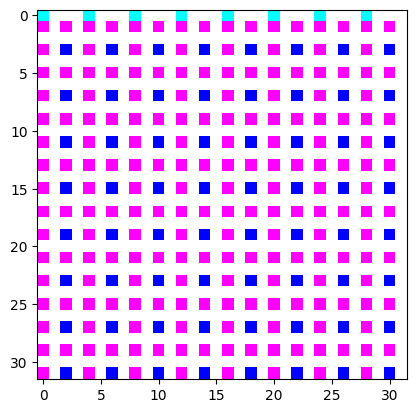

Epoch 554/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


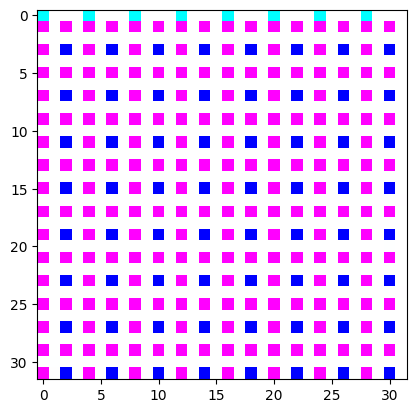

Epoch 555/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


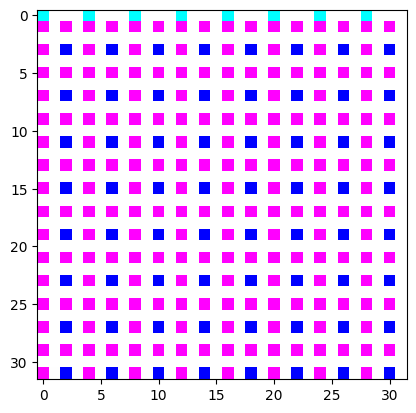

Epoch 556/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


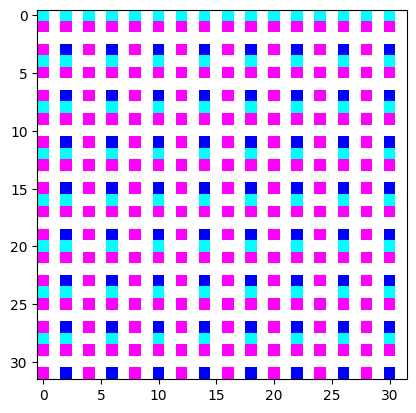

Epoch 557/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


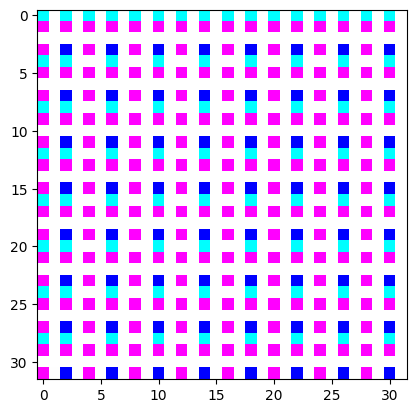

Epoch 558/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


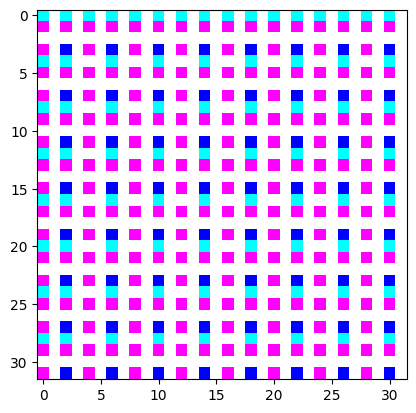

Epoch 559/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


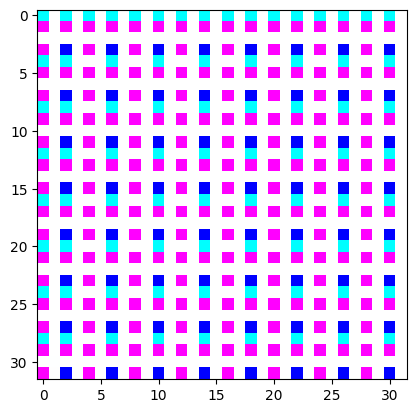

Epoch 560/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


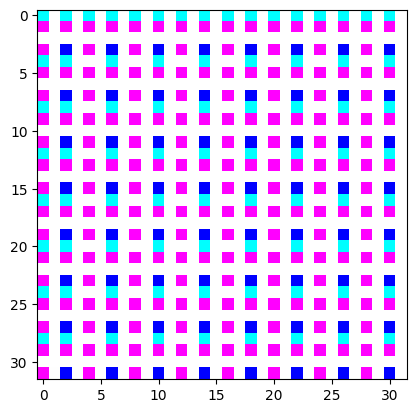

Epoch 561/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


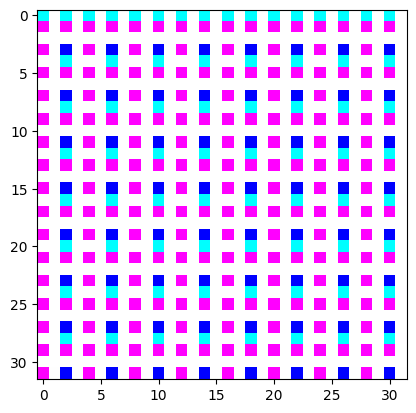

Epoch 562/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


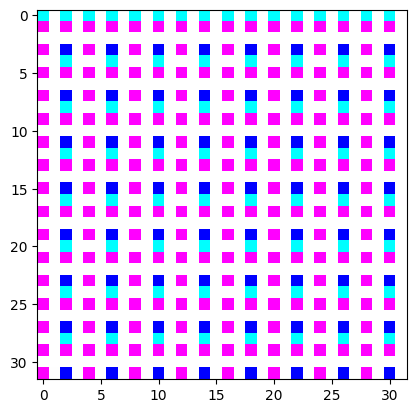

Epoch 563/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


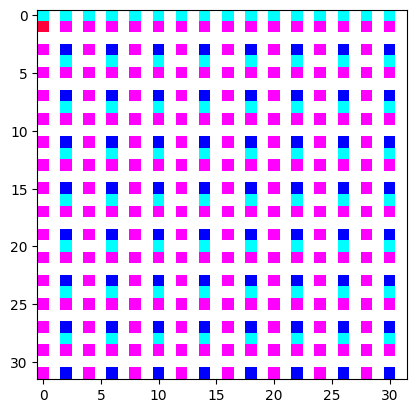

Epoch 564/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


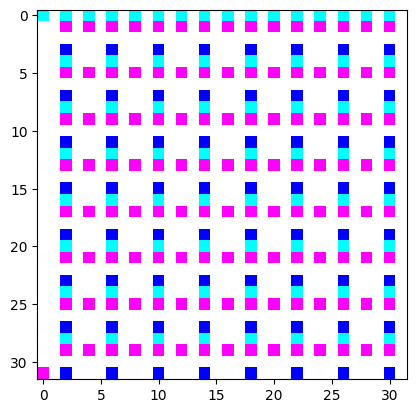

Epoch 565/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


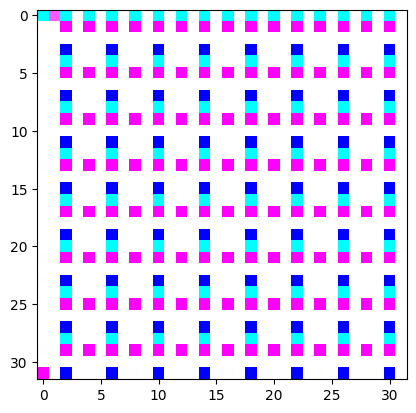

Epoch 566/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


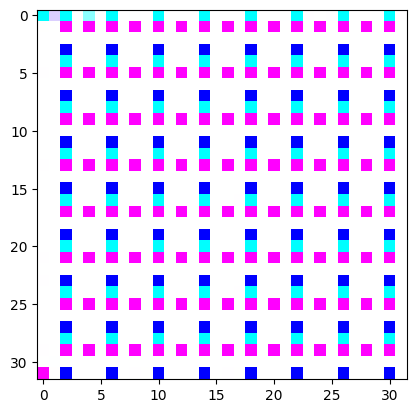

Epoch 567/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


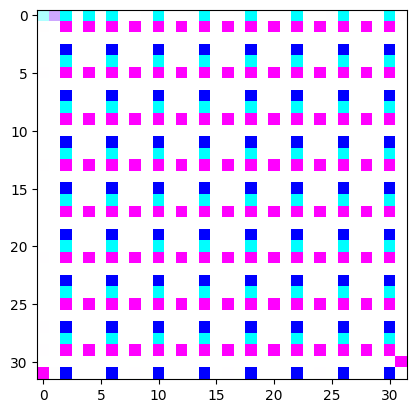

Epoch 568/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


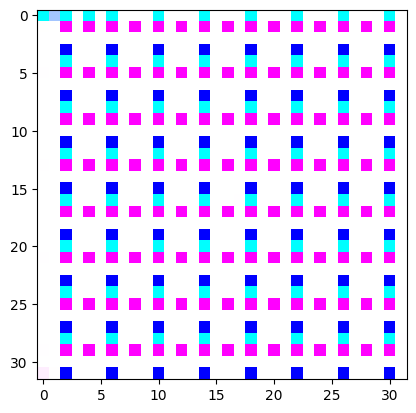

Epoch 569/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


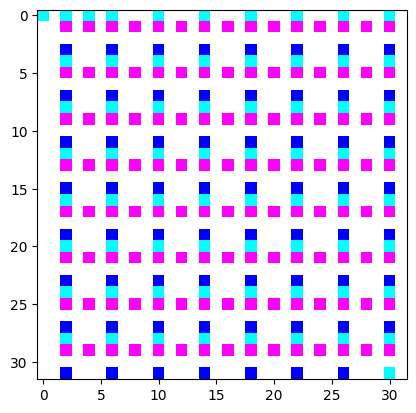

Epoch 570/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


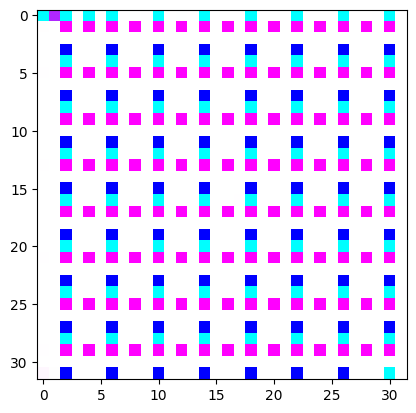

Epoch 571/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


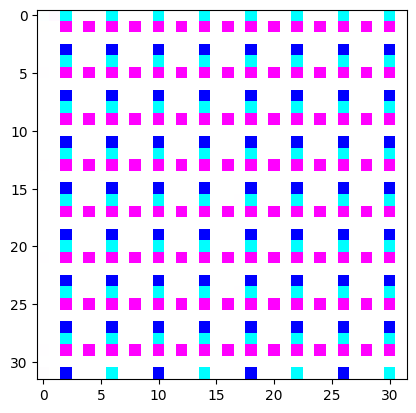

Epoch 572/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


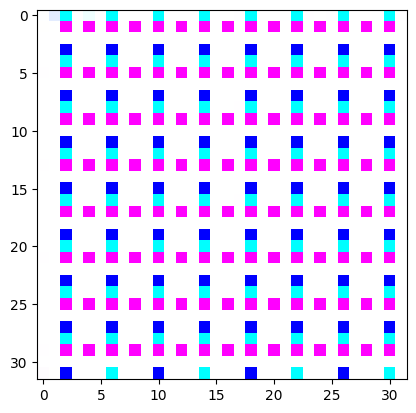

Epoch 573/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


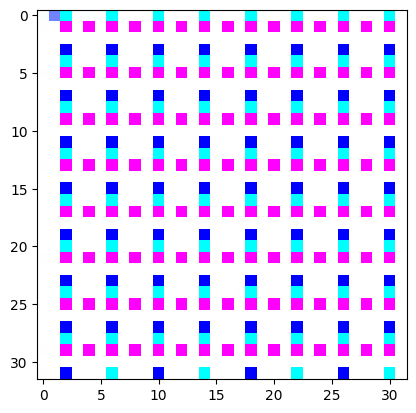

Epoch 574/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


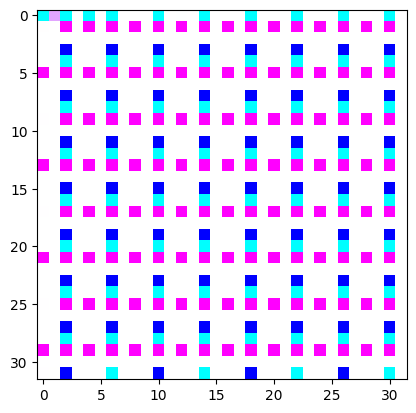

Epoch 575/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


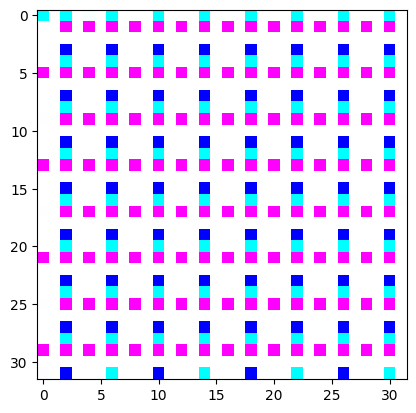

Epoch 576/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


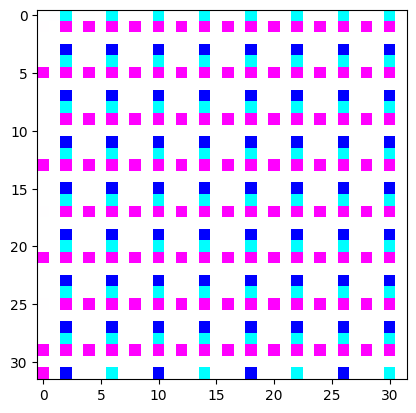

Epoch 577/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


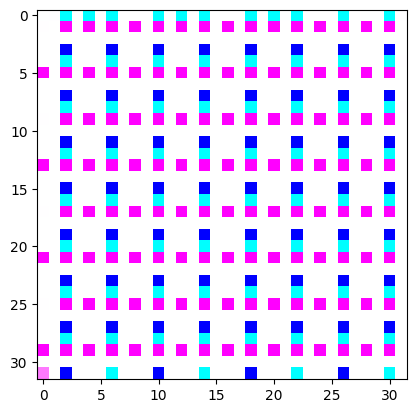

Epoch 578/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


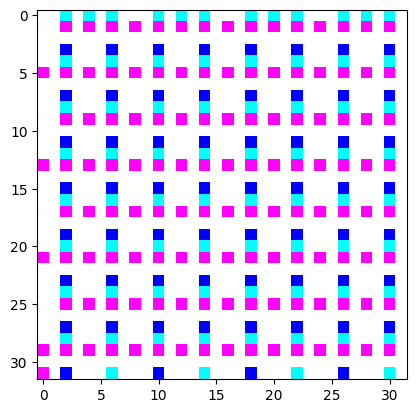

Epoch 579/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


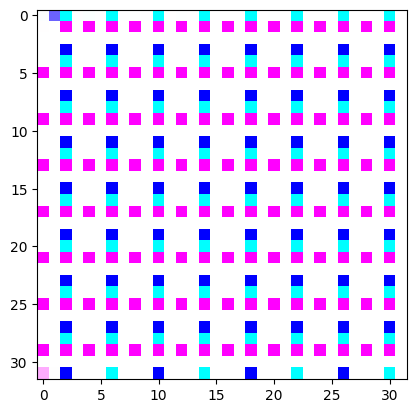

Epoch 580/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


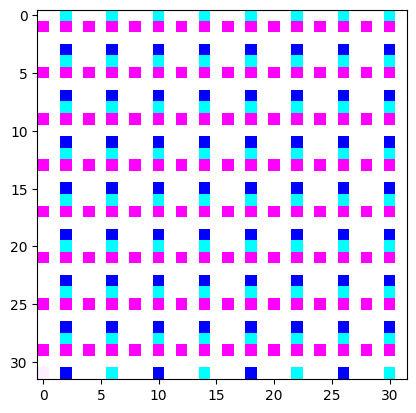

Epoch 581/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


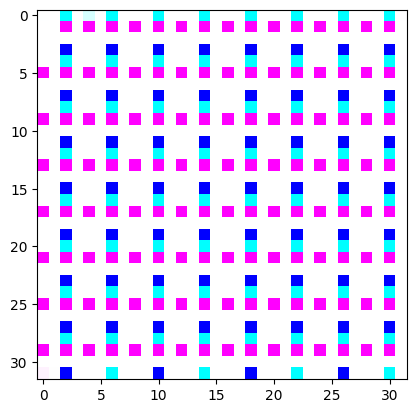

Epoch 582/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


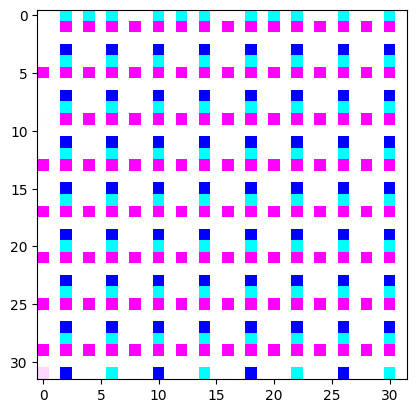

Epoch 583/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


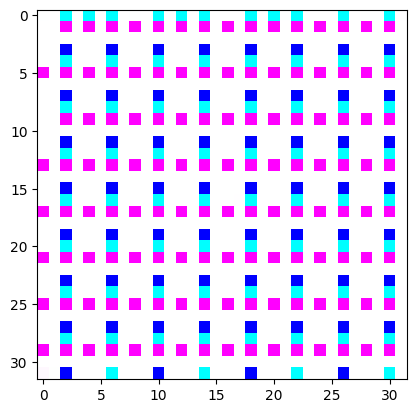

Epoch 584/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


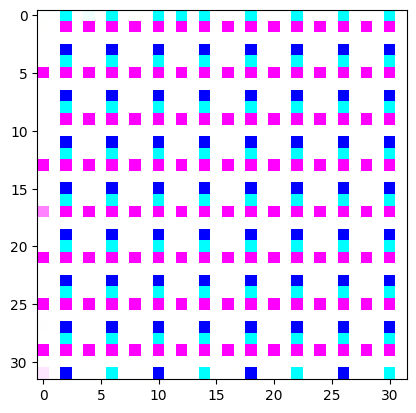

Epoch 585/1000


100%|██████████| 100/100 [00:18<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


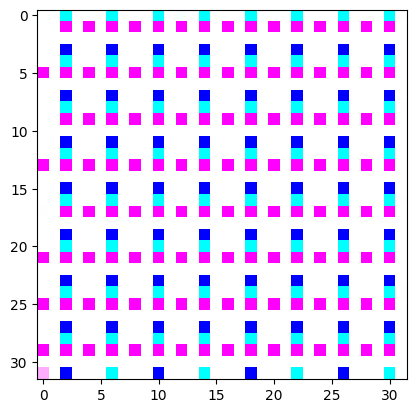

Epoch 586/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


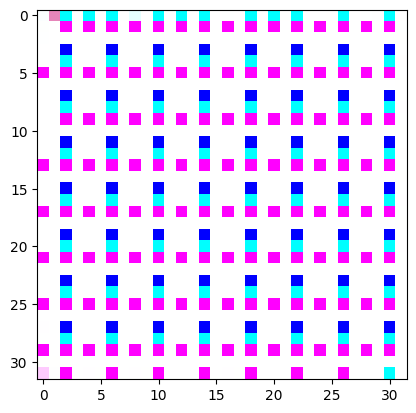

Epoch 587/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


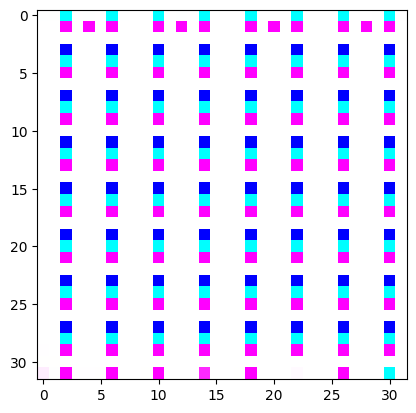

Epoch 588/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


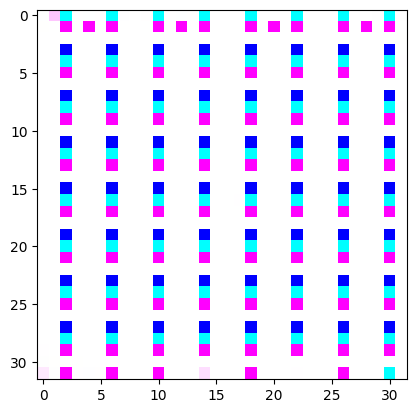

Epoch 589/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


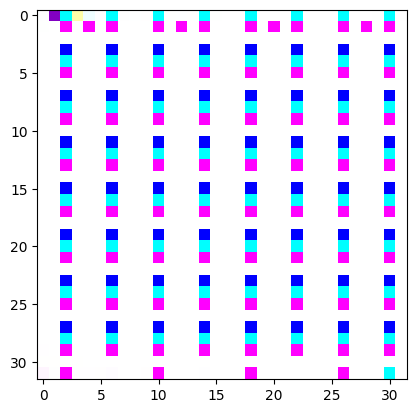

Epoch 590/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


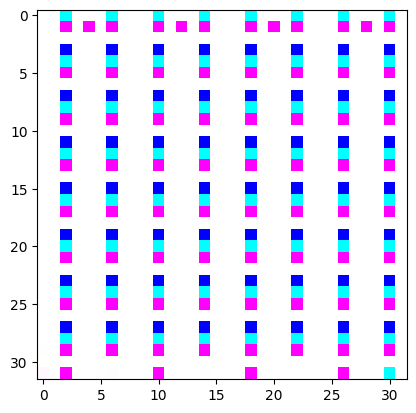

Epoch 591/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


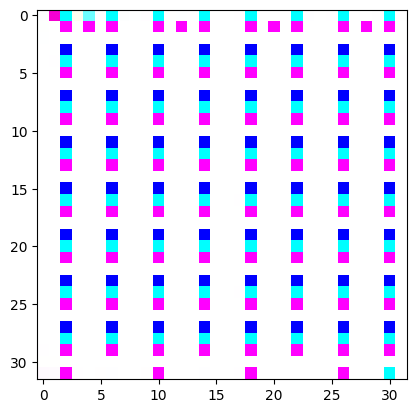

Epoch 592/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


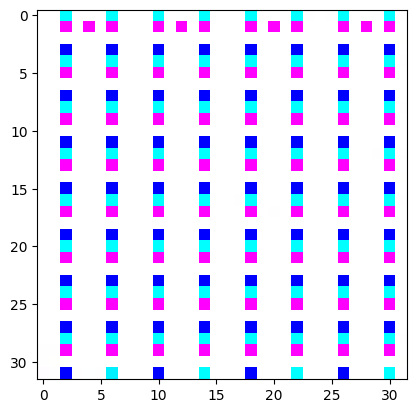

Epoch 593/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


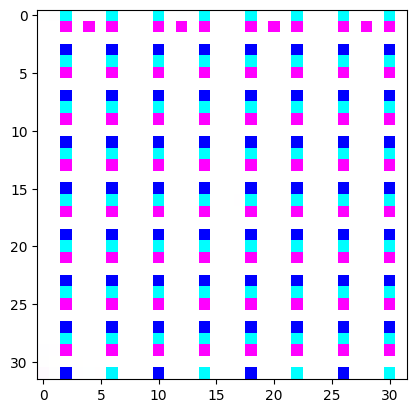

Epoch 594/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


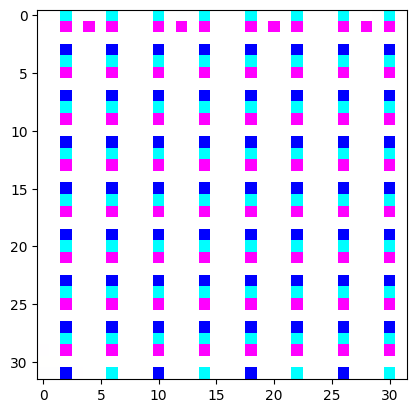

Epoch 595/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


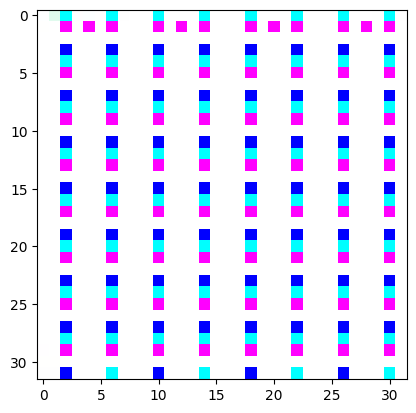

Epoch 596/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


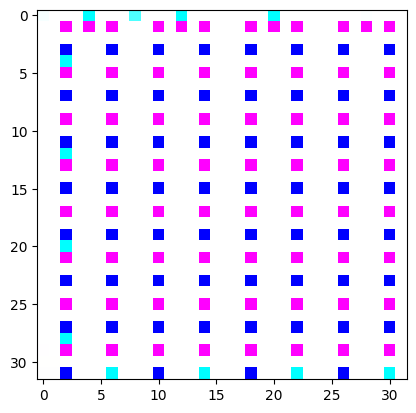

Epoch 597/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


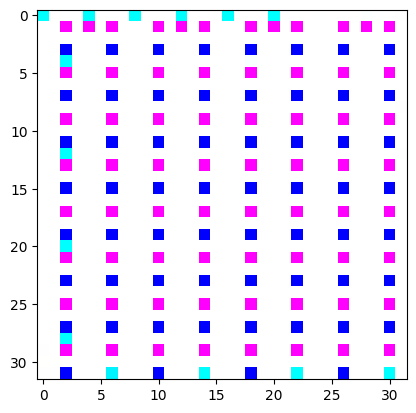

Epoch 598/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


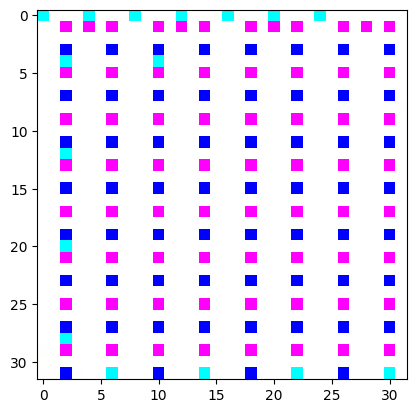

Epoch 599/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


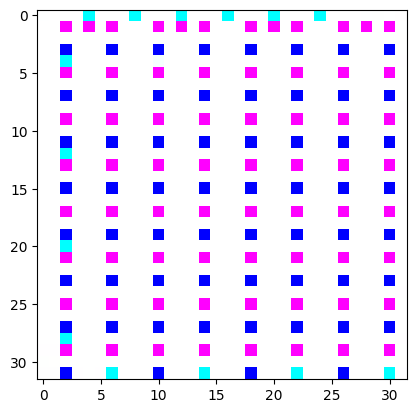

Epoch 600/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


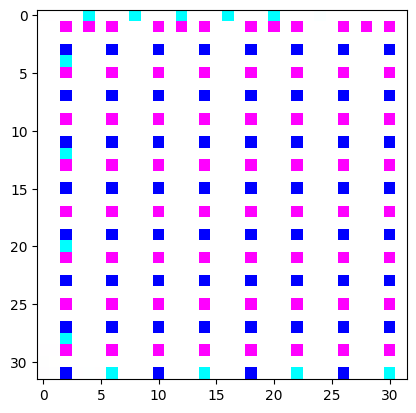

Epoch 601/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


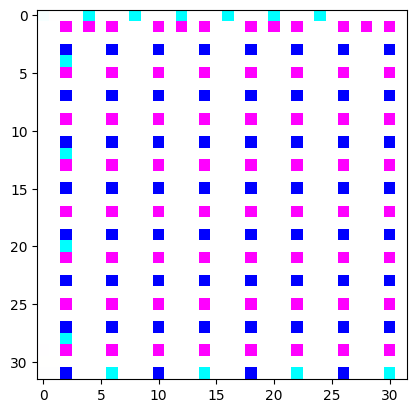

Epoch 602/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


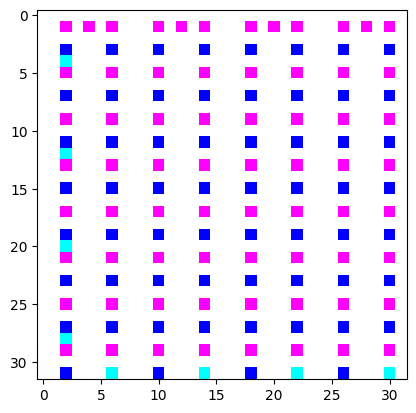

Epoch 603/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


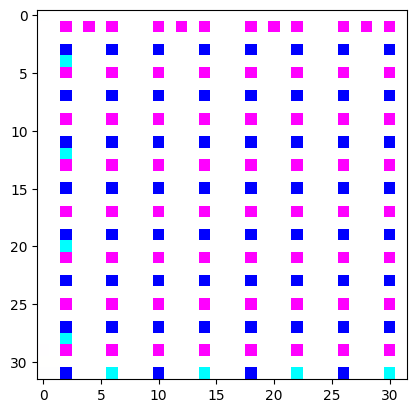

Epoch 604/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


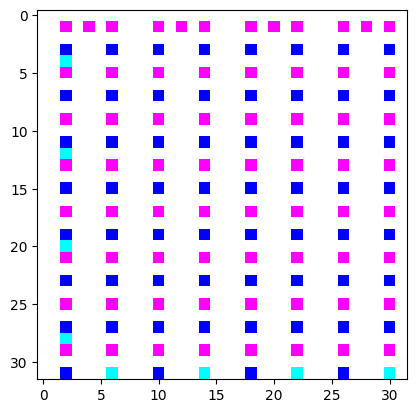

Epoch 605/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


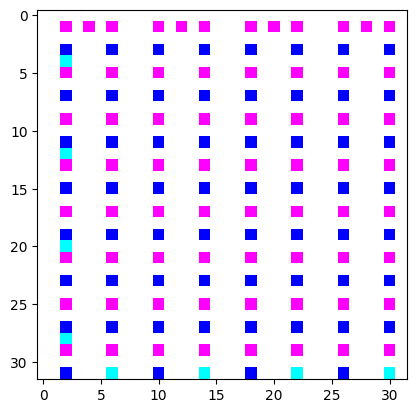

Epoch 606/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


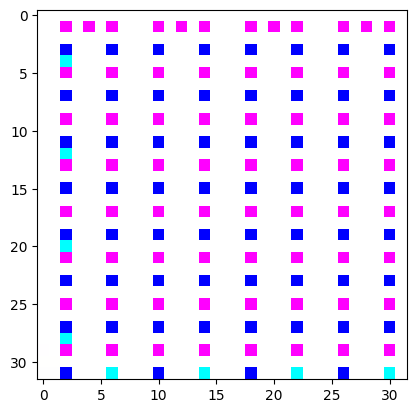

Epoch 607/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


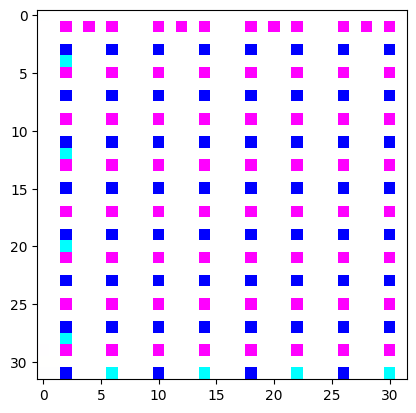

Epoch 608/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


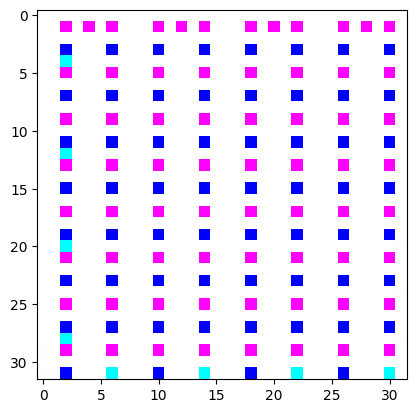

Epoch 609/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


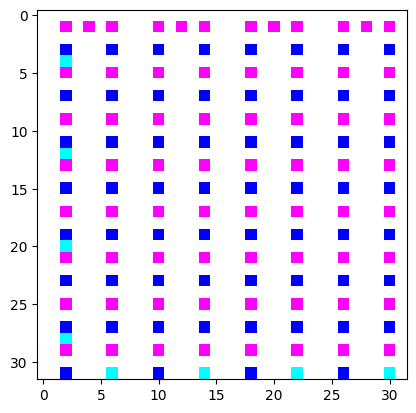

Epoch 610/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


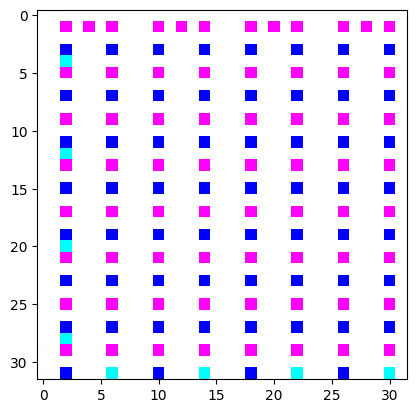

Epoch 611/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


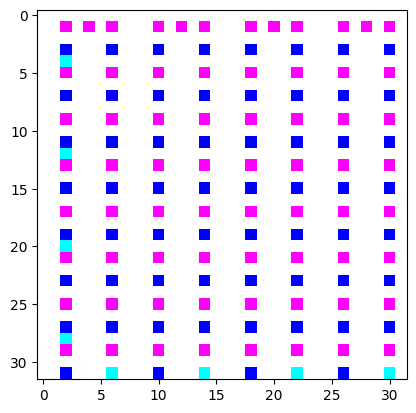

Epoch 612/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


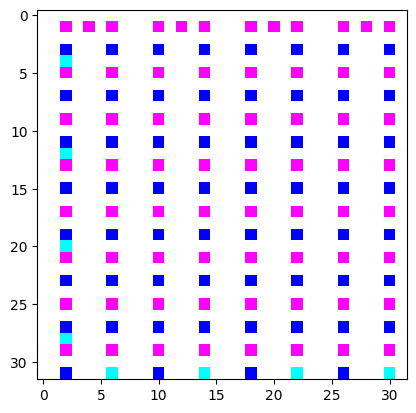

Epoch 613/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


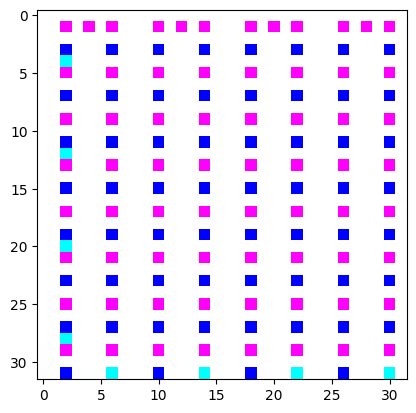

Epoch 614/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


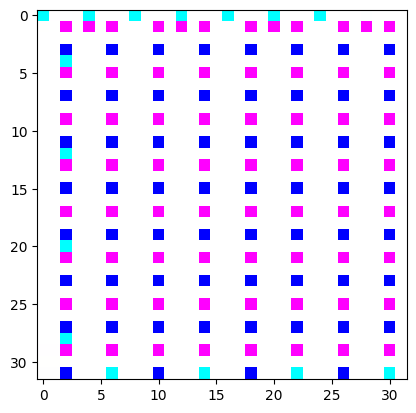

Epoch 615/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


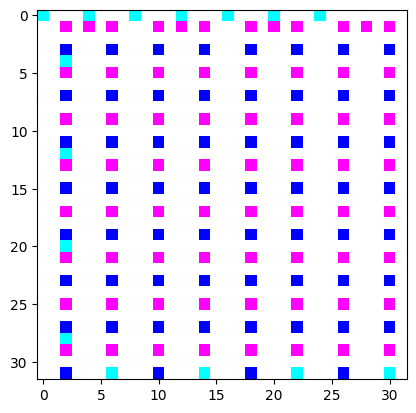

Epoch 616/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


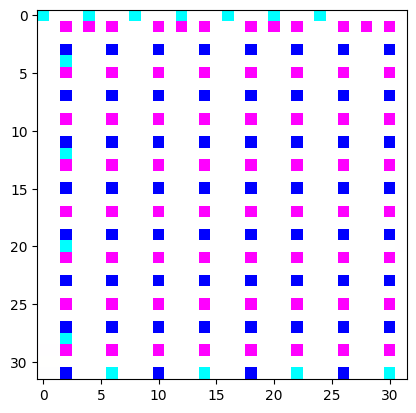

Epoch 617/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


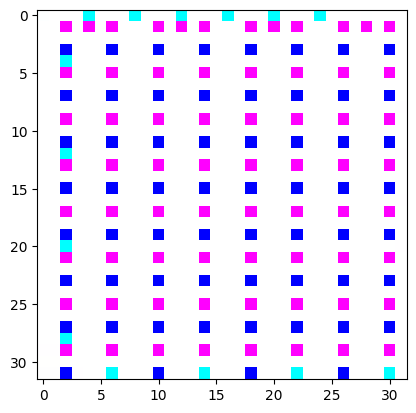

Epoch 618/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


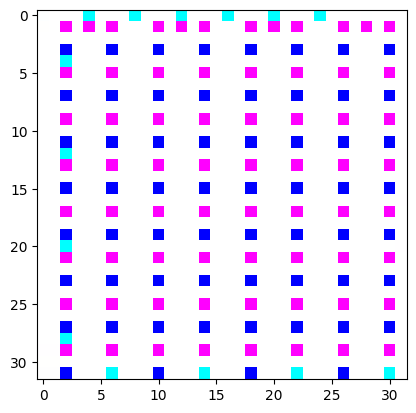

Epoch 619/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


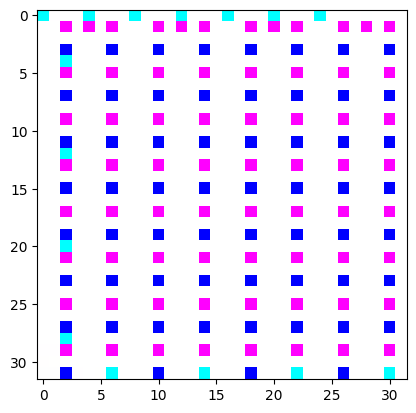

Epoch 620/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


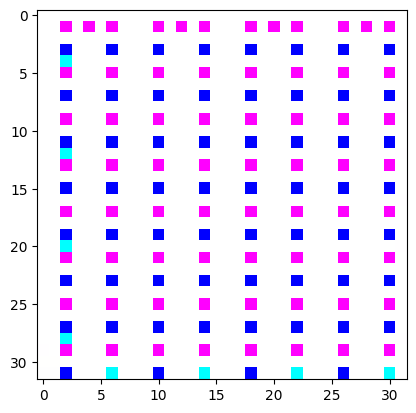

Epoch 621/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


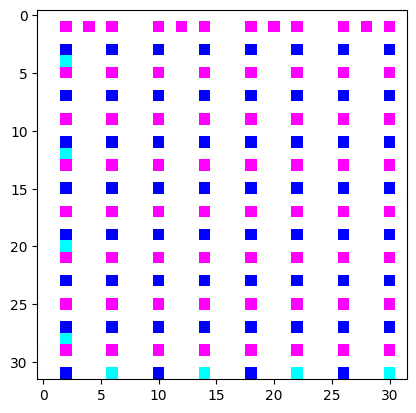

Epoch 622/1000


100%|██████████| 100/100 [00:18<00:00,  5.53it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


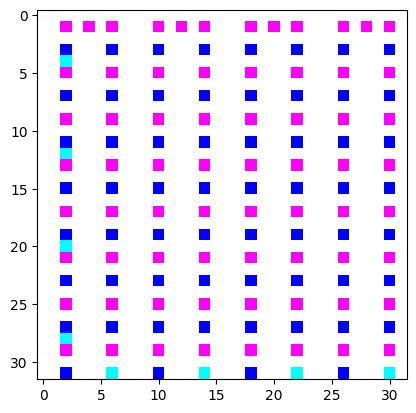

Epoch 623/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


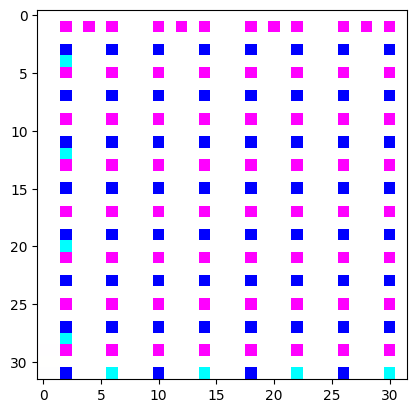

Epoch 624/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


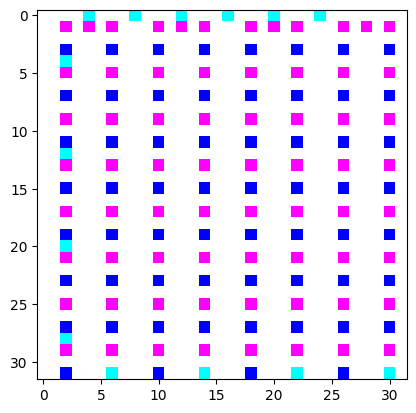

Epoch 625/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


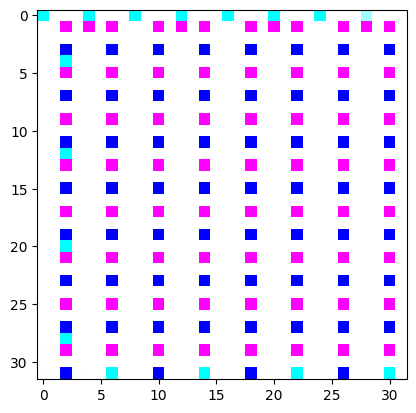

Epoch 626/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


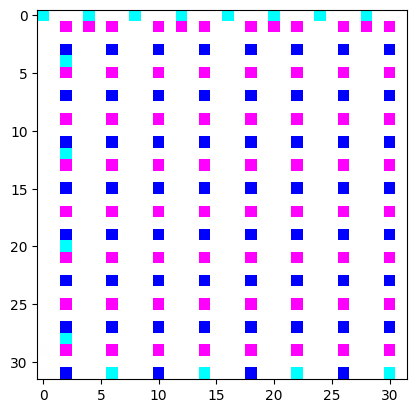

Epoch 627/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


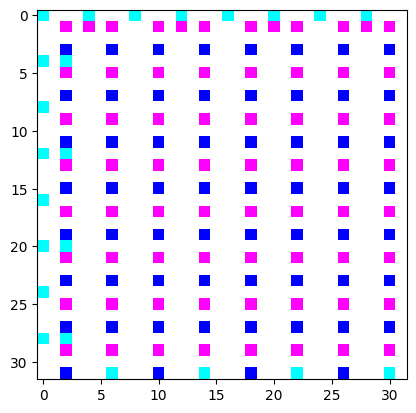

Epoch 628/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


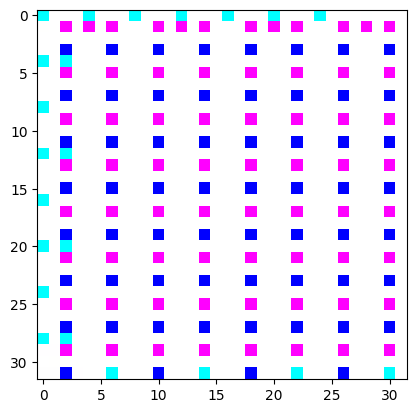

Epoch 629/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


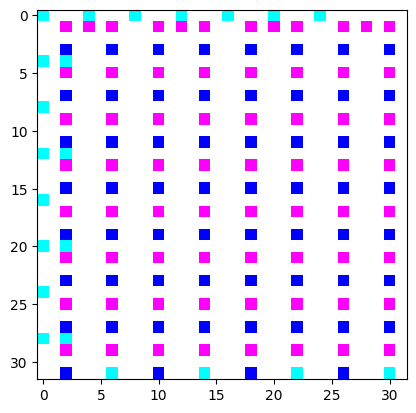

Epoch 630/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


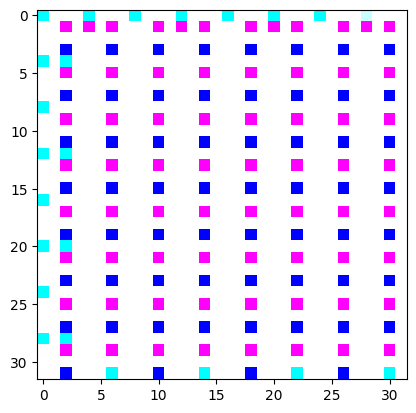

Epoch 631/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


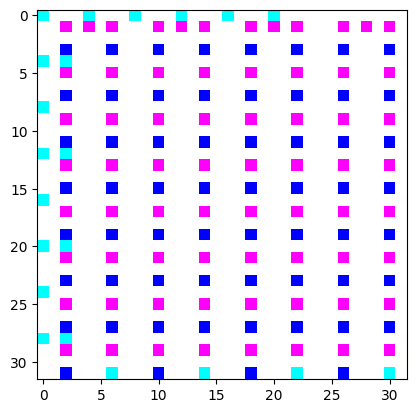

Epoch 632/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


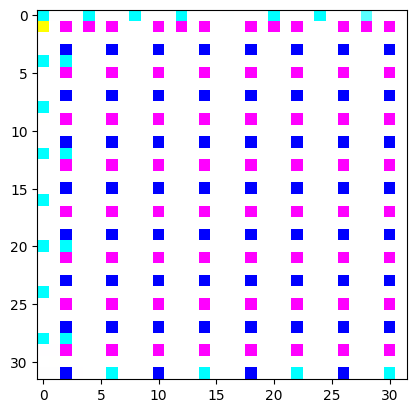

Epoch 633/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


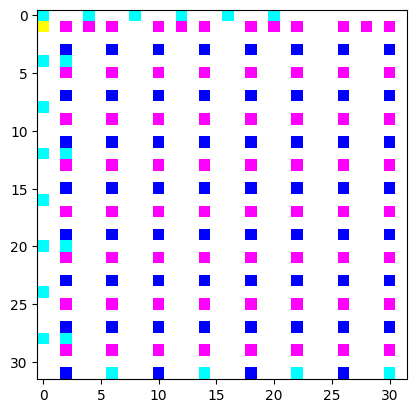

Epoch 634/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


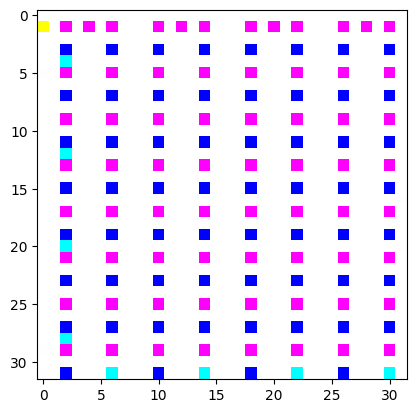

Epoch 635/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


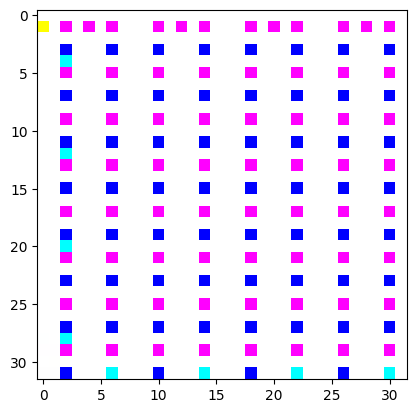

Epoch 636/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


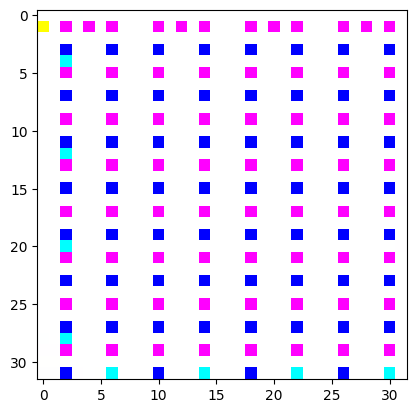

Epoch 637/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


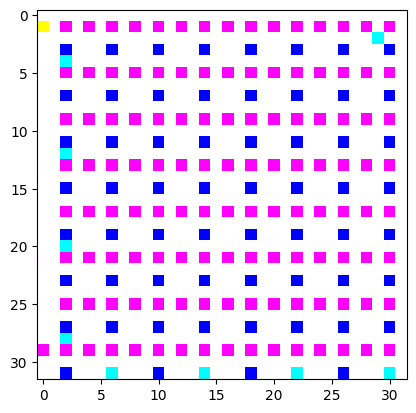

Epoch 638/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


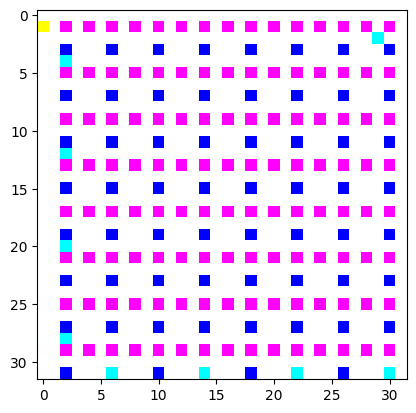

Epoch 639/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


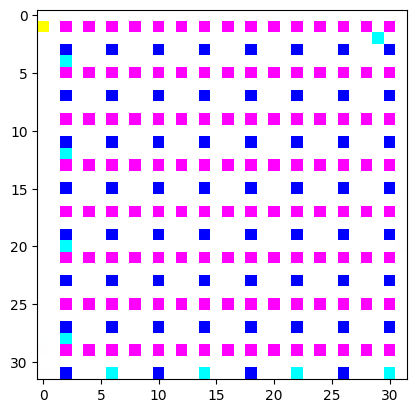

Epoch 640/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


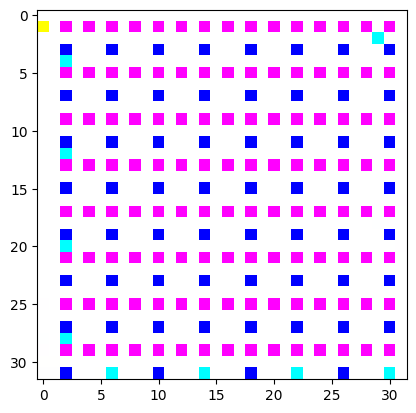

Epoch 641/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


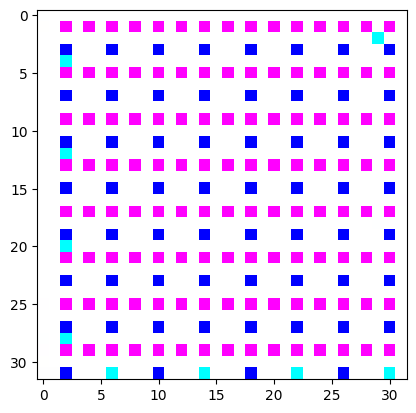

Epoch 642/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


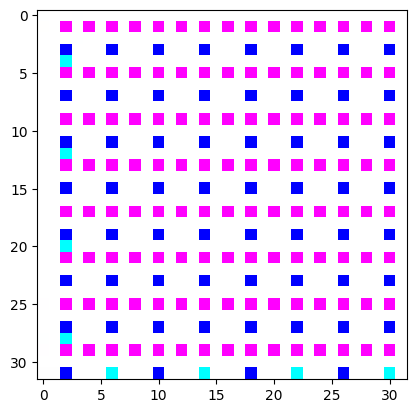

Epoch 643/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


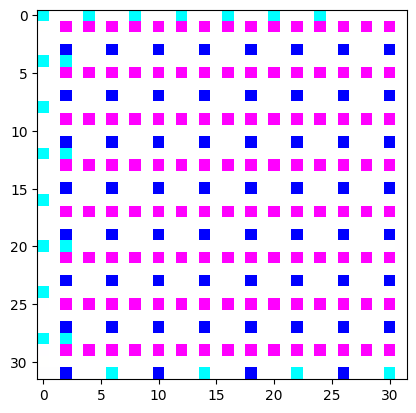

Epoch 644/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


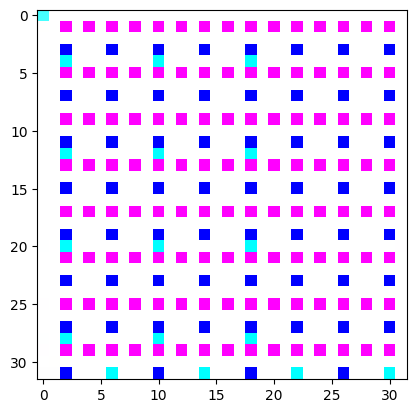

Epoch 645/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


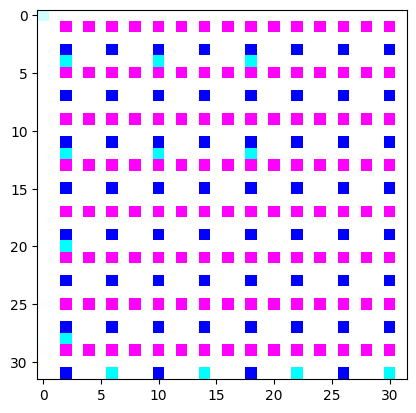

Epoch 646/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


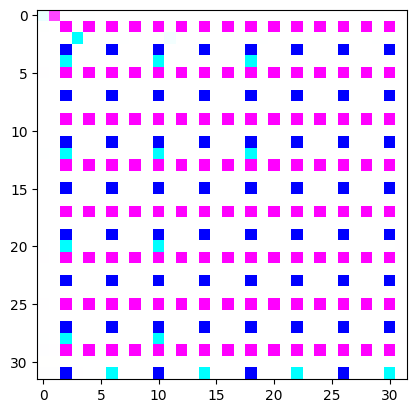

Epoch 647/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


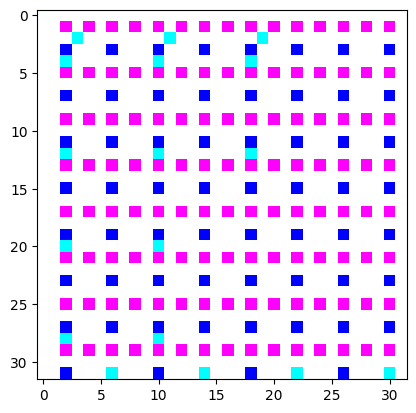

Epoch 648/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


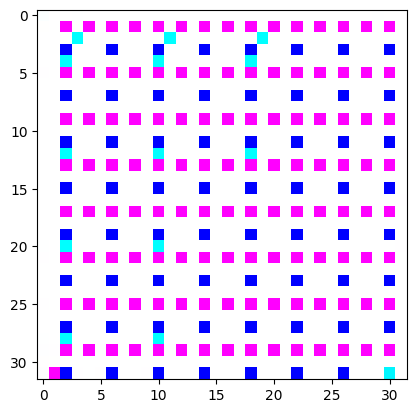

Epoch 649/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


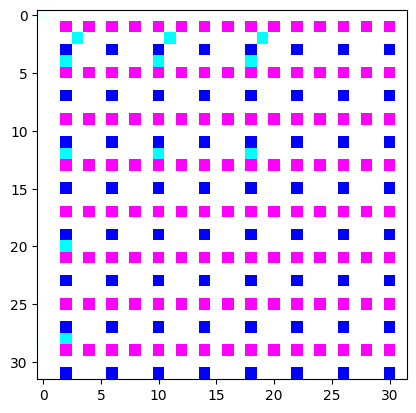

Epoch 650/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


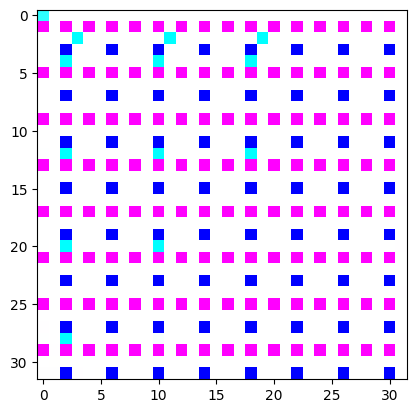

Epoch 651/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


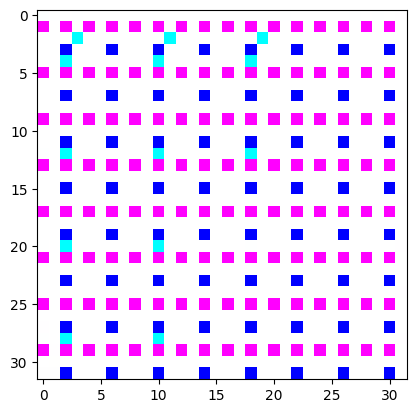

Epoch 652/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


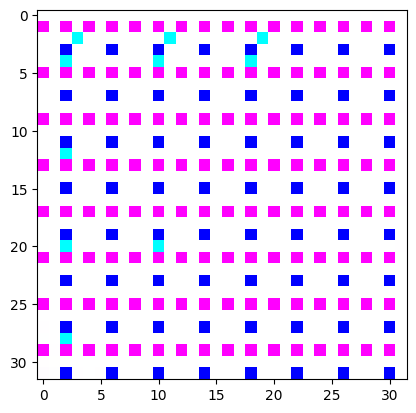

Epoch 653/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


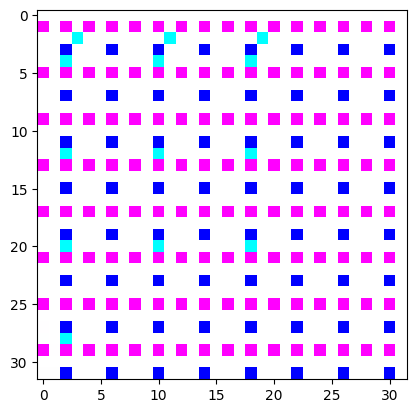

Epoch 654/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


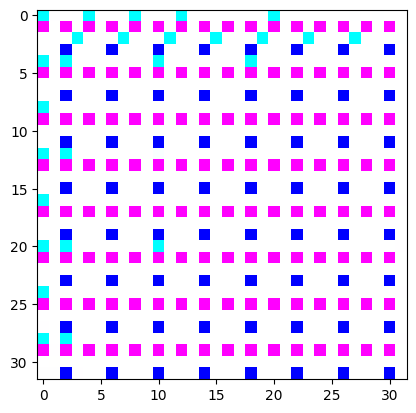

Epoch 655/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


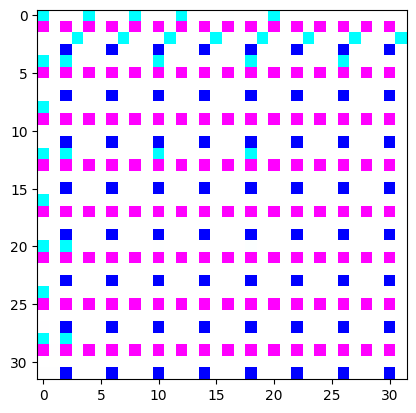

Epoch 656/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


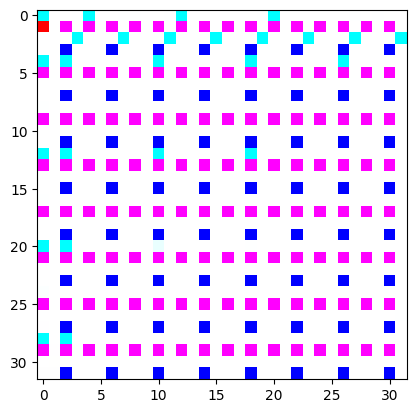

Epoch 657/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


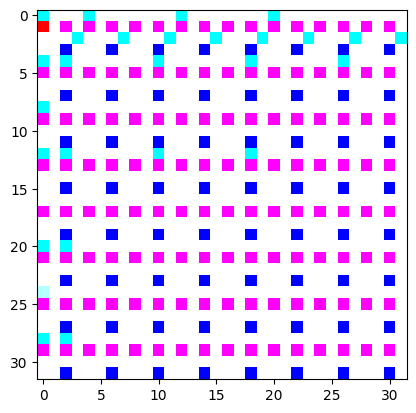

Epoch 658/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


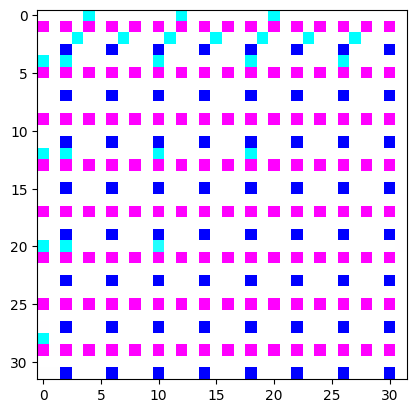

Epoch 659/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


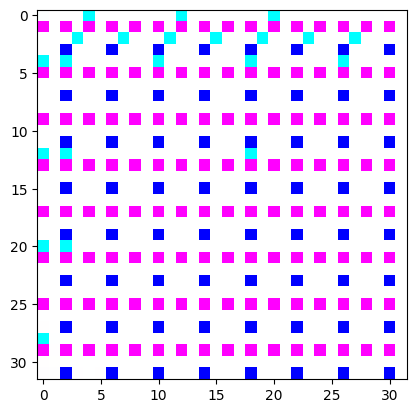

Epoch 660/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


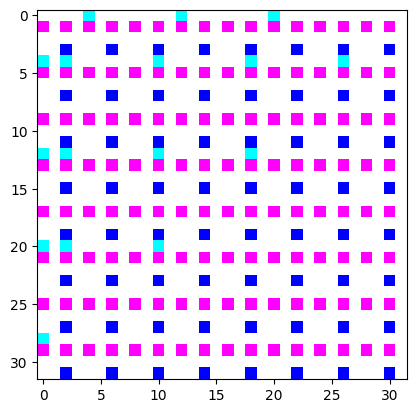

Epoch 661/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


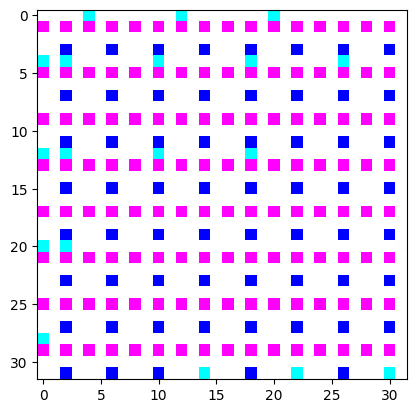

Epoch 662/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


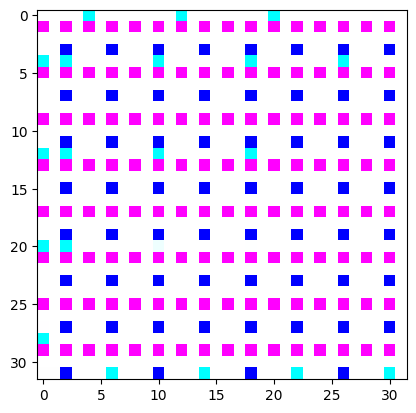

Epoch 663/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


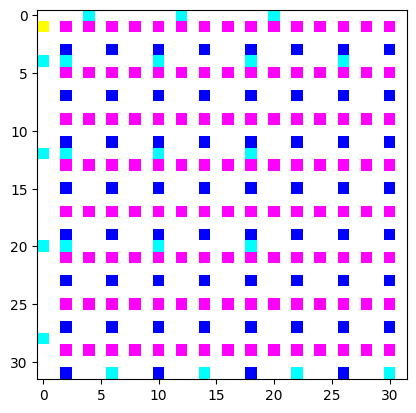

Epoch 664/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


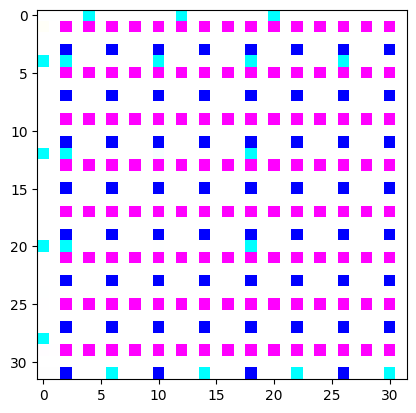

Epoch 665/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


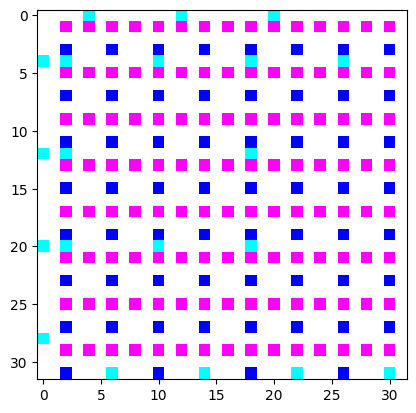

Epoch 666/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


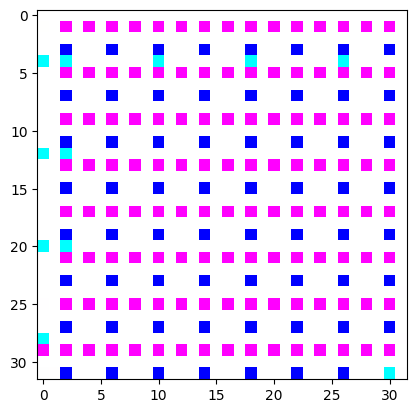

Epoch 667/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


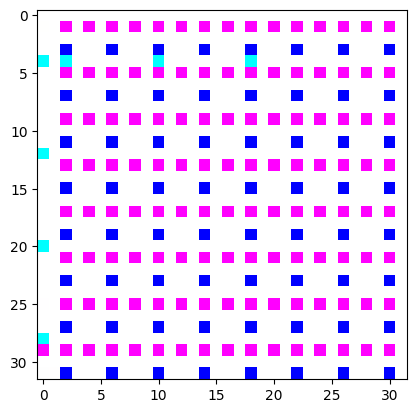

Epoch 668/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


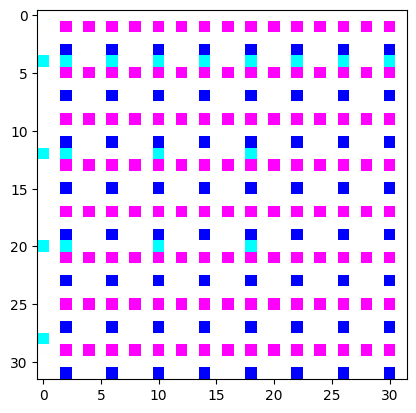

Epoch 669/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


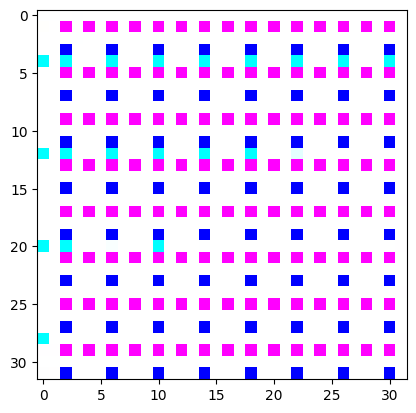

Epoch 670/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


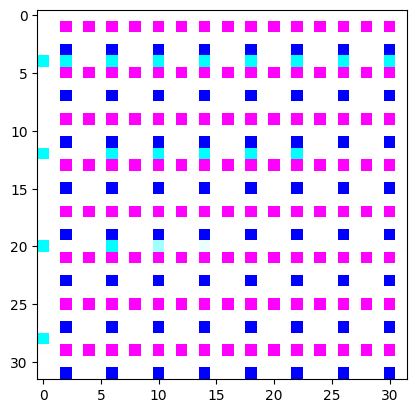

Epoch 671/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


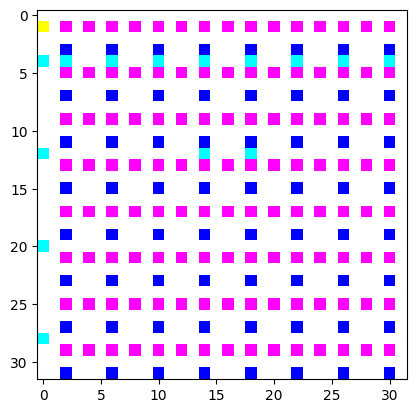

Epoch 672/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


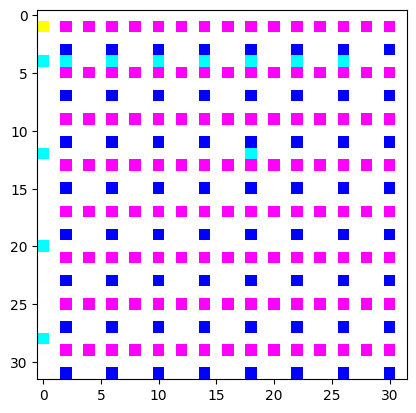

Epoch 673/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


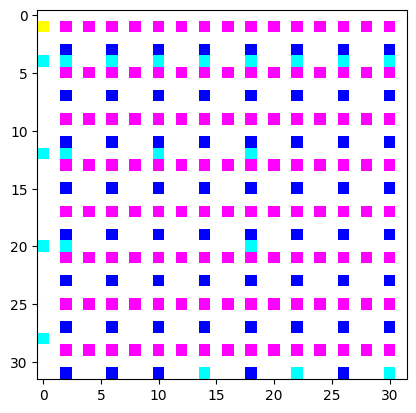

Epoch 674/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


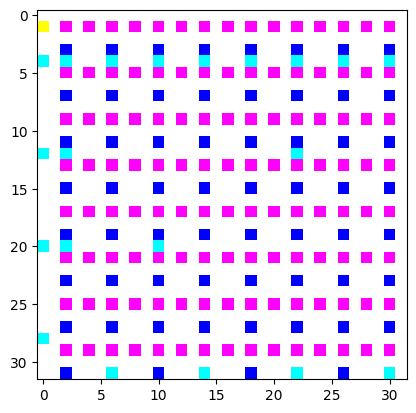

Epoch 675/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


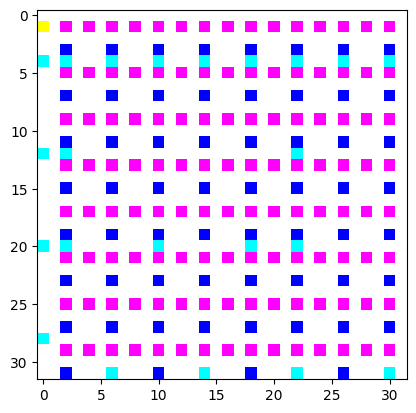

Epoch 676/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


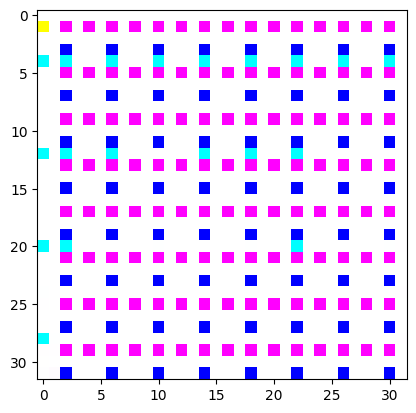

Epoch 677/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


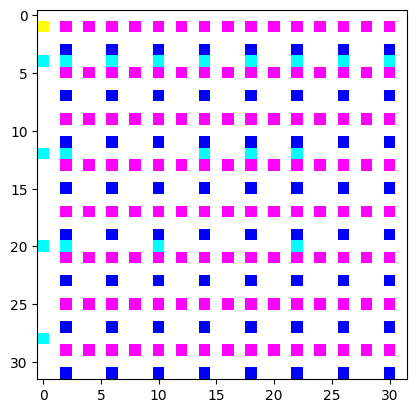

Epoch 678/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


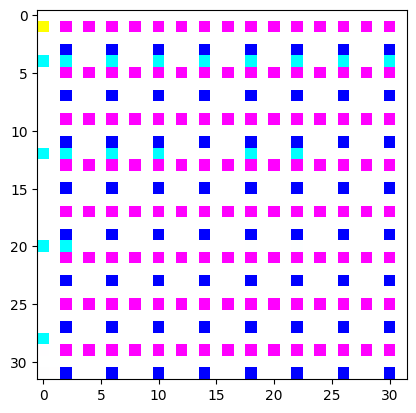

Epoch 679/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


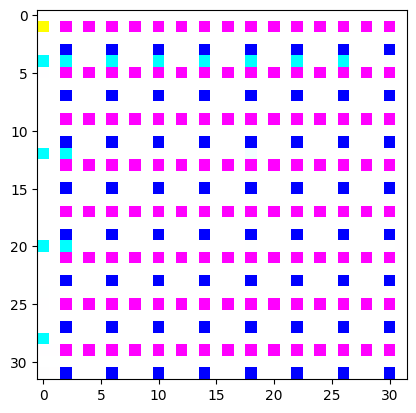

Epoch 680/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


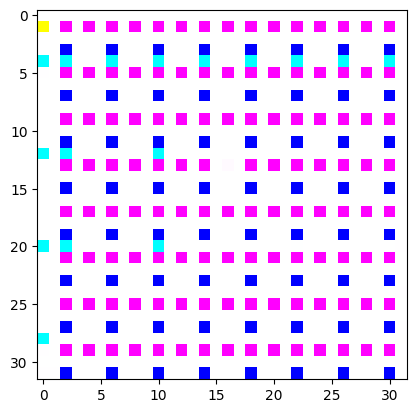

Epoch 681/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


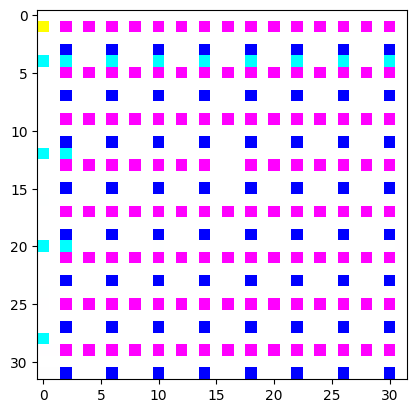

Epoch 682/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


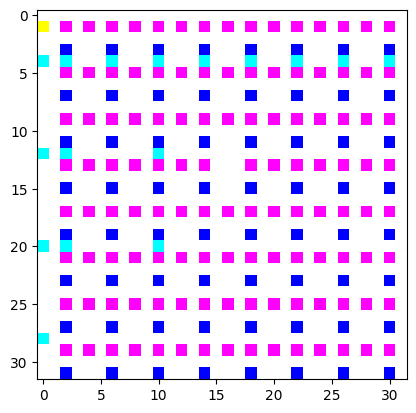

Epoch 683/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


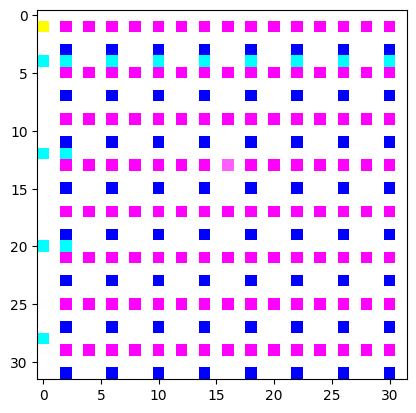

Epoch 684/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


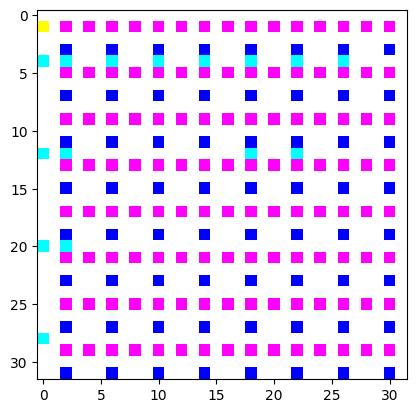

Epoch 685/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


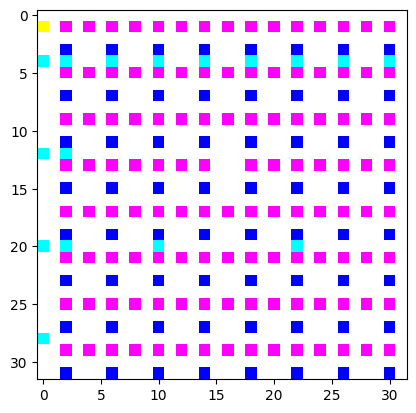

Epoch 686/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


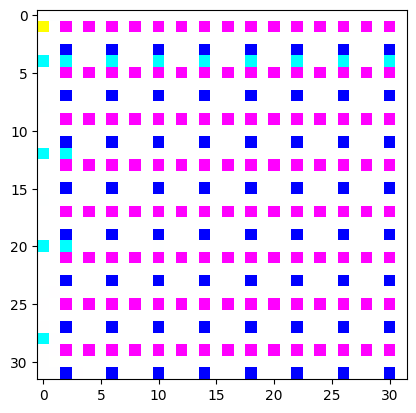

Epoch 687/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


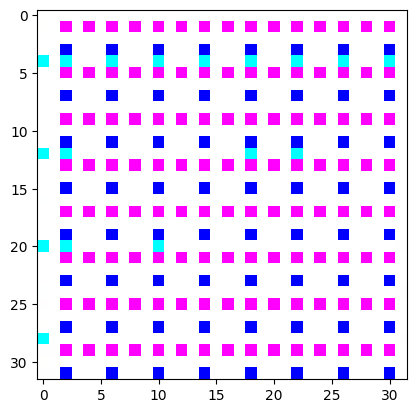

Epoch 688/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


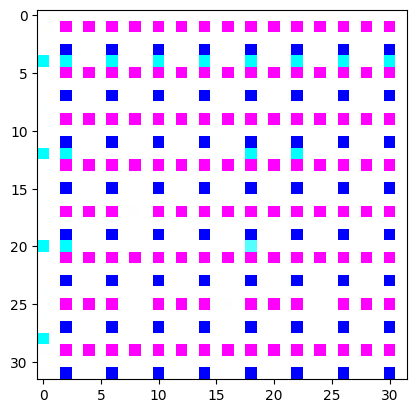

Epoch 689/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


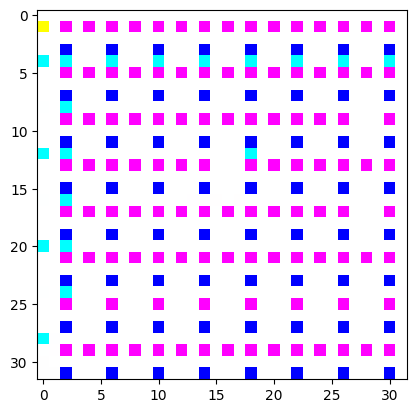

Epoch 690/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


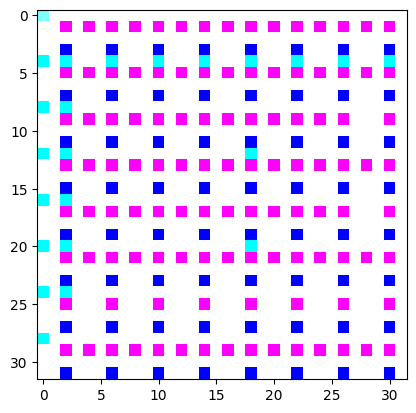

Epoch 691/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


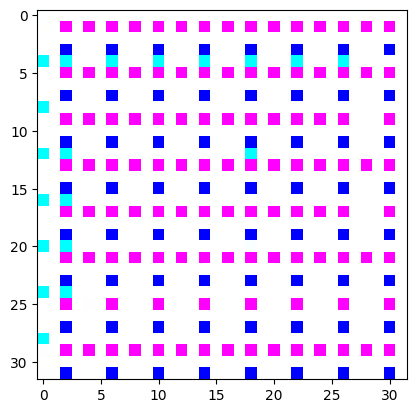

Epoch 692/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


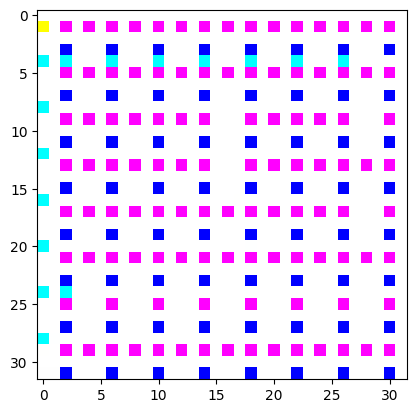

Epoch 693/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


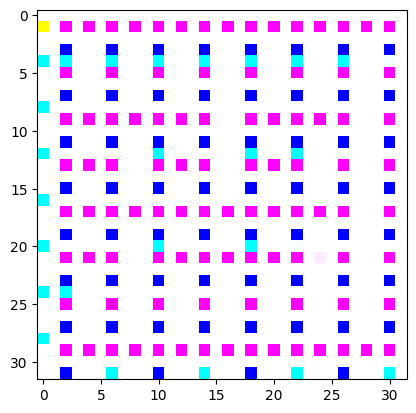

Epoch 694/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


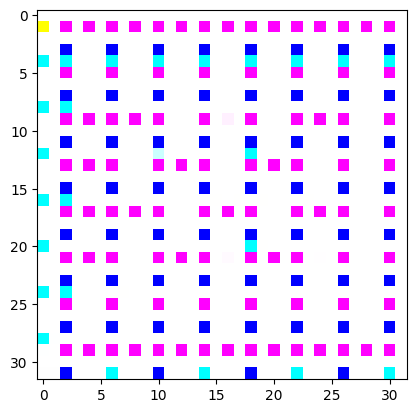

Epoch 695/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


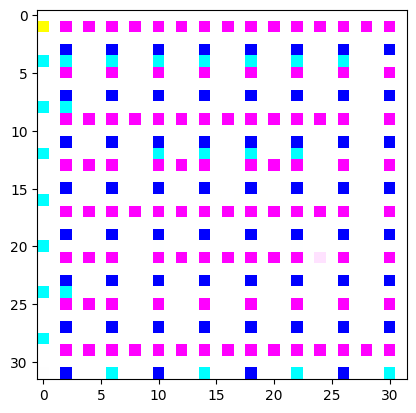

Epoch 696/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


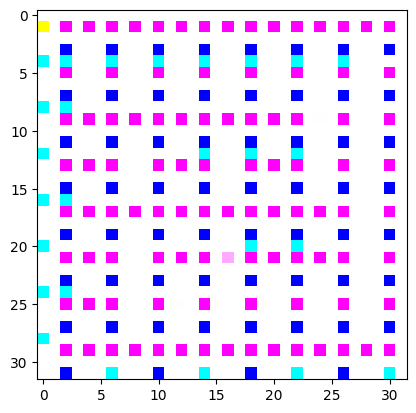

Epoch 697/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


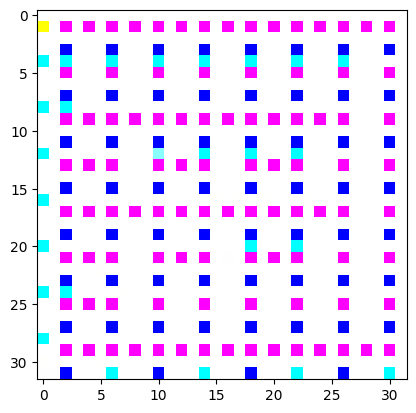

Epoch 698/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


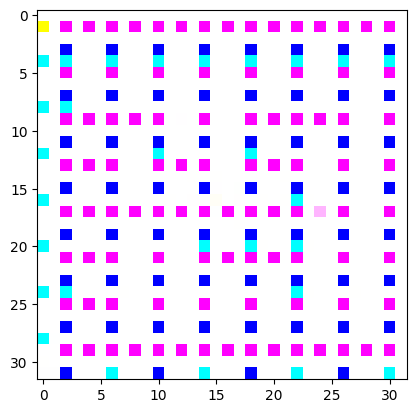

Epoch 699/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


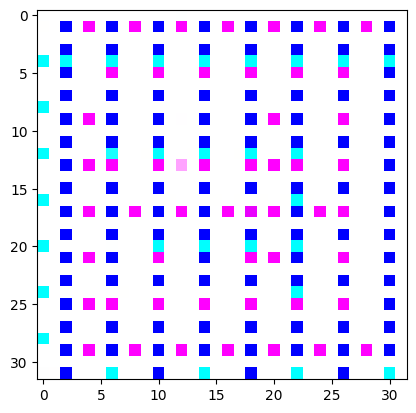

Epoch 700/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


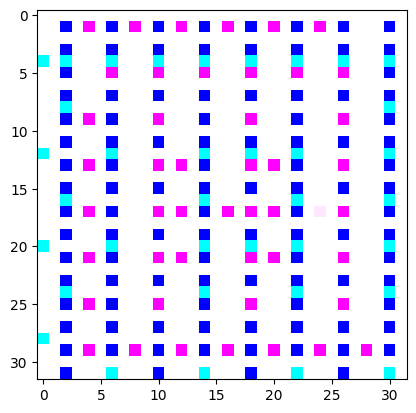

Epoch 701/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


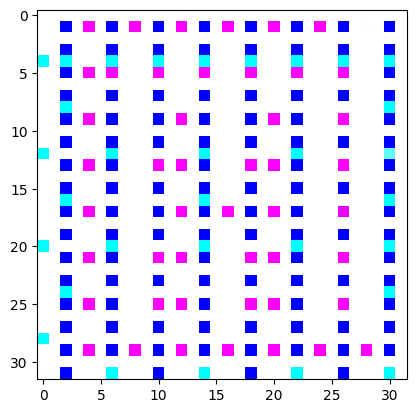

Epoch 702/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


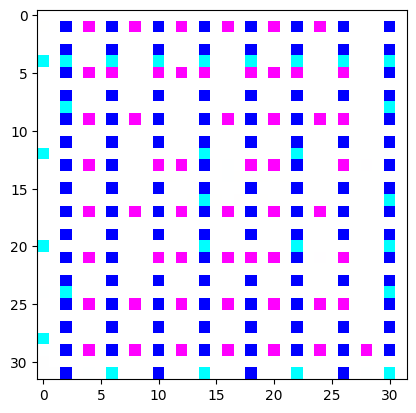

Epoch 703/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


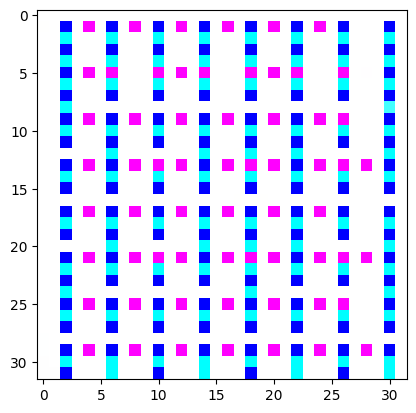

Epoch 704/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


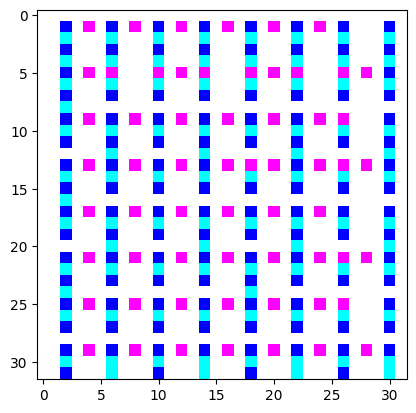

Epoch 705/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


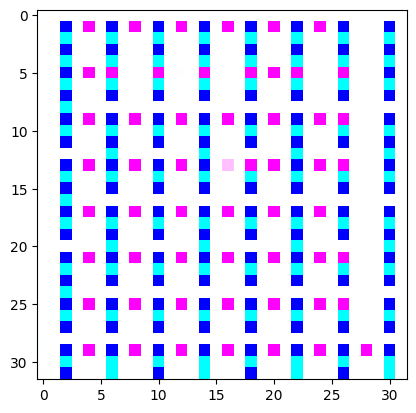

Epoch 706/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


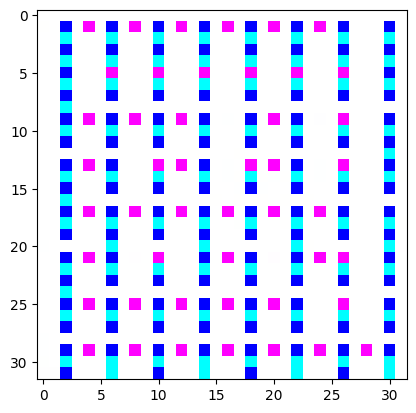

Epoch 707/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


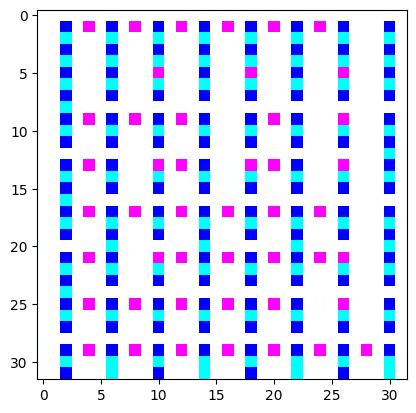

Epoch 708/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


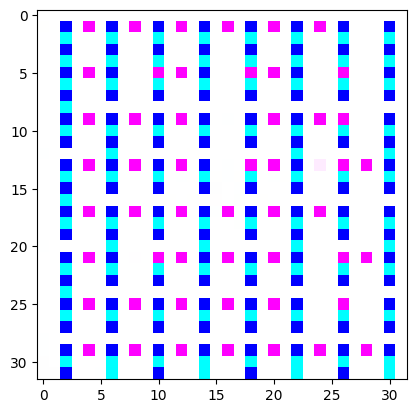

Epoch 709/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


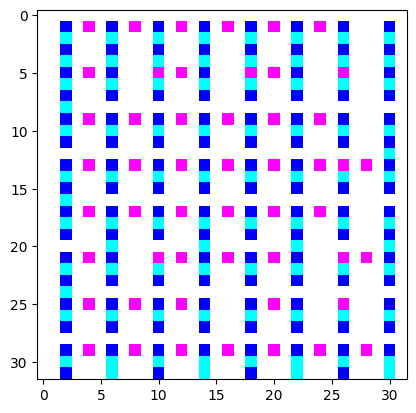

Epoch 710/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


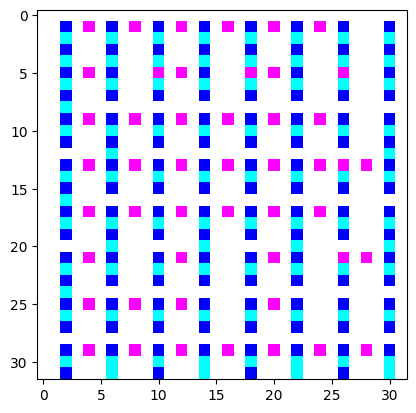

Epoch 711/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


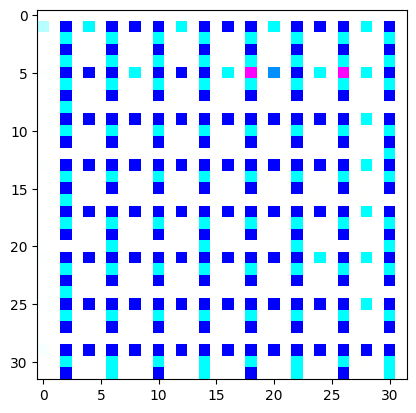

Epoch 712/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


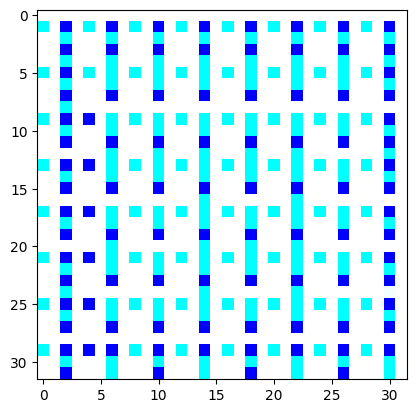

Epoch 713/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


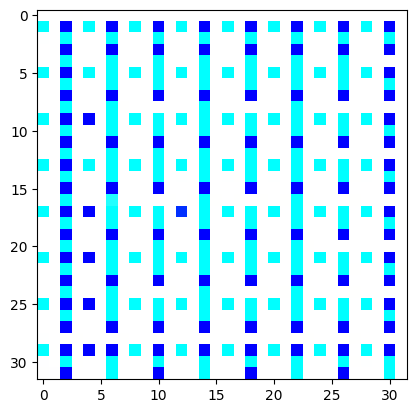

Epoch 714/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


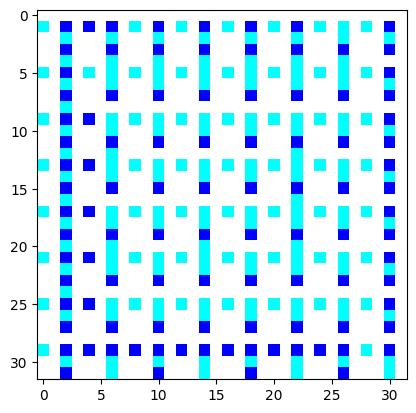

Epoch 715/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


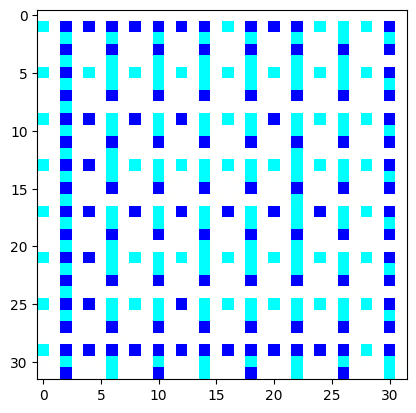

Epoch 716/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


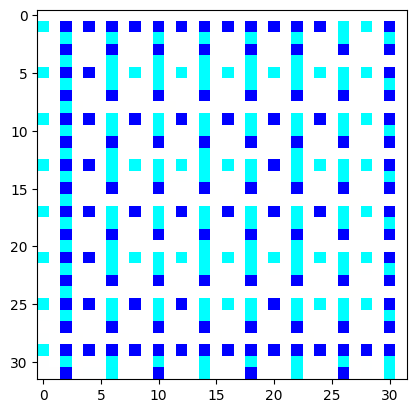

Epoch 717/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


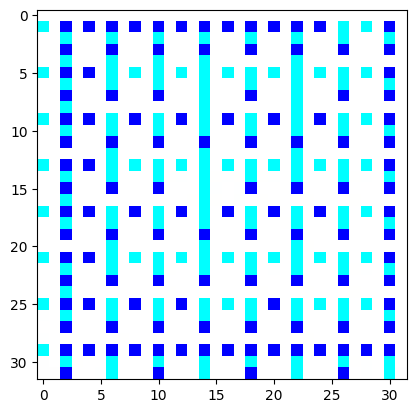

Epoch 718/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


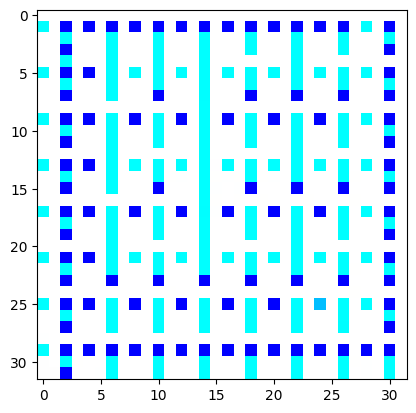

Epoch 719/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


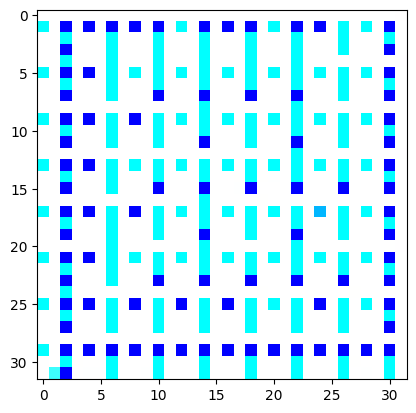

Epoch 720/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


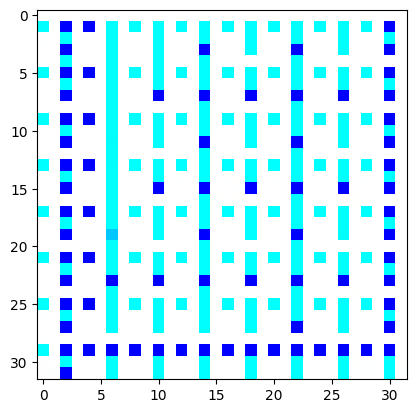

Epoch 721/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


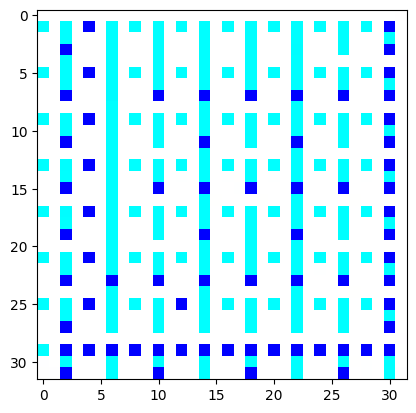

Epoch 722/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


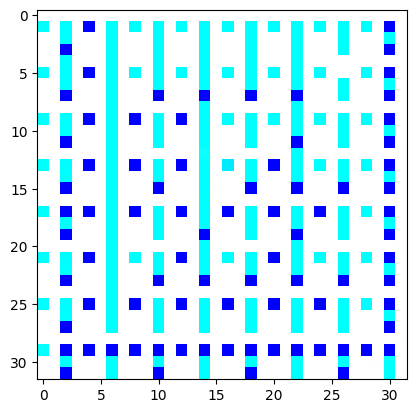

Epoch 723/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


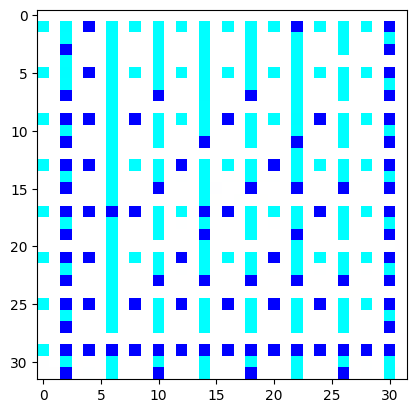

Epoch 724/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


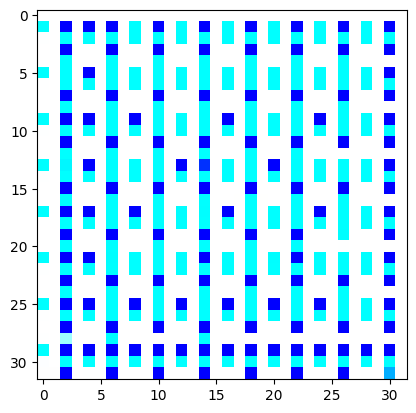

Epoch 725/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


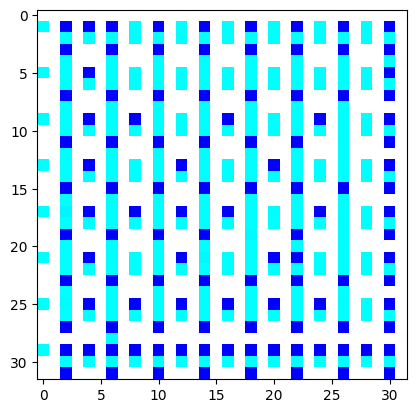

Epoch 726/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


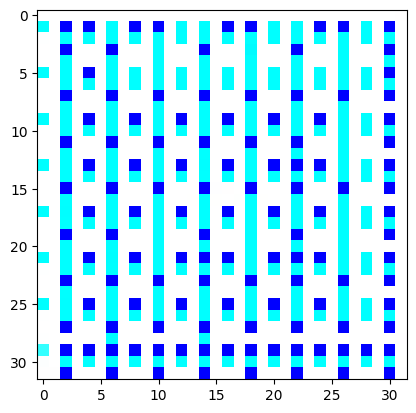

Epoch 727/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


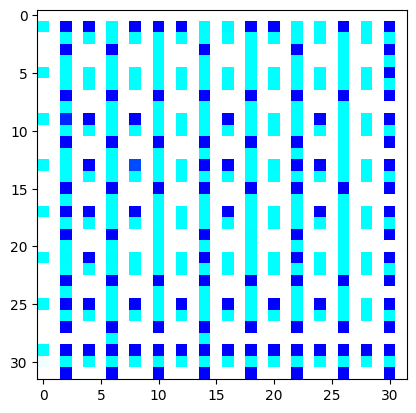

Epoch 728/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


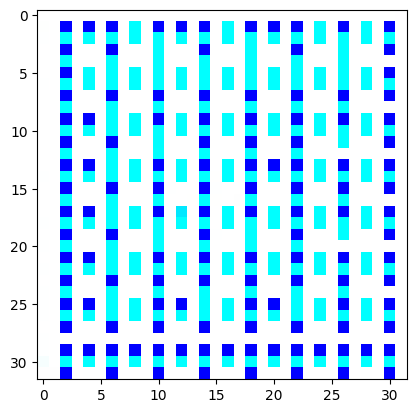

Epoch 729/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


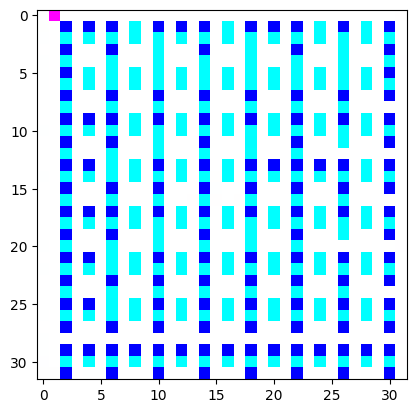

Epoch 730/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


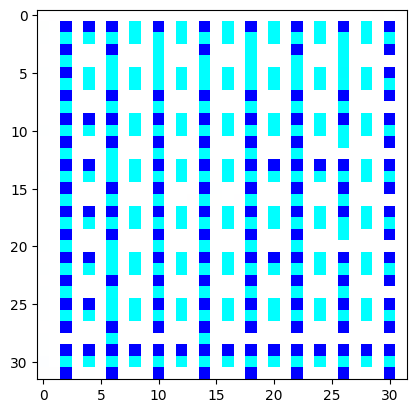

Epoch 731/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


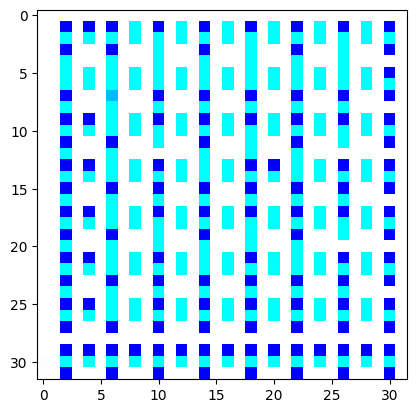

Epoch 732/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


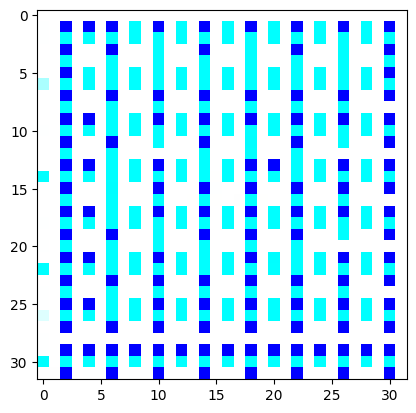

Epoch 733/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


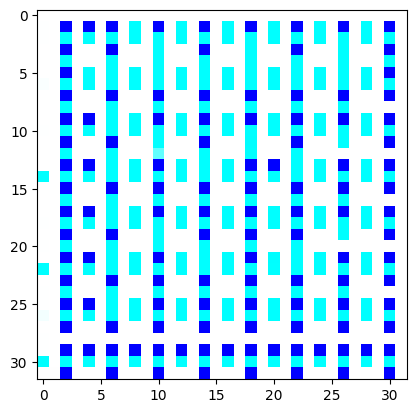

Epoch 734/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


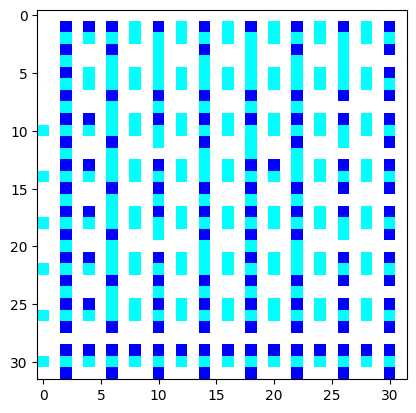

Epoch 735/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


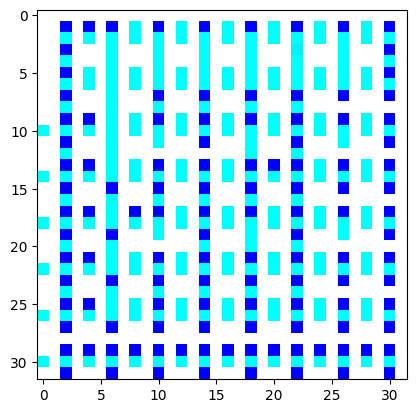

Epoch 736/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


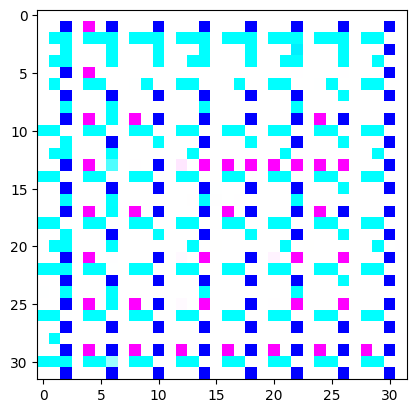

Epoch 737/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


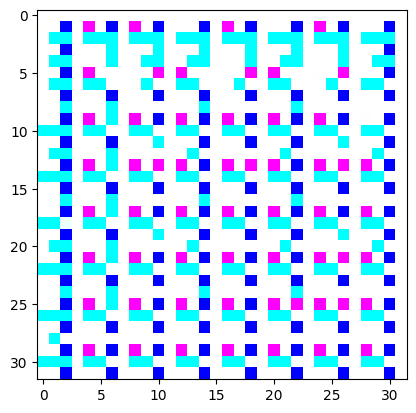

Epoch 738/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


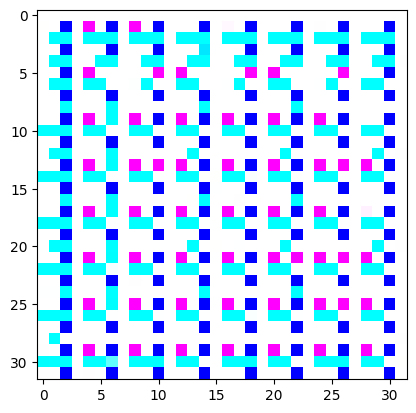

Epoch 739/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


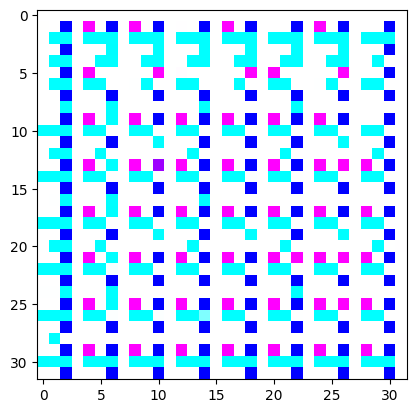

Epoch 740/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


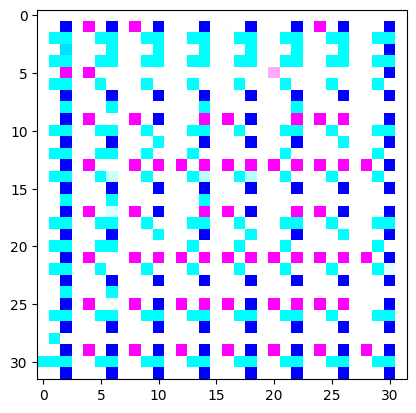

Epoch 741/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


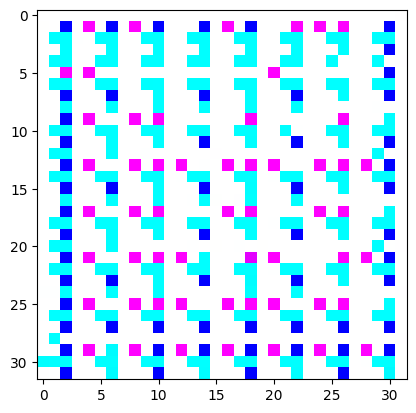

Epoch 742/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


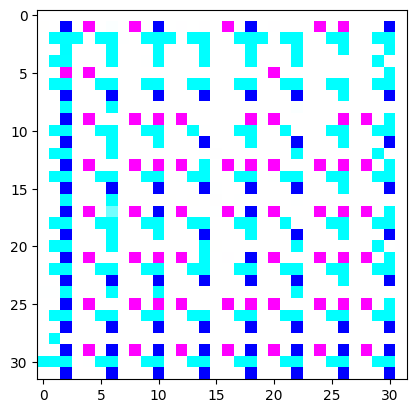

Epoch 743/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


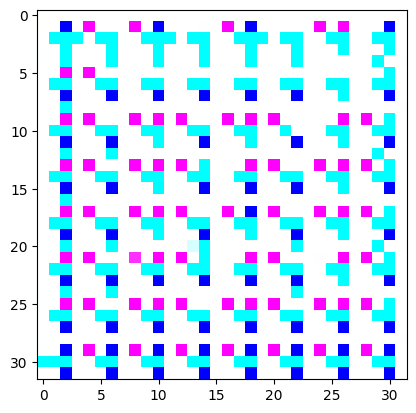

Epoch 744/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


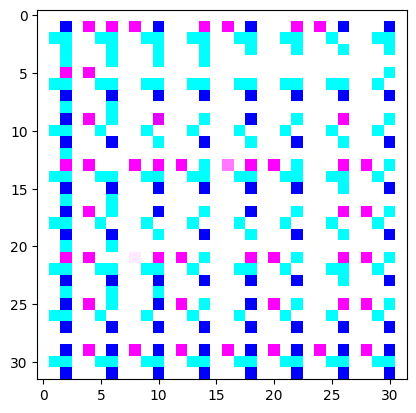

Epoch 745/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


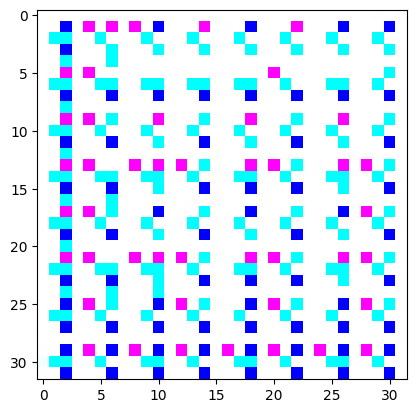

Epoch 746/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


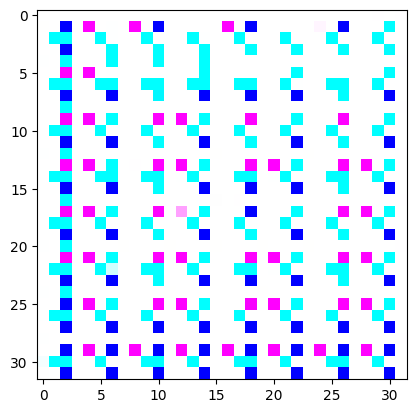

Epoch 747/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


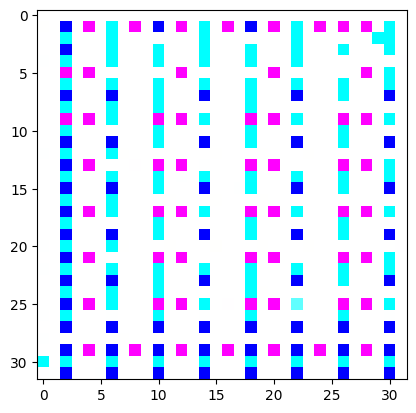

Epoch 748/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


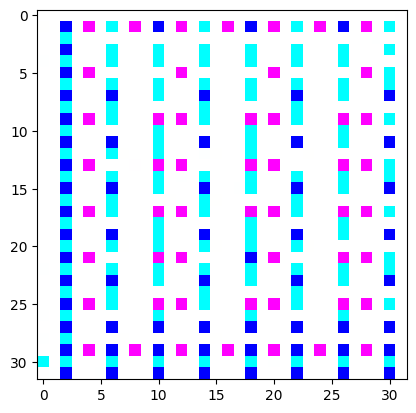

Epoch 749/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


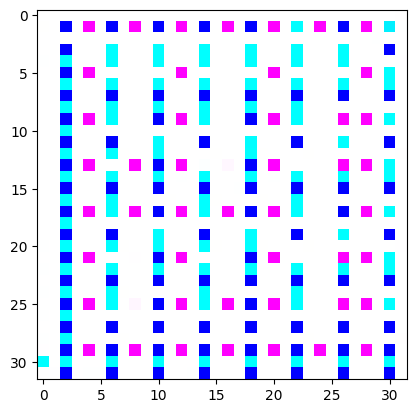

Epoch 750/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


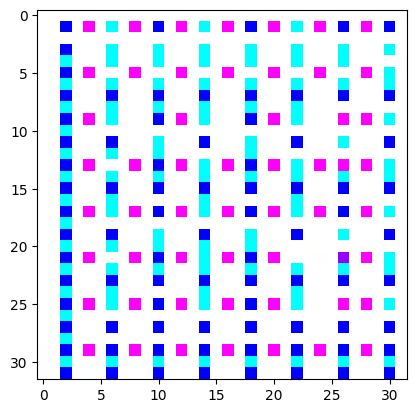

Epoch 751/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


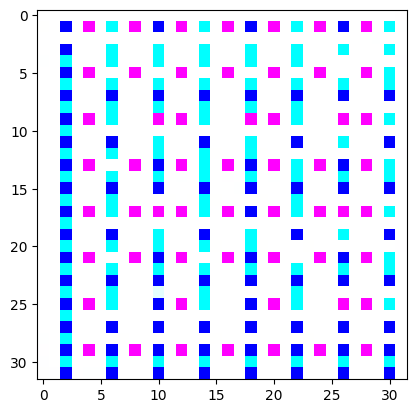

Epoch 752/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


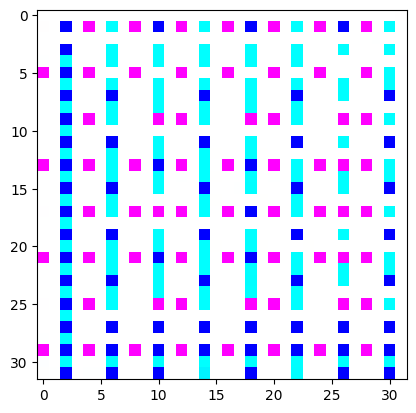

Epoch 753/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


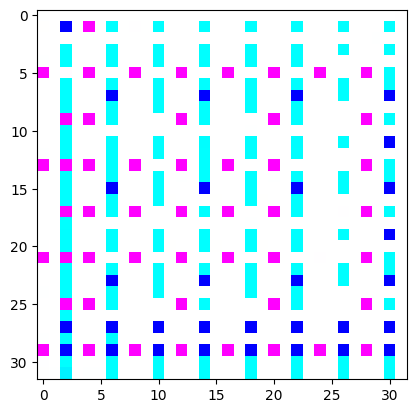

Epoch 754/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


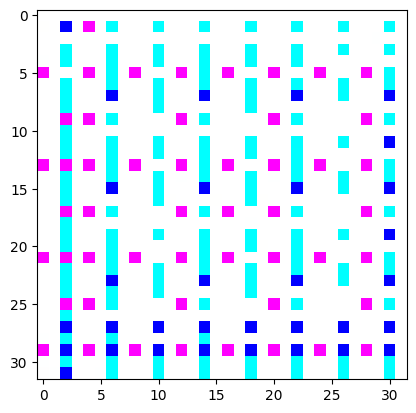

Epoch 755/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


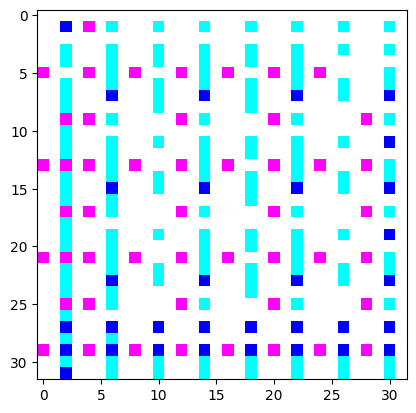

Epoch 756/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


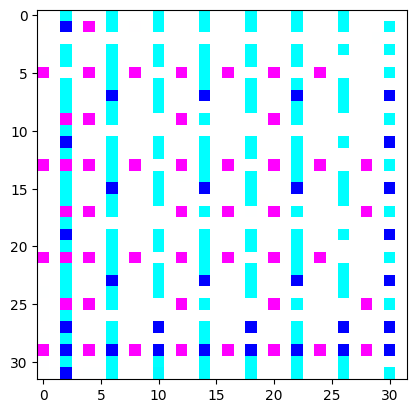

Epoch 757/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


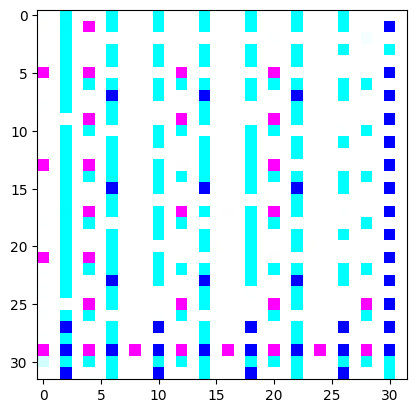

Epoch 758/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


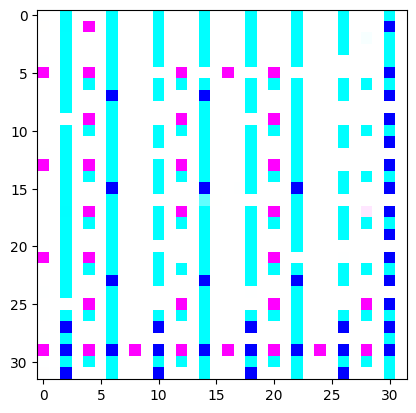

Epoch 759/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


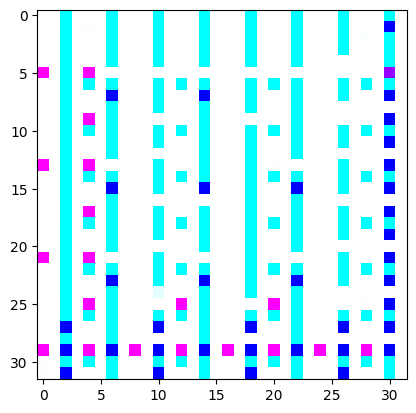

Epoch 760/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


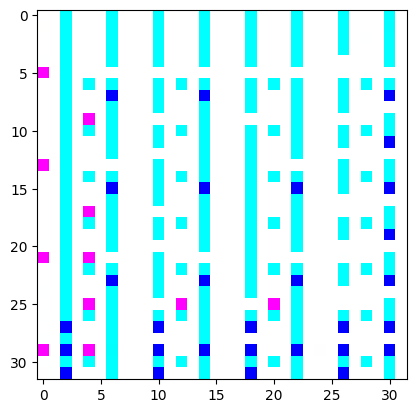

Epoch 761/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


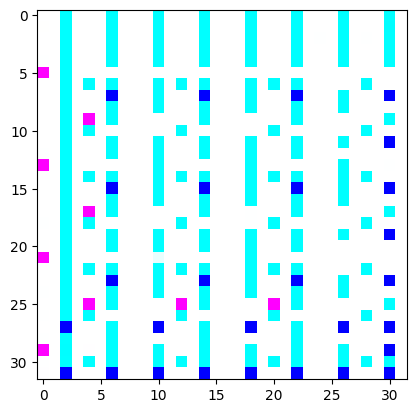

Epoch 762/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


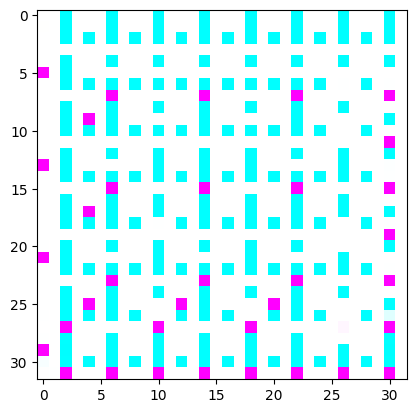

Epoch 763/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


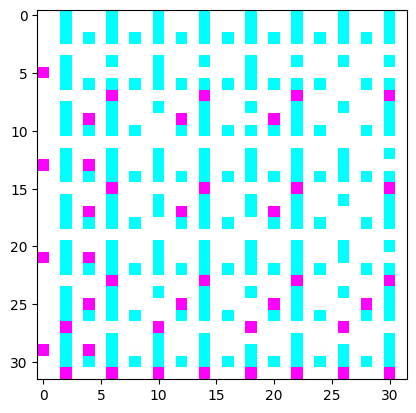

Epoch 764/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


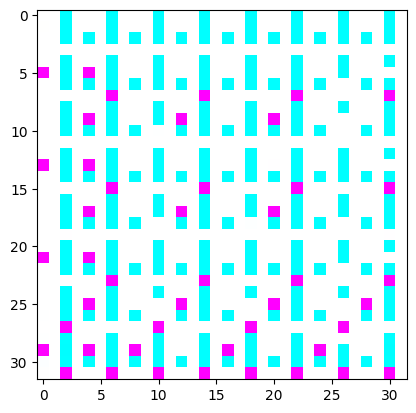

Epoch 765/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


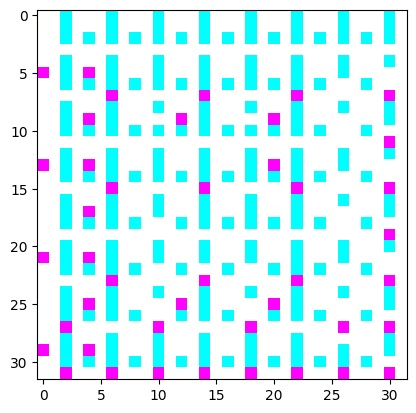

Epoch 766/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


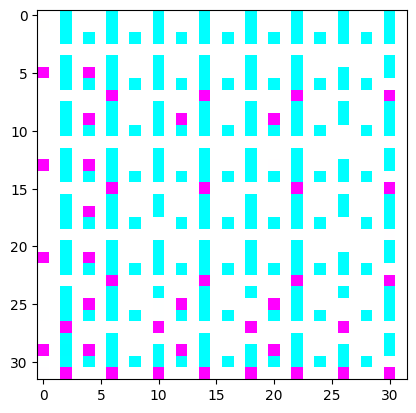

Epoch 767/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


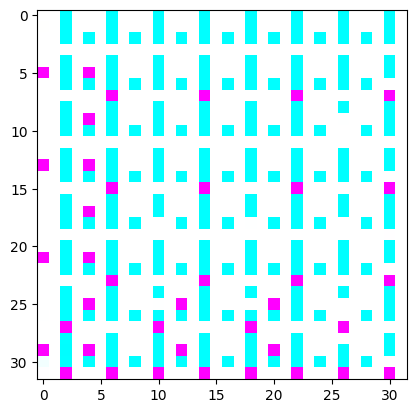

Epoch 768/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


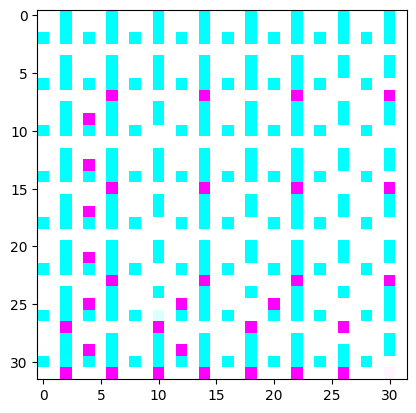

Epoch 769/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


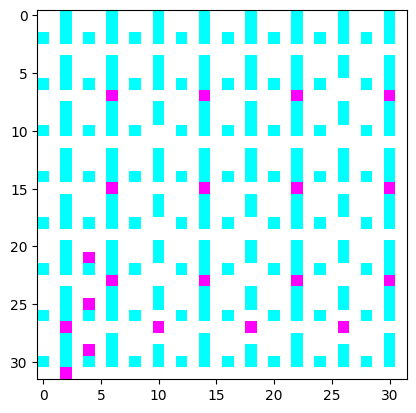

Epoch 770/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


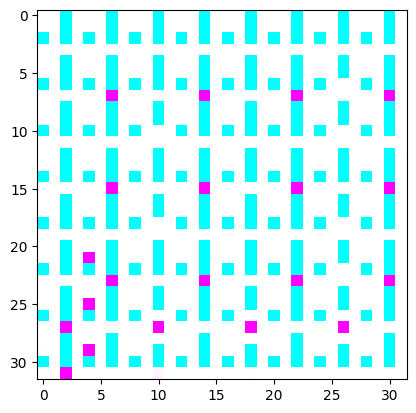

Epoch 771/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


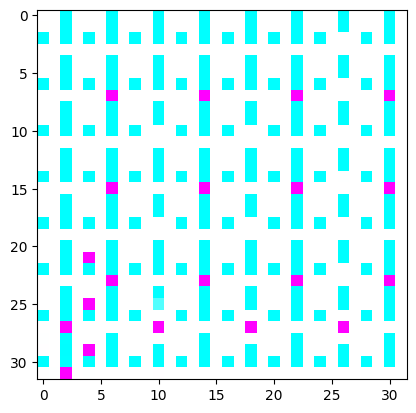

Epoch 772/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


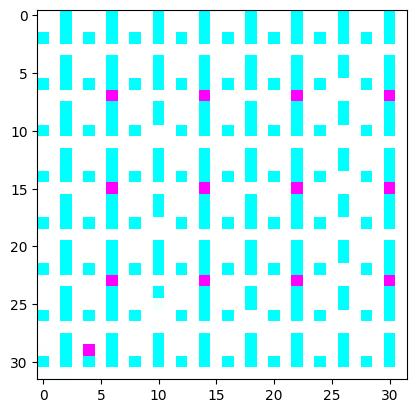

Epoch 773/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


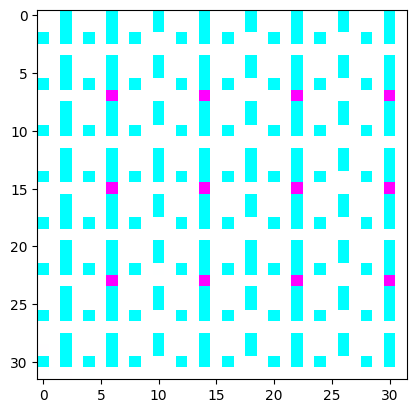

Epoch 774/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


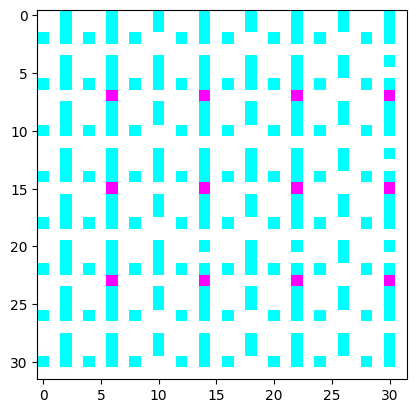

Epoch 775/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


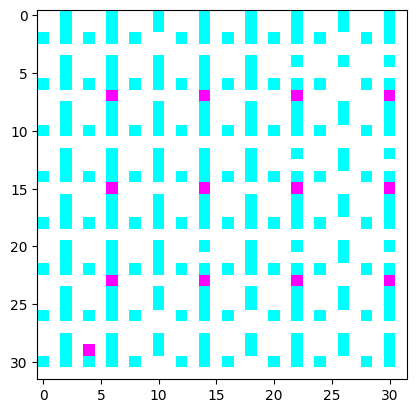

Epoch 776/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


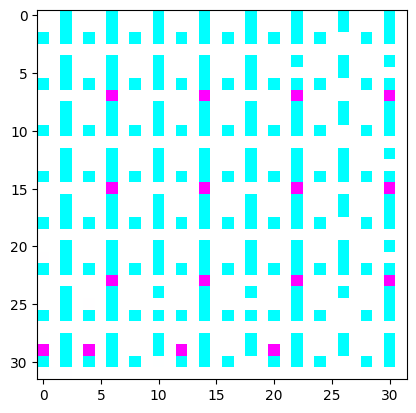

Epoch 777/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


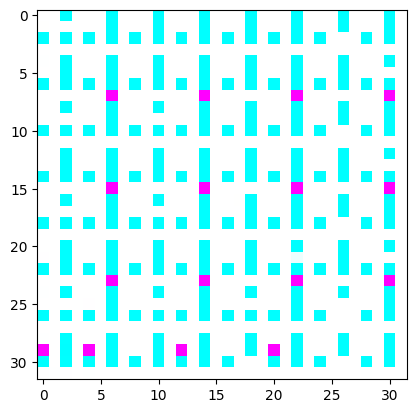

Epoch 778/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


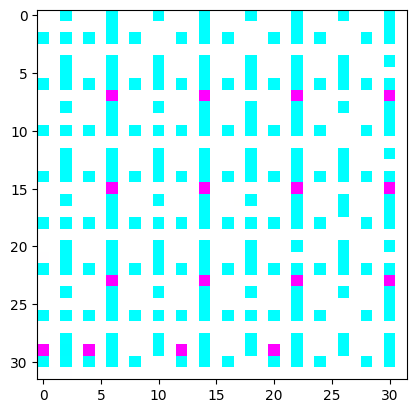

Epoch 779/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


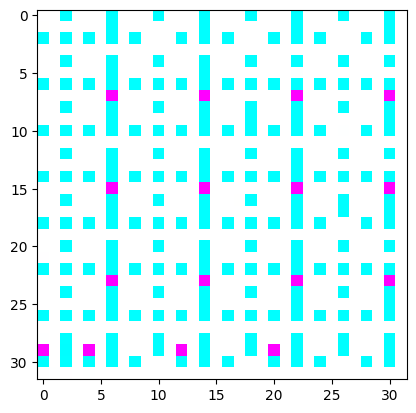

Epoch 780/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


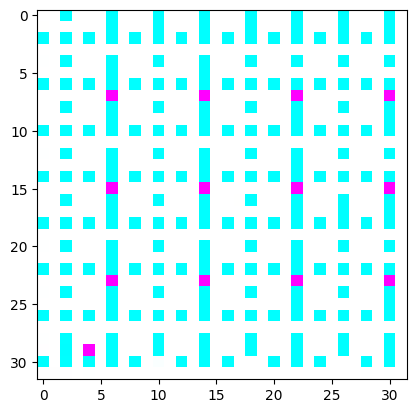

Epoch 781/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


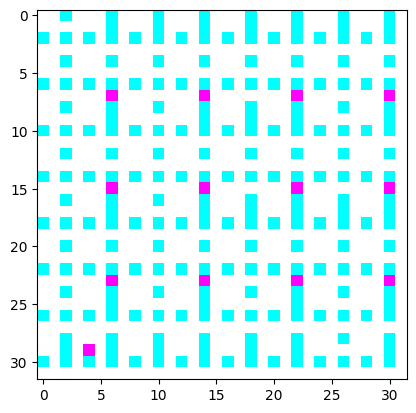

Epoch 782/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


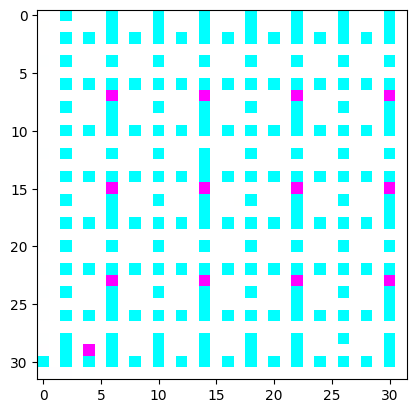

Epoch 783/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


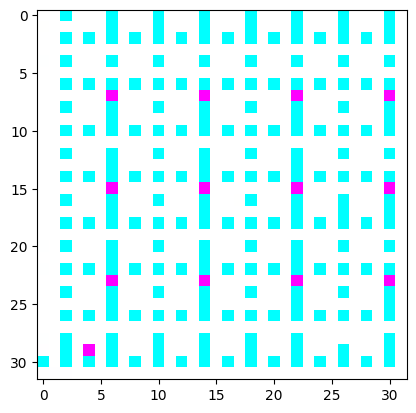

Epoch 784/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


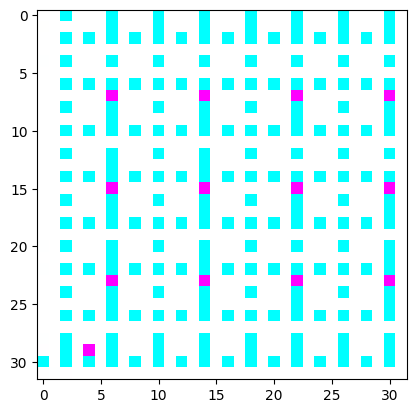

Epoch 785/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


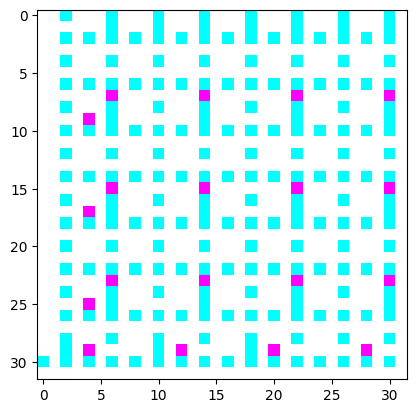

Epoch 786/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


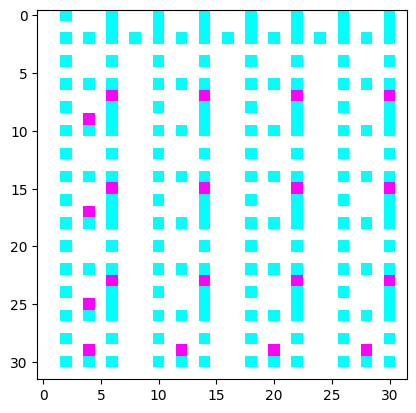

Epoch 787/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


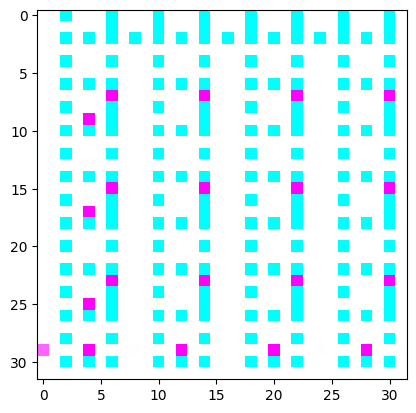

Epoch 788/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


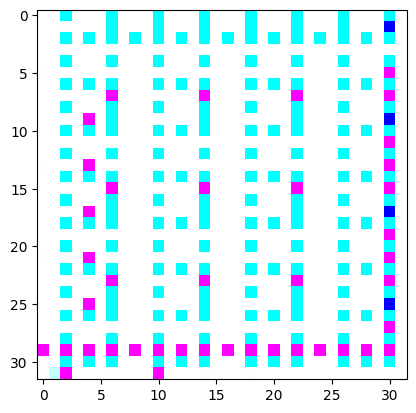

Epoch 789/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


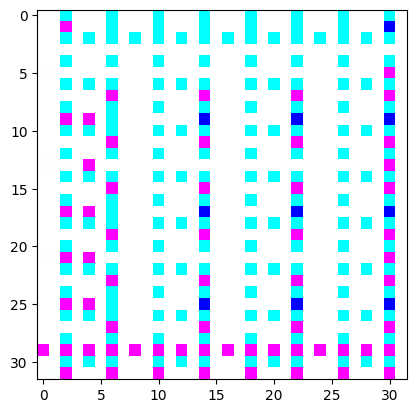

Epoch 790/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


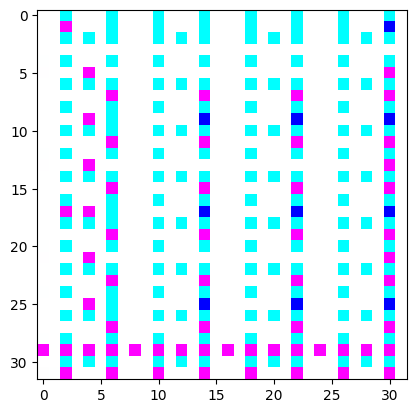

Epoch 791/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


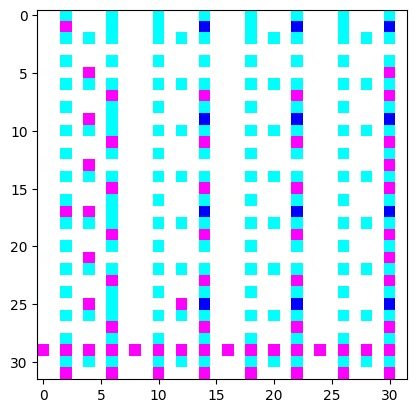

Epoch 792/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


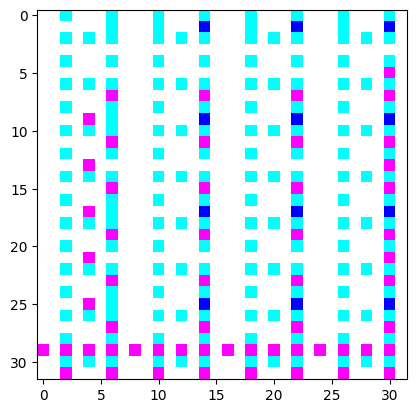

Epoch 793/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


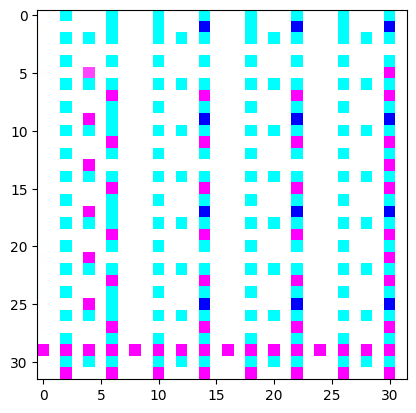

Epoch 794/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


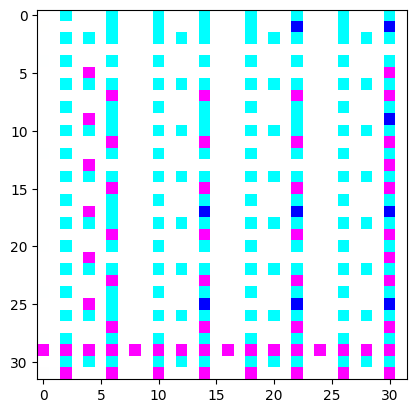

Epoch 795/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


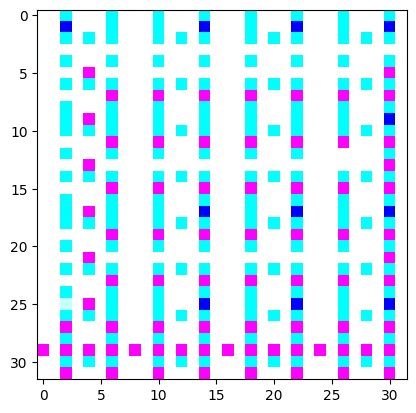

Epoch 796/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


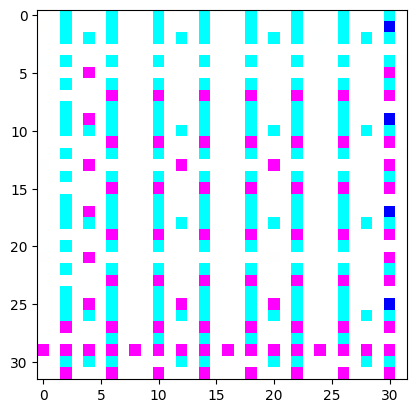

Epoch 797/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


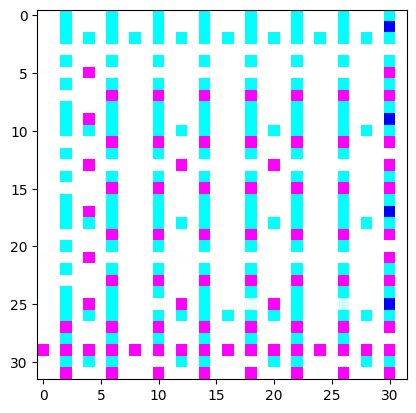

Epoch 798/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


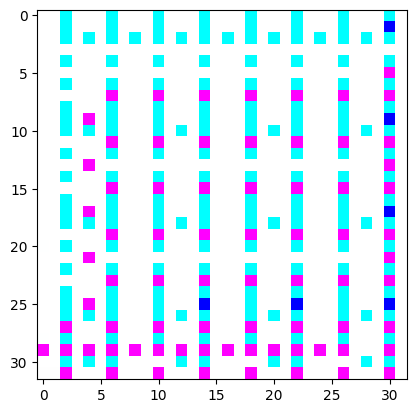

Epoch 799/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


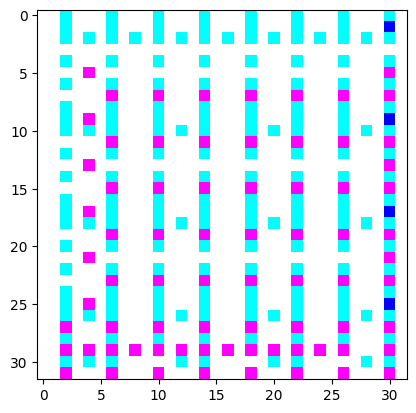

Epoch 800/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


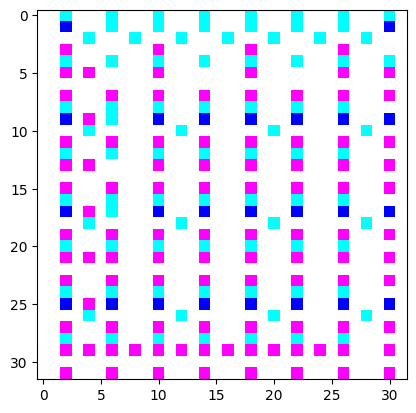

Epoch 801/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


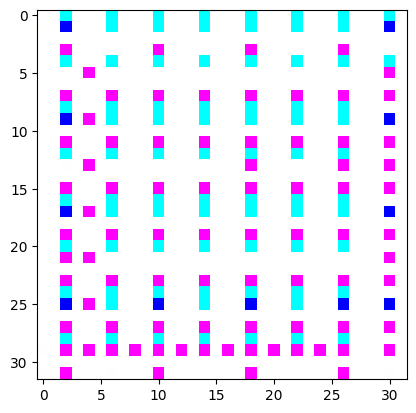

Epoch 802/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


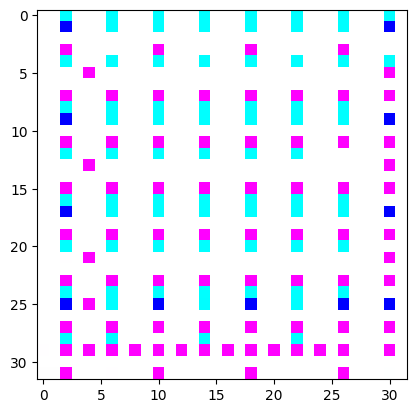

Epoch 803/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


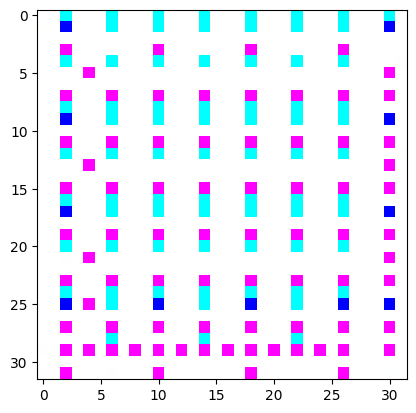

Epoch 804/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


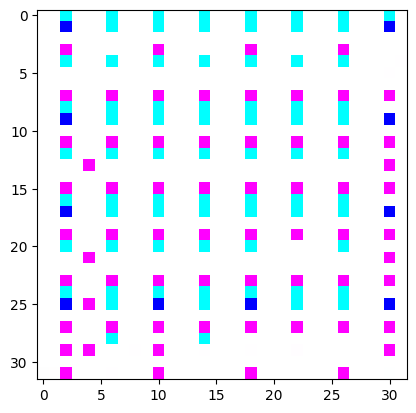

Epoch 805/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


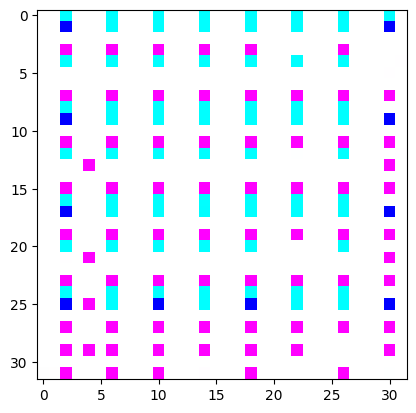

Epoch 806/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


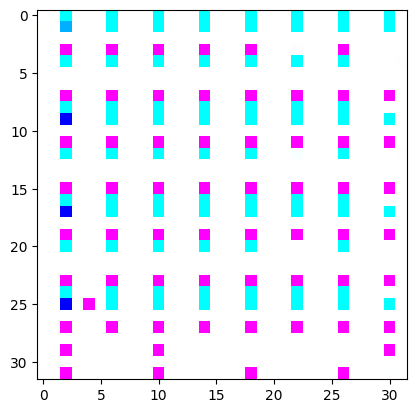

Epoch 807/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


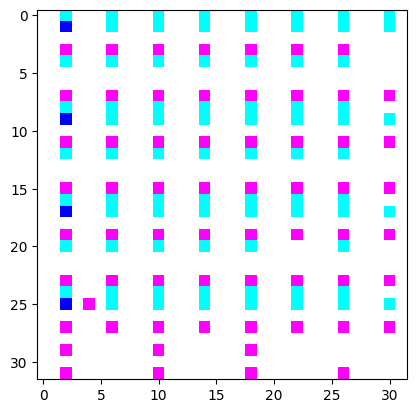

Epoch 808/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


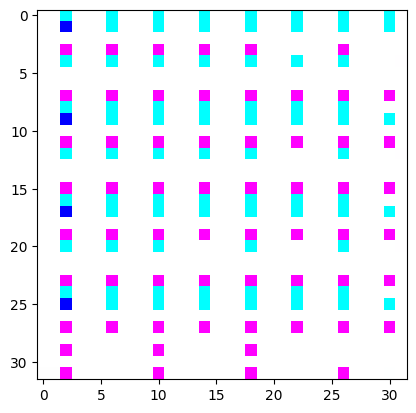

Epoch 809/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


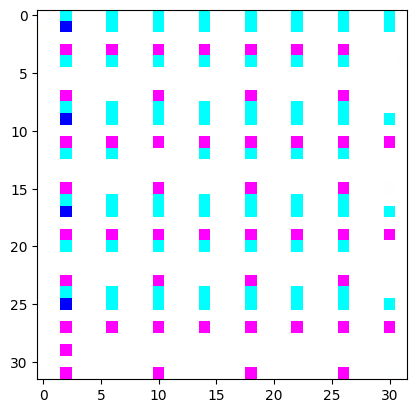

Epoch 810/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


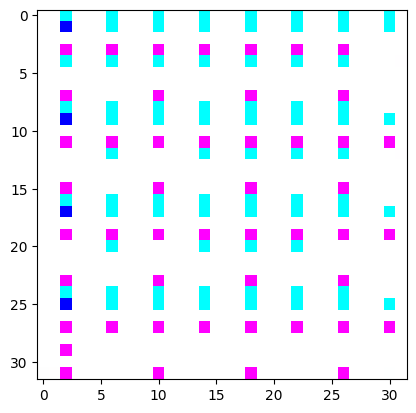

Epoch 811/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


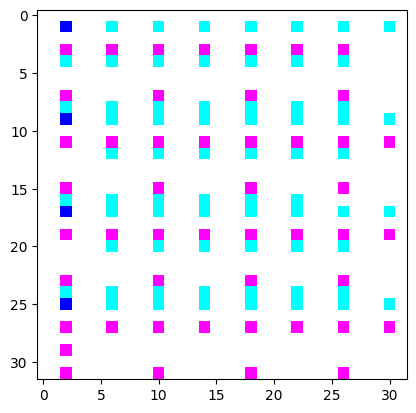

Epoch 812/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


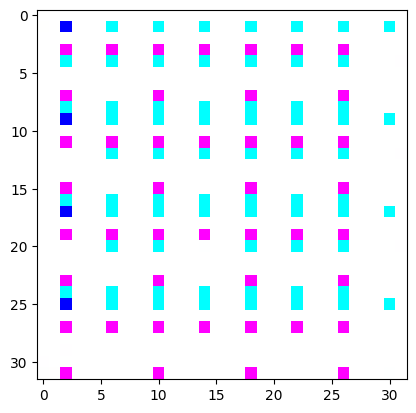

Epoch 813/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


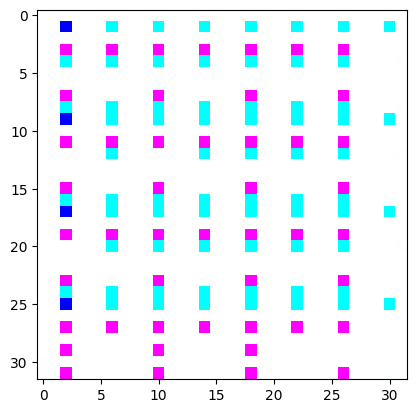

Epoch 814/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


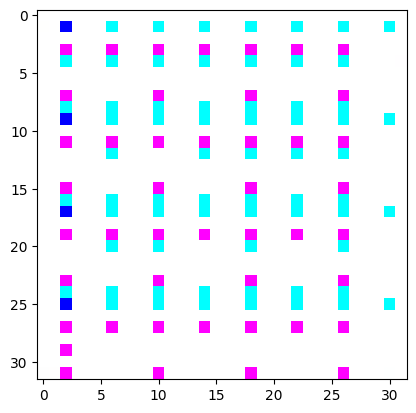

Epoch 815/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


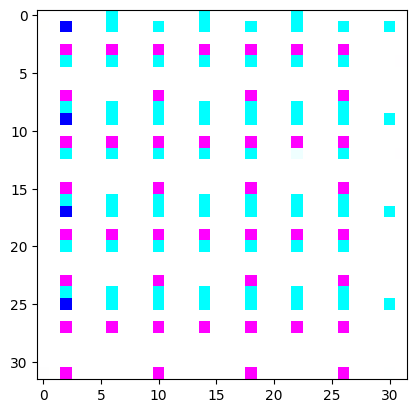

Epoch 816/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


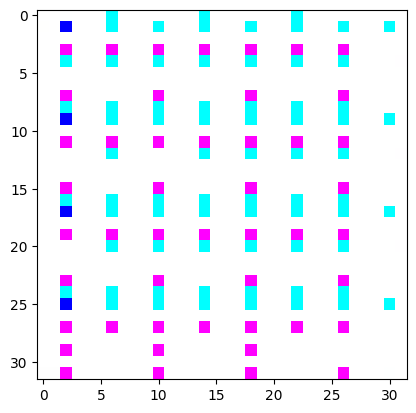

Epoch 817/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


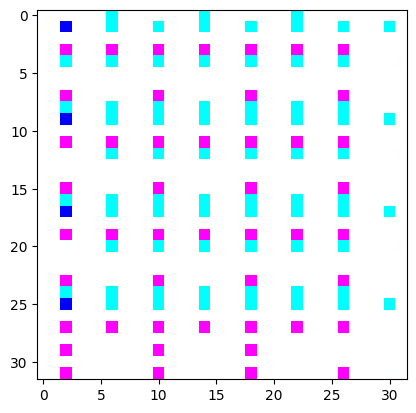

Epoch 818/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


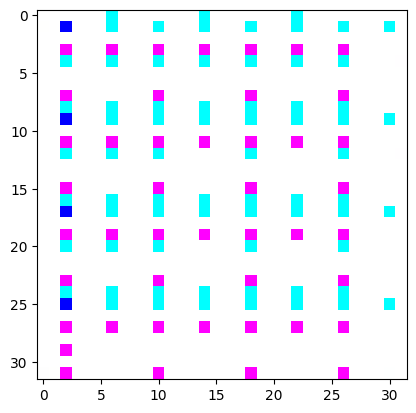

Epoch 819/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


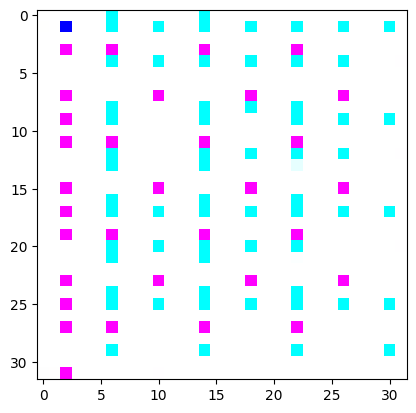

Epoch 820/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


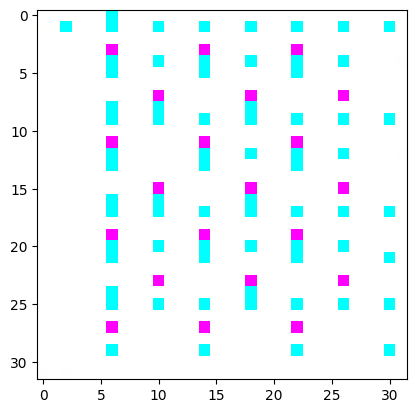

Epoch 821/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


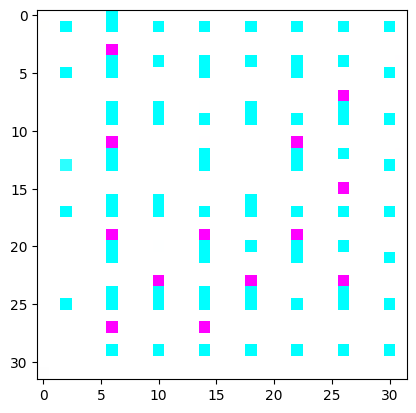

Epoch 822/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


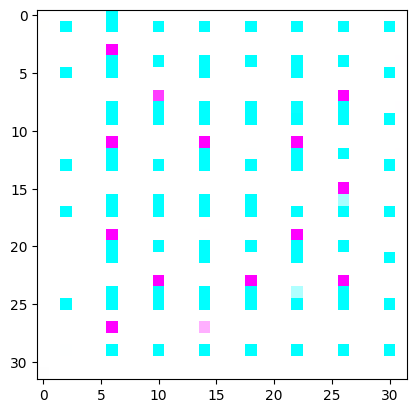

Epoch 823/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


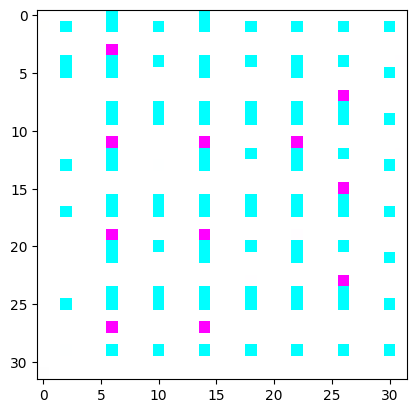

Epoch 824/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


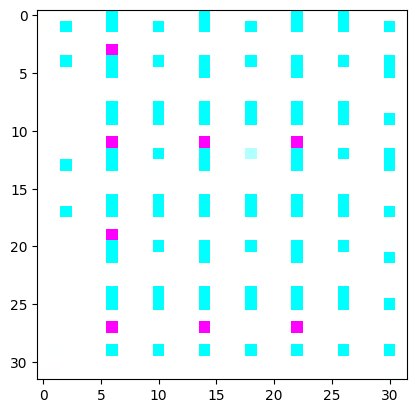

Epoch 825/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


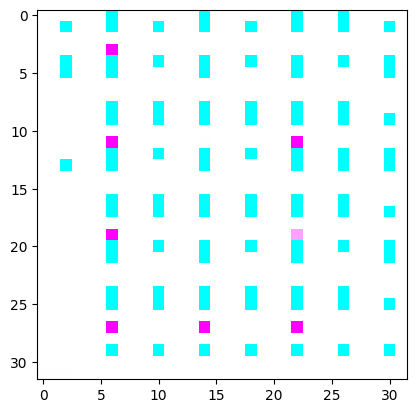

Epoch 826/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


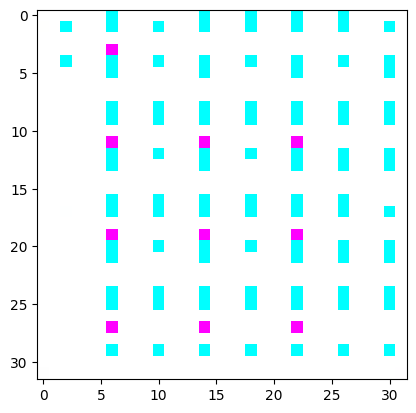

Epoch 827/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


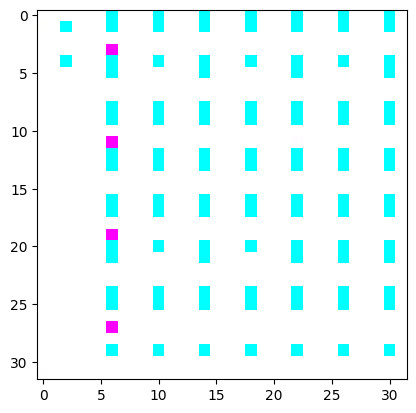

Epoch 828/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


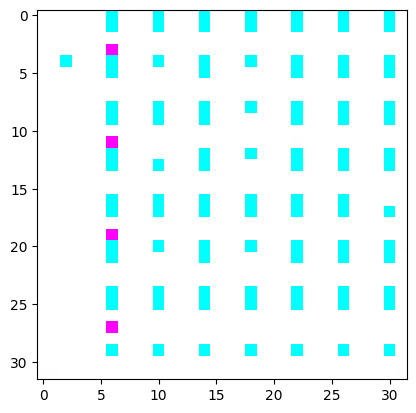

Epoch 829/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


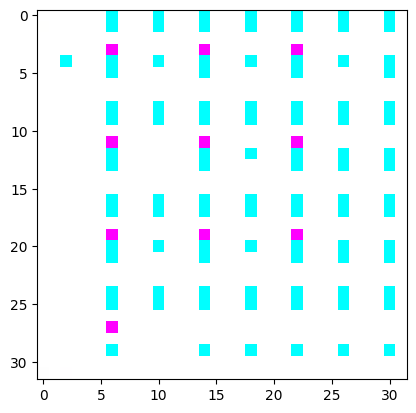

Epoch 830/1000


100%|██████████| 100/100 [00:18<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


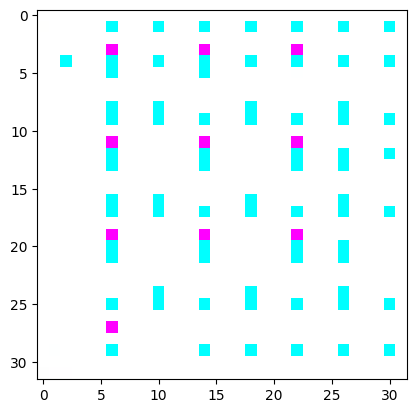

Epoch 831/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


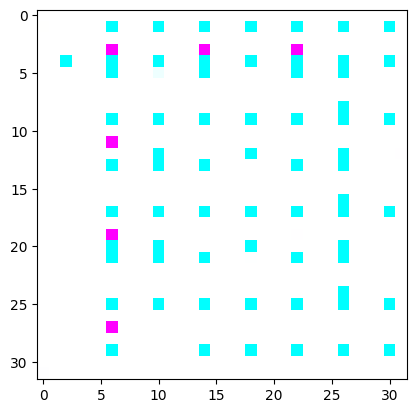

Epoch 832/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


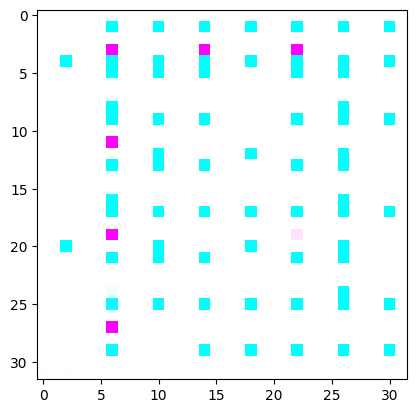

Epoch 833/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


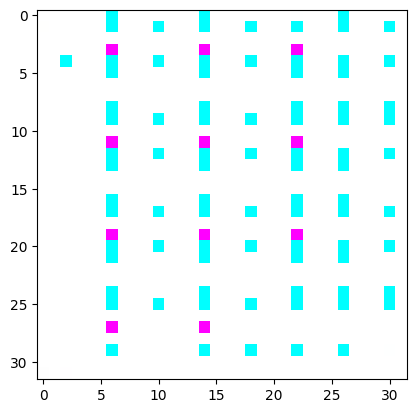

Epoch 834/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


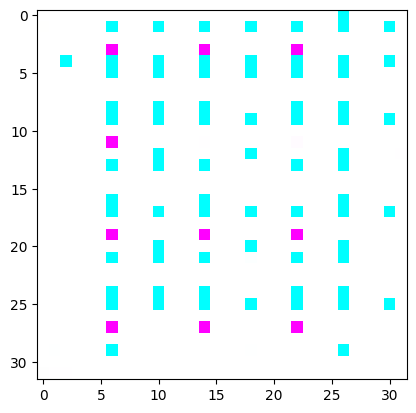

Epoch 835/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


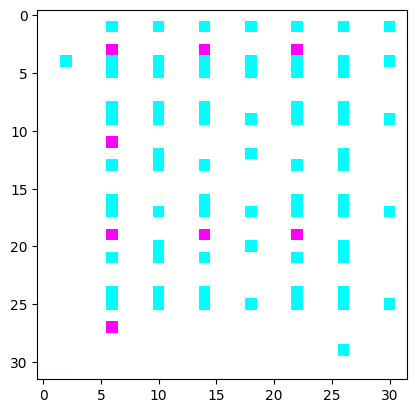

Epoch 836/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


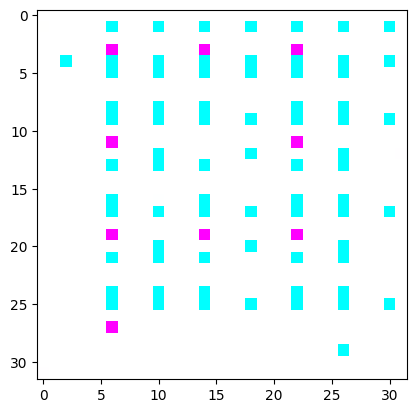

Epoch 837/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


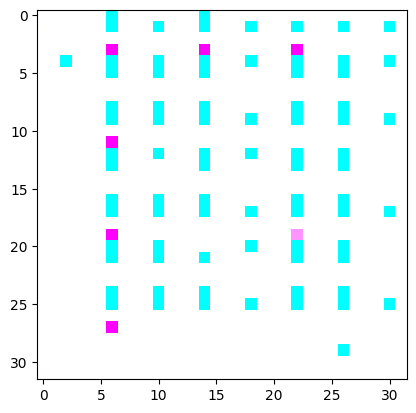

Epoch 838/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


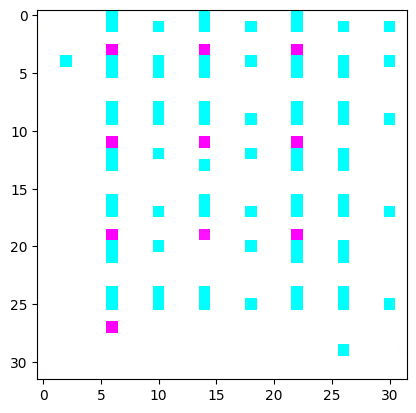

Epoch 839/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


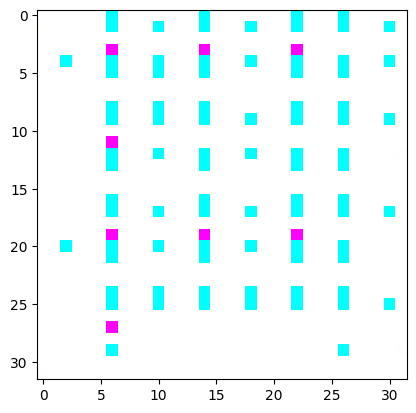

Epoch 840/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


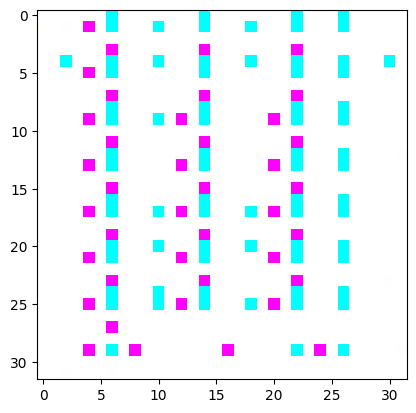

Epoch 841/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


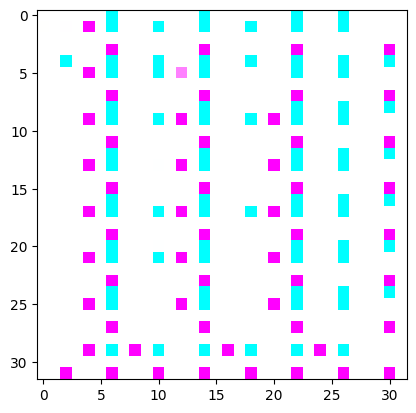

Epoch 842/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


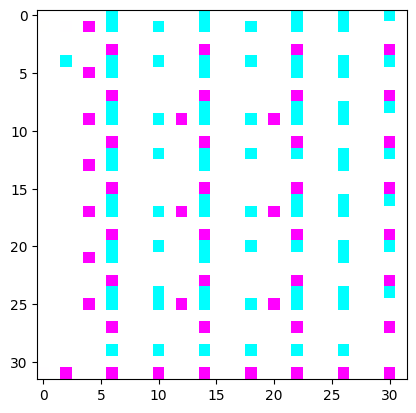

Epoch 843/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


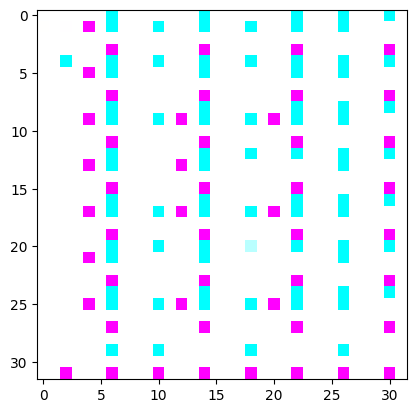

Epoch 844/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


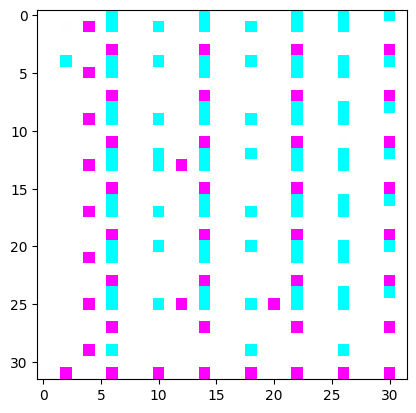

Epoch 845/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


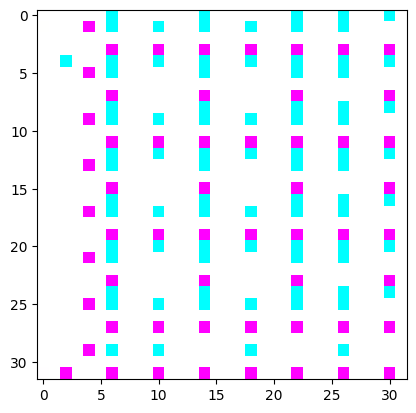

Epoch 846/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


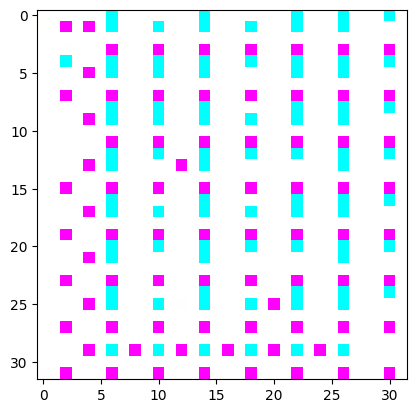

Epoch 847/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


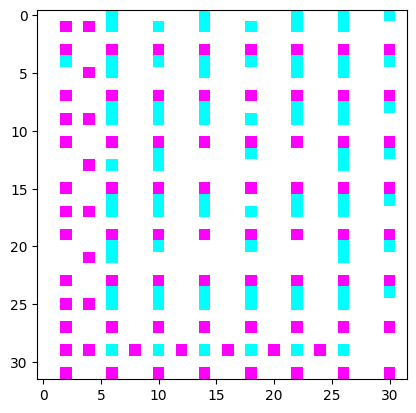

Epoch 848/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


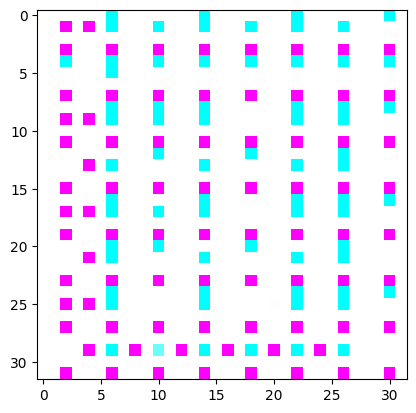

Epoch 849/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


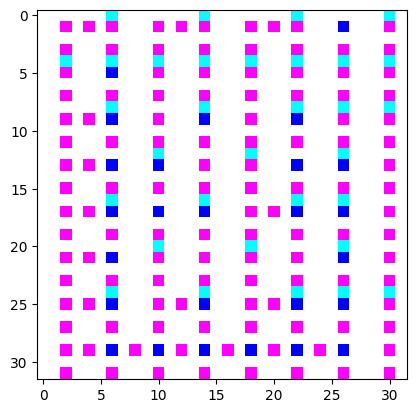

Epoch 850/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


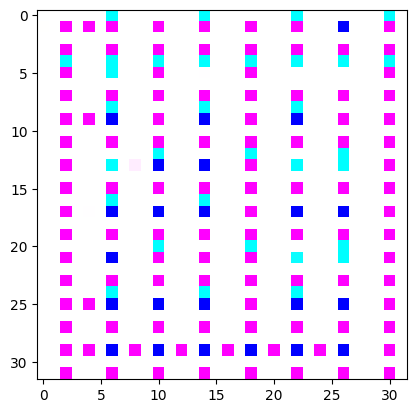

Epoch 851/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


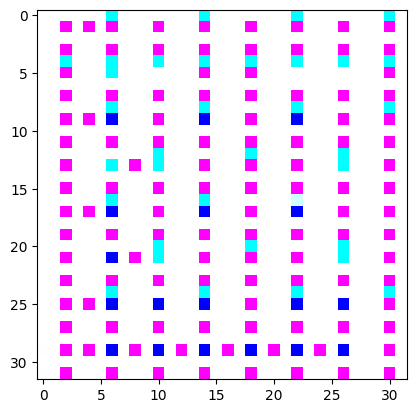

Epoch 852/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


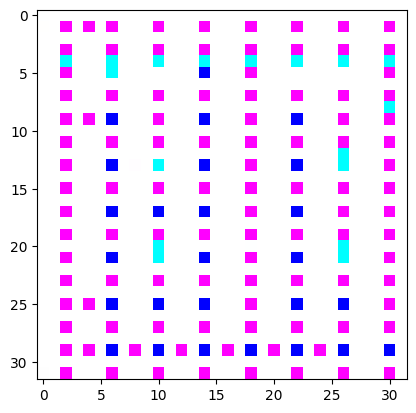

Epoch 853/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


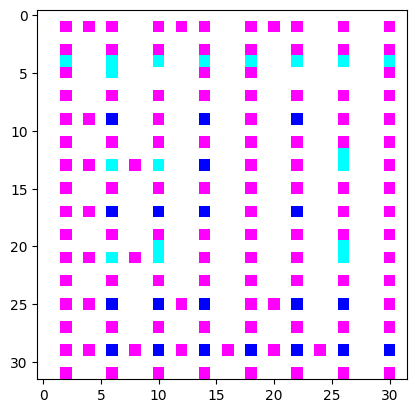

Epoch 854/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


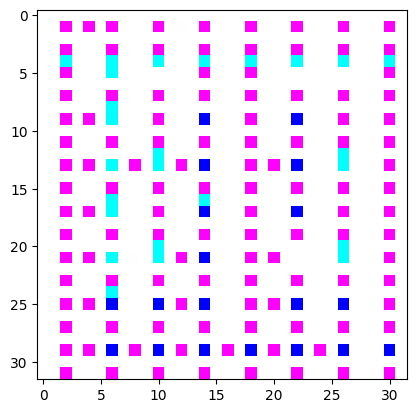

Epoch 855/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


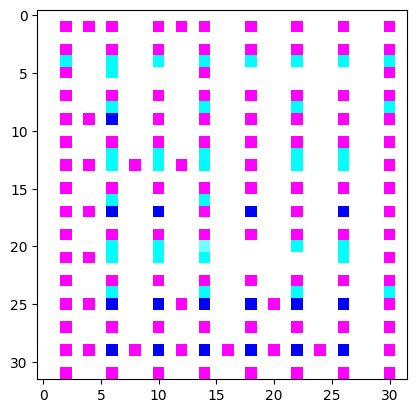

Epoch 856/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


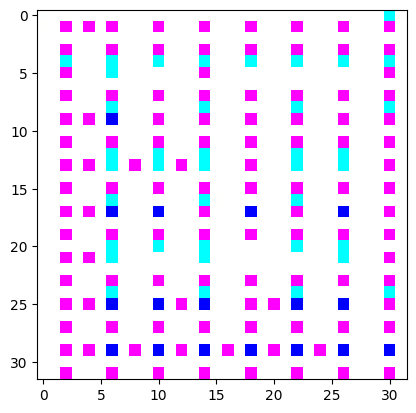

Epoch 857/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


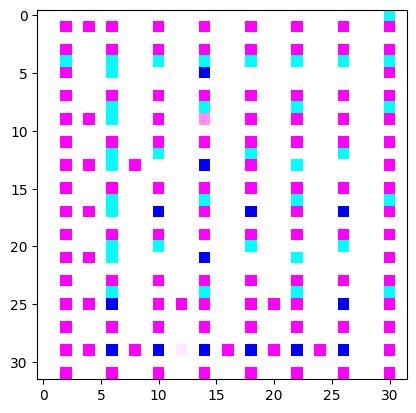

Epoch 858/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


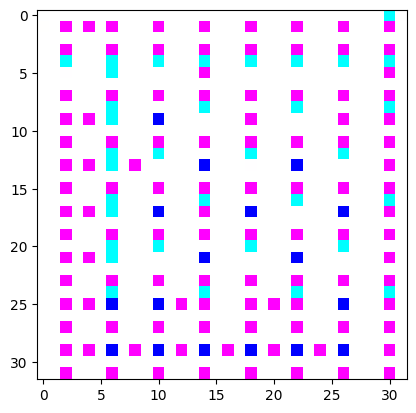

Epoch 859/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


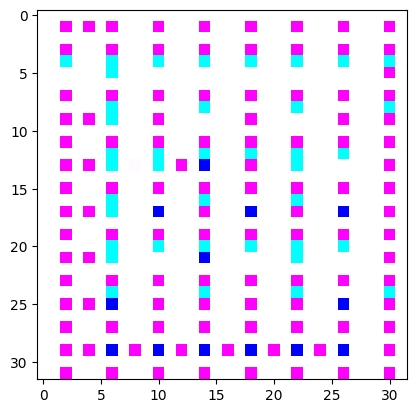

Epoch 860/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


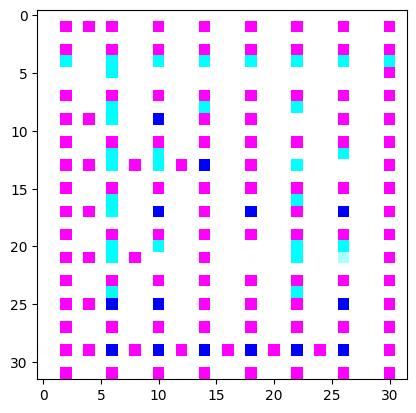

Epoch 861/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


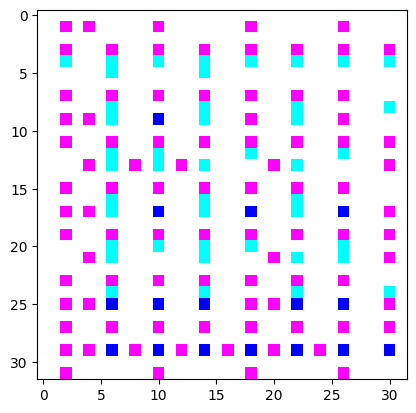

Epoch 862/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


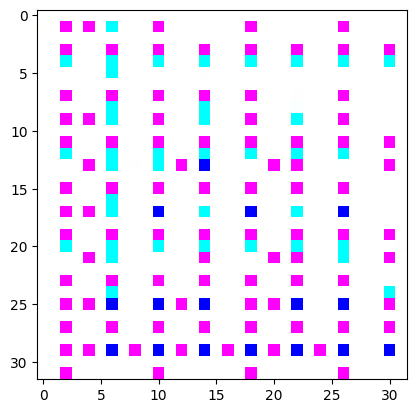

Epoch 863/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


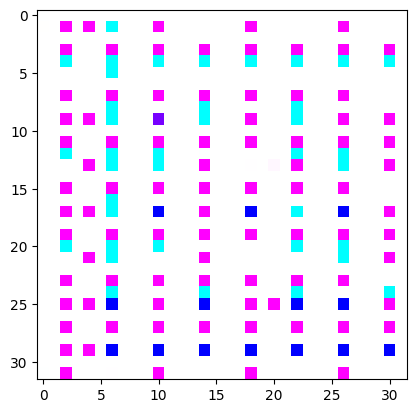

Epoch 864/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


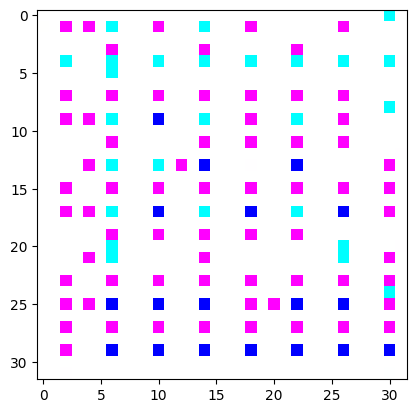

Epoch 865/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


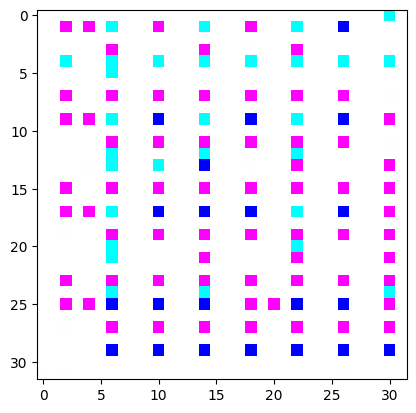

Epoch 866/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


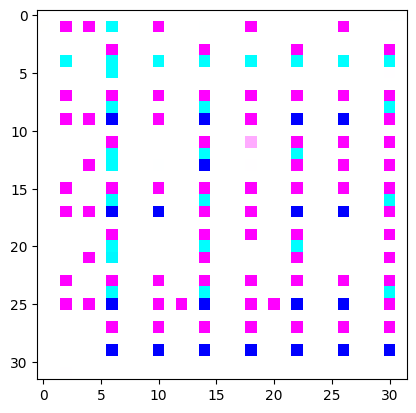

Epoch 867/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


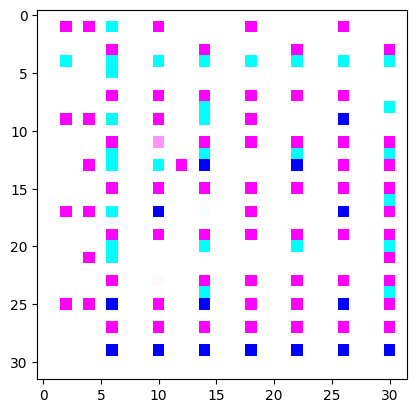

Epoch 868/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


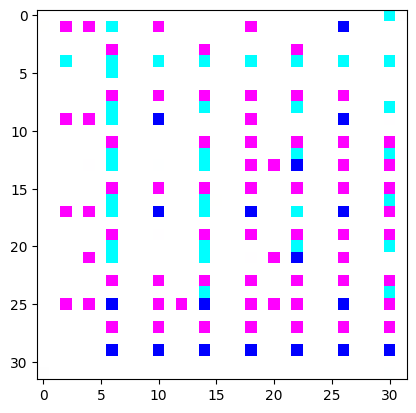

Epoch 869/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


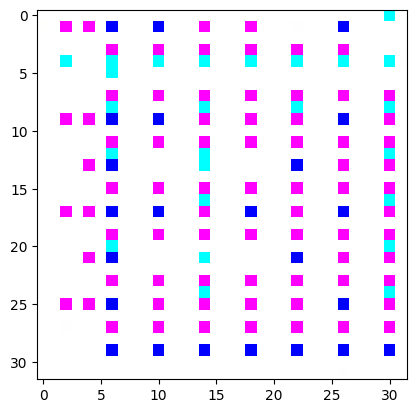

Epoch 870/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


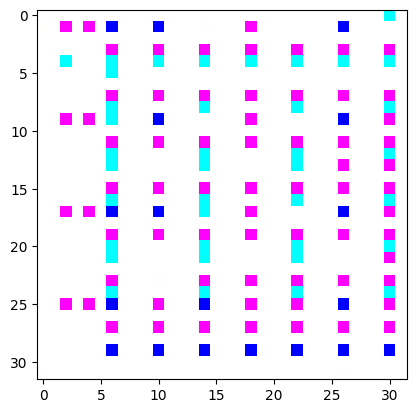

Epoch 871/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


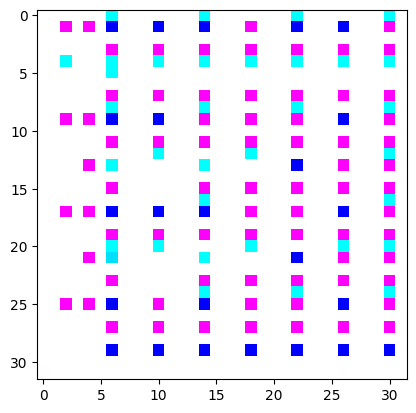

Epoch 872/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


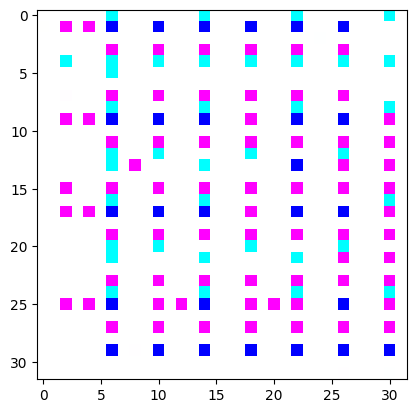

Epoch 873/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


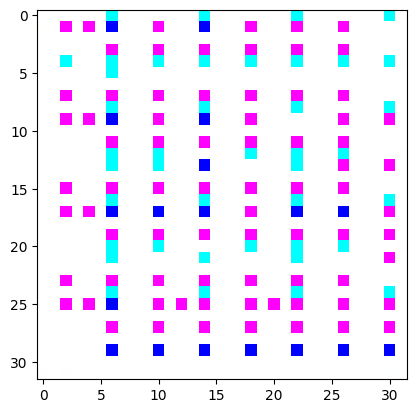

Epoch 874/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


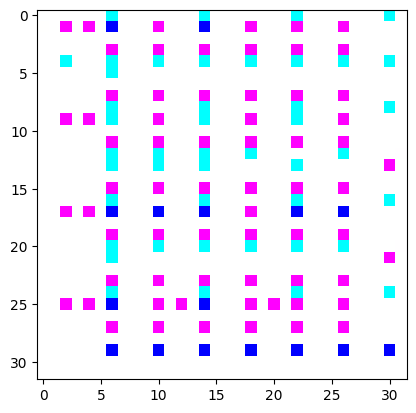

Epoch 875/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


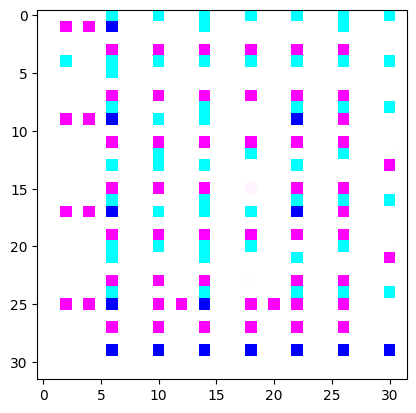

Epoch 876/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


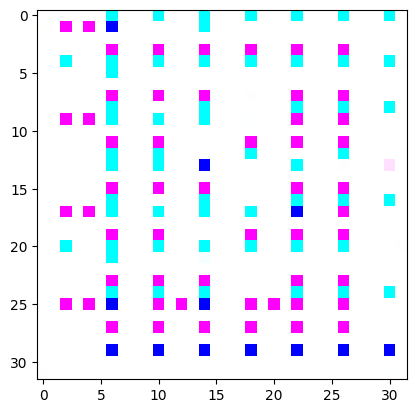

Epoch 877/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


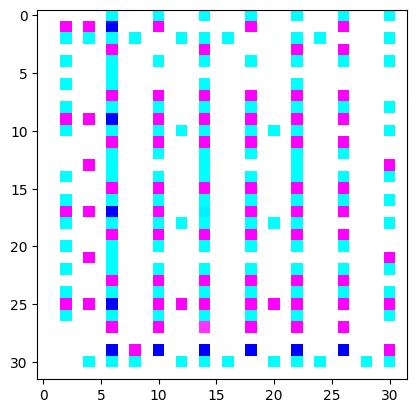

Epoch 878/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


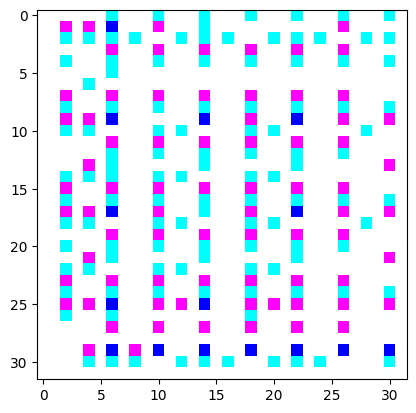

Epoch 879/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


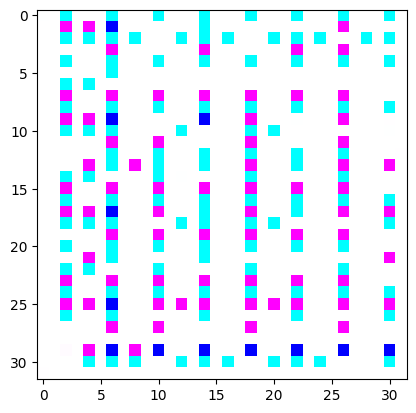

Epoch 880/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


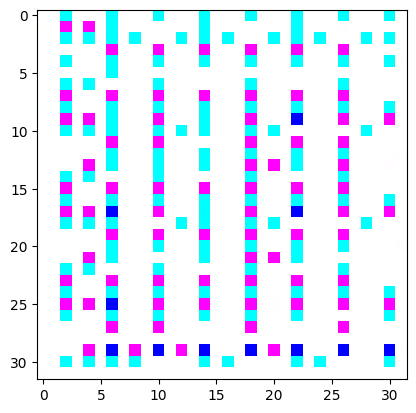

Epoch 881/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


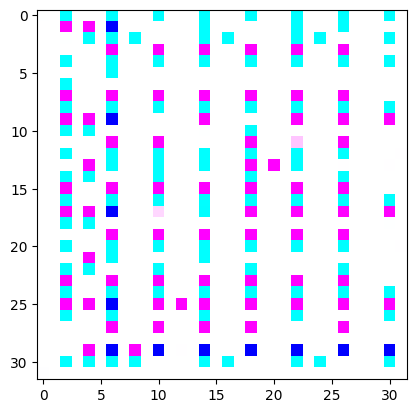

Epoch 882/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


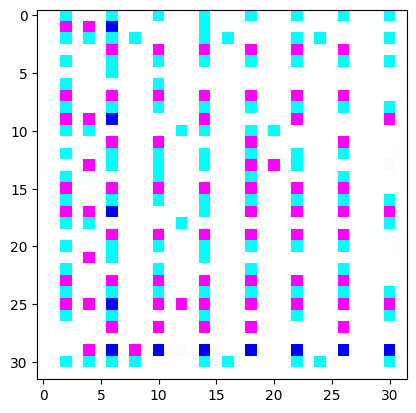

Epoch 883/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


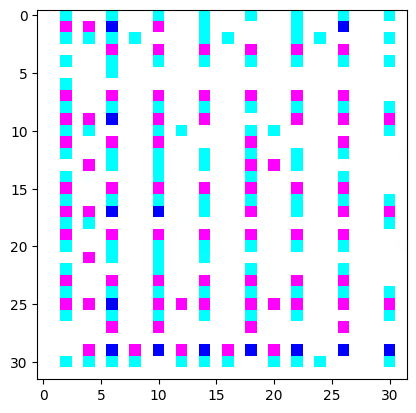

Epoch 884/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


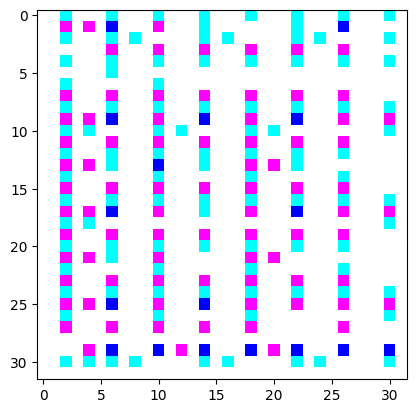

Epoch 885/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


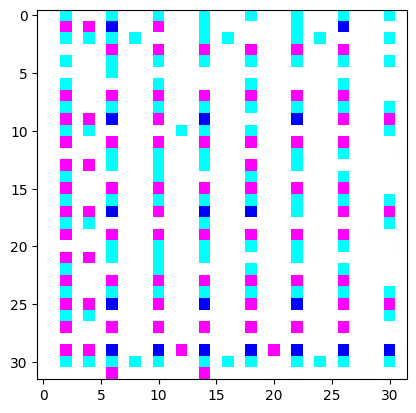

Epoch 886/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


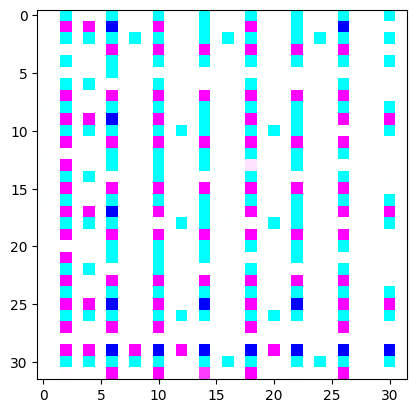

Epoch 887/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


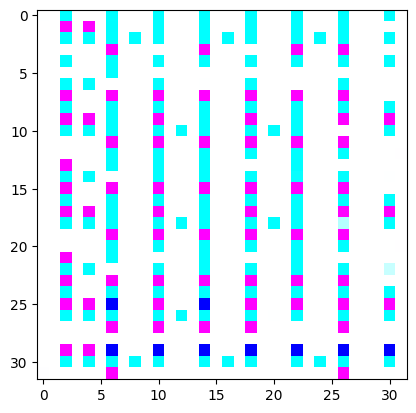

Epoch 888/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


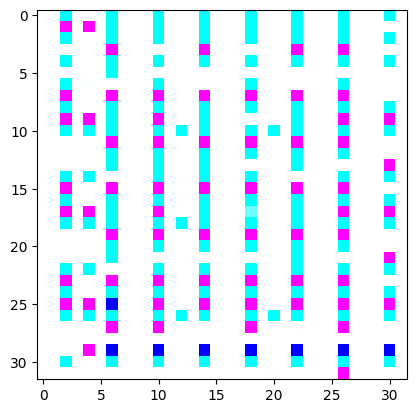

Epoch 889/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


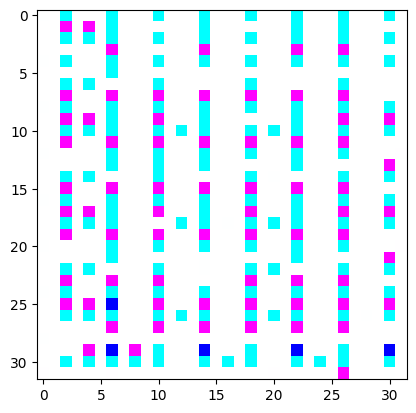

Epoch 890/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


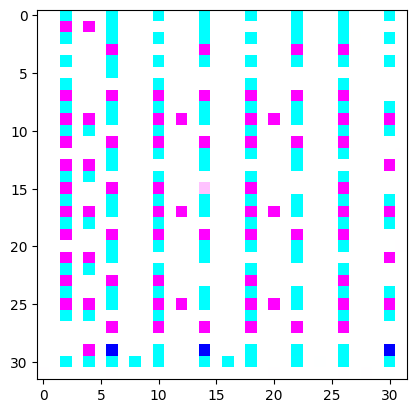

Epoch 891/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


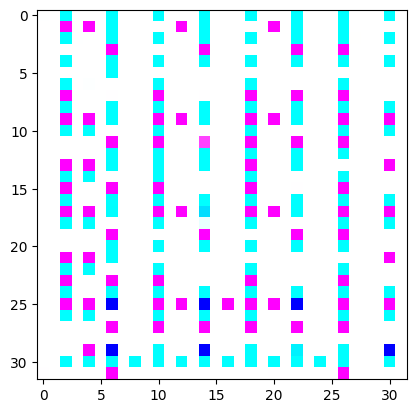

Epoch 892/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


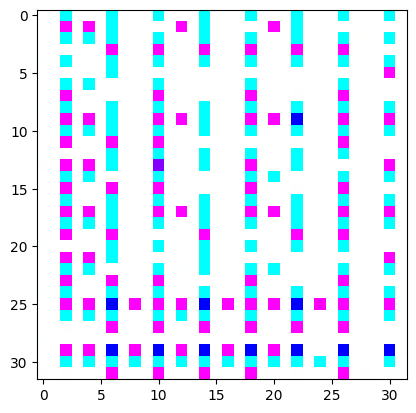

Epoch 893/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


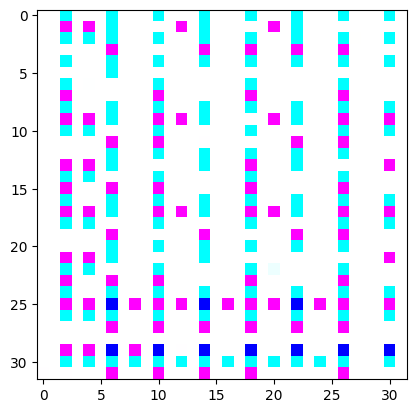

Epoch 894/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


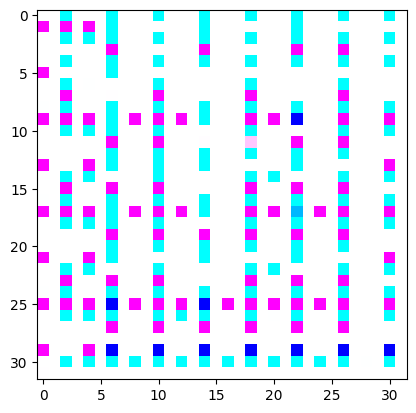

Epoch 895/1000


100%|██████████| 100/100 [00:18<00:00,  5.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


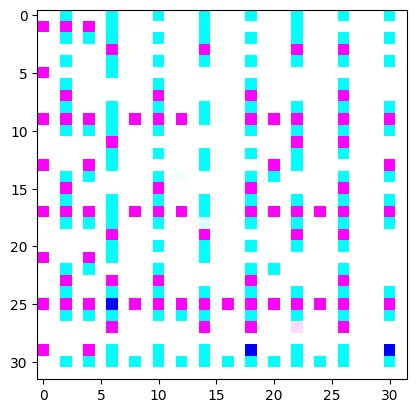

Epoch 896/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


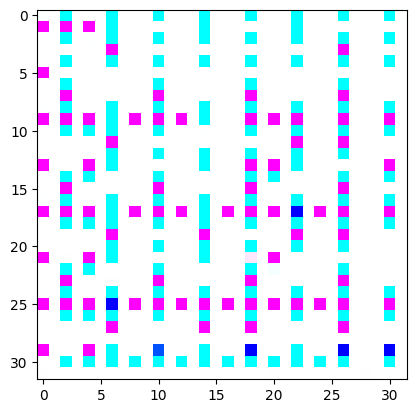

Epoch 897/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


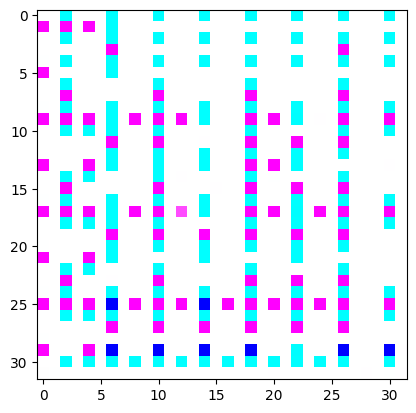

Epoch 898/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


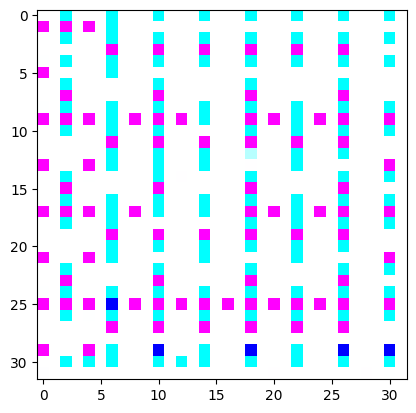

Epoch 899/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


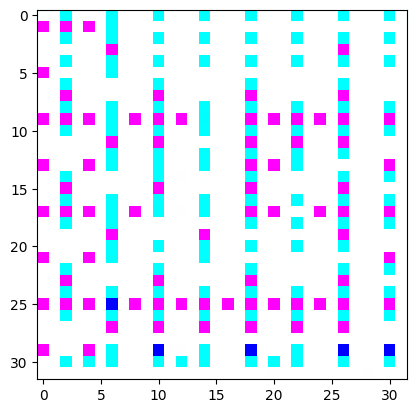

Epoch 900/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


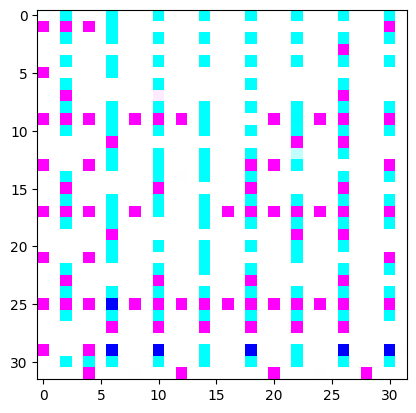

Epoch 901/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


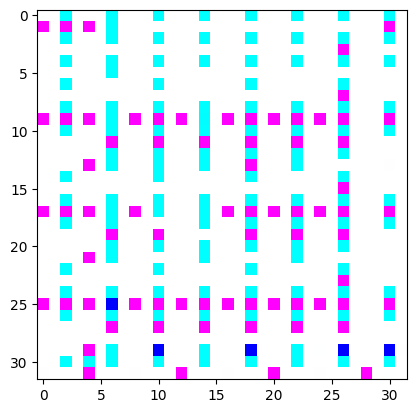

Epoch 902/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


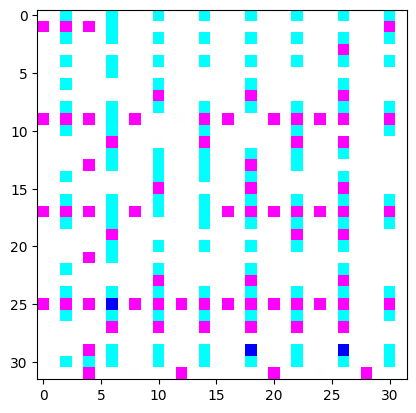

Epoch 903/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


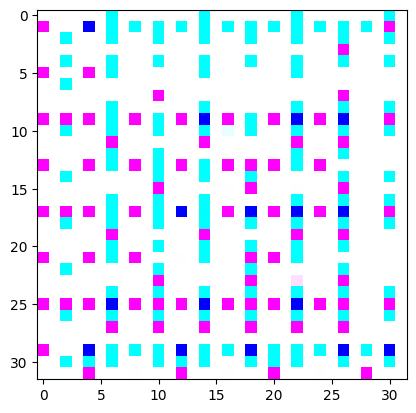

Epoch 904/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


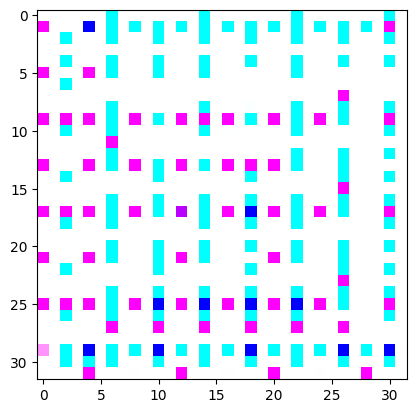

Epoch 905/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


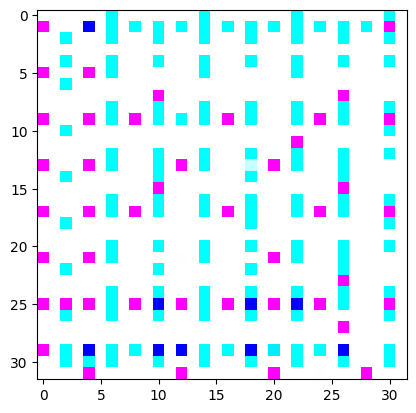

Epoch 906/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


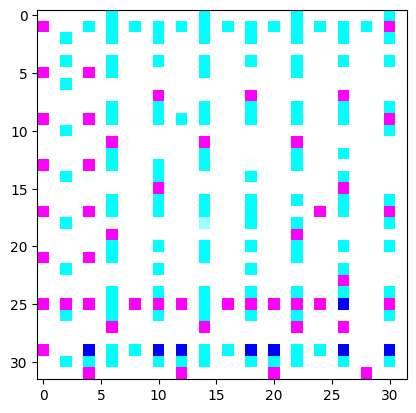

Epoch 907/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


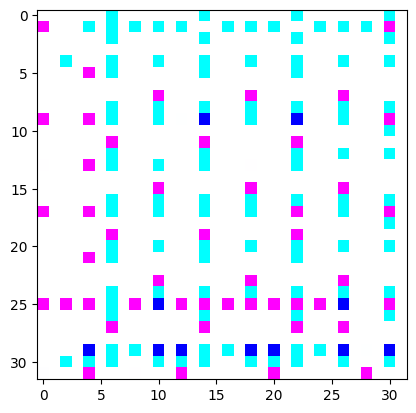

Epoch 908/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


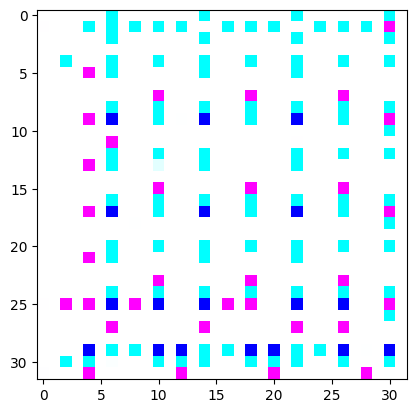

Epoch 909/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


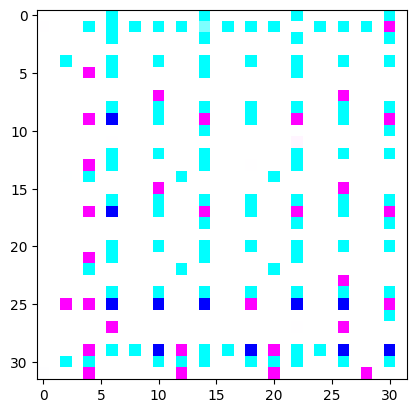

Epoch 910/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


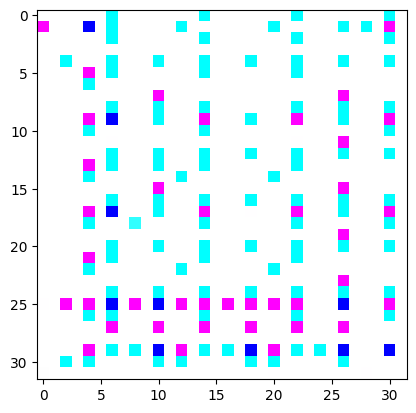

Epoch 911/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


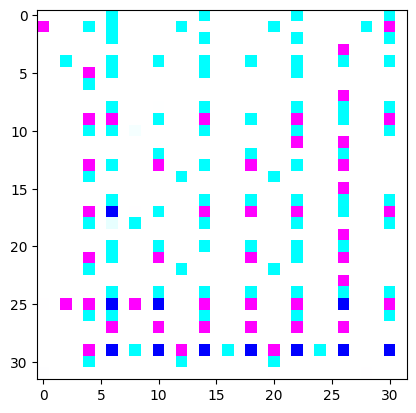

Epoch 912/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


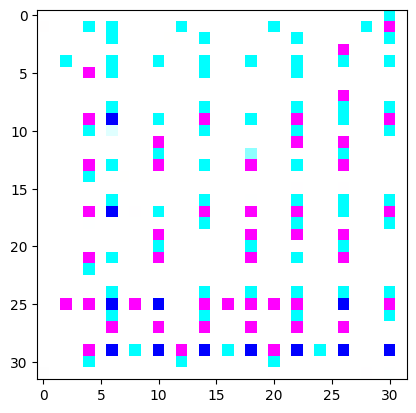

Epoch 913/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


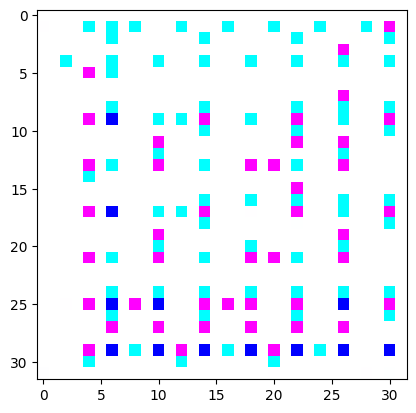

Epoch 914/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


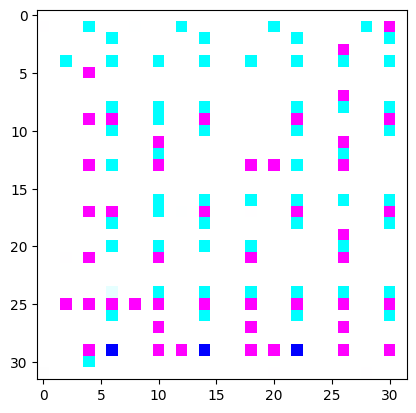

Epoch 915/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


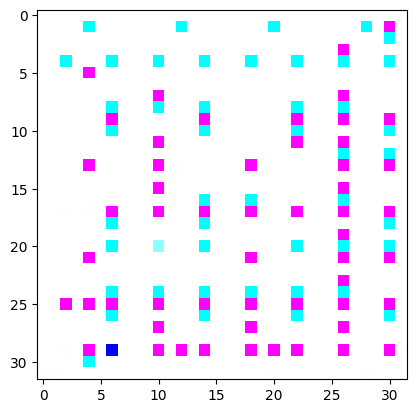

Epoch 916/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


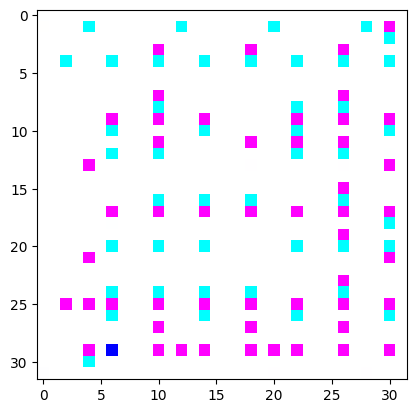

Epoch 917/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


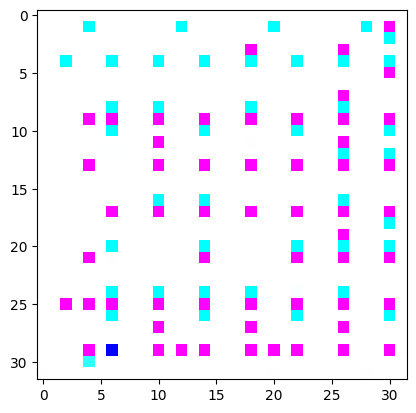

Epoch 918/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


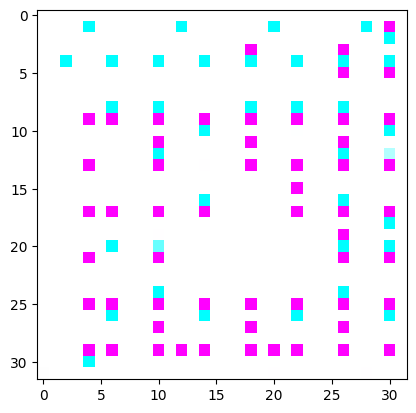

Epoch 919/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


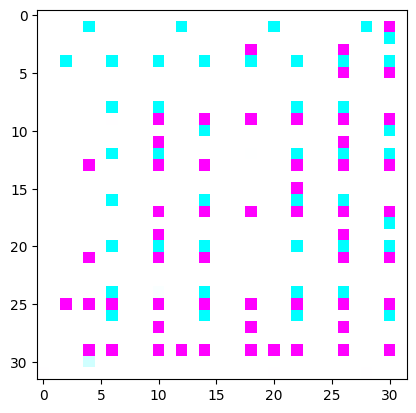

Epoch 920/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


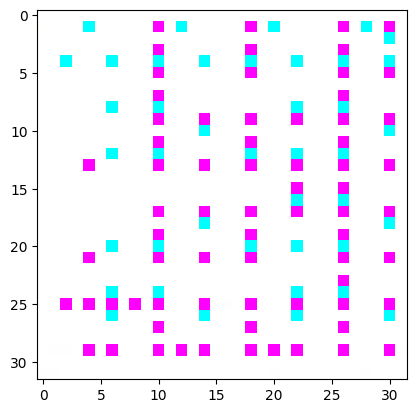

Epoch 921/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


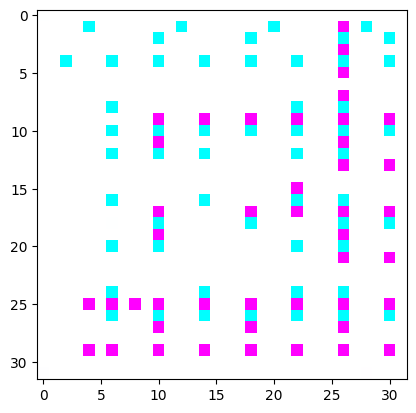

Epoch 922/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


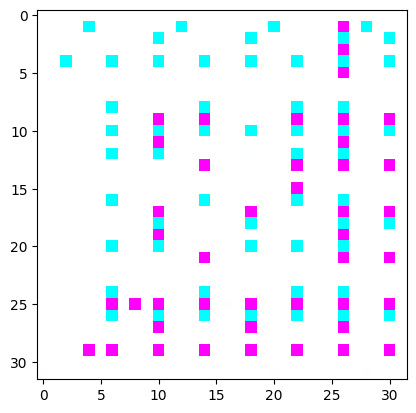

Epoch 923/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


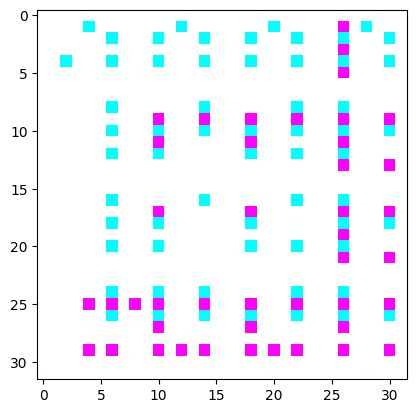

Epoch 924/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


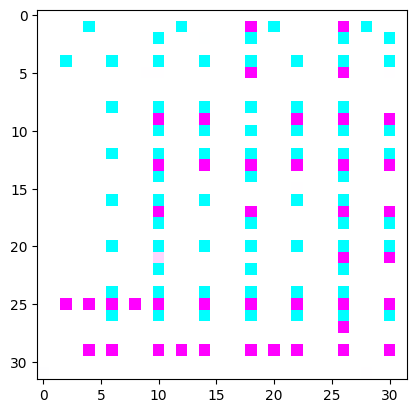

Epoch 925/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


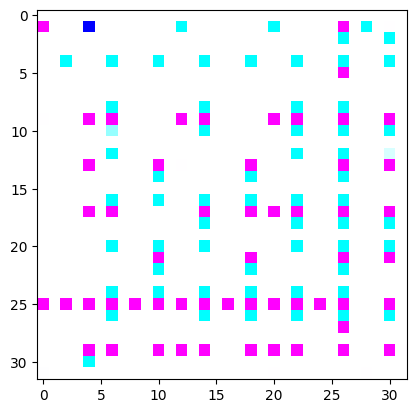

Epoch 926/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


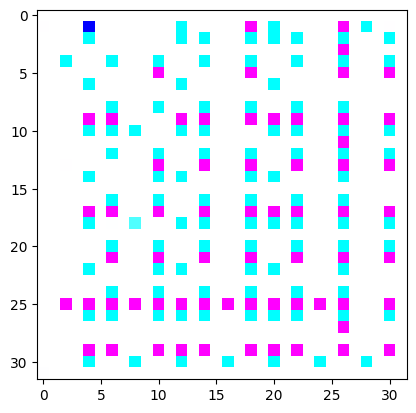

Epoch 927/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


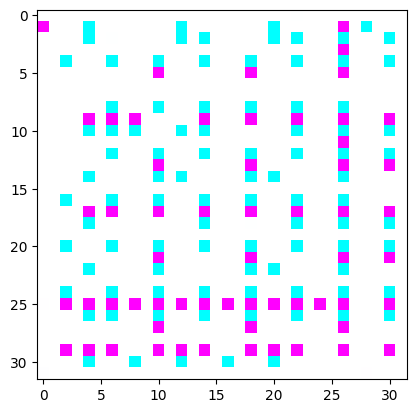

Epoch 928/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


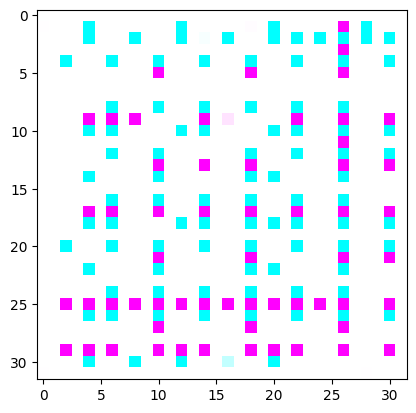

Epoch 929/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


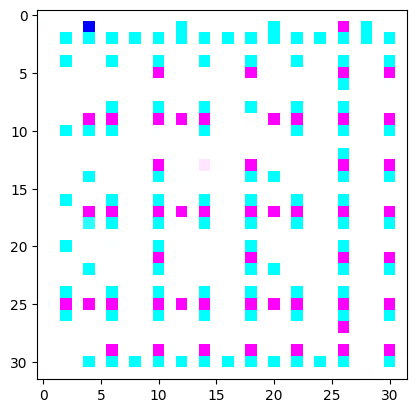

Epoch 930/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


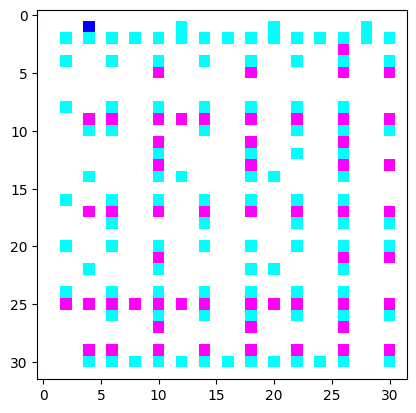

Epoch 931/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


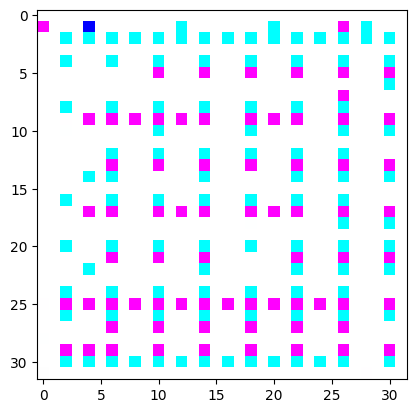

Epoch 932/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


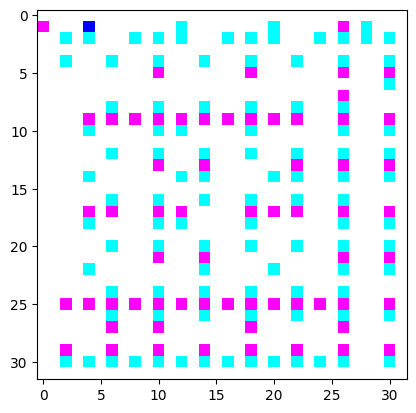

Epoch 933/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


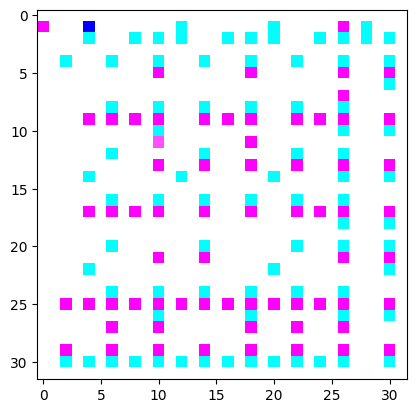

Epoch 934/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


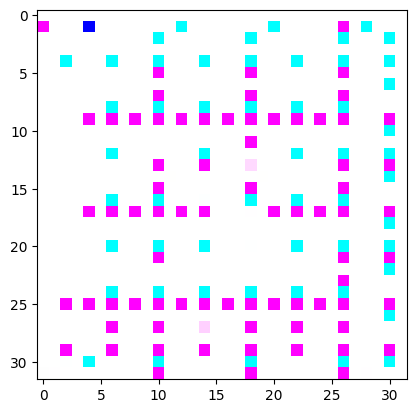

Epoch 935/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


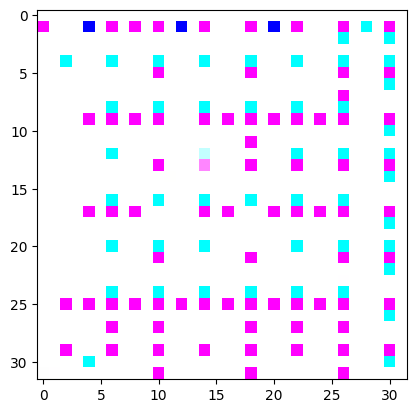

Epoch 936/1000


100%|██████████| 100/100 [00:18<00:00,  5.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


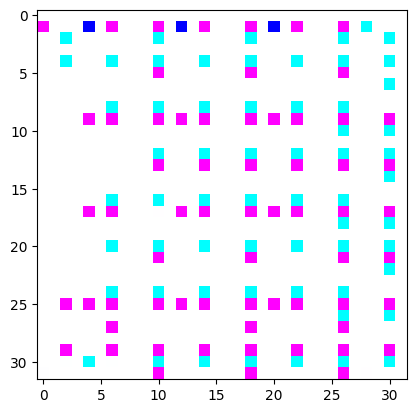

Epoch 937/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


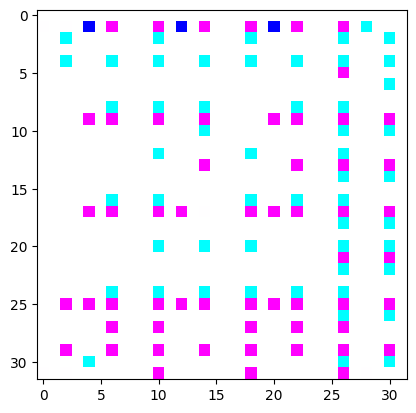

Epoch 938/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


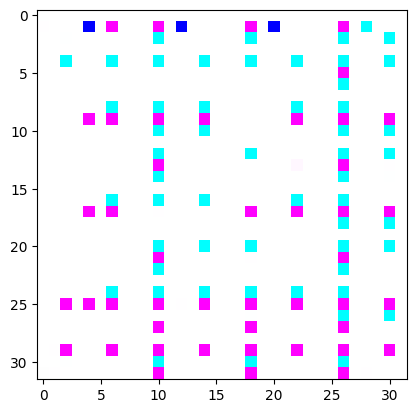

Epoch 939/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


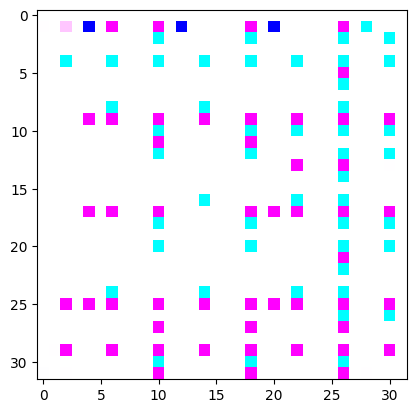

Epoch 940/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


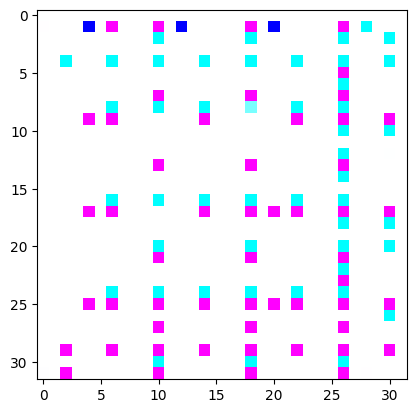

Epoch 941/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


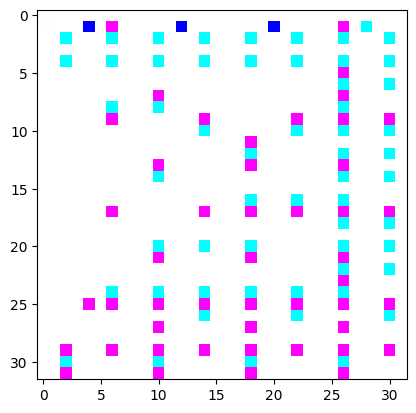

Epoch 942/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


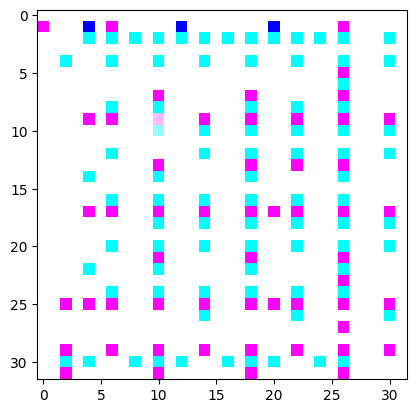

Epoch 943/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


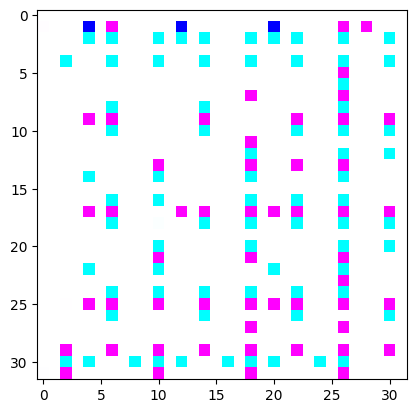

Epoch 944/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


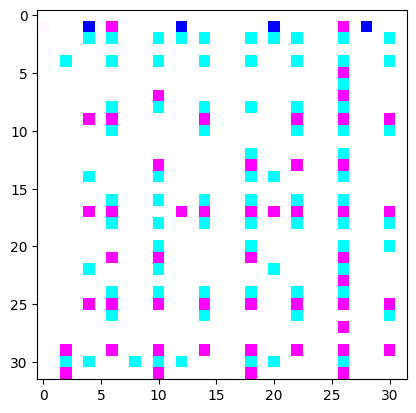

Epoch 945/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


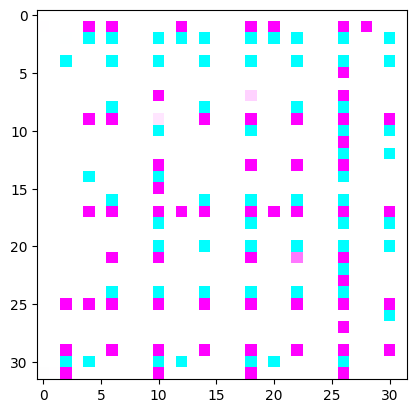

Epoch 946/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


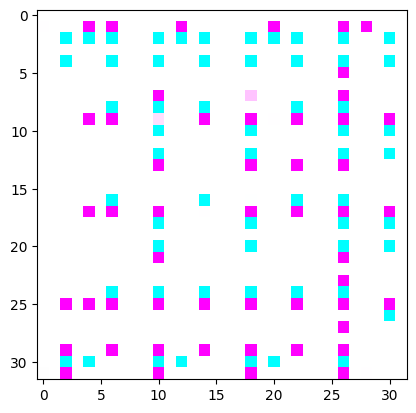

Epoch 947/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


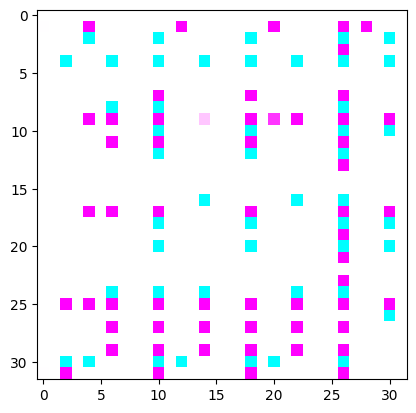

Epoch 948/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


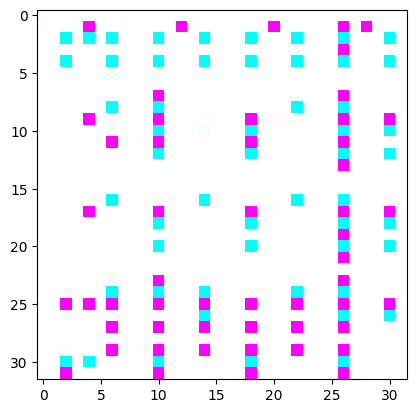

Epoch 949/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


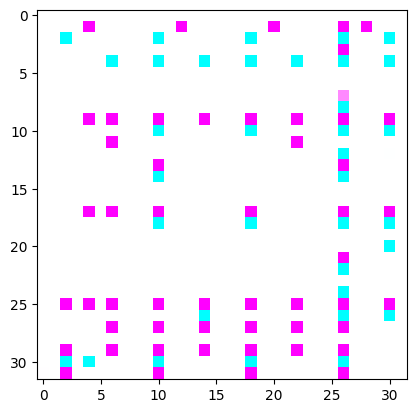

Epoch 950/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


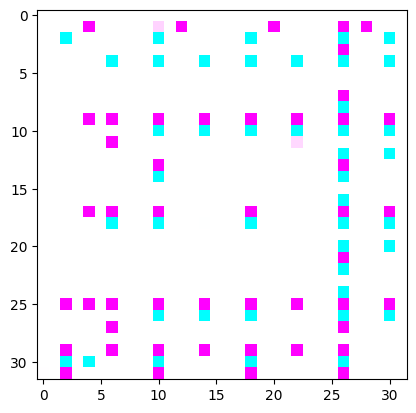

Epoch 951/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


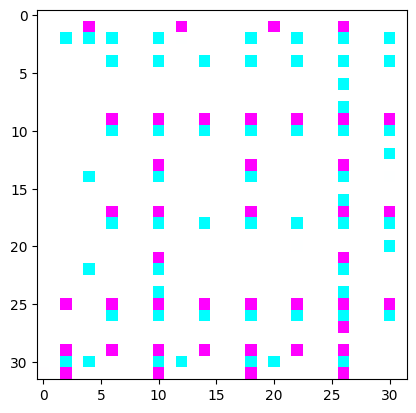

Epoch 952/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


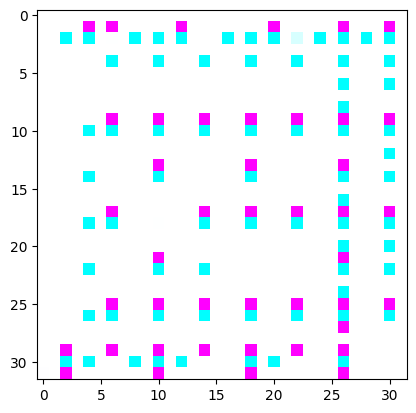

Epoch 953/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


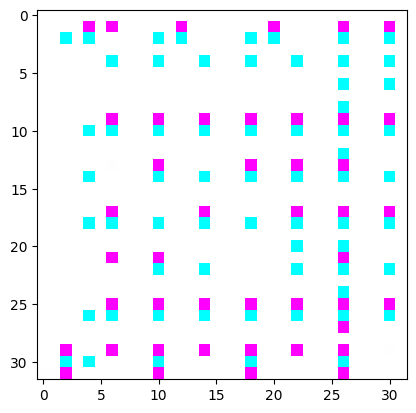

Epoch 954/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


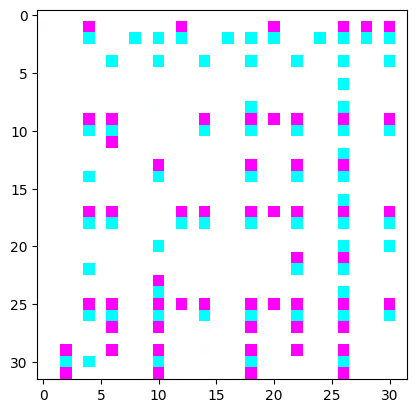

Epoch 955/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


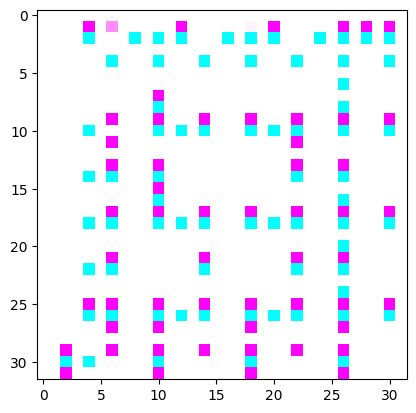

Epoch 956/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


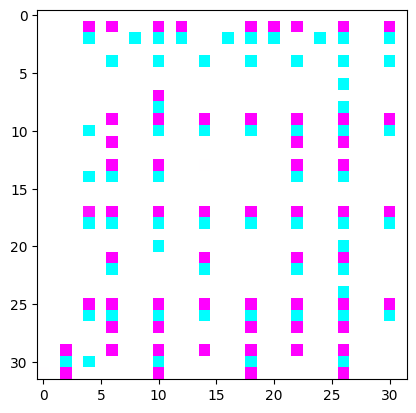

Epoch 957/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


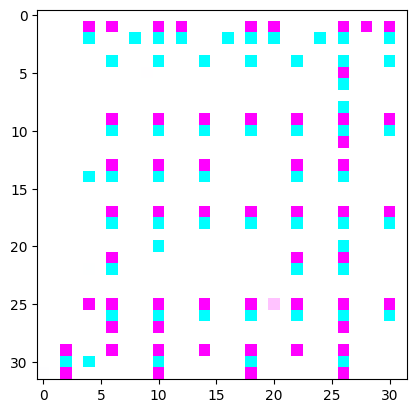

Epoch 958/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


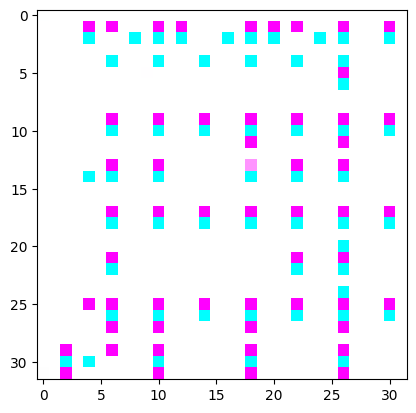

Epoch 959/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


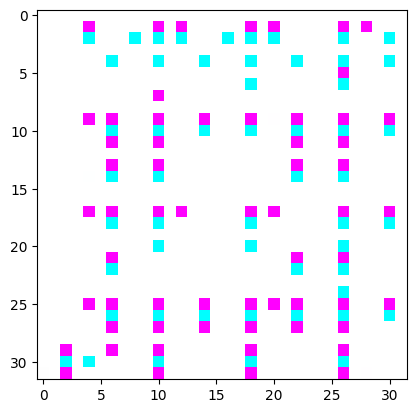

Epoch 960/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


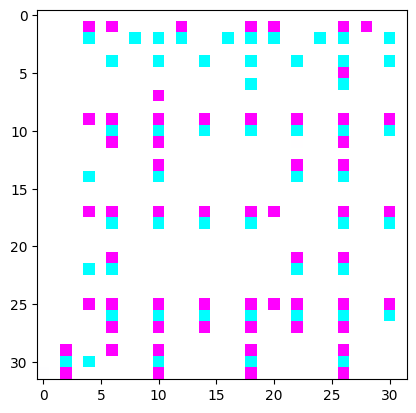

Epoch 961/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


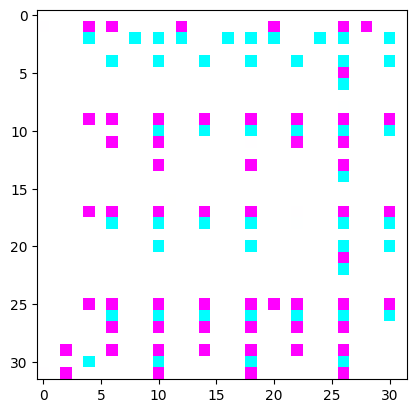

Epoch 962/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


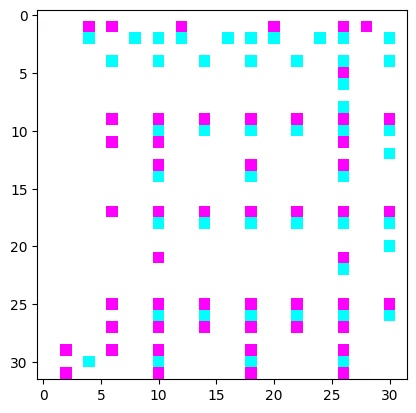

Epoch 963/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


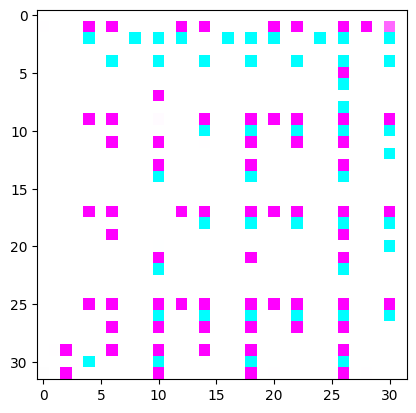

Epoch 964/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


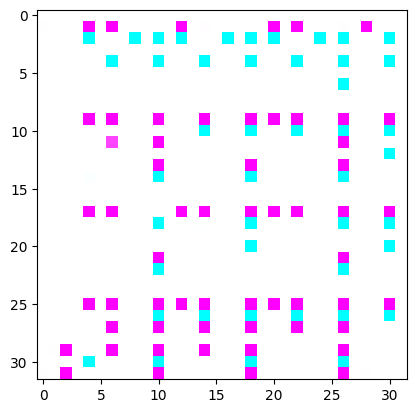

Epoch 965/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


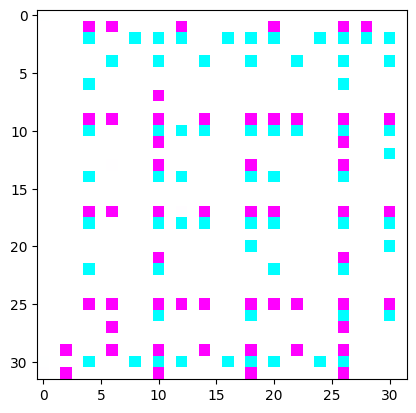

Epoch 966/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


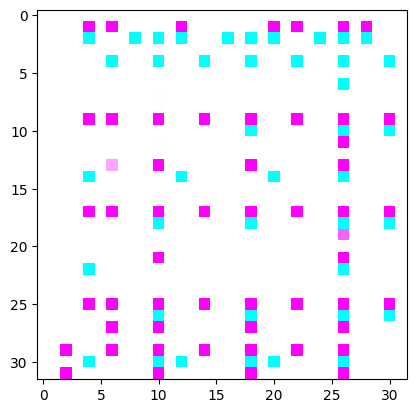

Epoch 967/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


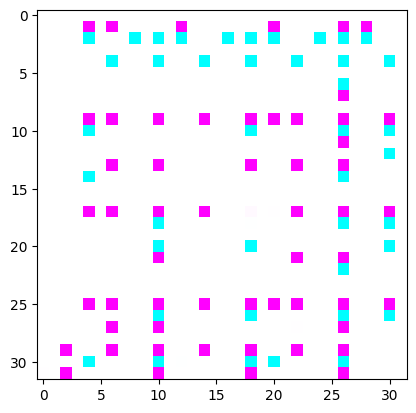

Epoch 968/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


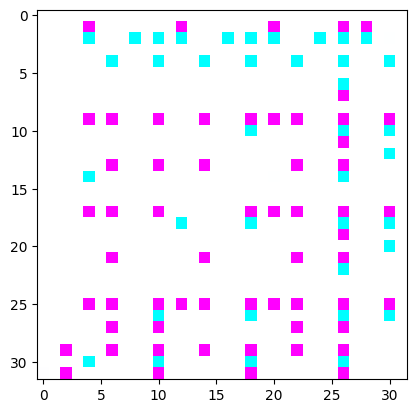

Epoch 969/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


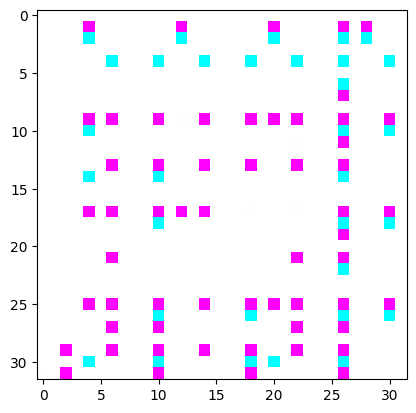

Epoch 970/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


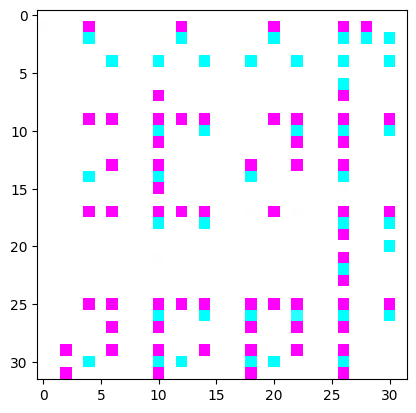

Epoch 971/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


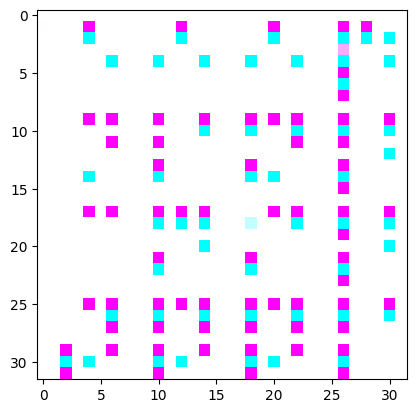

Epoch 972/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


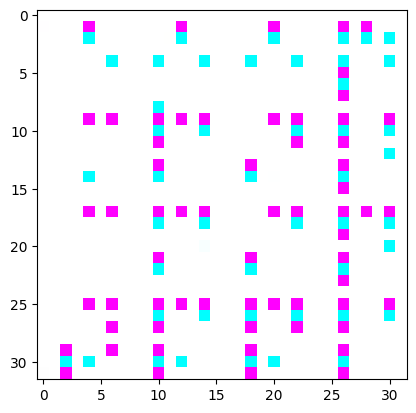

Epoch 973/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


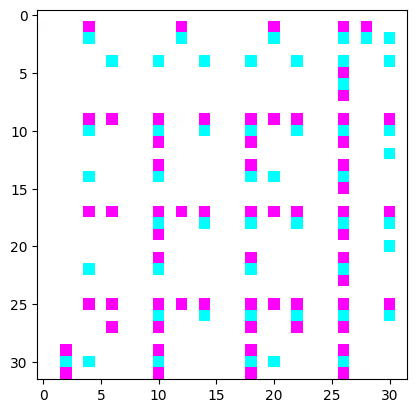

Epoch 974/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


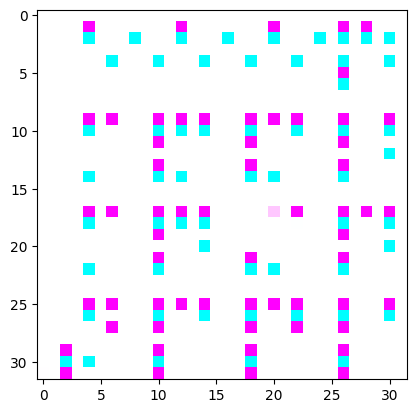

Epoch 975/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


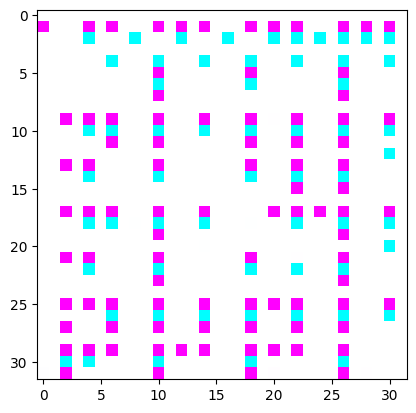

Epoch 976/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


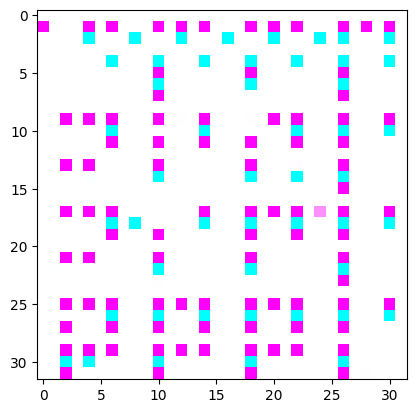

Epoch 977/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


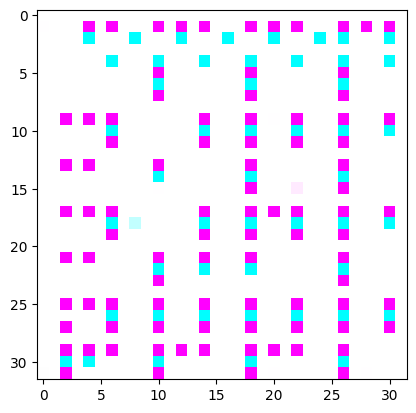

Epoch 978/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


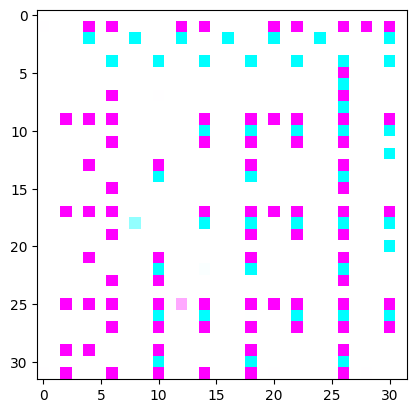

Epoch 979/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


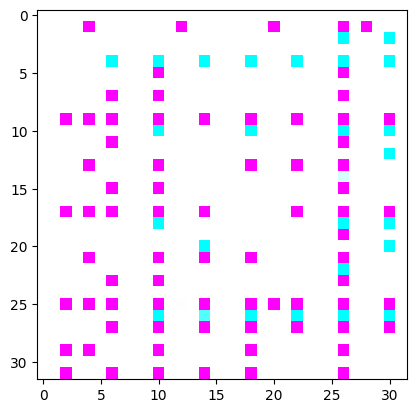

Epoch 980/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


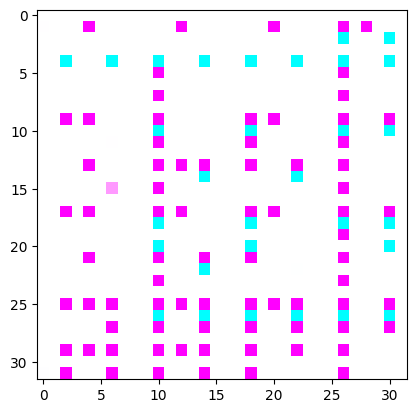

Epoch 981/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


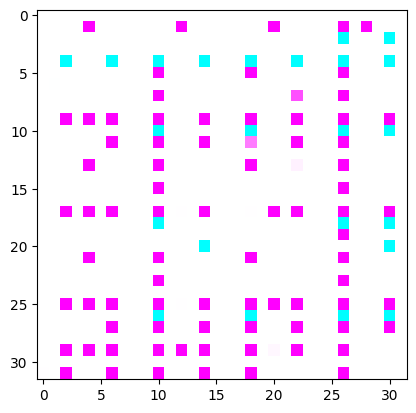

Epoch 982/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


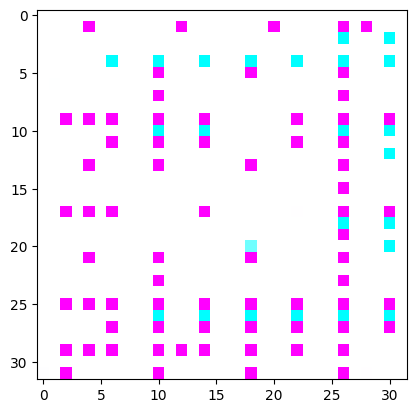

Epoch 983/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


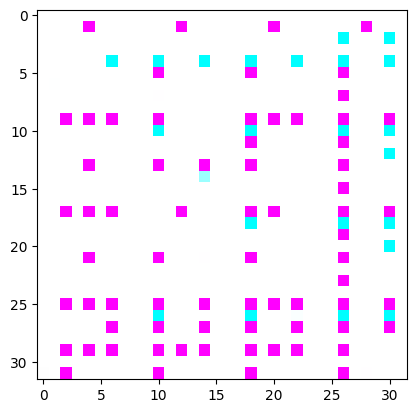

Epoch 984/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


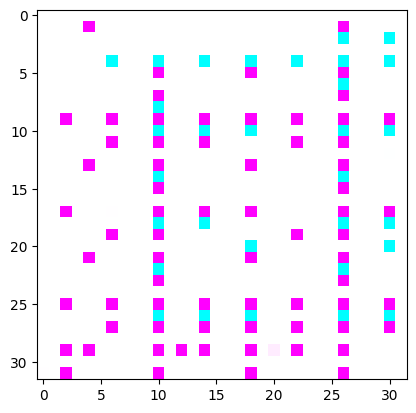

Epoch 985/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


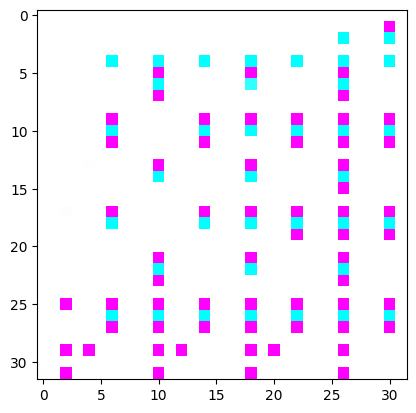

Epoch 986/1000


100%|██████████| 100/100 [00:18<00:00,  5.50it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


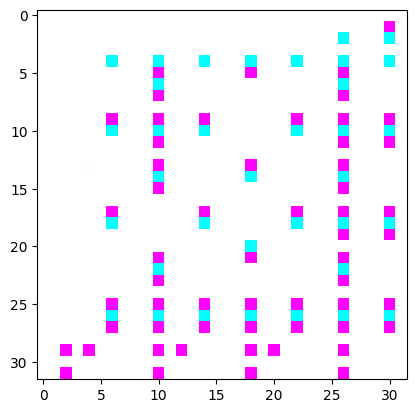

Epoch 987/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


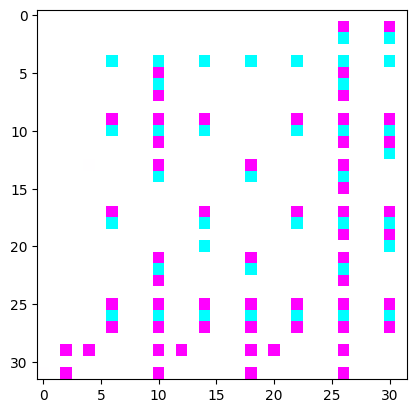

Epoch 988/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


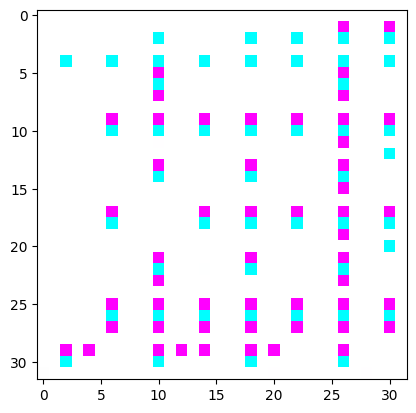

Epoch 989/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


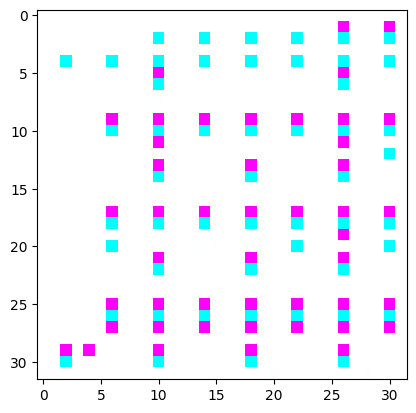

Epoch 990/1000


100%|██████████| 100/100 [00:18<00:00,  5.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


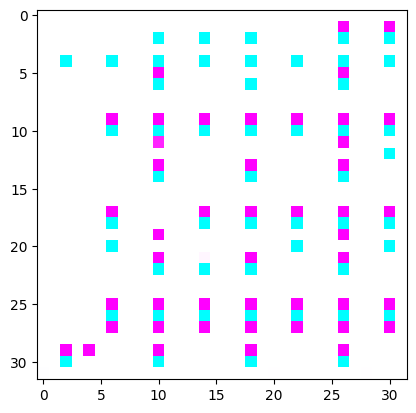

Epoch 991/1000


100%|██████████| 100/100 [00:18<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


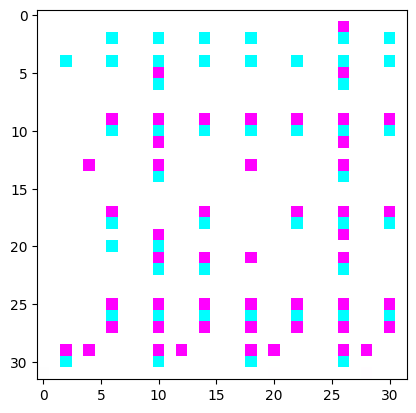

Epoch 992/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


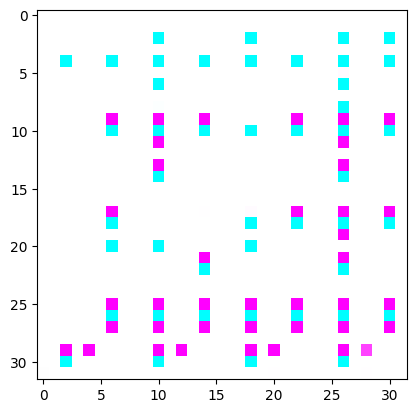

Epoch 993/1000


100%|██████████| 100/100 [00:18<00:00,  5.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


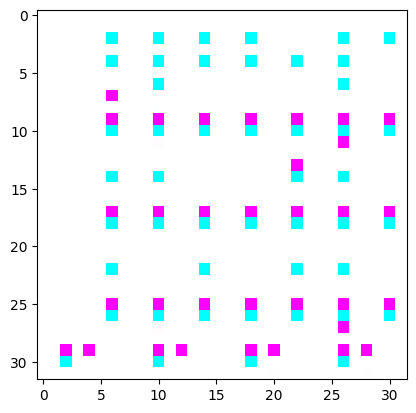

Epoch 994/1000


100%|██████████| 100/100 [00:18<00:00,  5.47it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


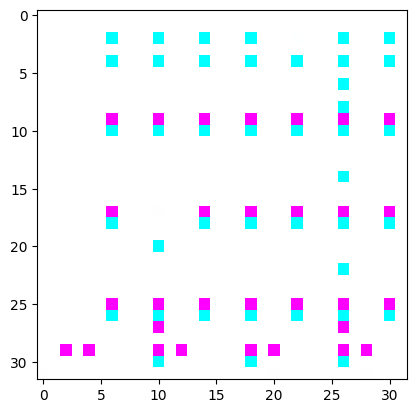

Epoch 995/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


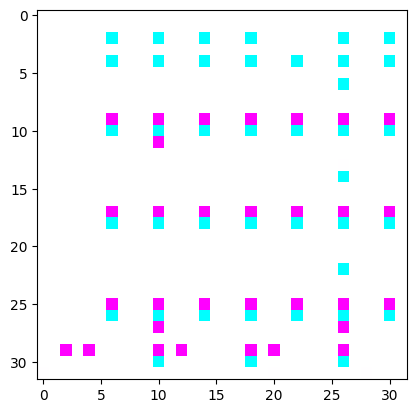

Epoch 996/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


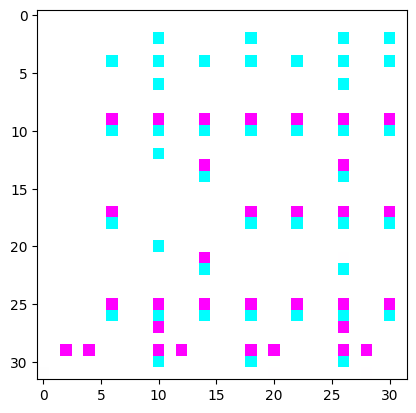

Epoch 997/1000


100%|██████████| 100/100 [00:18<00:00,  5.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


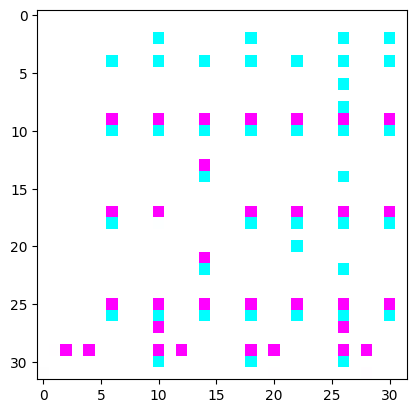

Epoch 998/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


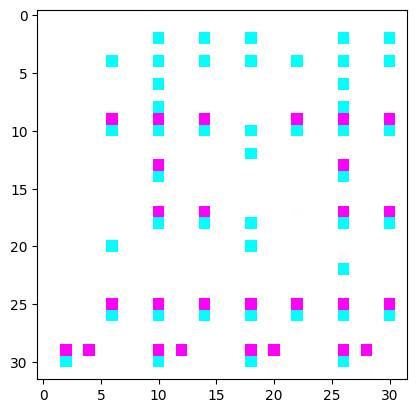

Epoch 999/1000


100%|██████████| 100/100 [00:18<00:00,  5.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


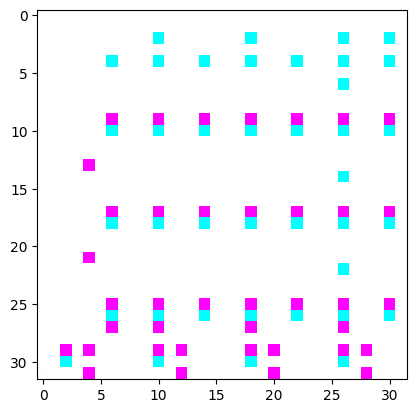

Epoch 1000/1000


100%|██████████| 100/100 [00:18<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


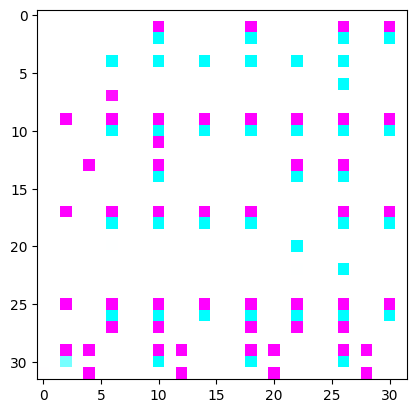

In [14]:
EPOCH = 1000

model = WGAN(Device='cuda:0')
for i in range(EPOCH):
    print(f"Epoch {i + 1}/{EPOCH}")
    model.train(train_loader)
    img = model.generate()
    plt.imshow(img)
    plt.show()